# CenterResnet Starter


I am very new to these concepts so I am trying out by changing this amazing and probably only 3D model related awesome public kernel by Ruslan
https://www.kaggle.com/hocop1/centernet-baseline

Most of the codes are loaned from there . There are other codes that I took from OFT implementation github . But I dont know what is OFT , so I have not yet implemented it . 

My current score is not from this kernel( as there are some errors in this kernel) , but from some simple architecture modification of the original public kernel. 


In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from sklearn.model_selection import train_test_split
from scipy.optimize import minimize
from tqdm.auto import tqdm as tq
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils

PATH = '../input/pku-autonomous-driving/'
os.listdir(PATH)

['car_models_json',
 'test_masks.zip',
 'test_images',
 'test_images.zip',
 'sample_submission.csv',
 'car_models',
 'train.csv',
 'camera.zip',
 'test_masks',
 'train_masks',
 'car_models_json.zip',
 'train_masks.zip',
 'train_images',
 'camera',
 'train_images.zip',
 'car_models.zip']

In [2]:
## Constants
SWITCH_LOSS_EPOCH = 5

# Load data

In [3]:
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


**ImageId** column contains names of images:

In [4]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_8a6e65317' + '.jpg')
IMG_SHAPE = img.shape

#plt.figure(figsize=(15,8))
#plt.imshow(img);

In [5]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [6]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


# Data distributions

In [7]:
lens = [len(str2coords(s)) for s in train['PredictionString']]

#plt.figure(figsize=(15,6))
#sns.countplot(lens);
#plt.xlabel('Number of cars in image');

In [8]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['x'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# # sns.distplot([str2coords(s)[0]['x'] for s in train['PredictionString']]);
# plt.xlabel('x')
# plt.show()

In [9]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['y'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# plt.xlabel('y')
# plt.show()

In [10]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['z'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# plt.xlabel('z')
# plt.show()

In [11]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['yaw'] for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('yaw')
# plt.show()

In [12]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['pitch'] for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('pitch')
# plt.show()

I guess, pitch and yaw are mixed up in this dataset. Pitch cannot be that big. That would mean that cars are upside down.

In [13]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[rotate(c['roll'], np.pi) for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('roll rotated by pi')
# plt.show()

# 2D Visualization

In [14]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image
        ys: y coordinates in the image
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

#plt.figure(figsize=(14,14))
#plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'))
#plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

One point is out of image!

Let's look at the distribution of all points. Image is here just for reference.

In [15]:
# xs, ys = [], []

# for ps in train['PredictionString']:
#     x, y = get_img_coords(ps)
#     xs += list(x)
#     ys += list(y)

# plt.figure(figsize=(18,18))
# plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'), alpha=0.3)
# plt.scatter(xs, ys, color='red', s=10, alpha=0.2);

Many points are outside!

Let's look at this distribution "from the sky"

In [16]:
# # Cars points
# xs, ys = [], []
# for ps in train['PredictionString']:
#     coords = str2coords(ps)
#     xs += [c['x'] for c in coords]
#     ys += [c['y'] for c in coords]

# # Road points
# road_width = 6
# road_xs = [-road_width, road_width, road_width, -road_width, -road_width]
# road_ys = [0, 0, 500, 500, 0]

# plt.figure(figsize=(16,16))
# plt.axes().set_aspect(1)
# # View road
# plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
# plt.plot([road_width/2,road_width/2], [0,500], alpha=0.4, linewidth=4, color='white', ls='--')
# plt.plot([-road_width/2,-road_width/2], [0,500], alpha=0.4, linewidth=4, color='white', ls='--')
# # View cars
# plt.scatter(xs, ys, color='red', s=20, alpha=0.2);

Some points are very far away

Scale up

In [17]:
# plt.figure(figsize=(16,16))
# plt.axes().set_aspect(1)
# plt.xlim(-50,50)
# plt.ylim(0,50)

# # View road
# plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
# plt.plot([road_width/2,road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# plt.plot([-road_width/2,-road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# # View cars
# plt.scatter(xs, ys, color='red', s=10, alpha=0.1);

# 3D Visualization
Used code from https://www.kaggle.com/zstusnoopy/visualize-the-location-and-3d-bounding-box-of-car, but made it one function

In [18]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

In [19]:
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

In [20]:
def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img

In [21]:
# n_rows = 6

# for idx in range(n_rows):
#     fig, axes = plt.subplots(1, 2, figsize=(20,20))
#     img = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
#     axes[0].imshow(img)
#     img_vis = visualize(img, str2coords(train['PredictionString'].iloc[idx]))
#     axes[1].imshow(img_vis)
#     plt.show()

# Image preprocessing

In [22]:
IMG_WIDTH = 2048
IMG_HEIGHT = IMG_WIDTH // 4
MODEL_SCALE = 8

def _regr_preprocess(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img):
    img = img[img.shape[0] //2 :]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 4]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 4) * IMG_WIDTH / (img.shape[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    return mask, regr

img.shape (512, 2048, 3) std: 0.28713036
mask.shape (64, 256) std: 0.017466618
regr.shape (64, 256, 7) std: 0.007385718


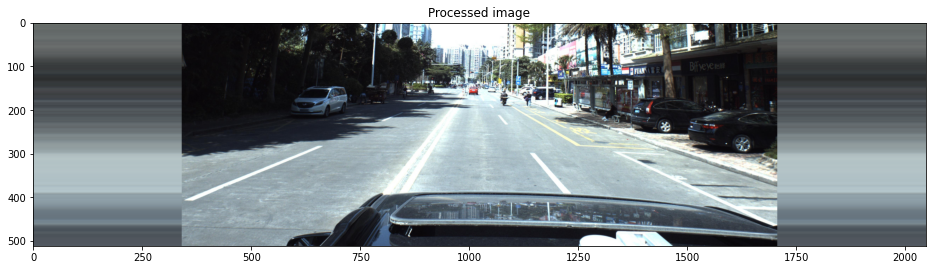

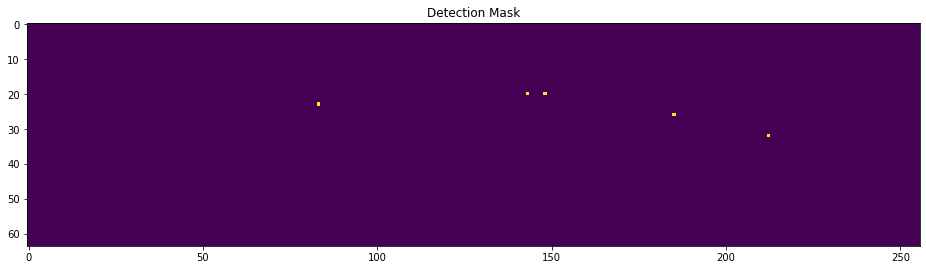

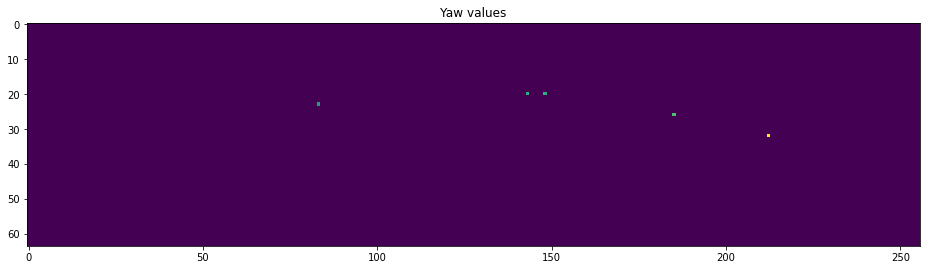

In [23]:
img0 = imread(PATH + 'train_images/' + train['ImageId'][0] + '.jpg')
img = preprocess_image(img0)

mask, regr = get_mask_and_regr(img0, train['PredictionString'][0])

print('img.shape', img.shape, 'std:', np.std(img))
print('mask.shape', mask.shape, 'std:', np.std(mask))
print('regr.shape', regr.shape, 'std:', np.std(regr))

plt.figure(figsize=(16,16))
plt.title('Processed image')
plt.imshow(img)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Detection Mask')
plt.imshow(mask)
plt.show()
plt.figure(figsize=(16,16))
plt.title('Yaw values')
plt.imshow(regr[:,:,-2])
plt.show()

# PyTorch Dataset

In [24]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=None):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Read image
        img0 = imread(img_name, True)
        img = preprocess_image(img0)
        img = np.rollaxis(img, 2, 0)
        
        # Get mask and regression maps
        if self.training:
            mask, regr = get_mask_and_regr(img0, labels)
            regr = np.rollaxis(regr, 2, 0)
        else:
            mask, regr = 0, 0
        
        return [img, mask, regr]

In [25]:
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir)
dev_dataset = CarDataset(df_dev, train_images_dir)
test_dataset = CarDataset(df_test, test_images_dir)

Show some generated examples

In [26]:
# img, mask, regr = train_dataset[0]

# plt.figure(figsize=(16,16))
# plt.imshow(np.rollaxis(img, 0, 3))
# plt.show()

# plt.figure(figsize=(16,16))
# plt.imshow(mask)
# plt.show()

# plt.figure(figsize=(16,16))
# plt.imshow(regr[-2])
# plt.show()

In [27]:
BATCH_SIZE = 8

# Create data generators - they will produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# PyTorch Model

In [28]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        #  would be a nice idea if the upsampling could be learned too,
        #  but my machine do not have enough memory to handle all those weights
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        
        # for padding issues, see 
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
        else:
            x = x1
        x = self.conv(x)
        return x

def get_mesh(batch_size, shape_x, shape_y):
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    return mesh

In [29]:
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo


model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
}


def conv3x3(in_planes, out_planes, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1):
        super(BasicBlock, self).__init__()

        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.GroupNorm(16, planes)

        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.GroupNorm(16, planes)

        if stride != 1 or inplanes != planes:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes, stride), nn.GroupNorm(16, planes))
        else:
            self.downsample = None


    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = self.bn2(self.conv2(out))

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out, inplace=True)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = conv1x1(inplanes, planes)
        self.bn1 = nn.GroupNorm(16, planes)
        self.conv2 = conv3x3(planes, planes, stride)
        self.bn2 = nn.GroupNorm(16, planes)
        self.conv3 = conv1x1(planes, planes * self.expansion)
        self.bn3 = nn.GroupNorm(16, planes * self.expansion)

        if stride != 1 or inplanes != planes * self.expansion:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes * self.expansion, stride), 
                nn.GroupNorm(16, planes * self.expansion))
        else:
            self.downsample = None

    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = F.relu(self.bn2(self.conv2(out)), inplace=True)
        out = self.bn3(self.conv3(out))
 
        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out)

        return out


class ResNetFeatures(nn.Module):

    def __init__(self, block, layers, num_classes=1000, zero_init_residual=False):
        super(ResNetFeatures, self).__init__()
        self.inplanes = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.GroupNorm(16, 64)

        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)


        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1):

        layers = []
        layers.append(block(self.inplanes, planes, stride))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)


    def forward(self, x):
        conv1 = F.relu(self.bn1(self.conv1(x)), inplace=True)
        conv1 = F.max_pool2d(conv1, 3, stride=2, padding=1)

        feats4 = self.layer1(conv1)
        feats8 = self.layer2(feats4)
        feats16 = self.layer3(feats8)
        feats32 = self.layer4(feats16)

        return feats8, feats16, feats32



def resnet18(pretrained=False, **kwargs):
    """Constructs a ResNet-18 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [2, 2, 2, 2], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet18']))
    return model



def resnet34(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 6, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model


def _load_pretrained(model, pretrained):
    model_dict = model.state_dict()
    pretrained = {k : v for k, v in pretrained.items() if k in model_dict}
    model_dict.update(pretrained)
    model.load_state_dict(model_dict)

In [30]:
class CentResnet(nn.Module):
    '''Mixture of previous classes'''
    def __init__(self, n_classes):
        super(CentResnet, self).__init__()
        self.base_model = resnet18(pretrained=False)
        
        # Lateral layers convert resnet outputs to a common feature size
        self.lat8 = nn.Conv2d(128, 256, 1)
        self.lat16 = nn.Conv2d(256, 256, 1)
        self.lat32 = nn.Conv2d(512, 256, 1)
        self.bn8 = nn.GroupNorm(16, 256)
        self.bn16 = nn.GroupNorm(16, 256)
        self.bn32 = nn.GroupNorm(16, 256)

       
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 , 512) #+ 1024
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)
        
    
    def forward(self, x):
        batch_size = x.shape[0]
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        x0 = torch.cat([x, mesh1], 1)
        x1 = self.mp(self.conv0(x0))
        x2 = self.mp(self.conv1(x1))
        x3 = self.mp(self.conv2(x2))
        x4 = self.mp(self.conv3(x3))
        
        #feats = self.base_model.extract_features(x)
                # Run frontend network
        feats8, feats16, feats32 = self.base_model(x)
        lat8 = F.relu(self.bn8(self.lat8(feats8)))
        lat16 = F.relu(self.bn16(self.lat16(feats16)))
        lat32 = F.relu(self.bn32(self.lat32(feats32)))
        
        # Add positional info
        mesh2 = get_mesh(batch_size, lat32.shape[2], lat32.shape[3])
        feats = torch.cat([lat32, mesh2], 1)
        #print(feats.shape)
        #print (x4.shape)
        x = self.up1(feats, x4)
        x = self.up2(x, x3)
        x = self.outc(x)
        return x

In [31]:
from dlav0 import get_pose_net as get_dlav0

In [32]:
_model_factory = {
  #'res': get_pose_net, # default Resnet with deconv
  'dlav0': get_dlav0, # default DLAup
  #'dla': get_dla_dcn,
  #'resdcn': get_pose_net_dcn,
  #'hourglass': get_large_hourglass_net,
}

In [33]:
def create_model(arch, heads, head_conv):
    num_layers = int(arch[arch.find('_') + 1:]) if '_' in arch else 0
    arch = arch[:arch.find('_')] if '_' in arch else arch
    arch = 'dlav0'
    get_model = _model_factory[arch]
    model = get_model(num_layers=num_layers, heads=heads, head_conv=head_conv)
    return model

In [34]:
model = create_model('dla_34', {'hm': 1, 'reg' : 7} , 256)#{'hm': 3, 'dep': 1, 'rot': 8, 'dim': 3, 'wh': 2, 'reg': 2},256)

In [35]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 12 #6

#model = CentResnet(8).to(device)
model.cuda()
#optimizer = optim.AdamW(model.parameters(), lr=0.001)
#optimizer =  RAdam(model.parameters(), lr = 0.001)
optimizer =  optim.Adam(model.parameters(), lr = 0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda


In [36]:
img_batch = torch.randn((1,3,512,2048))

In [37]:
#test = model(img_batch.to(device))

In [38]:
# model.load_state_dict(torch.load('./modelGaussian.pth'))
# model.eval();

In [39]:
def gaussian_radius(det_size, min_overlap=0.7):
    height, width = det_size

    a1  = 1
    b1  = (height + width)
    c1  = width * height * (1 - min_overlap) / (1 + min_overlap)
    sq1 = np.sqrt(b1 ** 2 - 4 * a1 * c1)
    r1  = (b1 + sq1) / 2

    a2  = 4
    b2  = 2 * (height + width)
    c2  = (1 - min_overlap) * width * height
    sq2 = np.sqrt(b2 ** 2 - 4 * a2 * c2)
    r2  = (b2 + sq2) / 2

    a3  = 4 * min_overlap
    b3  = -2 * min_overlap * (height + width)
    c3  = (min_overlap - 1) * width * height
    sq3 = np.sqrt(b3 ** 2 - 4 * a3 * c3)
    r3  = (b3 + sq3) / 2
    return min(r1, r2, r3)
def gaussian2D(shape, sigma=1):
    m, n = [(ss - 1.) / 2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]

    h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    h[h < np.finfo(h.dtype).eps * h.max()] = 0
    return h
def draw_msra_gaussian(heatmap, center, sigma):
    tmp_size = sigma * 3
    mu_x = int(center[0] + 0.5)
    mu_y = int(center[1] + 0.5)
    w, h = heatmap.shape[0], heatmap.shape[1]
    ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
    br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]
    if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
        return heatmap
    size = 2 * tmp_size + 1
    x = np.arange(0, size, 1, np.float32)
    y = x[:, np.newaxis]
    
    x0 = y0 = size // 2
    g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2))
    g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
    g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
    img_x = max(0, ul[0]), min(br[0], h)
    img_y = max(0, ul[1]), min(br[1], w)
    
    
    heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
        heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
        g[g_y[0]:g_y[1], g_x[0]:g_x[1]])
    return heatmap


def gaussian_mask(mask):
    xlist, ylist = np.where(mask == 1)
    masklist = [(i,j) for i, j in zip(xlist, ylist)]
    hm = np.zeros(mask.shape) 

    for (y,x) in masklist:
        bbox = np.array([x-0.1, y-0.1, x+0.1, y+0.1])
        h, w = bbox[3] - bbox[1], bbox[2] - bbox[0]
        radius = gaussian_radius((h, w))    
        ct = np.array([(bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2], dtype=np.float32)
        ct_int = ct.astype(np.int32)
        hm[int(bbox[1]): int(bbox[3]), int(bbox[0]): int(bbox[2])] = 0.9999    
        gm =+ draw_msra_gaussian(hm, ct, 0.7) # np.exp((y-5)/200)

    #plt.figure(figsize=(16,16))
    #plt.imshow(gm, vmin=0, vmax=1)
    #plt.show()
    
    return gm

from tqdm import tqdm
def apply_gaussian(dataset):
    for i in tqdm(range(len(dataset))):
        dataset[i][1] = gaussian_mask(dataset[i][1])    
    return dataset

In [33]:
#train_dataset = apply_gaussian(train_dataset)

# Training

In [34]:
def criterion(prediction, mask, regr,weight=0.1, size_average=True): # 0.4
    # Binary mask loss
    #print(prediction.shape)
    #print(prediction[0]['hm'].shape)
    prediction = prediction[0]['hm']
    pred_mask = torch.sigmoid(prediction[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)
    
    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    mask_loss = -mask_loss.mean(0).sum()
    
    # Regression L1 loss
    pred_regr = prediction[:, 1:]
    #regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    regr_loss = (torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2)).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    # smooth l1 - torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2))
    regr_loss = regr_loss.mean(0)
  
    # Sum
    loss = weight*mask_loss +(1-weight)* regr_loss
    if not size_average:
        loss *= prediction.shape[0]
    return loss ,mask_loss , regr_loss

In [40]:
def train(epoch, history=None):
    model.train()
    t = tqdm(train_loader)
    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(t):
        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        regr_batch = regr_batch.to(device)
        
        optimizer.zero_grad()
        output = model(img_batch)
        
        if epoch < SWITCH_LOSS_EPOCH :
            loss, mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,1)
        else:
            loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5)  
        
        t.set_description(f'train_loss (l={loss:.3f})(m={mask_loss:.2f}) (r={regr_loss:.4f}')
        
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()

    
    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}\tMaskLoss: {:.6f}\tRegLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data,
        mask_loss.data,
        regr_loss.data))

def evaluate(epoch, history=None):
    model.eval()
    loss = 0
    valid_loss = 0
    valid_mask_loss = 0
    valid_regr_loss = 0
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            regr_batch = regr_batch.to(device)

            output = model(img_batch)

            if epoch < SWITCH_LOSS_EPOCH :
                loss,mask_loss, regr_loss= criterion(output, mask_batch, regr_batch,1, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data
            else :
                loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data 

    
    valid_loss /= len(dev_loader.dataset)
    valid_mask_loss /= len(dev_loader.dataset)
    valid_regr_loss /= len(dev_loader.dataset)
    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = valid_loss.cpu().numpy()
        history.loc[epoch, 'mask_loss'] = valid_mask_loss.cpu().numpy()
        history.loc[epoch, 'regr_loss'] = valid_regr_loss.cpu().numpy()

    
    print('Dev loss: {:.4f}'.format(valid_loss))

In [237]:
# torch.Size([2, 64, 256])
# torch.Size([2, 128, 512])

In [241]:
# %%time
# import gc

# for weight in [0.05, 0.1, 0.2]:

#     history = pd.DataFrame()

#     def criterion(prediction, mask, regr, weight=weight, size_average=True):
#         # Binary mask loss
#         pred_mask = prediction[0]['hm']


#         pred_mask = torch.sigmoid(pred_mask[:, 0])
#     #     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)

#         mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
#         mask_loss = -mask_loss.mean(0).sum()

#         # Regression L1 loss
#         #pred_regr = prediction[:, 1:]
#         pred_regr = prediction[0]['reg']
#         #regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1


#         regr_loss = (torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2)).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
#         # smooth l1 - torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2))
#         regr_loss = regr_loss.mean(0)

#         # Sum
#         loss = weight*mask_loss +(1-weight)* regr_loss
#         #if not size_average:
#         #    loss *= prediction.shape[0]
#         return loss ,mask_loss , regr_loss


#     for epoch in range(n_epochs):
#         torch.cuda.empty_cache()
#         gc.collect()
#         train(epoch, history)
#         evaluate(epoch, history)
    
#     torch.save(model.state_dict(), './model-dla'+'_'+str(weight)+'.pth')








  0%|          | 0/528 [00:00<?, ?it/s]






train_loss (l=70.279)(m=70.28) (r=1.3127:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=70.279)(m=70.28) (r=1.3127:   0%|          | 1/528 [00:03<28:23,  3.23s/it]






train_loss (l=91.728)(m=91.73) (r=1.4539:   0%|          | 1/528 [00:03<28:23,  3.23s/it]






train_loss (l=91.728)(m=91.73) (r=1.4539:   0%|          | 2/528 [00:03<21:40,  2.47s/it]






train_loss (l=62.994)(m=62.99) (r=1.3584:   0%|          | 2/528 [00:04<21:40,  2.47s/it]






train_loss (l=62.994)(m=62.99) (r=1.3584:   1%|          | 3/528 [00:04<17:08,  1.96s/it]






train_loss (l=77.815)(m=77.81) (r=1.3983:   1%|          | 3/528 [00:05<17:08,  1.96s/it]






train_loss (l=77.815)(m=77.81) (r=1.3983:   1%|          | 4/528 [00:05<13:53,  1.59s/it]






train_loss (l=54.736)(m=54.74) (r=1.3271:   1%|          | 4/528 [00:05<13:53,  1.59s/it]






train_loss (l=54.736)(m=54.74) (r=1.3271:   1%|          | 5/528 [00:06<11:40,  1.34s/it]



train_loss (l=70.970)(m=70.97) (r=1.3338:   7%|▋         | 35/528 [00:27<05:54,  1.39it/s]






train_loss (l=60.559)(m=60.56) (r=1.3754:   7%|▋         | 35/528 [00:28<05:54,  1.39it/s]






train_loss (l=60.559)(m=60.56) (r=1.3754:   7%|▋         | 36/528 [00:28<05:52,  1.39it/s]






train_loss (l=79.214)(m=79.21) (r=1.3210:   7%|▋         | 36/528 [00:28<05:52,  1.39it/s]






train_loss (l=79.214)(m=79.21) (r=1.3210:   7%|▋         | 37/528 [00:29<05:51,  1.40it/s]






train_loss (l=50.611)(m=50.61) (r=1.3890:   7%|▋         | 37/528 [00:29<05:51,  1.40it/s]






train_loss (l=50.611)(m=50.61) (r=1.3890:   7%|▋         | 38/528 [00:29<05:50,  1.40it/s]






train_loss (l=59.281)(m=59.28) (r=1.4538:   7%|▋         | 38/528 [00:30<05:50,  1.40it/s]






train_loss (l=59.281)(m=59.28) (r=1.4538:   7%|▋         | 39/528 [00:30<05:49,  1.40it/s]






train_loss (l=67.508)(m=67.51) (r=1.3991:   7%|▋         | 39/528 [00:30<05:49,  1.40it/s]






train_loss (l=67.508)(m=67.51)

train_loss (l=94.446)(m=94.45) (r=1.5158:  13%|█▎        | 69/528 [00:52<05:28,  1.40it/s]






train_loss (l=94.446)(m=94.45) (r=1.5158:  13%|█▎        | 70/528 [00:52<05:27,  1.40it/s]






train_loss (l=73.071)(m=73.07) (r=1.2927:  13%|█▎        | 70/528 [00:53<05:27,  1.40it/s]






train_loss (l=73.071)(m=73.07) (r=1.2927:  13%|█▎        | 71/528 [00:53<05:27,  1.39it/s]






train_loss (l=53.086)(m=53.09) (r=1.3815:  13%|█▎        | 71/528 [00:53<05:27,  1.39it/s]






train_loss (l=53.086)(m=53.09) (r=1.3815:  14%|█▎        | 72/528 [00:54<05:26,  1.40it/s]






train_loss (l=47.066)(m=47.07) (r=1.3639:  14%|█▎        | 72/528 [00:54<05:26,  1.40it/s]






train_loss (l=47.066)(m=47.07) (r=1.3639:  14%|█▍        | 73/528 [00:54<05:25,  1.40it/s]






train_loss (l=58.501)(m=58.50) (r=1.5027:  14%|█▍        | 73/528 [00:55<05:25,  1.40it/s]






train_loss (l=58.501)(m=58.50) (r=1.5027:  14%|█▍        | 74/528 [00:55<05:24,  1.40it/s]






train_loss (l=45.637)(m=45.64)

train_loss (l=86.293)(m=86.29) (r=1.3764:  20%|█▉        | 104/528 [01:17<05:04,  1.39it/s]






train_loss (l=43.103)(m=43.10) (r=1.3281:  20%|█▉        | 104/528 [01:17<05:04,  1.39it/s]






train_loss (l=43.103)(m=43.10) (r=1.3281:  20%|█▉        | 105/528 [01:17<05:03,  1.40it/s]






train_loss (l=76.162)(m=76.16) (r=1.4028:  20%|█▉        | 105/528 [01:18<05:03,  1.40it/s]






train_loss (l=76.162)(m=76.16) (r=1.4028:  20%|██        | 106/528 [01:18<05:02,  1.40it/s]






train_loss (l=58.225)(m=58.22) (r=1.4240:  20%|██        | 106/528 [01:18<05:02,  1.40it/s]






train_loss (l=58.225)(m=58.22) (r=1.4240:  20%|██        | 107/528 [01:19<05:01,  1.40it/s]






train_loss (l=47.989)(m=47.99) (r=1.4397:  20%|██        | 107/528 [01:19<05:01,  1.40it/s]






train_loss (l=47.989)(m=47.99) (r=1.4397:  20%|██        | 108/528 [01:19<05:00,  1.40it/s]






train_loss (l=70.431)(m=70.43) (r=1.3000:  20%|██        | 108/528 [01:20<05:00,  1.40it/s]






train_loss (l=70.431

train_loss (l=56.717)(m=56.72) (r=1.4214:  26%|██▌       | 138/528 [01:41<04:42,  1.38it/s]






train_loss (l=59.018)(m=59.02) (r=1.4867:  26%|██▌       | 138/528 [01:41<04:42,  1.38it/s]






train_loss (l=59.018)(m=59.02) (r=1.4867:  26%|██▋       | 139/528 [01:42<04:39,  1.39it/s]






train_loss (l=57.855)(m=57.86) (r=1.4137:  26%|██▋       | 139/528 [01:42<04:39,  1.39it/s]






train_loss (l=57.855)(m=57.86) (r=1.4137:  27%|██▋       | 140/528 [01:42<04:39,  1.39it/s]






train_loss (l=45.667)(m=45.67) (r=1.4306:  27%|██▋       | 140/528 [01:43<04:39,  1.39it/s]






train_loss (l=45.667)(m=45.67) (r=1.4306:  27%|██▋       | 141/528 [01:43<04:39,  1.39it/s]






train_loss (l=49.872)(m=49.87) (r=1.3532:  27%|██▋       | 141/528 [01:44<04:39,  1.39it/s]






train_loss (l=49.872)(m=49.87) (r=1.3532:  27%|██▋       | 142/528 [01:44<04:38,  1.39it/s]






train_loss (l=58.004)(m=58.00) (r=1.4554:  27%|██▋       | 142/528 [01:44<04:38,  1.39it/s]






train_loss (l=58.004

train_loss (l=46.715)(m=46.71) (r=1.2752:  33%|███▎      | 172/528 [02:05<04:16,  1.39it/s]






train_loss (l=53.831)(m=53.83) (r=1.4875:  33%|███▎      | 172/528 [02:06<04:16,  1.39it/s]






train_loss (l=53.831)(m=53.83) (r=1.4875:  33%|███▎      | 173/528 [02:06<04:16,  1.39it/s]






train_loss (l=37.426)(m=37.43) (r=1.3380:  33%|███▎      | 173/528 [02:07<04:16,  1.39it/s]






train_loss (l=37.426)(m=37.43) (r=1.3380:  33%|███▎      | 174/528 [02:07<04:15,  1.39it/s]






train_loss (l=48.765)(m=48.76) (r=1.5397:  33%|███▎      | 174/528 [02:07<04:15,  1.39it/s]






train_loss (l=48.765)(m=48.76) (r=1.5397:  33%|███▎      | 175/528 [02:08<04:15,  1.38it/s]






train_loss (l=68.452)(m=68.45) (r=1.4596:  33%|███▎      | 175/528 [02:08<04:15,  1.38it/s]






train_loss (l=68.452)(m=68.45) (r=1.4596:  33%|███▎      | 176/528 [02:08<04:13,  1.39it/s]






train_loss (l=48.475)(m=48.47) (r=1.4395:  33%|███▎      | 176/528 [02:09<04:13,  1.39it/s]






train_loss (l=48.475

train_loss (l=42.661)(m=42.66) (r=1.5362:  39%|███▉      | 206/528 [02:30<03:51,  1.39it/s]






train_loss (l=68.753)(m=68.75) (r=1.4373:  39%|███▉      | 206/528 [02:30<03:51,  1.39it/s]






train_loss (l=68.753)(m=68.75) (r=1.4373:  39%|███▉      | 207/528 [02:31<03:50,  1.39it/s]






train_loss (l=53.935)(m=53.93) (r=1.3400:  39%|███▉      | 207/528 [02:31<03:50,  1.39it/s]






train_loss (l=53.935)(m=53.93) (r=1.3400:  39%|███▉      | 208/528 [02:31<03:49,  1.39it/s]






train_loss (l=68.211)(m=68.21) (r=1.4000:  39%|███▉      | 208/528 [02:32<03:49,  1.39it/s]






train_loss (l=68.211)(m=68.21) (r=1.4000:  40%|███▉      | 209/528 [02:32<03:48,  1.40it/s]






train_loss (l=52.185)(m=52.19) (r=1.3489:  40%|███▉      | 209/528 [02:32<03:48,  1.40it/s]






train_loss (l=52.185)(m=52.19) (r=1.3489:  40%|███▉      | 210/528 [02:33<03:48,  1.39it/s]






train_loss (l=37.389)(m=37.39) (r=1.4288:  40%|███▉      | 210/528 [02:33<03:48,  1.39it/s]






train_loss (l=37.389

train_loss (l=44.063)(m=44.06) (r=1.5356:  45%|████▌     | 240/528 [02:54<03:26,  1.39it/s]






train_loss (l=36.944)(m=36.94) (r=1.5124:  45%|████▌     | 240/528 [02:55<03:26,  1.39it/s]






train_loss (l=36.944)(m=36.94) (r=1.5124:  46%|████▌     | 241/528 [02:55<03:26,  1.39it/s]






train_loss (l=71.669)(m=71.67) (r=1.3598:  46%|████▌     | 241/528 [02:55<03:26,  1.39it/s]






train_loss (l=71.669)(m=71.67) (r=1.3598:  46%|████▌     | 242/528 [02:56<03:25,  1.39it/s]






train_loss (l=62.160)(m=62.16) (r=1.3684:  46%|████▌     | 242/528 [02:56<03:25,  1.39it/s]






train_loss (l=62.160)(m=62.16) (r=1.3684:  46%|████▌     | 243/528 [02:57<03:24,  1.39it/s]






train_loss (l=58.084)(m=58.08) (r=2.0585:  46%|████▌     | 243/528 [02:57<03:24,  1.39it/s]






train_loss (l=58.084)(m=58.08) (r=2.0585:  46%|████▌     | 244/528 [02:57<03:23,  1.40it/s]






train_loss (l=48.848)(m=48.85) (r=1.4997:  46%|████▌     | 244/528 [02:58<03:23,  1.40it/s]






train_loss (l=48.848

train_loss (l=50.511)(m=50.51) (r=1.4000:  52%|█████▏    | 274/528 [03:19<03:02,  1.39it/s]






train_loss (l=45.006)(m=45.01) (r=1.3344:  52%|█████▏    | 274/528 [03:19<03:02,  1.39it/s]






train_loss (l=45.006)(m=45.01) (r=1.3344:  52%|█████▏    | 275/528 [03:20<03:02,  1.39it/s]






train_loss (l=48.974)(m=48.97) (r=1.4765:  52%|█████▏    | 275/528 [03:20<03:02,  1.39it/s]






train_loss (l=48.974)(m=48.97) (r=1.4765:  52%|█████▏    | 276/528 [03:20<03:02,  1.38it/s]






train_loss (l=36.983)(m=36.98) (r=1.4569:  52%|█████▏    | 276/528 [03:21<03:02,  1.38it/s]






train_loss (l=36.983)(m=36.98) (r=1.4569:  52%|█████▏    | 277/528 [03:21<03:02,  1.38it/s]






train_loss (l=62.382)(m=62.38) (r=1.4423:  52%|█████▏    | 277/528 [03:21<03:02,  1.38it/s]






train_loss (l=62.382)(m=62.38) (r=1.4423:  53%|█████▎    | 278/528 [03:22<03:01,  1.38it/s]






train_loss (l=36.513)(m=36.51) (r=1.4508:  53%|█████▎    | 278/528 [03:22<03:01,  1.38it/s]






train_loss (l=36.513

train_loss (l=49.865)(m=49.87) (r=1.4712:  58%|█████▊    | 308/528 [03:43<02:38,  1.39it/s]






train_loss (l=54.914)(m=54.91) (r=1.3492:  58%|█████▊    | 308/528 [03:44<02:38,  1.39it/s]






train_loss (l=54.914)(m=54.91) (r=1.3492:  59%|█████▊    | 309/528 [03:44<02:37,  1.39it/s]






train_loss (l=46.109)(m=46.11) (r=1.3546:  59%|█████▊    | 309/528 [03:44<02:37,  1.39it/s]






train_loss (l=46.109)(m=46.11) (r=1.3546:  59%|█████▊    | 310/528 [03:45<02:36,  1.39it/s]






train_loss (l=56.010)(m=56.01) (r=1.3526:  59%|█████▊    | 310/528 [03:45<02:36,  1.39it/s]






train_loss (l=56.010)(m=56.01) (r=1.3526:  59%|█████▉    | 311/528 [03:46<02:35,  1.39it/s]






train_loss (l=47.143)(m=47.14) (r=1.4028:  59%|█████▉    | 311/528 [03:46<02:35,  1.39it/s]






train_loss (l=47.143)(m=47.14) (r=1.4028:  59%|█████▉    | 312/528 [03:46<02:35,  1.39it/s]






train_loss (l=51.012)(m=51.01) (r=1.3608:  59%|█████▉    | 312/528 [03:47<02:35,  1.39it/s]






train_loss (l=51.012

train_loss (l=44.805)(m=44.81) (r=1.4838:  65%|██████▍   | 342/528 [04:08<02:14,  1.38it/s]






train_loss (l=53.365)(m=53.37) (r=1.4000:  65%|██████▍   | 342/528 [04:08<02:14,  1.38it/s]






train_loss (l=53.365)(m=53.37) (r=1.4000:  65%|██████▍   | 343/528 [04:09<02:13,  1.39it/s]






train_loss (l=62.055)(m=62.06) (r=1.3966:  65%|██████▍   | 343/528 [04:09<02:13,  1.39it/s]






train_loss (l=62.055)(m=62.06) (r=1.3966:  65%|██████▌   | 344/528 [04:09<02:12,  1.39it/s]






train_loss (l=54.939)(m=54.94) (r=1.4111:  65%|██████▌   | 344/528 [04:10<02:12,  1.39it/s]






train_loss (l=54.939)(m=54.94) (r=1.4111:  65%|██████▌   | 345/528 [04:10<02:11,  1.39it/s]






train_loss (l=48.469)(m=48.47) (r=1.5034:  65%|██████▌   | 345/528 [04:10<02:11,  1.39it/s]






train_loss (l=48.469)(m=48.47) (r=1.5034:  66%|██████▌   | 346/528 [04:11<02:11,  1.38it/s]






train_loss (l=51.225)(m=51.23) (r=1.3247:  66%|██████▌   | 346/528 [04:11<02:11,  1.38it/s]






train_loss (l=51.225

train_loss (l=47.984)(m=47.98) (r=1.4370:  71%|███████   | 376/528 [04:33<01:49,  1.38it/s]






train_loss (l=30.164)(m=30.16) (r=1.4291:  71%|███████   | 376/528 [04:33<01:49,  1.38it/s]






train_loss (l=30.164)(m=30.16) (r=1.4291:  71%|███████▏  | 377/528 [04:33<01:48,  1.39it/s]






train_loss (l=50.497)(m=50.50) (r=1.3420:  71%|███████▏  | 377/528 [04:34<01:48,  1.39it/s]






train_loss (l=50.497)(m=50.50) (r=1.3420:  72%|███████▏  | 378/528 [04:34<01:48,  1.38it/s]






train_loss (l=45.993)(m=45.99) (r=1.4142:  72%|███████▏  | 378/528 [04:34<01:48,  1.38it/s]






train_loss (l=45.993)(m=45.99) (r=1.4142:  72%|███████▏  | 379/528 [04:35<01:47,  1.38it/s]






train_loss (l=54.965)(m=54.97) (r=1.3820:  72%|███████▏  | 379/528 [04:35<01:47,  1.38it/s]






train_loss (l=54.965)(m=54.97) (r=1.3820:  72%|███████▏  | 380/528 [04:35<01:46,  1.39it/s]






train_loss (l=49.800)(m=49.80) (r=1.4310:  72%|███████▏  | 380/528 [04:36<01:46,  1.39it/s]






train_loss (l=49.800

train_loss (l=59.288)(m=59.29) (r=1.3790:  78%|███████▊  | 410/528 [04:57<01:25,  1.38it/s]






train_loss (l=36.751)(m=36.75) (r=1.4785:  78%|███████▊  | 410/528 [04:57<01:25,  1.38it/s]






train_loss (l=36.751)(m=36.75) (r=1.4785:  78%|███████▊  | 411/528 [04:58<01:24,  1.38it/s]






train_loss (l=44.032)(m=44.03) (r=1.4622:  78%|███████▊  | 411/528 [04:58<01:24,  1.38it/s]






train_loss (l=44.032)(m=44.03) (r=1.4622:  78%|███████▊  | 412/528 [04:59<01:24,  1.37it/s]






train_loss (l=45.489)(m=45.49) (r=1.3490:  78%|███████▊  | 412/528 [04:59<01:24,  1.37it/s]






train_loss (l=45.489)(m=45.49) (r=1.3490:  78%|███████▊  | 413/528 [04:59<01:23,  1.37it/s]






train_loss (l=34.553)(m=34.55) (r=1.3993:  78%|███████▊  | 413/528 [05:00<01:23,  1.37it/s]






train_loss (l=34.553)(m=34.55) (r=1.3993:  78%|███████▊  | 414/528 [05:00<01:22,  1.38it/s]






train_loss (l=51.370)(m=51.37) (r=1.4647:  78%|███████▊  | 414/528 [05:00<01:22,  1.38it/s]






train_loss (l=51.370

train_loss (l=42.389)(m=42.39) (r=1.3496:  84%|████████▍ | 444/528 [05:22<01:01,  1.37it/s]






train_loss (l=49.050)(m=49.05) (r=1.3998:  84%|████████▍ | 444/528 [05:22<01:01,  1.37it/s]






train_loss (l=49.050)(m=49.05) (r=1.3998:  84%|████████▍ | 445/528 [05:22<01:00,  1.38it/s]






train_loss (l=53.878)(m=53.88) (r=1.4457:  84%|████████▍ | 445/528 [05:23<01:00,  1.38it/s]






train_loss (l=53.878)(m=53.88) (r=1.4457:  84%|████████▍ | 446/528 [05:23<00:59,  1.38it/s]






train_loss (l=51.705)(m=51.70) (r=1.3963:  84%|████████▍ | 446/528 [05:24<00:59,  1.38it/s]






train_loss (l=51.705)(m=51.70) (r=1.3963:  85%|████████▍ | 447/528 [05:24<00:58,  1.38it/s]






train_loss (l=51.429)(m=51.43) (r=1.3841:  85%|████████▍ | 447/528 [05:24<00:58,  1.38it/s]






train_loss (l=51.429)(m=51.43) (r=1.3841:  85%|████████▍ | 448/528 [05:25<00:57,  1.38it/s]






train_loss (l=37.762)(m=37.76) (r=1.3192:  85%|████████▍ | 448/528 [05:25<00:57,  1.38it/s]






train_loss (l=37.762

train_loss (l=45.283)(m=45.28) (r=1.3064:  91%|█████████ | 478/528 [05:46<00:36,  1.38it/s]






train_loss (l=52.852)(m=52.85) (r=1.3412:  91%|█████████ | 478/528 [05:47<00:36,  1.38it/s]






train_loss (l=52.852)(m=52.85) (r=1.3412:  91%|█████████ | 479/528 [05:47<00:35,  1.38it/s]






train_loss (l=47.987)(m=47.99) (r=1.4144:  91%|█████████ | 479/528 [05:47<00:35,  1.38it/s]






train_loss (l=47.987)(m=47.99) (r=1.4144:  91%|█████████ | 480/528 [05:48<00:34,  1.38it/s]






train_loss (l=46.696)(m=46.70) (r=1.3819:  91%|█████████ | 480/528 [05:48<00:34,  1.38it/s]






train_loss (l=46.696)(m=46.70) (r=1.3819:  91%|█████████ | 481/528 [05:48<00:34,  1.38it/s]






train_loss (l=46.870)(m=46.87) (r=1.5032:  91%|█████████ | 481/528 [05:49<00:34,  1.38it/s]






train_loss (l=46.870)(m=46.87) (r=1.5032:  91%|█████████▏| 482/528 [05:49<00:33,  1.37it/s]






train_loss (l=55.459)(m=55.46) (r=1.5154:  91%|█████████▏| 482/528 [05:50<00:33,  1.37it/s]






train_loss (l=55.459

train_loss (l=27.888)(m=27.89) (r=1.4832:  97%|█████████▋| 512/528 [06:11<00:11,  1.38it/s]






train_loss (l=48.770)(m=48.77) (r=1.3941:  97%|█████████▋| 512/528 [06:11<00:11,  1.38it/s]






train_loss (l=48.770)(m=48.77) (r=1.3941:  97%|█████████▋| 513/528 [06:12<00:10,  1.38it/s]






train_loss (l=48.301)(m=48.30) (r=1.3470:  97%|█████████▋| 513/528 [06:12<00:10,  1.38it/s]






train_loss (l=48.301)(m=48.30) (r=1.3470:  97%|█████████▋| 514/528 [06:12<00:10,  1.38it/s]






train_loss (l=39.663)(m=39.66) (r=1.3007:  97%|█████████▋| 514/528 [06:13<00:10,  1.38it/s]






train_loss (l=39.663)(m=39.66) (r=1.3007:  98%|█████████▊| 515/528 [06:13<00:09,  1.38it/s]






train_loss (l=52.645)(m=52.64) (r=1.4645:  98%|█████████▊| 515/528 [06:14<00:09,  1.38it/s]






train_loss (l=52.645)(m=52.64) (r=1.4645:  98%|█████████▊| 516/528 [06:14<00:08,  1.38it/s]






train_loss (l=46.633)(m=46.63) (r=1.3513:  98%|█████████▊| 516/528 [06:14<00:08,  1.38it/s]






train_loss (l=46.633

Train Epoch: 0 	LR: 0.001000	Loss: 64.470543	MaskLoss: 64.470543	RegLoss: 1.374719
Dev loss: 5.8066









  0%|          | 0/528 [00:00<?, ?it/s]






train_loss (l=41.548)(m=41.55) (r=1.3813:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=41.548)(m=41.55) (r=1.3813:   0%|          | 1/528 [00:03<28:06,  3.20s/it]






train_loss (l=46.012)(m=46.01) (r=1.4102:   0%|          | 1/528 [00:03<28:06,  3.20s/it]






train_loss (l=46.012)(m=46.01) (r=1.4102:   0%|          | 2/528 [00:03<21:24,  2.44s/it]






train_loss (l=35.093)(m=35.09) (r=1.3564:   0%|          | 2/528 [00:04<21:24,  2.44s/it]






train_loss (l=35.093)(m=35.09) (r=1.3564:   1%|          | 3/528 [00:04<16:52,  1.93s/it]






train_loss (l=41.410)(m=41.41) (r=1.3313:   1%|          | 3/528 [00:04<16:52,  1.93s/it]






train_loss (l=41.410)(m=41.41) (r=1.3313:   1%|          | 4/528 [00:05<13:42,  1.57s/it]






train_loss (l=41.578)(m=41.58) (r=1.3424:   1%|          | 4/528 [00:05<13:42,  1.57s/it]






train_loss (l=41.578)(m=41.58) (r=1.3424:   1%|          | 5/528 [00:06<11:27,  1.31s/it]



train_loss (l=45.672)(m=45.67) (r=1.5244:   7%|▋         | 35/528 [00:27<05:56,  1.38it/s]






train_loss (l=51.271)(m=51.27) (r=1.3433:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=51.271)(m=51.27) (r=1.3433:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=42.565)(m=42.57) (r=1.2952:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=42.565)(m=42.57) (r=1.2952:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=41.455)(m=41.46) (r=1.4435:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=41.455)(m=41.46) (r=1.4435:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=40.561)(m=40.56) (r=1.2765:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=40.561)(m=40.56) (r=1.2765:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=41.692)(m=41.69) (r=1.3861:   7%|▋         | 39/528 [00:31<05:54,  1.38it/s]






train_loss (l=41.692)(m=41.69)

train_loss (l=44.102)(m=44.10) (r=1.4146:  13%|█▎        | 69/528 [00:52<05:34,  1.37it/s]






train_loss (l=44.102)(m=44.10) (r=1.4146:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=38.946)(m=38.95) (r=1.4835:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=38.946)(m=38.95) (r=1.4835:  13%|█▎        | 71/528 [00:53<05:31,  1.38it/s]






train_loss (l=30.979)(m=30.98) (r=1.3321:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=30.979)(m=30.98) (r=1.3321:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=61.836)(m=61.84) (r=1.3268:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=61.836)(m=61.84) (r=1.3268:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=39.708)(m=39.71) (r=1.4203:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=39.708)(m=39.71) (r=1.4203:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=32.852)(m=32.85)

train_loss (l=46.464)(m=46.46) (r=1.3759:  20%|█▉        | 104/528 [01:17<05:06,  1.38it/s]






train_loss (l=45.705)(m=45.70) (r=1.3927:  20%|█▉        | 104/528 [01:18<05:06,  1.38it/s]






train_loss (l=45.705)(m=45.70) (r=1.3927:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=55.586)(m=55.59) (r=1.3710:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=55.586)(m=55.59) (r=1.3710:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=36.912)(m=36.91) (r=1.3329:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=36.912)(m=36.91) (r=1.3329:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=50.312)(m=50.31) (r=1.3366:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=50.312)(m=50.31) (r=1.3366:  20%|██        | 108/528 [01:20<05:05,  1.38it/s]






train_loss (l=52.319)(m=52.32) (r=1.4248:  20%|██        | 108/528 [01:21<05:05,  1.38it/s]






train_loss (l=52.319

train_loss (l=51.277)(m=51.28) (r=1.4420:  26%|██▌       | 138/528 [01:42<04:41,  1.38it/s]






train_loss (l=38.481)(m=38.48) (r=1.3876:  26%|██▌       | 138/528 [01:42<04:41,  1.38it/s]






train_loss (l=38.481)(m=38.48) (r=1.3876:  26%|██▋       | 139/528 [01:43<04:40,  1.39it/s]






train_loss (l=48.793)(m=48.79) (r=1.3158:  26%|██▋       | 139/528 [01:43<04:40,  1.39it/s]






train_loss (l=48.793)(m=48.79) (r=1.3158:  27%|██▋       | 140/528 [01:43<04:40,  1.39it/s]






train_loss (l=41.827)(m=41.83) (r=1.4126:  27%|██▋       | 140/528 [01:44<04:40,  1.39it/s]






train_loss (l=41.827)(m=41.83) (r=1.4126:  27%|██▋       | 141/528 [01:44<04:40,  1.38it/s]






train_loss (l=36.067)(m=36.07) (r=1.2786:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=36.067)(m=36.07) (r=1.2786:  27%|██▋       | 142/528 [01:45<04:40,  1.37it/s]






train_loss (l=47.392)(m=47.39) (r=1.5102:  27%|██▋       | 142/528 [01:45<04:40,  1.37it/s]






train_loss (l=47.392

train_loss (l=43.183)(m=43.18) (r=1.4356:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=48.073)(m=48.07) (r=1.5086:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=48.073)(m=48.07) (r=1.5086:  33%|███▎      | 173/528 [02:07<04:17,  1.38it/s]






train_loss (l=47.246)(m=47.25) (r=1.4602:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=47.246)(m=47.25) (r=1.4602:  33%|███▎      | 174/528 [02:08<04:18,  1.37it/s]






train_loss (l=41.842)(m=41.84) (r=1.3463:  33%|███▎      | 174/528 [02:09<04:18,  1.37it/s]






train_loss (l=41.842)(m=41.84) (r=1.3463:  33%|███▎      | 175/528 [02:09<04:18,  1.37it/s]






train_loss (l=38.020)(m=38.02) (r=1.3962:  33%|███▎      | 175/528 [02:09<04:18,  1.37it/s]






train_loss (l=38.020)(m=38.02) (r=1.3962:  33%|███▎      | 176/528 [02:10<04:17,  1.37it/s]






train_loss (l=46.762)(m=46.76) (r=1.3850:  33%|███▎      | 176/528 [02:10<04:17,  1.37it/s]






train_loss (l=46.762

train_loss (l=22.135)(m=22.14) (r=1.3702:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=42.092)(m=42.09) (r=1.3418:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=42.092)(m=42.09) (r=1.3418:  39%|███▉      | 207/528 [02:32<03:52,  1.38it/s]






train_loss (l=41.996)(m=42.00) (r=1.4515:  39%|███▉      | 207/528 [02:33<03:52,  1.38it/s]






train_loss (l=41.996)(m=42.00) (r=1.4515:  39%|███▉      | 208/528 [02:33<03:52,  1.37it/s]






train_loss (l=46.260)(m=46.26) (r=1.3617:  39%|███▉      | 208/528 [02:33<03:52,  1.37it/s]






train_loss (l=46.260)(m=46.26) (r=1.3617:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=49.548)(m=49.55) (r=1.3455:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=49.548)(m=49.55) (r=1.3455:  40%|███▉      | 210/528 [02:34<03:50,  1.38it/s]






train_loss (l=54.137)(m=54.14) (r=1.4060:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=54.137

train_loss (l=32.989)(m=32.99) (r=1.4218:  45%|████▌     | 240/528 [02:56<03:28,  1.38it/s]






train_loss (l=34.377)(m=34.38) (r=1.4449:  45%|████▌     | 240/528 [02:57<03:28,  1.38it/s]






train_loss (l=34.377)(m=34.38) (r=1.4449:  46%|████▌     | 241/528 [02:57<03:29,  1.37it/s]






train_loss (l=42.959)(m=42.96) (r=1.3836:  46%|████▌     | 241/528 [02:57<03:29,  1.37it/s]






train_loss (l=42.959)(m=42.96) (r=1.3836:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=40.861)(m=40.86) (r=1.4537:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=40.861)(m=40.86) (r=1.4537:  46%|████▌     | 243/528 [02:58<03:27,  1.37it/s]






train_loss (l=36.557)(m=36.56) (r=1.4385:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=36.557)(m=36.56) (r=1.4385:  46%|████▌     | 244/528 [02:59<03:26,  1.38it/s]






train_loss (l=43.869)(m=43.87) (r=1.4950:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=43.869

train_loss (l=43.077)(m=43.08) (r=1.4105:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=42.281)(m=42.28) (r=1.3577:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=42.281)(m=42.28) (r=1.3577:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=42.284)(m=42.28) (r=1.3765:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=42.284)(m=42.28) (r=1.3765:  52%|█████▏    | 276/528 [03:22<03:03,  1.37it/s]






train_loss (l=29.281)(m=29.28) (r=1.3126:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=29.281)(m=29.28) (r=1.3126:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=24.281)(m=24.28) (r=1.6659:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=24.281)(m=24.28) (r=1.6659:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=38.956)(m=38.96) (r=1.4103:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=38.956

train_loss (l=45.440)(m=45.44) (r=1.3857:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=33.651)(m=33.65) (r=1.3817:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=33.651)(m=33.65) (r=1.3817:  59%|█████▊    | 309/528 [03:46<02:39,  1.37it/s]






train_loss (l=37.534)(m=37.53) (r=1.4222:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=37.534)(m=37.53) (r=1.4222:  59%|█████▊    | 310/528 [03:47<02:39,  1.37it/s]






train_loss (l=46.453)(m=46.45) (r=1.3750:  59%|█████▊    | 310/528 [03:47<02:39,  1.37it/s]






train_loss (l=46.453)(m=46.45) (r=1.3750:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=34.954)(m=34.95) (r=1.4757:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=34.954)(m=34.95) (r=1.4757:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=28.740)(m=28.74) (r=1.2784:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=28.740

train_loss (l=43.147)(m=43.15) (r=1.3707:  65%|██████▍   | 342/528 [04:10<02:14,  1.38it/s]






train_loss (l=46.023)(m=46.02) (r=1.3878:  65%|██████▍   | 342/528 [04:11<02:14,  1.38it/s]






train_loss (l=46.023)(m=46.02) (r=1.3878:  65%|██████▍   | 343/528 [04:11<02:13,  1.38it/s]






train_loss (l=43.958)(m=43.96) (r=1.4078:  65%|██████▍   | 343/528 [04:12<02:13,  1.38it/s]






train_loss (l=43.958)(m=43.96) (r=1.4078:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=41.849)(m=41.85) (r=1.4711:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=41.849)(m=41.85) (r=1.4711:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=32.815)(m=32.81) (r=1.3288:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=32.815)(m=32.81) (r=1.3288:  66%|██████▌   | 346/528 [04:13<02:12,  1.38it/s]






train_loss (l=43.972)(m=43.97) (r=1.3957:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=43.972

train_loss (l=42.405)(m=42.41) (r=1.3943:  71%|███████   | 376/528 [04:35<01:50,  1.38it/s]






train_loss (l=41.397)(m=41.40) (r=1.4299:  71%|███████   | 376/528 [04:35<01:50,  1.38it/s]






train_loss (l=41.397)(m=41.40) (r=1.4299:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=38.401)(m=38.40) (r=1.3226:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=38.401)(m=38.40) (r=1.3226:  72%|███████▏  | 378/528 [04:37<01:48,  1.38it/s]






train_loss (l=42.597)(m=42.60) (r=1.3359:  72%|███████▏  | 378/528 [04:37<01:48,  1.38it/s]






train_loss (l=42.597)(m=42.60) (r=1.3359:  72%|███████▏  | 379/528 [04:37<01:47,  1.38it/s]






train_loss (l=32.003)(m=32.00) (r=1.3277:  72%|███████▏  | 379/528 [04:38<01:47,  1.38it/s]






train_loss (l=32.003)(m=32.00) (r=1.3277:  72%|███████▏  | 380/528 [04:38<01:47,  1.38it/s]






train_loss (l=30.886)(m=30.89) (r=1.2556:  72%|███████▏  | 380/528 [04:38<01:47,  1.38it/s]






train_loss (l=30.886

train_loss (l=30.551)(m=30.55) (r=1.3788:  78%|███████▊  | 410/528 [05:00<01:26,  1.37it/s]






train_loss (l=40.039)(m=40.04) (r=1.3963:  78%|███████▊  | 410/528 [05:00<01:26,  1.37it/s]






train_loss (l=40.039)(m=40.04) (r=1.3963:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=52.438)(m=52.44) (r=1.3681:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=52.438)(m=52.44) (r=1.3681:  78%|███████▊  | 412/528 [05:01<01:24,  1.37it/s]






train_loss (l=42.106)(m=42.11) (r=1.5482:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=42.106)(m=42.11) (r=1.5482:  78%|███████▊  | 413/528 [05:02<01:24,  1.36it/s]






train_loss (l=47.756)(m=47.76) (r=1.3537:  78%|███████▊  | 413/528 [05:02<01:24,  1.36it/s]






train_loss (l=47.756)(m=47.76) (r=1.3537:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=47.095)(m=47.09) (r=1.4346:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=47.095

train_loss (l=42.268)(m=42.27) (r=2.0789:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=40.105)(m=40.10) (r=1.3472:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=40.105)(m=40.10) (r=1.3472:  84%|████████▍ | 445/528 [05:25<01:00,  1.38it/s]






train_loss (l=45.859)(m=45.86) (r=1.4268:  84%|████████▍ | 445/528 [05:26<01:00,  1.38it/s]






train_loss (l=45.859)(m=45.86) (r=1.4268:  84%|████████▍ | 446/528 [05:26<00:59,  1.38it/s]






train_loss (l=46.014)(m=46.01) (r=1.3956:  84%|████████▍ | 446/528 [05:26<00:59,  1.38it/s]






train_loss (l=46.014)(m=46.01) (r=1.3956:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=43.364)(m=43.36) (r=1.4095:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=43.364)(m=43.36) (r=1.4095:  85%|████████▍ | 448/528 [05:27<00:58,  1.37it/s]






train_loss (l=37.364)(m=37.36) (r=1.4316:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=37.364

train_loss (l=42.015)(m=42.02) (r=1.4100:  91%|█████████ | 478/528 [05:49<00:36,  1.38it/s]






train_loss (l=38.012)(m=38.01) (r=1.3157:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=38.012)(m=38.01) (r=1.3157:  91%|█████████ | 479/528 [05:50<00:35,  1.37it/s]






train_loss (l=51.954)(m=51.95) (r=1.3261:  91%|█████████ | 479/528 [05:50<00:35,  1.37it/s]






train_loss (l=51.954)(m=51.95) (r=1.3261:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=40.257)(m=40.26) (r=1.3802:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=40.257)(m=40.26) (r=1.3802:  91%|█████████ | 481/528 [05:51<00:34,  1.38it/s]






train_loss (l=42.948)(m=42.95) (r=1.5307:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=42.948)(m=42.95) (r=1.5307:  91%|█████████▏| 482/528 [05:52<00:33,  1.38it/s]






train_loss (l=35.694)(m=35.69) (r=1.4320:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=35.694

train_loss (l=37.308)(m=37.31) (r=1.5342:  97%|█████████▋| 512/528 [06:14<00:11,  1.38it/s]






train_loss (l=36.883)(m=36.88) (r=1.4425:  97%|█████████▋| 512/528 [06:14<00:11,  1.38it/s]






train_loss (l=36.883)(m=36.88) (r=1.4425:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=40.339)(m=40.34) (r=1.3763:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=40.339)(m=40.34) (r=1.3763:  97%|█████████▋| 514/528 [06:15<00:10,  1.37it/s]






train_loss (l=41.767)(m=41.77) (r=1.3802:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=41.767)(m=41.77) (r=1.3802:  98%|█████████▊| 515/528 [06:16<00:09,  1.37it/s]






train_loss (l=51.727)(m=51.73) (r=1.3526:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=51.727)(m=51.73) (r=1.3526:  98%|█████████▊| 516/528 [06:17<00:08,  1.38it/s]






train_loss (l=40.860)(m=40.86) (r=1.3207:  98%|█████████▊| 516/528 [06:17<00:08,  1.38it/s]






train_loss (l=40.860

Train Epoch: 1 	LR: 0.001000	Loss: 28.787951	MaskLoss: 28.787951	RegLoss: 1.429036









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.9361









train_loss (l=43.317)(m=43.32) (r=1.3714:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=43.317)(m=43.32) (r=1.3714:   0%|          | 1/528 [00:03<27:31,  3.13s/it]






train_loss (l=41.549)(m=41.55) (r=1.3667:   0%|          | 1/528 [00:03<27:31,  3.13s/it]






train_loss (l=41.549)(m=41.55) (r=1.3667:   0%|          | 2/528 [00:03<21:03,  2.40s/it]






train_loss (l=40.651)(m=40.65) (r=1.4416:   0%|          | 2/528 [00:04<21:03,  2.40s/it]






train_loss (l=40.651)(m=40.65) (r=1.4416:   1%|          | 3/528 [00:04<16:38,  1.90s/it]






train_loss (l=32.321)(m=32.32) (r=1.3625:   1%|          | 3/528 [00:04<16:38,  1.90s/it]






train_loss (l=32.321)(m=32.32) (r=1.3625:   1%|          | 4/528 [00:05<13:31,  1.55s/it]






train_loss (l=31.393)(m=31.39) (r=1.4359:   1%|          | 4/528 [00:05<13:31,  1.55s/it]






train_loss (l=31.393)(m=31.39) (r=1.4359:   1%|          | 5/528 [00:06<11:20,  1.30s/it]






train_loss (l=48.312)(m=48.31) (r=1.4079:

train_loss (l=38.051)(m=38.05) (r=1.3660:   7%|▋         | 35/528 [00:27<05:58,  1.37it/s]






train_loss (l=42.947)(m=42.95) (r=1.4701:   7%|▋         | 35/528 [00:28<05:58,  1.37it/s]






train_loss (l=42.947)(m=42.95) (r=1.4701:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=43.679)(m=43.68) (r=1.4223:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=43.679)(m=43.68) (r=1.4223:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=24.377)(m=24.38) (r=1.4300:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=24.377)(m=24.38) (r=1.4300:   7%|▋         | 38/528 [00:29<05:56,  1.37it/s]






train_loss (l=50.372)(m=50.37) (r=1.4130:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s]






train_loss (l=50.372)(m=50.37) (r=1.4130:   7%|▋         | 39/528 [00:30<05:57,  1.37it/s]






train_loss (l=34.355)(m=34.36) (r=1.3830:   7%|▋         | 39/528 [00:31<05:57,  1.37it/s]






train_loss (l=34.355)(m=34.36)

train_loss (l=27.716)(m=27.72) (r=1.4772:  13%|█▎        | 69/528 [00:52<05:31,  1.38it/s]






train_loss (l=27.716)(m=27.72) (r=1.4772:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=36.538)(m=36.54) (r=1.4482:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=36.538)(m=36.54) (r=1.4482:  13%|█▎        | 71/528 [00:53<05:31,  1.38it/s]






train_loss (l=32.294)(m=32.29) (r=1.4181:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=32.294)(m=32.29) (r=1.4181:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=47.023)(m=47.02) (r=1.3042:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=47.023)(m=47.02) (r=1.3042:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=40.800)(m=40.80) (r=1.3261:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=40.800)(m=40.80) (r=1.3261:  14%|█▍        | 74/528 [00:56<05:30,  1.38it/s]






train_loss (l=25.953)(m=25.95)

train_loss (l=39.835)(m=39.84) (r=1.3768:  20%|█▉        | 104/528 [01:17<05:08,  1.37it/s]






train_loss (l=35.827)(m=35.83) (r=1.3576:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=35.827)(m=35.83) (r=1.3576:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=39.591)(m=39.59) (r=1.3218:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=39.591)(m=39.59) (r=1.3218:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=36.880)(m=36.88) (r=1.3333:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=36.880)(m=36.88) (r=1.3333:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=37.352)(m=37.35) (r=1.3531:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=37.352)(m=37.35) (r=1.3531:  20%|██        | 108/528 [01:20<05:05,  1.38it/s]






train_loss (l=26.622)(m=26.62) (r=1.4144:  20%|██        | 108/528 [01:21<05:05,  1.38it/s]






train_loss (l=26.622

train_loss (l=54.037)(m=54.04) (r=1.4475:  26%|██▌       | 138/528 [01:42<04:42,  1.38it/s]






train_loss (l=32.502)(m=32.50) (r=1.3297:  26%|██▌       | 138/528 [01:42<04:42,  1.38it/s]






train_loss (l=32.502)(m=32.50) (r=1.3297:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=34.733)(m=34.73) (r=1.4688:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=34.733)(m=34.73) (r=1.4688:  27%|██▋       | 140/528 [01:44<04:40,  1.38it/s]






train_loss (l=40.455)(m=40.46) (r=1.4093:  27%|██▋       | 140/528 [01:44<04:40,  1.38it/s]






train_loss (l=40.455)(m=40.46) (r=1.4093:  27%|██▋       | 141/528 [01:44<04:39,  1.38it/s]






train_loss (l=32.502)(m=32.50) (r=1.3698:  27%|██▋       | 141/528 [01:45<04:39,  1.38it/s]






train_loss (l=32.502)(m=32.50) (r=1.3698:  27%|██▋       | 142/528 [01:45<04:39,  1.38it/s]






train_loss (l=32.035)(m=32.03) (r=1.3305:  27%|██▋       | 142/528 [01:45<04:39,  1.38it/s]






train_loss (l=32.035

train_loss (l=38.561)(m=38.56) (r=1.3386:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=36.987)(m=36.99) (r=1.5061:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=36.987)(m=36.99) (r=1.5061:  33%|███▎      | 173/528 [02:07<04:18,  1.37it/s]






train_loss (l=32.038)(m=32.04) (r=1.3615:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=32.038)(m=32.04) (r=1.3615:  33%|███▎      | 174/528 [02:08<04:17,  1.37it/s]






train_loss (l=40.825)(m=40.83) (r=1.4459:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=40.825)(m=40.83) (r=1.4459:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=30.428)(m=30.43) (r=1.3334:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=30.428)(m=30.43) (r=1.3334:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=54.430)(m=54.43) (r=1.3759:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=54.430

train_loss (l=39.167)(m=39.17) (r=1.4210:  39%|███▉      | 206/528 [02:31<03:54,  1.37it/s]






train_loss (l=36.755)(m=36.76) (r=2.0057:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=36.755)(m=36.76) (r=2.0057:  39%|███▉      | 207/528 [02:32<03:53,  1.38it/s]






train_loss (l=32.870)(m=32.87) (r=1.5359:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=32.870)(m=32.87) (r=1.5359:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=35.814)(m=35.81) (r=1.4112:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=35.814)(m=35.81) (r=1.4112:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=29.397)(m=29.40) (r=1.3145:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=29.397)(m=29.40) (r=1.3145:  40%|███▉      | 210/528 [02:34<03:50,  1.38it/s]






train_loss (l=24.384)(m=24.38) (r=1.4112:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=24.384

train_loss (l=39.869)(m=39.87) (r=1.4120:  45%|████▌     | 240/528 [02:56<03:28,  1.38it/s]






train_loss (l=37.906)(m=37.91) (r=1.3995:  45%|████▌     | 240/528 [02:57<03:28,  1.38it/s]






train_loss (l=37.906)(m=37.91) (r=1.3995:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=40.541)(m=40.54) (r=1.3330:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=40.541)(m=40.54) (r=1.3330:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=42.079)(m=42.08) (r=1.3582:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=42.079)(m=42.08) (r=1.3582:  46%|████▌     | 243/528 [02:58<03:26,  1.38it/s]






train_loss (l=25.553)(m=25.55) (r=1.3744:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=25.553)(m=25.55) (r=1.3744:  46%|████▌     | 244/528 [02:59<03:25,  1.38it/s]






train_loss (l=44.854)(m=44.85) (r=1.4882:  46%|████▌     | 244/528 [02:59<03:25,  1.38it/s]






train_loss (l=44.854

train_loss (l=46.785)(m=46.79) (r=1.4289:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=46.777)(m=46.78) (r=1.4577:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=46.777)(m=46.78) (r=1.4577:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=38.564)(m=38.56) (r=1.4381:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=38.564)(m=38.56) (r=1.4381:  52%|█████▏    | 276/528 [03:22<03:03,  1.37it/s]






train_loss (l=33.928)(m=33.93) (r=1.3801:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=33.928)(m=33.93) (r=1.3801:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=37.477)(m=37.48) (r=1.4640:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=37.477)(m=37.48) (r=1.4640:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=41.830)(m=41.83) (r=1.2723:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=41.830

train_loss (l=33.150)(m=33.15) (r=1.5009:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=41.222)(m=41.22) (r=1.3053:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=41.222)(m=41.22) (r=1.3053:  59%|█████▊    | 309/528 [03:46<02:39,  1.37it/s]






train_loss (l=31.649)(m=31.65) (r=1.3865:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=31.649)(m=31.65) (r=1.3865:  59%|█████▊    | 310/528 [03:47<02:39,  1.37it/s]






train_loss (l=41.935)(m=41.94) (r=1.3506:  59%|█████▊    | 310/528 [03:48<02:39,  1.37it/s]






train_loss (l=41.935)(m=41.94) (r=1.3506:  59%|█████▉    | 311/528 [03:48<02:39,  1.36it/s]






train_loss (l=38.674)(m=38.67) (r=1.3571:  59%|█████▉    | 311/528 [03:48<02:39,  1.36it/s]






train_loss (l=38.674)(m=38.67) (r=1.3571:  59%|█████▉    | 312/528 [03:49<02:38,  1.36it/s]






train_loss (l=48.000)(m=48.00) (r=1.4487:  59%|█████▉    | 312/528 [03:49<02:38,  1.36it/s]






train_loss (l=48.000

train_loss (l=39.724)(m=39.72) (r=1.3663:  65%|██████▍   | 342/528 [04:10<02:15,  1.37it/s]






train_loss (l=36.780)(m=36.78) (r=1.3429:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=36.780)(m=36.78) (r=1.3429:  65%|██████▍   | 343/528 [04:11<02:14,  1.38it/s]






train_loss (l=37.216)(m=37.22) (r=1.3721:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=37.216)(m=37.22) (r=1.3721:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=39.330)(m=39.33) (r=1.4611:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=39.330)(m=39.33) (r=1.4611:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=33.723)(m=33.72) (r=1.3477:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=33.723)(m=33.72) (r=1.3477:  66%|██████▌   | 346/528 [04:13<02:12,  1.38it/s]






train_loss (l=36.814)(m=36.81) (r=1.5871:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=36.814

train_loss (l=33.017)(m=33.02) (r=1.3565:  71%|███████   | 376/528 [04:35<01:51,  1.37it/s]






train_loss (l=52.265)(m=52.27) (r=1.3736:  71%|███████   | 376/528 [04:36<01:51,  1.37it/s]






train_loss (l=52.265)(m=52.27) (r=1.3736:  71%|███████▏  | 377/528 [04:36<01:50,  1.37it/s]






train_loss (l=39.762)(m=39.76) (r=1.4088:  71%|███████▏  | 377/528 [04:36<01:50,  1.37it/s]






train_loss (l=39.762)(m=39.76) (r=1.4088:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=33.977)(m=33.98) (r=1.4573:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=33.977)(m=33.98) (r=1.4573:  72%|███████▏  | 379/528 [04:37<01:48,  1.37it/s]






train_loss (l=31.766)(m=31.77) (r=1.3683:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=31.766)(m=31.77) (r=1.3683:  72%|███████▏  | 380/528 [04:38<01:47,  1.37it/s]






train_loss (l=33.369)(m=33.37) (r=1.4522:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=33.369

train_loss (l=42.079)(m=42.08) (r=1.3519:  78%|███████▊  | 410/528 [05:00<01:26,  1.36it/s]






train_loss (l=26.586)(m=26.59) (r=1.4069:  78%|███████▊  | 410/528 [05:00<01:26,  1.36it/s]






train_loss (l=26.586)(m=26.59) (r=1.4069:  78%|███████▊  | 411/528 [05:01<01:25,  1.36it/s]






train_loss (l=24.521)(m=24.52) (r=1.2920:  78%|███████▊  | 411/528 [05:01<01:25,  1.36it/s]






train_loss (l=24.521)(m=24.52) (r=1.2920:  78%|███████▊  | 412/528 [05:01<01:25,  1.36it/s]






train_loss (l=38.995)(m=38.99) (r=1.4082:  78%|███████▊  | 412/528 [05:02<01:25,  1.36it/s]






train_loss (l=38.995)(m=38.99) (r=1.4082:  78%|███████▊  | 413/528 [05:02<01:24,  1.36it/s]






train_loss (l=33.240)(m=33.24) (r=1.3217:  78%|███████▊  | 413/528 [05:03<01:24,  1.36it/s]






train_loss (l=33.240)(m=33.24) (r=1.3217:  78%|███████▊  | 414/528 [05:03<01:23,  1.36it/s]






train_loss (l=31.949)(m=31.95) (r=1.6661:  78%|███████▊  | 414/528 [05:03<01:23,  1.36it/s]






train_loss (l=31.949

train_loss (l=42.488)(m=42.49) (r=1.3882:  84%|████████▍ | 444/528 [05:25<01:00,  1.38it/s]






train_loss (l=34.522)(m=34.52) (r=1.4353:  84%|████████▍ | 444/528 [05:25<01:00,  1.38it/s]






train_loss (l=34.522)(m=34.52) (r=1.4353:  84%|████████▍ | 445/528 [05:25<01:00,  1.38it/s]






train_loss (l=36.280)(m=36.28) (r=1.3415:  84%|████████▍ | 445/528 [05:26<01:00,  1.38it/s]






train_loss (l=36.280)(m=36.28) (r=1.3415:  84%|████████▍ | 446/528 [05:26<00:59,  1.37it/s]






train_loss (l=38.999)(m=39.00) (r=1.3239:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=38.999)(m=39.00) (r=1.3239:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=35.139)(m=35.14) (r=1.5119:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=35.139)(m=35.14) (r=1.5119:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=30.140)(m=30.14) (r=1.3902:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=30.140

train_loss (l=35.605)(m=35.61) (r=1.4215:  91%|█████████ | 478/528 [05:49<00:36,  1.38it/s]






train_loss (l=26.625)(m=26.62) (r=1.3241:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=26.625)(m=26.62) (r=1.3241:  91%|█████████ | 479/528 [05:50<00:35,  1.38it/s]






train_loss (l=34.781)(m=34.78) (r=1.3770:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=34.781)(m=34.78) (r=1.3770:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=31.616)(m=31.62) (r=1.4184:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=31.616)(m=31.62) (r=1.4184:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=35.718)(m=35.72) (r=1.4521:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=35.718)(m=35.72) (r=1.4521:  91%|█████████▏| 482/528 [05:52<00:33,  1.38it/s]






train_loss (l=35.804)(m=35.80) (r=1.3035:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=35.804

train_loss (l=41.661)(m=41.66) (r=1.4182:  97%|█████████▋| 512/528 [06:14<00:11,  1.38it/s]






train_loss (l=39.466)(m=39.47) (r=1.3086:  97%|█████████▋| 512/528 [06:15<00:11,  1.38it/s]






train_loss (l=39.466)(m=39.47) (r=1.3086:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=35.480)(m=35.48) (r=1.3599:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=35.480)(m=35.48) (r=1.3599:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=37.825)(m=37.82) (r=1.2503:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=37.825)(m=37.82) (r=1.2503:  98%|█████████▊| 515/528 [06:16<00:09,  1.37it/s]






train_loss (l=38.093)(m=38.09) (r=1.4576:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=38.093)(m=38.09) (r=1.4576:  98%|█████████▊| 516/528 [06:17<00:08,  1.37it/s]






train_loss (l=36.593)(m=36.59) (r=1.4692:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=36.593

Train Epoch: 2 	LR: 0.001000	Loss: 21.970493	MaskLoss: 21.970493	RegLoss: 1.557945









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.7313









train_loss (l=37.044)(m=37.04) (r=1.3667:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=37.044)(m=37.04) (r=1.3667:   0%|          | 1/528 [00:03<27:05,  3.09s/it]






train_loss (l=37.020)(m=37.02) (r=1.4759:   0%|          | 1/528 [00:03<27:05,  3.09s/it]






train_loss (l=37.020)(m=37.02) (r=1.4759:   0%|          | 2/528 [00:03<20:44,  2.37s/it]






train_loss (l=29.072)(m=29.07) (r=1.4439:   0%|          | 2/528 [00:04<20:44,  2.37s/it]






train_loss (l=29.072)(m=29.07) (r=1.4439:   1%|          | 3/528 [00:04<16:26,  1.88s/it]






train_loss (l=27.808)(m=27.81) (r=1.3674:   1%|          | 3/528 [00:04<16:26,  1.88s/it]






train_loss (l=27.808)(m=27.81) (r=1.3674:   1%|          | 4/528 [00:05<13:23,  1.53s/it]






train_loss (l=33.302)(m=33.30) (r=1.2947:   1%|          | 4/528 [00:05<13:23,  1.53s/it]






train_loss (l=33.302)(m=33.30) (r=1.2947:   1%|          | 5/528 [00:05<11:17,  1.30s/it]






train_loss (l=34.385)(m=34.39) (r=1.4319:

train_loss (l=27.758)(m=27.76) (r=1.2603:   7%|▋         | 35/528 [00:27<05:56,  1.38it/s]






train_loss (l=43.540)(m=43.54) (r=1.2993:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=43.540)(m=43.54) (r=1.2993:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=28.810)(m=28.81) (r=1.2770:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=28.810)(m=28.81) (r=1.2770:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=29.946)(m=29.95) (r=1.5161:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=29.946)(m=29.95) (r=1.5161:   7%|▋         | 38/528 [00:29<05:54,  1.38it/s]






train_loss (l=33.685)(m=33.68) (r=1.4315:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=33.685)(m=33.68) (r=1.4315:   7%|▋         | 39/528 [00:30<05:53,  1.38it/s]






train_loss (l=37.847)(m=37.85) (r=1.4648:   7%|▋         | 39/528 [00:31<05:53,  1.38it/s]






train_loss (l=37.847)(m=37.85)

train_loss (l=42.970)(m=42.97) (r=1.3305:  13%|█▎        | 69/528 [00:52<05:32,  1.38it/s]






train_loss (l=42.970)(m=42.97) (r=1.3305:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=36.035)(m=36.03) (r=1.3793:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=36.035)(m=36.03) (r=1.3793:  13%|█▎        | 71/528 [00:53<05:32,  1.38it/s]






train_loss (l=33.544)(m=33.54) (r=1.5703:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=33.544)(m=33.54) (r=1.5703:  14%|█▎        | 72/528 [00:54<05:32,  1.37it/s]






train_loss (l=37.056)(m=37.06) (r=1.4142:  14%|█▎        | 72/528 [00:54<05:32,  1.37it/s]






train_loss (l=37.056)(m=37.06) (r=1.4142:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=25.824)(m=25.82) (r=1.4330:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=25.824)(m=25.82) (r=1.4330:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=40.623)(m=40.62)

train_loss (l=32.357)(m=32.36) (r=1.3724:  20%|█▉        | 104/528 [01:17<05:06,  1.38it/s]






train_loss (l=45.850)(m=45.85) (r=1.3620:  20%|█▉        | 104/528 [01:18<05:06,  1.38it/s]






train_loss (l=45.850)(m=45.85) (r=1.3620:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=35.136)(m=35.14) (r=1.3144:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=35.136)(m=35.14) (r=1.3144:  20%|██        | 106/528 [01:19<05:04,  1.39it/s]






train_loss (l=36.466)(m=36.47) (r=1.5053:  20%|██        | 106/528 [01:19<05:04,  1.39it/s]






train_loss (l=36.466)(m=36.47) (r=1.5053:  20%|██        | 107/528 [01:20<05:03,  1.39it/s]






train_loss (l=35.388)(m=35.39) (r=1.3474:  20%|██        | 107/528 [01:20<05:03,  1.39it/s]






train_loss (l=35.388)(m=35.39) (r=1.3474:  20%|██        | 108/528 [01:20<05:04,  1.38it/s]






train_loss (l=37.707)(m=37.71) (r=1.4856:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=37.707

train_loss (l=33.162)(m=33.16) (r=1.4168:  26%|██▌       | 138/528 [01:42<04:43,  1.38it/s]






train_loss (l=35.136)(m=35.14) (r=1.4283:  26%|██▌       | 138/528 [01:42<04:43,  1.38it/s]






train_loss (l=35.136)(m=35.14) (r=1.4283:  26%|██▋       | 139/528 [01:43<04:42,  1.37it/s]






train_loss (l=32.664)(m=32.66) (r=1.3184:  26%|██▋       | 139/528 [01:43<04:42,  1.37it/s]






train_loss (l=32.664)(m=32.66) (r=1.3184:  27%|██▋       | 140/528 [01:43<04:41,  1.38it/s]






train_loss (l=45.796)(m=45.80) (r=1.5035:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=45.796)(m=45.80) (r=1.5035:  27%|██▋       | 141/528 [01:44<04:41,  1.38it/s]






train_loss (l=32.516)(m=32.52) (r=1.3230:  27%|██▋       | 141/528 [01:45<04:41,  1.38it/s]






train_loss (l=32.516)(m=32.52) (r=1.3230:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=33.908)(m=33.91) (r=1.4349:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=33.908

train_loss (l=41.741)(m=41.74) (r=1.2647:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=30.729)(m=30.73) (r=1.5197:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=30.729)(m=30.73) (r=1.5197:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s]






train_loss (l=31.058)(m=31.06) (r=1.2829:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s]






train_loss (l=31.058)(m=31.06) (r=1.2829:  33%|███▎      | 174/528 [02:08<04:17,  1.38it/s]






train_loss (l=28.773)(m=28.77) (r=1.2960:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=28.773)(m=28.77) (r=1.2960:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=29.508)(m=29.51) (r=1.3519:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=29.508)(m=29.51) (r=1.3519:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=37.309)(m=37.31) (r=1.3462:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=37.309

train_loss (l=30.143)(m=30.14) (r=1.3464:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=36.604)(m=36.60) (r=1.4587:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=36.604)(m=36.60) (r=1.4587:  39%|███▉      | 207/528 [02:32<03:53,  1.38it/s]






train_loss (l=24.655)(m=24.65) (r=1.4047:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=24.655)(m=24.65) (r=1.4047:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=33.306)(m=33.31) (r=1.3127:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=33.306)(m=33.31) (r=1.3127:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=30.972)(m=30.97) (r=1.4600:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=30.972)(m=30.97) (r=1.4600:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=36.808)(m=36.81) (r=1.3706:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=36.808

train_loss (l=32.061)(m=32.06) (r=1.5124:  45%|████▌     | 240/528 [02:56<03:29,  1.37it/s]






train_loss (l=36.117)(m=36.12) (r=1.3267:  45%|████▌     | 240/528 [02:57<03:29,  1.37it/s]






train_loss (l=36.117)(m=36.12) (r=1.3267:  46%|████▌     | 241/528 [02:57<03:28,  1.37it/s]






train_loss (l=25.163)(m=25.16) (r=1.4236:  46%|████▌     | 241/528 [02:57<03:28,  1.37it/s]






train_loss (l=25.163)(m=25.16) (r=1.4236:  46%|████▌     | 242/528 [02:58<03:29,  1.37it/s]






train_loss (l=30.121)(m=30.12) (r=1.3248:  46%|████▌     | 242/528 [02:58<03:29,  1.37it/s]






train_loss (l=30.121)(m=30.12) (r=1.3248:  46%|████▌     | 243/528 [02:59<03:28,  1.37it/s]






train_loss (l=42.548)(m=42.55) (r=1.3585:  46%|████▌     | 243/528 [02:59<03:28,  1.37it/s]






train_loss (l=42.548)(m=42.55) (r=1.3585:  46%|████▌     | 244/528 [02:59<03:26,  1.37it/s]






train_loss (l=26.345)(m=26.35) (r=1.4054:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s]






train_loss (l=26.345

train_loss (l=29.397)(m=29.40) (r=1.3443:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=36.251)(m=36.25) (r=1.3928:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=36.251)(m=36.25) (r=1.3928:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=34.905)(m=34.90) (r=1.4313:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=34.905)(m=34.90) (r=1.4313:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=24.334)(m=24.33) (r=1.3755:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=24.334)(m=24.33) (r=1.3755:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=26.536)(m=26.54) (r=1.5701:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=26.536)(m=26.54) (r=1.5701:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=32.757)(m=32.76) (r=1.4228:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=32.757

train_loss (l=30.518)(m=30.52) (r=1.5205:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=29.372)(m=29.37) (r=1.3677:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=29.372)(m=29.37) (r=1.3677:  59%|█████▊    | 309/528 [03:46<02:39,  1.38it/s]






train_loss (l=25.003)(m=25.00) (r=1.4647:  59%|█████▊    | 309/528 [03:47<02:39,  1.38it/s]






train_loss (l=25.003)(m=25.00) (r=1.4647:  59%|█████▊    | 310/528 [03:47<02:39,  1.37it/s]






train_loss (l=31.629)(m=31.63) (r=1.3410:  59%|█████▊    | 310/528 [03:48<02:39,  1.37it/s]






train_loss (l=31.629)(m=31.63) (r=1.3410:  59%|█████▉    | 311/528 [03:48<02:39,  1.36it/s]






train_loss (l=41.050)(m=41.05) (r=1.3466:  59%|█████▉    | 311/528 [03:48<02:39,  1.36it/s]






train_loss (l=41.050)(m=41.05) (r=1.3466:  59%|█████▉    | 312/528 [03:49<02:38,  1.37it/s]






train_loss (l=45.114)(m=45.11) (r=1.3823:  59%|█████▉    | 312/528 [03:49<02:38,  1.37it/s]






train_loss (l=45.114

train_loss (l=33.360)(m=33.36) (r=1.3985:  65%|██████▍   | 342/528 [04:11<02:14,  1.38it/s]






train_loss (l=35.826)(m=35.83) (r=1.4394:  65%|██████▍   | 342/528 [04:11<02:14,  1.38it/s]






train_loss (l=35.826)(m=35.83) (r=1.4394:  65%|██████▍   | 343/528 [04:11<02:13,  1.38it/s]






train_loss (l=23.626)(m=23.63) (r=1.4843:  65%|██████▍   | 343/528 [04:12<02:13,  1.38it/s]






train_loss (l=23.626)(m=23.63) (r=1.4843:  65%|██████▌   | 344/528 [04:12<02:12,  1.38it/s]






train_loss (l=28.474)(m=28.47) (r=1.4820:  65%|██████▌   | 344/528 [04:12<02:12,  1.38it/s]






train_loss (l=28.474)(m=28.47) (r=1.4820:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=43.390)(m=43.39) (r=1.3094:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=43.390)(m=43.39) (r=1.3094:  66%|██████▌   | 346/528 [04:13<02:11,  1.38it/s]






train_loss (l=34.137)(m=34.14) (r=1.4631:  66%|██████▌   | 346/528 [04:14<02:11,  1.38it/s]






train_loss (l=34.137

train_loss (l=32.537)(m=32.54) (r=1.3791:  71%|███████   | 376/528 [04:35<01:50,  1.37it/s]






train_loss (l=20.022)(m=20.02) (r=1.3314:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=20.022)(m=20.02) (r=1.3314:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=32.878)(m=32.88) (r=1.3815:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=32.878)(m=32.88) (r=1.3815:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=32.174)(m=32.17) (r=1.3932:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=32.174)(m=32.17) (r=1.3932:  72%|███████▏  | 379/528 [04:37<01:48,  1.37it/s]






train_loss (l=27.825)(m=27.82) (r=1.3472:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=27.825)(m=27.82) (r=1.3472:  72%|███████▏  | 380/528 [04:38<01:47,  1.37it/s]






train_loss (l=40.749)(m=40.75) (r=1.3647:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=40.749

train_loss (l=29.722)(m=29.72) (r=1.4875:  78%|███████▊  | 410/528 [05:00<01:25,  1.38it/s]






train_loss (l=37.999)(m=38.00) (r=1.5684:  78%|███████▊  | 410/528 [05:00<01:25,  1.38it/s]






train_loss (l=37.999)(m=38.00) (r=1.5684:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=22.212)(m=22.21) (r=1.3913:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=22.212)(m=22.21) (r=1.3913:  78%|███████▊  | 412/528 [05:01<01:24,  1.38it/s]






train_loss (l=33.889)(m=33.89) (r=1.3225:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=33.889)(m=33.89) (r=1.3225:  78%|███████▊  | 413/528 [05:02<01:23,  1.38it/s]






train_loss (l=32.107)(m=32.11) (r=1.4254:  78%|███████▊  | 413/528 [05:03<01:23,  1.38it/s]






train_loss (l=32.107)(m=32.11) (r=1.4254:  78%|███████▊  | 414/528 [05:03<01:22,  1.38it/s]






train_loss (l=22.253)(m=22.25) (r=1.4692:  78%|███████▊  | 414/528 [05:03<01:22,  1.38it/s]






train_loss (l=22.253

train_loss (l=29.810)(m=29.81) (r=1.4311:  84%|████████▍ | 444/528 [05:25<01:01,  1.36it/s]






train_loss (l=33.629)(m=33.63) (r=1.4370:  84%|████████▍ | 444/528 [05:25<01:01,  1.36it/s]






train_loss (l=33.629)(m=33.63) (r=1.4370:  84%|████████▍ | 445/528 [05:25<01:00,  1.37it/s]






train_loss (l=36.441)(m=36.44) (r=1.3807:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=36.441)(m=36.44) (r=1.3807:  84%|████████▍ | 446/528 [05:26<00:59,  1.37it/s]






train_loss (l=53.432)(m=53.43) (r=1.4756:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=53.432)(m=53.43) (r=1.4756:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=34.586)(m=34.59) (r=1.3324:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=34.586)(m=34.59) (r=1.3324:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=33.773)(m=33.77) (r=1.3236:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=33.773

train_loss (l=38.834)(m=38.83) (r=1.4083:  91%|█████████ | 478/528 [05:49<00:36,  1.38it/s]






train_loss (l=32.945)(m=32.94) (r=1.4503:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=32.945)(m=32.94) (r=1.4503:  91%|█████████ | 479/528 [05:50<00:35,  1.38it/s]






train_loss (l=35.488)(m=35.49) (r=1.3311:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=35.488)(m=35.49) (r=1.3311:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=42.920)(m=42.92) (r=1.3877:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=42.920)(m=42.92) (r=1.3877:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=47.091)(m=47.09) (r=1.4213:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=47.091)(m=47.09) (r=1.4213:  91%|█████████▏| 482/528 [05:52<00:33,  1.36it/s]






train_loss (l=39.679)(m=39.68) (r=1.3958:  91%|█████████▏| 482/528 [05:53<00:33,  1.36it/s]






train_loss (l=39.679

train_loss (l=46.494)(m=46.49) (r=1.4435:  97%|█████████▋| 512/528 [06:14<00:11,  1.37it/s]






train_loss (l=33.364)(m=33.36) (r=1.3343:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=33.364)(m=33.36) (r=1.3343:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=27.460)(m=27.46) (r=1.4730:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=27.460)(m=27.46) (r=1.4730:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=43.423)(m=43.42) (r=1.2451:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=43.423)(m=43.42) (r=1.2451:  98%|█████████▊| 515/528 [06:16<00:09,  1.37it/s]






train_loss (l=40.740)(m=40.74) (r=1.4641:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=40.740)(m=40.74) (r=1.4641:  98%|█████████▊| 516/528 [06:17<00:08,  1.37it/s]






train_loss (l=23.085)(m=23.09) (r=1.3565:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=23.085

Train Epoch: 3 	LR: 0.000100	Loss: 21.595524	MaskLoss: 21.595524	RegLoss: 1.477497









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.5409









train_loss (l=33.780)(m=33.78) (r=1.3884:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=33.780)(m=33.78) (r=1.3884:   0%|          | 1/528 [00:03<27:23,  3.12s/it]






train_loss (l=22.318)(m=22.32) (r=1.4420:   0%|          | 1/528 [00:03<27:23,  3.12s/it]






train_loss (l=22.318)(m=22.32) (r=1.4420:   0%|          | 2/528 [00:03<20:57,  2.39s/it]






train_loss (l=37.114)(m=37.11) (r=1.4039:   0%|          | 2/528 [00:04<20:57,  2.39s/it]






train_loss (l=37.114)(m=37.11) (r=1.4039:   1%|          | 3/528 [00:04<16:35,  1.90s/it]






train_loss (l=26.319)(m=26.32) (r=1.4609:   1%|          | 3/528 [00:04<16:35,  1.90s/it]






train_loss (l=26.319)(m=26.32) (r=1.4609:   1%|          | 4/528 [00:05<13:28,  1.54s/it]






train_loss (l=34.374)(m=34.37) (r=1.3254:   1%|          | 4/528 [00:05<13:28,  1.54s/it]






train_loss (l=34.374)(m=34.37) (r=1.3254:   1%|          | 5/528 [00:05<11:18,  1.30s/it]






train_loss (l=24.793)(m=24.79) (r=1.3751:

train_loss (l=30.769)(m=30.77) (r=1.2351:   7%|▋         | 35/528 [00:27<05:58,  1.37it/s]






train_loss (l=37.730)(m=37.73) (r=1.4012:   7%|▋         | 35/528 [00:28<05:58,  1.37it/s]






train_loss (l=37.730)(m=37.73) (r=1.4012:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=23.452)(m=23.45) (r=1.6472:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=23.452)(m=23.45) (r=1.6472:   7%|▋         | 37/528 [00:29<05:57,  1.38it/s]






train_loss (l=29.610)(m=29.61) (r=1.4572:   7%|▋         | 37/528 [00:29<05:57,  1.38it/s]






train_loss (l=29.610)(m=29.61) (r=1.4572:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s]






train_loss (l=26.203)(m=26.20) (r=1.5089:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s]






train_loss (l=26.203)(m=26.20) (r=1.5089:   7%|▋         | 39/528 [00:30<05:56,  1.37it/s]






train_loss (l=29.190)(m=29.19) (r=1.4266:   7%|▋         | 39/528 [00:31<05:56,  1.37it/s]






train_loss (l=29.190)(m=29.19)

train_loss (l=52.432)(m=52.43) (r=1.4490:  13%|█▎        | 69/528 [00:52<05:32,  1.38it/s]






train_loss (l=52.432)(m=52.43) (r=1.4490:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=31.364)(m=31.36) (r=1.4108:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=31.364)(m=31.36) (r=1.4108:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=34.071)(m=34.07) (r=1.3914:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=34.071)(m=34.07) (r=1.3914:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=22.369)(m=22.37) (r=1.3725:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s]






train_loss (l=22.369)(m=22.37) (r=1.3725:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=31.144)(m=31.14) (r=1.3002:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=31.144)(m=31.14) (r=1.3002:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=26.491)(m=26.49)

train_loss (l=29.364)(m=29.36) (r=1.3848:  20%|█▉        | 104/528 [01:18<05:08,  1.38it/s]






train_loss (l=35.186)(m=35.19) (r=1.3531:  20%|█▉        | 104/528 [01:18<05:08,  1.38it/s]






train_loss (l=35.186)(m=35.19) (r=1.3531:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=33.198)(m=33.20) (r=1.4038:  20%|█▉        | 105/528 [01:19<05:07,  1.38it/s]






train_loss (l=33.198)(m=33.20) (r=1.4038:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=23.323)(m=23.32) (r=1.4187:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=23.323)(m=23.32) (r=1.4187:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=35.468)(m=35.47) (r=1.4437:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=35.468)(m=35.47) (r=1.4437:  20%|██        | 108/528 [01:20<05:05,  1.37it/s]






train_loss (l=20.716)(m=20.72) (r=1.3563:  20%|██        | 108/528 [01:21<05:05,  1.37it/s]






train_loss (l=20.716

train_loss (l=29.692)(m=29.69) (r=1.3585:  26%|██▌       | 138/528 [01:42<04:43,  1.38it/s]






train_loss (l=21.565)(m=21.56) (r=1.3161:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s]






train_loss (l=21.565)(m=21.56) (r=1.3161:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=29.644)(m=29.64) (r=1.4308:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=29.644)(m=29.64) (r=1.4308:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=31.071)(m=31.07) (r=1.4369:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=31.071)(m=31.07) (r=1.4369:  27%|██▋       | 141/528 [01:44<04:40,  1.38it/s]






train_loss (l=29.615)(m=29.61) (r=1.4842:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=29.615)(m=29.61) (r=1.4842:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=27.330)(m=27.33) (r=1.2915:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=27.330

train_loss (l=20.645)(m=20.65) (r=1.3633:  33%|███▎      | 172/528 [02:07<04:19,  1.37it/s]






train_loss (l=34.696)(m=34.70) (r=1.3473:  33%|███▎      | 172/528 [02:07<04:19,  1.37it/s]






train_loss (l=34.696)(m=34.70) (r=1.3473:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=30.023)(m=30.02) (r=1.4638:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=30.023)(m=30.02) (r=1.4638:  33%|███▎      | 174/528 [02:08<04:17,  1.37it/s]






train_loss (l=28.853)(m=28.85) (r=1.4784:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=28.853)(m=28.85) (r=1.4784:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=19.677)(m=19.68) (r=1.4380:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s]






train_loss (l=19.677)(m=19.68) (r=1.4380:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=18.434)(m=18.43) (r=1.5490:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=18.434

train_loss (l=31.745)(m=31.74) (r=1.4859:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=47.939)(m=47.94) (r=1.4170:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=47.939)(m=47.94) (r=1.4170:  39%|███▉      | 207/528 [02:32<03:53,  1.38it/s]






train_loss (l=18.740)(m=18.74) (r=1.3802:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=18.740)(m=18.74) (r=1.3802:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=26.626)(m=26.63) (r=1.3339:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s]






train_loss (l=26.626)(m=26.63) (r=1.3339:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=27.331)(m=27.33) (r=1.4651:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=27.331)(m=27.33) (r=1.4651:  40%|███▉      | 210/528 [02:35<03:53,  1.36it/s]






train_loss (l=34.915)(m=34.92) (r=1.4045:  40%|███▉      | 210/528 [02:35<03:53,  1.36it/s]






train_loss (l=34.915

train_loss (l=34.256)(m=34.26) (r=1.3759:  45%|████▌     | 240/528 [02:56<03:29,  1.38it/s]






train_loss (l=33.711)(m=33.71) (r=1.2772:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=33.711)(m=33.71) (r=1.2772:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=23.060)(m=23.06) (r=1.4207:  46%|████▌     | 241/528 [02:58<03:28,  1.38it/s]






train_loss (l=23.060)(m=23.06) (r=1.4207:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=25.893)(m=25.89) (r=1.3729:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=25.893)(m=25.89) (r=1.3729:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=32.439)(m=32.44) (r=1.3270:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=32.439)(m=32.44) (r=1.3270:  46%|████▌     | 244/528 [02:59<03:26,  1.38it/s]






train_loss (l=33.844)(m=33.84) (r=1.4388:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=33.844

train_loss (l=25.286)(m=25.29) (r=1.4383:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=30.371)(m=30.37) (r=1.3780:  52%|█████▏    | 274/528 [03:22<03:05,  1.37it/s]






train_loss (l=30.371)(m=30.37) (r=1.3780:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=32.587)(m=32.59) (r=1.4228:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=32.587)(m=32.59) (r=1.4228:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=19.440)(m=19.44) (r=1.4104:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=19.440)(m=19.44) (r=1.4104:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=34.623)(m=34.62) (r=1.3972:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=34.623)(m=34.62) (r=1.3972:  53%|█████▎    | 278/528 [03:24<03:01,  1.37it/s]






train_loss (l=28.724)(m=28.72) (r=1.4144:  53%|█████▎    | 278/528 [03:25<03:01,  1.37it/s]






train_loss (l=28.724

train_loss (l=24.557)(m=24.56) (r=1.3488:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=17.852)(m=17.85) (r=1.4902:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=17.852)(m=17.85) (r=1.4902:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=20.823)(m=20.82) (r=1.5442:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=20.823)(m=20.82) (r=1.5442:  59%|█████▊    | 310/528 [03:48<02:39,  1.37it/s]






train_loss (l=31.294)(m=31.29) (r=1.3829:  59%|█████▊    | 310/528 [03:48<02:39,  1.37it/s]






train_loss (l=31.294)(m=31.29) (r=1.3829:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=20.807)(m=20.81) (r=1.5218:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=20.807)(m=20.81) (r=1.5218:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=23.994)(m=23.99) (r=1.4685:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=23.994

train_loss (l=23.496)(m=23.50) (r=1.4507:  65%|██████▍   | 342/528 [04:11<02:15,  1.38it/s]






train_loss (l=26.470)(m=26.47) (r=1.3983:  65%|██████▍   | 342/528 [04:11<02:15,  1.38it/s]






train_loss (l=26.470)(m=26.47) (r=1.3983:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=29.869)(m=29.87) (r=1.3317:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=29.869)(m=29.87) (r=1.3317:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=28.155)(m=28.16) (r=1.3348:  65%|██████▌   | 344/528 [04:13<02:13,  1.38it/s]






train_loss (l=28.155)(m=28.16) (r=1.3348:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=32.590)(m=32.59) (r=1.4198:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=32.590)(m=32.59) (r=1.4198:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=26.133)(m=26.13) (r=1.4026:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=26.133

train_loss (l=24.631)(m=24.63) (r=1.4464:  71%|███████   | 376/528 [04:36<01:50,  1.38it/s]






train_loss (l=35.176)(m=35.18) (r=1.5258:  71%|███████   | 376/528 [04:36<01:50,  1.38it/s]






train_loss (l=35.176)(m=35.18) (r=1.5258:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=23.204)(m=23.20) (r=1.2911:  71%|███████▏  | 377/528 [04:37<01:49,  1.38it/s]






train_loss (l=23.204)(m=23.20) (r=1.2911:  72%|███████▏  | 378/528 [04:37<01:49,  1.38it/s]






train_loss (l=23.363)(m=23.36) (r=1.4935:  72%|███████▏  | 378/528 [04:37<01:49,  1.38it/s]






train_loss (l=23.363)(m=23.36) (r=1.4935:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=21.880)(m=21.88) (r=1.3703:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=21.880)(m=21.88) (r=1.3703:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=17.267)(m=17.27) (r=1.4338:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=17.267

train_loss (l=28.510)(m=28.51) (r=1.6472:  78%|███████▊  | 410/528 [05:00<01:25,  1.37it/s]






train_loss (l=29.162)(m=29.16) (r=1.3173:  78%|███████▊  | 410/528 [05:01<01:25,  1.37it/s]






train_loss (l=29.162)(m=29.16) (r=1.3173:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=26.744)(m=26.74) (r=1.4291:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=26.744)(m=26.74) (r=1.4291:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=27.076)(m=27.08) (r=1.4354:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=27.076)(m=27.08) (r=1.4354:  78%|███████▊  | 413/528 [05:03<01:23,  1.38it/s]






train_loss (l=24.042)(m=24.04) (r=1.2680:  78%|███████▊  | 413/528 [05:03<01:23,  1.38it/s]






train_loss (l=24.042)(m=24.04) (r=1.2680:  78%|███████▊  | 414/528 [05:03<01:22,  1.38it/s]






train_loss (l=31.703)(m=31.70) (r=1.5328:  78%|███████▊  | 414/528 [05:04<01:22,  1.38it/s]






train_loss (l=31.703

train_loss (l=36.314)(m=36.31) (r=1.4193:  84%|████████▍ | 444/528 [05:25<01:01,  1.38it/s]






train_loss (l=30.447)(m=30.45) (r=1.3496:  84%|████████▍ | 444/528 [05:26<01:01,  1.38it/s]






train_loss (l=30.447)(m=30.45) (r=1.3496:  84%|████████▍ | 445/528 [05:26<01:00,  1.38it/s]






train_loss (l=33.175)(m=33.18) (r=1.4094:  84%|████████▍ | 445/528 [05:26<01:00,  1.38it/s]






train_loss (l=33.175)(m=33.18) (r=1.4094:  84%|████████▍ | 446/528 [05:27<00:59,  1.38it/s]






train_loss (l=24.358)(m=24.36) (r=1.3022:  84%|████████▍ | 446/528 [05:27<00:59,  1.38it/s]






train_loss (l=24.358)(m=24.36) (r=1.3022:  85%|████████▍ | 447/528 [05:27<00:58,  1.37it/s]






train_loss (l=25.922)(m=25.92) (r=1.3338:  85%|████████▍ | 447/528 [05:28<00:58,  1.37it/s]






train_loss (l=25.922)(m=25.92) (r=1.3338:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=29.169)(m=29.17) (r=1.3978:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=29.169

train_loss (l=30.819)(m=30.82) (r=1.4432:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=25.741)(m=25.74) (r=1.4285:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=25.741)(m=25.74) (r=1.4285:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=21.367)(m=21.37) (r=1.3495:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=21.367)(m=21.37) (r=1.3495:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=30.806)(m=30.81) (r=1.4878:  91%|█████████ | 480/528 [05:52<00:34,  1.38it/s]






train_loss (l=30.806)(m=30.81) (r=1.4878:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=37.973)(m=37.97) (r=1.3928:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=37.973)(m=37.97) (r=1.3928:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=29.859)(m=29.86) (r=1.4264:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=29.859

train_loss (l=28.039)(m=28.04) (r=1.4031:  97%|█████████▋| 512/528 [06:15<00:11,  1.38it/s]






train_loss (l=23.755)(m=23.75) (r=1.4273:  97%|█████████▋| 512/528 [06:15<00:11,  1.38it/s]






train_loss (l=23.755)(m=23.75) (r=1.4273:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=27.077)(m=27.08) (r=1.5290:  97%|█████████▋| 513/528 [06:16<00:10,  1.38it/s]






train_loss (l=27.077)(m=27.08) (r=1.5290:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=36.313)(m=36.31) (r=1.5015:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=36.313)(m=36.31) (r=1.5015:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=18.715)(m=18.71) (r=1.4590:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=18.715)(m=18.71) (r=1.4590:  98%|█████████▊| 516/528 [06:17<00:08,  1.37it/s]






train_loss (l=25.770)(m=25.77) (r=1.2973:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=25.770

Train Epoch: 4 	LR: 0.000100	Loss: 20.185394	MaskLoss: 20.185394	RegLoss: 1.421163









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.1829









train_loss (l=9.157)(m=16.93) (r=1.3876:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=9.157)(m=16.93) (r=1.3876:   0%|          | 1/528 [00:03<27:58,  3.19s/it]






train_loss (l=11.940)(m=22.52) (r=1.3579:   0%|          | 1/528 [00:03<27:58,  3.19s/it]






train_loss (l=11.940)(m=22.52) (r=1.3579:   0%|          | 2/528 [00:03<21:20,  2.43s/it]






train_loss (l=12.675)(m=23.97) (r=1.3754:   0%|          | 2/528 [00:04<21:20,  2.43s/it]






train_loss (l=12.675)(m=23.97) (r=1.3754:   1%|          | 3/528 [00:04<16:50,  1.92s/it]






train_loss (l=13.961)(m=26.59) (r=1.3301:   1%|          | 3/528 [00:04<16:50,  1.92s/it]






train_loss (l=13.961)(m=26.59) (r=1.3301:   1%|          | 4/528 [00:05<13:39,  1.56s/it]






train_loss (l=13.506)(m=25.71) (r=1.3015:   1%|          | 4/528 [00:05<13:39,  1.56s/it]






train_loss (l=13.506)(m=25.71) (r=1.3015:   1%|          | 5/528 [00:06<11:27,  1.31s/it]






train_loss (l=13.427)(m=25.59) (r=1.2661:  

train_loss (l=13.390)(m=25.84) (r=0.9355:   7%|▋         | 35/528 [00:27<05:58,  1.37it/s]






train_loss (l=15.120)(m=29.22) (r=1.0210:   7%|▋         | 35/528 [00:28<05:58,  1.37it/s]






train_loss (l=15.120)(m=29.22) (r=1.0210:   7%|▋         | 36/528 [00:28<05:59,  1.37it/s]






train_loss (l=12.148)(m=23.31) (r=0.9854:   7%|▋         | 36/528 [00:28<05:59,  1.37it/s]






train_loss (l=12.148)(m=23.31) (r=0.9854:   7%|▋         | 37/528 [00:29<05:57,  1.37it/s]






train_loss (l=14.386)(m=28.10) (r=0.6677:   7%|▋         | 37/528 [00:29<05:57,  1.37it/s]






train_loss (l=14.386)(m=28.10) (r=0.6677:   7%|▋         | 38/528 [00:30<05:57,  1.37it/s]






train_loss (l=13.321)(m=25.61) (r=1.0276:   7%|▋         | 38/528 [00:30<05:57,  1.37it/s]






train_loss (l=13.321)(m=25.61) (r=1.0276:   7%|▋         | 39/528 [00:30<05:55,  1.37it/s]






train_loss (l=22.830)(m=44.75) (r=0.9062:   7%|▋         | 39/528 [00:31<05:55,  1.37it/s]






train_loss (l=22.830)(m=44.75)

train_loss (l=18.227)(m=35.81) (r=0.6453:  13%|█▎        | 69/528 [00:52<05:32,  1.38it/s]






train_loss (l=18.227)(m=35.81) (r=0.6453:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=14.135)(m=27.32) (r=0.9506:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=14.135)(m=27.32) (r=0.9506:  13%|█▎        | 71/528 [00:54<05:32,  1.37it/s]






train_loss (l=12.538)(m=24.18) (r=0.8944:  13%|█▎        | 71/528 [00:54<05:32,  1.37it/s]






train_loss (l=12.538)(m=24.18) (r=0.8944:  14%|█▎        | 72/528 [00:54<05:32,  1.37it/s]






train_loss (l=12.254)(m=23.82) (r=0.6878:  14%|█▎        | 72/528 [00:55<05:32,  1.37it/s]






train_loss (l=12.254)(m=23.82) (r=0.6878:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=16.884)(m=33.09) (r=0.6777:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=16.884)(m=33.09) (r=0.6777:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=15.482)(m=30.07)

train_loss (l=13.130)(m=25.47) (r=0.7924:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=14.606)(m=28.38) (r=0.8299:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=14.606)(m=28.38) (r=0.8299:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=18.703)(m=36.58) (r=0.8300:  20%|█▉        | 105/528 [01:19<05:06,  1.38it/s]






train_loss (l=18.703)(m=36.58) (r=0.8300:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=11.772)(m=22.82) (r=0.7212:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=11.772)(m=22.82) (r=0.7212:  20%|██        | 107/528 [01:20<05:06,  1.38it/s]






train_loss (l=16.475)(m=32.26) (r=0.6851:  20%|██        | 107/528 [01:20<05:06,  1.38it/s]






train_loss (l=16.475)(m=32.26) (r=0.6851:  20%|██        | 108/528 [01:20<05:05,  1.38it/s]






train_loss (l=15.915)(m=31.23) (r=0.6034:  20%|██        | 108/528 [01:21<05:05,  1.38it/s]






train_loss (l=15.915

train_loss (l=17.151)(m=33.52) (r=0.7872:  26%|██▌       | 138/528 [01:42<04:44,  1.37it/s]






train_loss (l=13.992)(m=27.31) (r=0.6755:  26%|██▌       | 138/528 [01:43<04:44,  1.37it/s]






train_loss (l=13.992)(m=27.31) (r=0.6755:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=12.638)(m=24.45) (r=0.8246:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=12.638)(m=24.45) (r=0.8246:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=12.511)(m=24.49) (r=0.5282:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=12.511)(m=24.49) (r=0.5282:  27%|██▋       | 141/528 [01:44<04:42,  1.37it/s]






train_loss (l=14.361)(m=28.10) (r=0.6204:  27%|██▋       | 141/528 [01:45<04:42,  1.37it/s]






train_loss (l=14.361)(m=28.10) (r=0.6204:  27%|██▋       | 142/528 [01:45<04:40,  1.37it/s]






train_loss (l=15.487)(m=30.17) (r=0.8078:  27%|██▋       | 142/528 [01:46<04:40,  1.37it/s]






train_loss (l=15.487

train_loss (l=13.986)(m=27.16) (r=0.8146:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=16.393)(m=32.08) (r=0.7100:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=16.393)(m=32.08) (r=0.7100:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=14.548)(m=28.40) (r=0.6980:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=14.548)(m=28.40) (r=0.6980:  33%|███▎      | 174/528 [02:08<04:18,  1.37it/s]






train_loss (l=12.716)(m=24.66) (r=0.7757:  33%|███▎      | 174/528 [02:09<04:18,  1.37it/s]






train_loss (l=12.716)(m=24.66) (r=0.7757:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=16.018)(m=31.33) (r=0.7098:  33%|███▎      | 175/528 [02:10<04:17,  1.37it/s]






train_loss (l=16.018)(m=31.33) (r=0.7098:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=16.301)(m=31.84) (r=0.7597:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=16.301

train_loss (l=11.948)(m=22.92) (r=0.9729:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=14.286)(m=27.94) (r=0.6339:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=14.286)(m=27.94) (r=0.6339:  39%|███▉      | 207/528 [02:32<03:53,  1.37it/s]






train_loss (l=10.409)(m=20.07) (r=0.7493:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=10.409)(m=20.07) (r=0.7493:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=13.225)(m=25.66) (r=0.7911:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s]






train_loss (l=13.225)(m=25.66) (r=0.7911:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=11.949)(m=23.14) (r=0.7568:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=11.949)(m=23.14) (r=0.7568:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=12.576)(m=24.37) (r=0.7796:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=12.576

train_loss (l=10.347)(m=19.93) (r=0.7688:  45%|████▌     | 240/528 [02:56<03:30,  1.37it/s]






train_loss (l=17.758)(m=34.71) (r=0.8046:  45%|████▌     | 240/528 [02:57<03:30,  1.37it/s]






train_loss (l=17.758)(m=34.71) (r=0.8046:  46%|████▌     | 241/528 [02:57<03:29,  1.37it/s]






train_loss (l=10.274)(m=19.91) (r=0.6404:  46%|████▌     | 241/528 [02:58<03:29,  1.37it/s]






train_loss (l=10.274)(m=19.91) (r=0.6404:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=12.742)(m=24.69) (r=0.7909:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=12.742)(m=24.69) (r=0.7909:  46%|████▌     | 243/528 [02:59<03:28,  1.36it/s]






train_loss (l=12.416)(m=24.11) (r=0.7240:  46%|████▌     | 243/528 [02:59<03:28,  1.36it/s]






train_loss (l=12.416)(m=24.11) (r=0.7240:  46%|████▌     | 244/528 [02:59<03:27,  1.37it/s]






train_loss (l=14.474)(m=28.17) (r=0.7803:  46%|████▌     | 244/528 [03:00<03:27,  1.37it/s]






train_loss (l=14.474

train_loss (l=10.673)(m=20.65) (r=0.6940:  52%|█████▏    | 274/528 [03:21<03:03,  1.38it/s]






train_loss (l=13.391)(m=26.17) (r=0.6150:  52%|█████▏    | 274/528 [03:22<03:03,  1.38it/s]






train_loss (l=13.391)(m=26.17) (r=0.6150:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=12.865)(m=25.01) (r=0.7241:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=12.865)(m=25.01) (r=0.7241:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=12.155)(m=23.51) (r=0.7952:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=12.155)(m=23.51) (r=0.7952:  52%|█████▏    | 277/528 [03:23<03:01,  1.38it/s]






train_loss (l=11.969)(m=23.30) (r=0.6400:  52%|█████▏    | 277/528 [03:24<03:01,  1.38it/s]






train_loss (l=11.969)(m=23.30) (r=0.6400:  53%|█████▎    | 278/528 [03:24<03:00,  1.38it/s]






train_loss (l=10.815)(m=21.14) (r=0.4884:  53%|█████▎    | 278/528 [03:24<03:00,  1.38it/s]






train_loss (l=10.815

train_loss (l=14.475)(m=28.06) (r=0.8936:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=13.114)(m=25.65) (r=0.5742:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=13.114)(m=25.65) (r=0.5742:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=10.744)(m=20.74) (r=0.7516:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=10.744)(m=20.74) (r=0.7516:  59%|█████▊    | 310/528 [03:47<02:38,  1.38it/s]






train_loss (l=15.179)(m=29.74) (r=0.6146:  59%|█████▊    | 310/528 [03:48<02:38,  1.38it/s]






train_loss (l=15.179)(m=29.74) (r=0.6146:  59%|█████▉    | 311/528 [03:48<02:37,  1.38it/s]






train_loss (l=8.327)(m=15.87) (r=0.7833:  59%|█████▉    | 311/528 [03:48<02:37,  1.38it/s] 






train_loss (l=8.327)(m=15.87) (r=0.7833:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=10.042)(m=19.39) (r=0.6938:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=10.042)

train_loss (l=11.863)(m=22.75) (r=0.9720:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=11.240)(m=21.71) (r=0.7697:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=11.240)(m=21.71) (r=0.7697:  65%|██████▍   | 343/528 [04:11<02:15,  1.37it/s]






train_loss (l=14.508)(m=28.41) (r=0.6075:  65%|██████▍   | 343/528 [04:12<02:15,  1.37it/s]






train_loss (l=14.508)(m=28.41) (r=0.6075:  65%|██████▌   | 344/528 [04:12<02:14,  1.36it/s]






train_loss (l=11.180)(m=21.80) (r=0.5610:  65%|██████▌   | 344/528 [04:13<02:14,  1.36it/s]






train_loss (l=11.180)(m=21.80) (r=0.5610:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=14.265)(m=27.82) (r=0.7133:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=14.265)(m=27.82) (r=0.7133:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=9.077)(m=17.40) (r=0.7506:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s] 






train_loss (l=9.077)

train_loss (l=19.254)(m=37.59) (r=0.9147:  71%|███████   | 376/528 [04:35<01:50,  1.38it/s]






train_loss (l=13.982)(m=27.39) (r=0.5716:  71%|███████   | 376/528 [04:36<01:50,  1.38it/s]






train_loss (l=13.982)(m=27.39) (r=0.5716:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=12.989)(m=25.28) (r=0.6935:  71%|███████▏  | 377/528 [04:37<01:49,  1.38it/s]






train_loss (l=12.989)(m=25.28) (r=0.6935:  72%|███████▏  | 378/528 [04:37<01:49,  1.38it/s]






train_loss (l=12.316)(m=23.93) (r=0.6990:  72%|███████▏  | 378/528 [04:37<01:49,  1.38it/s]






train_loss (l=12.316)(m=23.93) (r=0.6990:  72%|███████▏  | 379/528 [04:38<01:47,  1.38it/s]






train_loss (l=15.549)(m=30.48) (r=0.6237:  72%|███████▏  | 379/528 [04:38<01:47,  1.38it/s]






train_loss (l=15.549)(m=30.48) (r=0.6237:  72%|███████▏  | 380/528 [04:38<01:47,  1.37it/s]






train_loss (l=11.756)(m=22.92) (r=0.5922:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=11.756

train_loss (l=11.478)(m=22.39) (r=0.5689:  78%|███████▊  | 410/528 [05:00<01:26,  1.36it/s]






train_loss (l=12.246)(m=23.88) (r=0.6089:  78%|███████▊  | 410/528 [05:01<01:26,  1.36it/s]






train_loss (l=12.246)(m=23.88) (r=0.6089:  78%|███████▊  | 411/528 [05:01<01:25,  1.36it/s]






train_loss (l=13.735)(m=26.76) (r=0.7089:  78%|███████▊  | 411/528 [05:01<01:25,  1.36it/s]






train_loss (l=13.735)(m=26.76) (r=0.7089:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=15.444)(m=30.26) (r=0.6233:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=15.444)(m=30.26) (r=0.6233:  78%|███████▊  | 413/528 [05:02<01:23,  1.37it/s]






train_loss (l=14.228)(m=27.79) (r=0.6692:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=14.228)(m=27.79) (r=0.6692:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=15.402)(m=30.19) (r=0.6147:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=15.402

train_loss (l=12.611)(m=24.52) (r=0.7035:  84%|████████▍ | 444/528 [05:25<01:01,  1.38it/s]






train_loss (l=12.614)(m=24.59) (r=0.6401:  84%|████████▍ | 444/528 [05:25<01:01,  1.38it/s]






train_loss (l=12.614)(m=24.59) (r=0.6401:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=11.550)(m=22.36) (r=0.7430:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=11.550)(m=22.36) (r=0.7430:  84%|████████▍ | 446/528 [05:26<00:59,  1.37it/s]






train_loss (l=11.950)(m=23.40) (r=0.4964:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=11.950)(m=23.40) (r=0.4964:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=12.248)(m=23.94) (r=0.5555:  85%|████████▍ | 447/528 [05:28<00:58,  1.38it/s]






train_loss (l=12.248)(m=23.94) (r=0.5555:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=8.510)(m=16.33) (r=0.6884:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s] 






train_loss (l=8.510)

train_loss (l=10.591)(m=20.53) (r=0.6474:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=14.161)(m=27.57) (r=0.7526:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=14.161)(m=27.57) (r=0.7526:  91%|█████████ | 479/528 [05:50<00:35,  1.38it/s]






train_loss (l=11.396)(m=22.19) (r=0.6074:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=11.396)(m=22.19) (r=0.6074:  91%|█████████ | 480/528 [05:51<00:34,  1.37it/s]






train_loss (l=12.834)(m=25.21) (r=0.4631:  91%|█████████ | 480/528 [05:52<00:34,  1.37it/s]






train_loss (l=12.834)(m=25.21) (r=0.4631:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=10.792)(m=21.06) (r=0.5266:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=10.792)(m=21.06) (r=0.5266:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=17.691)(m=34.84) (r=0.5438:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=17.691

train_loss (l=14.854)(m=29.05) (r=0.6612:  97%|█████████▋| 512/528 [06:14<00:11,  1.37it/s]






train_loss (l=13.427)(m=26.15) (r=0.7028:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=13.427)(m=26.15) (r=0.7028:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=14.056)(m=27.54) (r=0.5732:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=14.056)(m=27.54) (r=0.5732:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=13.403)(m=26.27) (r=0.5367:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=13.403)(m=26.27) (r=0.5367:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=10.989)(m=21.37) (r=0.6082:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=10.989)(m=21.37) (r=0.6082:  98%|█████████▊| 516/528 [06:17<00:08,  1.37it/s]






train_loss (l=15.868)(m=31.25) (r=0.4863:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=15.868

Train Epoch: 5 	LR: 0.000100	Loss: 8.758807	MaskLoss: 17.260885	RegLoss: 0.256730









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.1354









train_loss (l=15.737)(m=31.05) (r=0.4279:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=15.737)(m=31.05) (r=0.4279:   0%|          | 1/528 [00:03<28:27,  3.24s/it]






train_loss (l=9.598)(m=18.83) (r=0.3656:   0%|          | 1/528 [00:03<28:27,  3.24s/it] 






train_loss (l=9.598)(m=18.83) (r=0.3656:   0%|          | 2/528 [00:03<21:40,  2.47s/it]






train_loss (l=11.363)(m=22.10) (r=0.6253:   0%|          | 2/528 [00:04<21:40,  2.47s/it]






train_loss (l=11.363)(m=22.10) (r=0.6253:   1%|          | 3/528 [00:04<17:03,  1.95s/it]






train_loss (l=10.202)(m=19.66) (r=0.7412:   1%|          | 3/528 [00:05<17:03,  1.95s/it]






train_loss (l=10.202)(m=19.66) (r=0.7412:   1%|          | 4/528 [00:05<13:47,  1.58s/it]






train_loss (l=11.933)(m=23.41) (r=0.4561:   1%|          | 4/528 [00:05<13:47,  1.58s/it]






train_loss (l=11.933)(m=23.41) (r=0.4561:   1%|          | 5/528 [00:06<11:34,  1.33s/it]






train_loss (l=10.645)(m=20.81) (r=0.4758: 

train_loss (l=16.326)(m=32.20) (r=0.4474:   7%|▋         | 35/528 [00:27<05:59,  1.37it/s]






train_loss (l=14.363)(m=28.09) (r=0.6390:   7%|▋         | 35/528 [00:28<05:59,  1.37it/s]






train_loss (l=14.363)(m=28.09) (r=0.6390:   7%|▋         | 36/528 [00:28<05:57,  1.37it/s]






train_loss (l=11.109)(m=21.59) (r=0.6315:   7%|▋         | 36/528 [00:29<05:57,  1.37it/s]






train_loss (l=11.109)(m=21.59) (r=0.6315:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=11.603)(m=22.65) (r=0.5555:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=11.603)(m=22.65) (r=0.5555:   7%|▋         | 38/528 [00:30<05:56,  1.38it/s]






train_loss (l=7.515)(m=14.56) (r=0.4746:   7%|▋         | 38/528 [00:30<05:56,  1.38it/s] 






train_loss (l=7.515)(m=14.56) (r=0.4746:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=9.046)(m=17.55) (r=0.5415:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=9.046)(m=17.55) (r

train_loss (l=10.900)(m=21.28) (r=0.5193:  13%|█▎        | 69/528 [00:53<05:32,  1.38it/s]






train_loss (l=10.900)(m=21.28) (r=0.5193:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=11.757)(m=22.90) (r=0.6138:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=11.757)(m=22.90) (r=0.6138:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=13.579)(m=26.63) (r=0.5281:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=13.579)(m=26.63) (r=0.5281:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=12.110)(m=23.66) (r=0.5647:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s]






train_loss (l=12.110)(m=23.66) (r=0.5647:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=15.642)(m=30.62) (r=0.6666:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=15.642)(m=30.62) (r=0.6666:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=10.244)(m=19.97)

train_loss (l=9.480)(m=18.47) (r=0.4952:  20%|█▉        | 104/528 [01:18<05:06,  1.38it/s]






train_loss (l=13.195)(m=25.76) (r=0.6260:  20%|█▉        | 104/528 [01:18<05:06,  1.38it/s]






train_loss (l=13.195)(m=25.76) (r=0.6260:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=13.973)(m=27.47) (r=0.4723:  20%|█▉        | 105/528 [01:19<05:06,  1.38it/s]






train_loss (l=13.973)(m=27.47) (r=0.4723:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=13.567)(m=26.68) (r=0.4517:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=13.567)(m=26.68) (r=0.4517:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=15.857)(m=31.07) (r=0.6461:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=15.857)(m=31.07) (r=0.6461:  20%|██        | 108/528 [01:20<05:07,  1.37it/s]






train_loss (l=9.987)(m=19.48) (r=0.4980:  20%|██        | 108/528 [01:21<05:07,  1.37it/s] 






train_loss (l=9.987)(

train_loss (l=11.035)(m=21.60) (r=0.4722:  26%|██▌       | 138/528 [01:42<04:43,  1.38it/s]






train_loss (l=13.723)(m=26.72) (r=0.7293:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s]






train_loss (l=13.723)(m=26.72) (r=0.7293:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=14.536)(m=28.49) (r=0.5782:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=14.536)(m=28.49) (r=0.5782:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=7.022)(m=13.57) (r=0.4759:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s] 






train_loss (l=7.022)(m=13.57) (r=0.4759:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=11.727)(m=22.80) (r=0.6580:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=11.727)(m=22.80) (r=0.6580:  27%|██▋       | 142/528 [01:45<04:39,  1.38it/s]






train_loss (l=12.987)(m=25.44) (r=0.5304:  27%|██▋       | 142/528 [01:46<04:39,  1.38it/s]






train_loss (l=12.987)

train_loss (l=11.380)(m=22.18) (r=0.5815:  33%|███▎      | 172/528 [02:07<04:17,  1.38it/s]






train_loss (l=7.441)(m=14.34) (r=0.5410:  33%|███▎      | 172/528 [02:07<04:17,  1.38it/s] 






train_loss (l=7.441)(m=14.34) (r=0.5410:  33%|███▎      | 173/528 [02:08<04:16,  1.38it/s]






train_loss (l=15.374)(m=30.26) (r=0.4901:  33%|███▎      | 173/528 [02:08<04:16,  1.38it/s]






train_loss (l=15.374)(m=30.26) (r=0.4901:  33%|███▎      | 174/528 [02:09<04:15,  1.38it/s]






train_loss (l=15.990)(m=31.27) (r=0.7146:  33%|███▎      | 174/528 [02:09<04:15,  1.38it/s]






train_loss (l=15.990)(m=31.27) (r=0.7146:  33%|███▎      | 175/528 [02:09<04:14,  1.38it/s]






train_loss (l=20.395)(m=40.10) (r=0.6895:  33%|███▎      | 175/528 [02:10<04:14,  1.38it/s]






train_loss (l=20.395)(m=40.10) (r=0.6895:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=13.046)(m=25.39) (r=0.7007:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=13.046)

train_loss (l=12.704)(m=24.84) (r=0.5726:  39%|███▉      | 206/528 [02:32<03:57,  1.35it/s]






train_loss (l=15.011)(m=29.57) (r=0.4492:  39%|███▉      | 206/528 [02:32<03:57,  1.35it/s]






train_loss (l=15.011)(m=29.57) (r=0.4492:  39%|███▉      | 207/528 [02:33<03:56,  1.36it/s]






train_loss (l=13.791)(m=27.00) (r=0.5835:  39%|███▉      | 207/528 [02:33<03:56,  1.36it/s]






train_loss (l=13.791)(m=27.00) (r=0.5835:  39%|███▉      | 208/528 [02:33<03:54,  1.37it/s]






train_loss (l=13.138)(m=25.72) (r=0.5547:  39%|███▉      | 208/528 [02:34<03:54,  1.37it/s]






train_loss (l=13.138)(m=25.72) (r=0.5547:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=9.498)(m=18.47) (r=0.5293:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s] 






train_loss (l=9.498)(m=18.47) (r=0.5293:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=15.948)(m=31.37) (r=0.5267:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=15.948)

train_loss (l=11.654)(m=22.74) (r=0.5631:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=10.797)(m=21.14) (r=0.4516:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=10.797)(m=21.14) (r=0.4516:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=8.807)(m=17.19) (r=0.4185:  46%|████▌     | 241/528 [02:58<03:28,  1.38it/s] 






train_loss (l=8.807)(m=17.19) (r=0.4185:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=14.290)(m=28.05) (r=0.5282:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=14.290)(m=28.05) (r=0.5282:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=13.711)(m=26.98) (r=0.4445:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=13.711)(m=26.98) (r=0.4445:  46%|████▌     | 244/528 [02:59<03:26,  1.38it/s]






train_loss (l=13.217)(m=25.98) (r=0.4494:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=13.217)

train_loss (l=14.122)(m=27.63) (r=0.6108:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=11.661)(m=22.63) (r=0.6883:  52%|█████▏    | 274/528 [03:22<03:04,  1.38it/s]






train_loss (l=11.661)(m=22.63) (r=0.6883:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=18.981)(m=37.41) (r=0.5534:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=18.981)(m=37.41) (r=0.5534:  52%|█████▏    | 276/528 [03:23<03:03,  1.38it/s]






train_loss (l=11.349)(m=22.29) (r=0.4077:  52%|█████▏    | 276/528 [03:23<03:03,  1.38it/s]






train_loss (l=11.349)(m=22.29) (r=0.4077:  52%|█████▏    | 277/528 [03:23<03:03,  1.37it/s]






train_loss (l=12.098)(m=23.81) (r=0.3862:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=12.098)(m=23.81) (r=0.3862:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=10.025)(m=19.48) (r=0.5718:  53%|█████▎    | 278/528 [03:25<03:02,  1.37it/s]






train_loss (l=10.025

train_loss (l=12.761)(m=24.92) (r=0.6076:  58%|█████▊    | 308/528 [03:46<02:41,  1.37it/s]






train_loss (l=9.870)(m=19.17) (r=0.5654:  58%|█████▊    | 308/528 [03:46<02:41,  1.37it/s] 






train_loss (l=9.870)(m=19.17) (r=0.5654:  59%|█████▊    | 309/528 [03:47<02:40,  1.37it/s]






train_loss (l=13.674)(m=26.75) (r=0.5955:  59%|█████▊    | 309/528 [03:47<02:40,  1.37it/s]






train_loss (l=13.674)(m=26.75) (r=0.5955:  59%|█████▊    | 310/528 [03:48<02:38,  1.37it/s]






train_loss (l=12.736)(m=24.86) (r=0.6076:  59%|█████▊    | 310/528 [03:48<02:38,  1.37it/s]






train_loss (l=12.736)(m=24.86) (r=0.6076:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=15.243)(m=29.91) (r=0.5709:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=15.243)(m=29.91) (r=0.5709:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=10.577)(m=20.64) (r=0.5137:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=10.577)

train_loss (l=10.604)(m=20.67) (r=0.5364:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=13.856)(m=27.11) (r=0.6048:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=13.856)(m=27.11) (r=0.6048:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=11.251)(m=21.82) (r=0.6857:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=11.251)(m=21.82) (r=0.6857:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=11.845)(m=23.17) (r=0.5222:  65%|██████▌   | 344/528 [04:13<02:13,  1.38it/s]






train_loss (l=11.845)(m=23.17) (r=0.5222:  65%|██████▌   | 345/528 [04:13<02:13,  1.38it/s]






train_loss (l=10.721)(m=20.98) (r=0.4666:  65%|██████▌   | 345/528 [04:14<02:13,  1.38it/s]






train_loss (l=10.721)(m=20.98) (r=0.4666:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=17.520)(m=34.49) (r=0.5506:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=17.520

train_loss (l=12.735)(m=25.01) (r=0.4637:  71%|███████   | 376/528 [04:36<01:51,  1.36it/s]






train_loss (l=13.450)(m=26.47) (r=0.4255:  71%|███████   | 376/528 [04:36<01:51,  1.36it/s]






train_loss (l=13.450)(m=26.47) (r=0.4255:  71%|███████▏  | 377/528 [04:37<01:50,  1.37it/s]






train_loss (l=14.173)(m=27.84) (r=0.5033:  71%|███████▏  | 377/528 [04:37<01:50,  1.37it/s]






train_loss (l=14.173)(m=27.84) (r=0.5033:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=12.600)(m=24.81) (r=0.3906:  72%|███████▏  | 378/528 [04:38<01:49,  1.37it/s]






train_loss (l=12.600)(m=24.81) (r=0.3906:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=9.939)(m=19.19) (r=0.6863:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s] 






train_loss (l=9.939)(m=19.19) (r=0.6863:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=11.170)(m=21.95) (r=0.3869:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=11.170)

train_loss (l=12.405)(m=23.96) (r=0.8479:  78%|███████▊  | 410/528 [05:01<01:26,  1.37it/s]






train_loss (l=10.462)(m=20.41) (r=0.5105:  78%|███████▊  | 410/528 [05:01<01:26,  1.37it/s]






train_loss (l=10.462)(m=20.41) (r=0.5105:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=12.386)(m=24.20) (r=0.5666:  78%|███████▊  | 411/528 [05:02<01:25,  1.37it/s]






train_loss (l=12.386)(m=24.20) (r=0.5666:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=12.432)(m=24.39) (r=0.4797:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=12.432)(m=24.39) (r=0.4797:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=10.775)(m=21.18) (r=0.3681:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=10.775)(m=21.18) (r=0.3681:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=9.815)(m=19.16) (r=0.4740:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s] 






train_loss (l=9.815)

train_loss (l=15.398)(m=30.38) (r=0.4202:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=11.677)(m=22.79) (r=0.5662:  84%|████████▍ | 444/528 [05:26<01:01,  1.37it/s]






train_loss (l=11.677)(m=22.79) (r=0.5662:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=11.090)(m=21.86) (r=0.3243:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=11.090)(m=21.86) (r=0.3243:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=11.571)(m=22.70) (r=0.4421:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=11.571)(m=22.70) (r=0.4421:  85%|████████▍ | 447/528 [05:28<00:58,  1.37it/s]






train_loss (l=12.313)(m=24.12) (r=0.5094:  85%|████████▍ | 447/528 [05:28<00:58,  1.37it/s]






train_loss (l=12.313)(m=24.12) (r=0.5094:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=10.724)(m=21.00) (r=0.4478:  85%|████████▍ | 448/528 [05:29<00:58,  1.37it/s]






train_loss (l=10.724

train_loss (l=9.297)(m=18.01) (r=0.5812:  91%|█████████ | 478/528 [05:50<00:36,  1.36it/s]






train_loss (l=12.264)(m=24.20) (r=0.3255:  91%|█████████ | 478/528 [05:51<00:36,  1.36it/s]






train_loss (l=12.264)(m=24.20) (r=0.3255:  91%|█████████ | 479/528 [05:51<00:35,  1.37it/s]






train_loss (l=8.952)(m=17.34) (r=0.5641:  91%|█████████ | 479/528 [05:51<00:35,  1.37it/s] 






train_loss (l=8.952)(m=17.34) (r=0.5641:  91%|█████████ | 480/528 [05:52<00:35,  1.36it/s]






train_loss (l=14.032)(m=27.61) (r=0.4596:  91%|█████████ | 480/528 [05:52<00:35,  1.36it/s]






train_loss (l=14.032)(m=27.61) (r=0.4596:  91%|█████████ | 481/528 [05:52<00:34,  1.36it/s]






train_loss (l=14.386)(m=28.10) (r=0.6661:  91%|█████████ | 481/528 [05:53<00:34,  1.36it/s]






train_loss (l=14.386)(m=28.10) (r=0.6661:  91%|█████████▏| 482/528 [05:53<00:33,  1.36it/s]






train_loss (l=12.411)(m=24.30) (r=0.5213:  91%|█████████▏| 482/528 [05:53<00:33,  1.36it/s]






train_loss (l=12.411)(

train_loss (l=16.442)(m=32.43) (r=0.4499:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=11.765)(m=23.14) (r=0.3869:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=11.765)(m=23.14) (r=0.3869:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=13.463)(m=26.47) (r=0.4568:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=13.463)(m=26.47) (r=0.4568:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=10.033)(m=19.60) (r=0.4629:  97%|█████████▋| 514/528 [06:17<00:10,  1.37it/s]






train_loss (l=10.033)(m=19.60) (r=0.4629:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=12.726)(m=24.94) (r=0.5113:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=12.726)(m=24.94) (r=0.5113:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=14.232)(m=28.00) (r=0.4589:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=14.232

Train Epoch: 6 	LR: 0.000100	Loss: 14.247472	MaskLoss: 27.835833	RegLoss: 0.659111









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.1634









train_loss (l=11.173)(m=21.85) (r=0.5012:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=11.173)(m=21.85) (r=0.5012:   0%|          | 1/528 [00:03<26:34,  3.03s/it]






train_loss (l=14.063)(m=27.69) (r=0.4405:   0%|          | 1/528 [00:03<26:34,  3.03s/it]






train_loss (l=14.063)(m=27.69) (r=0.4405:   0%|          | 2/528 [00:03<20:23,  2.33s/it]






train_loss (l=14.929)(m=29.30) (r=0.5535:   0%|          | 2/528 [00:04<20:23,  2.33s/it]






train_loss (l=14.929)(m=29.30) (r=0.5535:   1%|          | 3/528 [00:04<16:10,  1.85s/it]






train_loss (l=10.059)(m=19.70) (r=0.4188:   1%|          | 3/528 [00:04<16:10,  1.85s/it]






train_loss (l=10.059)(m=19.70) (r=0.4188:   1%|          | 4/528 [00:05<13:15,  1.52s/it]






train_loss (l=14.516)(m=28.63) (r=0.4000:   1%|          | 4/528 [00:05<13:15,  1.52s/it]






train_loss (l=14.516)(m=28.63) (r=0.4000:   1%|          | 5/528 [00:05<11:10,  1.28s/it]






train_loss (l=14.023)(m=27.58) (r=0.4689:

train_loss (l=18.872)(m=37.19) (r=0.5577:   7%|▋         | 35/528 [00:27<05:57,  1.38it/s]






train_loss (l=12.328)(m=24.03) (r=0.6263:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s]






train_loss (l=12.328)(m=24.03) (r=0.6263:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=10.307)(m=20.14) (r=0.4788:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=10.307)(m=20.14) (r=0.4788:   7%|▋         | 37/528 [00:29<05:54,  1.38it/s]






train_loss (l=13.755)(m=26.97) (r=0.5411:   7%|▋         | 37/528 [00:29<05:54,  1.38it/s]






train_loss (l=13.755)(m=26.97) (r=0.5411:   7%|▋         | 38/528 [00:29<05:54,  1.38it/s]






train_loss (l=10.325)(m=20.17) (r=0.4775:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=10.325)(m=20.17) (r=0.4775:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=8.253)(m=16.16) (r=0.3434:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s] 






train_loss (l=8.253)(m=16.16) 

train_loss (l=7.270)(m=14.04) (r=0.4955:  13%|█▎        | 69/528 [00:52<05:33,  1.38it/s] 






train_loss (l=7.270)(m=14.04) (r=0.4955:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=9.226)(m=17.98) (r=0.4770:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=9.226)(m=17.98) (r=0.4770:  13%|█▎        | 71/528 [00:53<05:31,  1.38it/s]






train_loss (l=10.468)(m=20.37) (r=0.5694:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=10.468)(m=20.37) (r=0.5694:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=11.019)(m=21.43) (r=0.6053:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=11.019)(m=21.43) (r=0.6053:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=7.864)(m=15.40) (r=0.3242:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s] 






train_loss (l=7.864)(m=15.40) (r=0.3242:  14%|█▍        | 74/528 [00:56<05:28,  1.38it/s]






train_loss (l=15.304)(m=30.20) (r=

train_loss (l=12.380)(m=24.34) (r=0.4191:  20%|█▉        | 104/528 [01:17<05:07,  1.38it/s]






train_loss (l=9.351)(m=18.23) (r=0.4771:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s] 






train_loss (l=9.351)(m=18.23) (r=0.4771:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=17.352)(m=34.16) (r=0.5475:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=17.352)(m=34.16) (r=0.5475:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=14.731)(m=28.85) (r=0.6149:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=14.731)(m=28.85) (r=0.6149:  20%|██        | 107/528 [01:20<05:07,  1.37it/s]






train_loss (l=11.713)(m=22.98) (r=0.4483:  20%|██        | 107/528 [01:20<05:07,  1.37it/s]






train_loss (l=11.713)(m=22.98) (r=0.4483:  20%|██        | 108/528 [01:20<05:07,  1.37it/s]






train_loss (l=13.850)(m=27.29) (r=0.4066:  20%|██        | 108/528 [01:21<05:07,  1.37it/s]






train_loss (l=13.850)

train_loss (l=18.399)(m=36.26) (r=0.5337:  26%|██▌       | 138/528 [01:42<04:45,  1.37it/s]






train_loss (l=10.330)(m=20.26) (r=0.4044:  26%|██▌       | 138/528 [01:42<04:45,  1.37it/s]






train_loss (l=10.330)(m=20.26) (r=0.4044:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=10.902)(m=21.52) (r=0.2892:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=10.902)(m=21.52) (r=0.2892:  27%|██▋       | 140/528 [01:44<04:43,  1.37it/s]






train_loss (l=11.948)(m=23.28) (r=0.6135:  27%|██▋       | 140/528 [01:44<04:43,  1.37it/s]






train_loss (l=11.948)(m=23.28) (r=0.6135:  27%|██▋       | 141/528 [01:44<04:43,  1.37it/s]






train_loss (l=9.725)(m=18.99) (r=0.4552:  27%|██▋       | 141/528 [01:45<04:43,  1.37it/s] 






train_loss (l=9.725)(m=18.99) (r=0.4552:  27%|██▋       | 142/528 [01:45<04:42,  1.37it/s]






train_loss (l=10.781)(m=21.05) (r=0.5113:  27%|██▋       | 142/528 [01:45<04:42,  1.37it/s]






train_loss (l=10.781)

train_loss (l=14.050)(m=27.68) (r=0.4168:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=15.227)(m=30.10) (r=0.3568:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=15.227)(m=30.10) (r=0.3568:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=16.650)(m=32.83) (r=0.4678:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=16.650)(m=32.83) (r=0.4678:  33%|███▎      | 174/528 [02:08<04:16,  1.38it/s]






train_loss (l=13.577)(m=26.72) (r=0.4367:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s]






train_loss (l=13.577)(m=26.72) (r=0.4367:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=11.532)(m=22.49) (r=0.5712:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=11.532)(m=22.49) (r=0.5712:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=16.697)(m=32.92) (r=0.4791:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=16.697

train_loss (l=12.386)(m=24.22) (r=0.5480:  39%|███▉      | 206/528 [02:32<03:54,  1.38it/s]






train_loss (l=12.180)(m=23.78) (r=0.5774:  39%|███▉      | 206/528 [02:32<03:54,  1.38it/s]






train_loss (l=12.180)(m=23.78) (r=0.5774:  39%|███▉      | 207/528 [02:32<03:53,  1.38it/s]






train_loss (l=10.640)(m=20.85) (r=0.4298:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=10.640)(m=20.85) (r=0.4298:  39%|███▉      | 208/528 [02:33<03:52,  1.37it/s]






train_loss (l=11.960)(m=23.46) (r=0.4637:  39%|███▉      | 208/528 [02:33<03:52,  1.37it/s]






train_loss (l=11.960)(m=23.46) (r=0.4637:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=15.002)(m=29.48) (r=0.5270:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=15.002)(m=29.48) (r=0.5270:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s]






train_loss (l=11.643)(m=22.81) (r=0.4759:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s]






train_loss (l=11.643

train_loss (l=10.920)(m=21.47) (r=0.3675:  45%|████▌     | 240/528 [02:56<03:28,  1.38it/s]






train_loss (l=12.493)(m=24.58) (r=0.4093:  45%|████▌     | 240/528 [02:57<03:28,  1.38it/s]






train_loss (l=12.493)(m=24.58) (r=0.4093:  46%|████▌     | 241/528 [02:57<03:27,  1.38it/s]






train_loss (l=8.738)(m=17.10) (r=0.3780:  46%|████▌     | 241/528 [02:57<03:27,  1.38it/s] 






train_loss (l=8.738)(m=17.10) (r=0.3780:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=7.684)(m=14.99) (r=0.3801:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=7.684)(m=14.99) (r=0.3801:  46%|████▌     | 243/528 [02:58<03:27,  1.38it/s]






train_loss (l=12.922)(m=25.36) (r=0.4871:  46%|████▌     | 243/528 [02:59<03:27,  1.38it/s]






train_loss (l=12.922)(m=25.36) (r=0.4871:  46%|████▌     | 244/528 [02:59<03:26,  1.37it/s]






train_loss (l=9.038)(m=17.61) (r=0.4636:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s] 






train_loss (l=9.038)(m=

train_loss (l=15.178)(m=29.89) (r=0.4638:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=9.830)(m=19.27) (r=0.3913:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s] 






train_loss (l=9.830)(m=19.27) (r=0.3913:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=8.492)(m=16.53) (r=0.4588:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=8.492)(m=16.53) (r=0.4588:  52%|█████▏    | 276/528 [03:23<03:03,  1.38it/s]






train_loss (l=8.954)(m=17.62) (r=0.2905:  52%|█████▏    | 276/528 [03:23<03:03,  1.38it/s]






train_loss (l=8.954)(m=17.62) (r=0.2905:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=9.477)(m=18.18) (r=0.7699:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=9.477)(m=18.18) (r=0.7699:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=13.561)(m=26.67) (r=0.4478:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=13.561)(m=26.

train_loss (l=14.203)(m=27.73) (r=0.6789:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=14.203)(m=27.73) (r=0.6789:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=13.145)(m=25.71) (r=0.5827:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=13.145)(m=25.71) (r=0.5827:  59%|█████▊    | 310/528 [03:47<02:38,  1.37it/s]






train_loss (l=10.077)(m=19.76) (r=0.3928:  59%|█████▊    | 310/528 [03:48<02:38,  1.37it/s]






train_loss (l=10.077)(m=19.76) (r=0.3928:  59%|█████▉    | 311/528 [03:48<02:37,  1.37it/s]






train_loss (l=12.047)(m=23.59) (r=0.4995:  59%|█████▉    | 311/528 [03:48<02:37,  1.37it/s]






train_loss (l=12.047)(m=23.59) (r=0.4995:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=12.776)(m=25.20) (r=0.3533:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=12.776)(m=25.20) (r=0.3533:  59%|█████▉    | 313/528 [03:49<02:36,  1.37it/s]






train_loss (l=14.459

train_loss (l=10.315)(m=20.13) (r=0.5030:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=10.315)(m=20.13) (r=0.5030:  65%|██████▍   | 343/528 [04:11<02:14,  1.37it/s]






train_loss (l=12.238)(m=24.09) (r=0.3839:  65%|██████▍   | 343/528 [04:12<02:14,  1.37it/s]






train_loss (l=12.238)(m=24.09) (r=0.3839:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=13.875)(m=27.32) (r=0.4347:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=13.875)(m=27.32) (r=0.4347:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=9.574)(m=18.80) (r=0.3521:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s] 






train_loss (l=9.574)(m=18.80) (r=0.3521:  66%|██████▌   | 346/528 [04:14<02:13,  1.37it/s]






train_loss (l=11.765)(m=23.06) (r=0.4686:  66%|██████▌   | 346/528 [04:14<02:13,  1.37it/s]






train_loss (l=11.765)(m=23.06) (r=0.4686:  66%|██████▌   | 347/528 [04:14<02:11,  1.37it/s]






train_loss (l=7.842)(

train_loss (l=12.219)(m=23.95) (r=0.4856:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=12.219)(m=23.95) (r=0.4856:  71%|███████▏  | 377/528 [04:36<01:50,  1.37it/s]






train_loss (l=11.575)(m=22.73) (r=0.4165:  71%|███████▏  | 377/528 [04:37<01:50,  1.37it/s]






train_loss (l=11.575)(m=22.73) (r=0.4165:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=12.210)(m=24.04) (r=0.3850:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=12.210)(m=24.04) (r=0.3850:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=12.095)(m=23.86) (r=0.3283:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=12.095)(m=23.86) (r=0.3283:  72%|███████▏  | 380/528 [04:38<01:48,  1.36it/s]






train_loss (l=14.722)(m=28.98) (r=0.4689:  72%|███████▏  | 380/528 [04:39<01:48,  1.36it/s]






train_loss (l=14.722)(m=28.98) (r=0.4689:  72%|███████▏  | 381/528 [04:39<01:48,  1.36it/s]






train_loss (l=7.396)

train_loss (l=11.153)(m=22.07) (r=0.2365:  78%|███████▊  | 410/528 [05:01<01:26,  1.37it/s]






train_loss (l=11.153)(m=22.07) (r=0.2365:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=12.208)(m=23.93) (r=0.4912:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=12.208)(m=23.93) (r=0.4912:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=13.967)(m=27.40) (r=0.5343:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=13.967)(m=27.40) (r=0.5343:  78%|███████▊  | 413/528 [05:02<01:23,  1.37it/s]






train_loss (l=12.083)(m=23.71) (r=0.4600:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=12.083)(m=23.71) (r=0.4600:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=12.899)(m=25.47) (r=0.3319:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=12.899)(m=25.47) (r=0.3319:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=12.187

train_loss (l=12.131)(m=23.82) (r=0.4429:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=12.131)(m=23.82) (r=0.4429:  84%|████████▍ | 445/528 [05:26<01:00,  1.38it/s]






train_loss (l=13.798)(m=27.05) (r=0.5472:  84%|████████▍ | 445/528 [05:26<01:00,  1.38it/s]






train_loss (l=13.798)(m=27.05) (r=0.5472:  84%|████████▍ | 446/528 [05:26<00:59,  1.38it/s]






train_loss (l=12.538)(m=24.54) (r=0.5353:  84%|████████▍ | 446/528 [05:27<00:59,  1.38it/s]






train_loss (l=12.538)(m=24.54) (r=0.5353:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=15.317)(m=30.06) (r=0.5706:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=15.317)(m=30.06) (r=0.5706:  85%|████████▍ | 448/528 [05:28<00:58,  1.38it/s]






train_loss (l=9.884)(m=19.19) (r=0.5793:  85%|████████▍ | 448/528 [05:28<00:58,  1.38it/s] 






train_loss (l=9.884)(m=19.19) (r=0.5793:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=13.508)

train_loss (l=10.566)(m=20.76) (r=0.3675:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=10.566)(m=20.76) (r=0.3675:  91%|█████████ | 479/528 [05:50<00:35,  1.38it/s]






train_loss (l=10.940)(m=21.45) (r=0.4244:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=10.940)(m=21.45) (r=0.4244:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=12.829)(m=24.92) (r=0.7401:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=12.829)(m=24.92) (r=0.7401:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=14.925)(m=29.45) (r=0.4038:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=14.925)(m=29.45) (r=0.4038:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=10.847)(m=21.45) (r=0.2407:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=10.847)(m=21.45) (r=0.2407:  91%|█████████▏| 483/528 [05:53<00:32,  1.38it/s]






train_loss (l=13.415

train_loss (l=16.654)(m=32.83) (r=0.4774:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=16.654)(m=32.83) (r=0.4774:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=10.163)(m=20.02) (r=0.3086:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=10.163)(m=20.02) (r=0.3086:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=13.463)(m=26.51) (r=0.4111:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=13.463)(m=26.51) (r=0.4111:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=12.122)(m=23.72) (r=0.5213:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=12.122)(m=23.72) (r=0.5213:  98%|█████████▊| 516/528 [06:17<00:08,  1.37it/s]






train_loss (l=9.714)(m=19.04) (r=0.3861:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s] 






train_loss (l=9.714)(m=19.04) (r=0.3861:  98%|█████████▊| 517/528 [06:18<00:08,  1.37it/s]






train_loss (l=13.218)

Train Epoch: 7 	LR: 0.000010	Loss: 5.829859	MaskLoss: 11.364673	RegLoss: 0.295044









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.1939









train_loss (l=12.838)(m=25.28) (r=0.3928:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=12.838)(m=25.28) (r=0.3928:   0%|          | 1/528 [00:03<27:34,  3.14s/it]






train_loss (l=12.355)(m=24.33) (r=0.3761:   0%|          | 1/528 [00:03<27:34,  3.14s/it]






train_loss (l=12.355)(m=24.33) (r=0.3761:   0%|          | 2/528 [00:03<21:07,  2.41s/it]






train_loss (l=7.892)(m=15.57) (r=0.2189:   0%|          | 2/528 [00:04<21:07,  2.41s/it] 






train_loss (l=7.892)(m=15.57) (r=0.2189:   1%|          | 3/528 [00:04<16:41,  1.91s/it]






train_loss (l=9.800)(m=19.28) (r=0.3236:   1%|          | 3/528 [00:04<16:41,  1.91s/it]






train_loss (l=9.800)(m=19.28) (r=0.3236:   1%|          | 4/528 [00:05<13:34,  1.55s/it]






train_loss (l=12.636)(m=24.87) (r=0.3995:   1%|          | 4/528 [00:05<13:34,  1.55s/it]






train_loss (l=12.636)(m=24.87) (r=0.3995:   1%|          | 5/528 [00:06<11:23,  1.31s/it]






train_loss (l=7.505)(m=14.59) (r=0.4252:   1

train_loss (l=9.209)(m=18.04) (r=0.3808:   7%|▋         | 35/528 [00:27<05:59,  1.37it/s]






train_loss (l=15.430)(m=30.38) (r=0.4808:   7%|▋         | 35/528 [00:28<05:59,  1.37it/s]






train_loss (l=15.430)(m=30.38) (r=0.4808:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=10.107)(m=19.79) (r=0.4247:   7%|▋         | 36/528 [00:29<05:58,  1.37it/s]






train_loss (l=10.107)(m=19.79) (r=0.4247:   7%|▋         | 37/528 [00:29<05:57,  1.37it/s]






train_loss (l=9.726)(m=19.01) (r=0.4431:   7%|▋         | 37/528 [00:29<05:57,  1.37it/s] 






train_loss (l=9.726)(m=19.01) (r=0.4431:   7%|▋         | 38/528 [00:30<05:57,  1.37it/s]






train_loss (l=9.678)(m=18.97) (r=0.3859:   7%|▋         | 38/528 [00:30<05:57,  1.37it/s]






train_loss (l=9.678)(m=18.97) (r=0.3859:   7%|▋         | 39/528 [00:30<05:56,  1.37it/s]






train_loss (l=11.588)(m=22.80) (r=0.3749:   7%|▋         | 39/528 [00:31<05:56,  1.37it/s]






train_loss (l=11.588)(m=22.80) (r=

train_loss (l=10.688)(m=20.84) (r=0.5378:  13%|█▎        | 69/528 [00:52<05:32,  1.38it/s]






train_loss (l=10.688)(m=20.84) (r=0.5378:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=12.697)(m=24.90) (r=0.4886:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=12.697)(m=24.90) (r=0.4886:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=10.009)(m=19.62) (r=0.4001:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=10.009)(m=19.62) (r=0.4001:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=8.631)(m=16.88) (r=0.3796:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s] 






train_loss (l=8.631)(m=16.88) (r=0.3796:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=7.527)(m=14.79) (r=0.2652:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=7.527)(m=14.79) (r=0.2652:  14%|█▍        | 74/528 [00:56<05:30,  1.38it/s]






train_loss (l=12.852)(m=25.20) (r

train_loss (l=12.305)(m=24.30) (r=0.3079:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=8.784)(m=17.16) (r=0.4117:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s] 






train_loss (l=8.784)(m=17.16) (r=0.4117:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=12.013)(m=23.63) (r=0.3972:  20%|█▉        | 105/528 [01:19<05:06,  1.38it/s]






train_loss (l=12.013)(m=23.63) (r=0.3972:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=10.187)(m=20.09) (r=0.2837:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=10.187)(m=20.09) (r=0.2837:  20%|██        | 107/528 [01:20<05:04,  1.38it/s]






train_loss (l=11.657)(m=22.85) (r=0.4619:  20%|██        | 107/528 [01:20<05:04,  1.38it/s]






train_loss (l=11.657)(m=22.85) (r=0.4619:  20%|██        | 108/528 [01:20<05:03,  1.38it/s]






train_loss (l=10.804)(m=21.19) (r=0.4229:  20%|██        | 108/528 [01:21<05:03,  1.38it/s]






train_loss (l=10.804)

train_loss (l=12.528)(m=24.61) (r=0.4432:  26%|██▌       | 138/528 [01:43<04:44,  1.37it/s]






train_loss (l=12.528)(m=24.61) (r=0.4432:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=9.456)(m=18.49) (r=0.4191:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s] 






train_loss (l=9.456)(m=18.49) (r=0.4191:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=10.601)(m=20.59) (r=0.6156:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=10.601)(m=20.59) (r=0.6156:  27%|██▋       | 141/528 [01:44<04:41,  1.37it/s]






train_loss (l=9.559)(m=18.75) (r=0.3710:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s] 






train_loss (l=9.559)(m=18.75) (r=0.3710:  27%|██▋       | 142/528 [01:45<04:41,  1.37it/s]






train_loss (l=12.473)(m=24.58) (r=0.3705:  27%|██▋       | 142/528 [01:46<04:41,  1.37it/s]






train_loss (l=12.473)(m=24.58) (r=0.3705:  27%|██▋       | 143/528 [01:46<04:40,  1.37it/s]






train_loss (l=14.908)(

train_loss (l=11.559)(m=22.61) (r=0.5082:  33%|███▎      | 173/528 [02:08<04:19,  1.37it/s]






train_loss (l=15.235)(m=30.08) (r=0.3886:  33%|███▎      | 173/528 [02:08<04:19,  1.37it/s]






train_loss (l=15.235)(m=30.08) (r=0.3886:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=9.842)(m=19.38) (r=0.3014:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s] 






train_loss (l=9.842)(m=19.38) (r=0.3014:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=11.880)(m=23.26) (r=0.5022:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s]






train_loss (l=11.880)(m=23.26) (r=0.5022:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=8.110)(m=15.73) (r=0.4914:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s] 






train_loss (l=8.110)(m=15.73) (r=0.4914:  34%|███▎      | 177/528 [02:11<04:15,  1.38it/s]






train_loss (l=8.940)(m=17.59) (r=0.2854:  34%|███▎      | 177/528 [02:11<04:15,  1.38it/s]






train_loss (l=8.940)(m=

train_loss (l=9.016)(m=17.80) (r=0.2268:  39%|███▉      | 207/528 [02:33<03:54,  1.37it/s] 






train_loss (l=9.016)(m=17.80) (r=0.2268:  39%|███▉      | 208/528 [02:33<03:54,  1.37it/s]






train_loss (l=8.926)(m=17.15) (r=0.6983:  39%|███▉      | 208/528 [02:34<03:54,  1.37it/s]






train_loss (l=8.926)(m=17.15) (r=0.6983:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=11.961)(m=23.50) (r=0.4198:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=11.961)(m=23.50) (r=0.4198:  40%|███▉      | 210/528 [02:35<03:52,  1.37it/s]






train_loss (l=12.688)(m=24.86) (r=0.5133:  40%|███▉      | 210/528 [02:35<03:52,  1.37it/s]






train_loss (l=12.688)(m=24.86) (r=0.5133:  40%|███▉      | 211/528 [02:36<03:52,  1.36it/s]






train_loss (l=11.109)(m=21.82) (r=0.4013:  40%|███▉      | 211/528 [02:36<03:52,  1.36it/s]






train_loss (l=11.109)(m=21.82) (r=0.4013:  40%|████      | 212/528 [02:36<03:51,  1.37it/s]






train_loss (l=11.638)(m

train_loss (l=9.300)(m=18.27) (r=0.3293:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=10.359)(m=20.46) (r=0.2546:  46%|████▌     | 242/528 [02:59<03:28,  1.37it/s]






train_loss (l=10.359)(m=20.46) (r=0.2546:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=11.438)(m=22.33) (r=0.5509:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=11.438)(m=22.33) (r=0.5509:  46%|████▌     | 244/528 [03:00<03:27,  1.37it/s]






train_loss (l=6.322)(m=12.30) (r=0.3434:  46%|████▌     | 244/528 [03:00<03:27,  1.37it/s] 






train_loss (l=6.322)(m=12.30) (r=0.3434:  46%|████▋     | 245/528 [03:00<03:26,  1.37it/s]






train_loss (l=10.774)(m=21.29) (r=0.2568:  46%|████▋     | 245/528 [03:01<03:26,  1.37it/s]






train_loss (l=10.774)(m=21.29) (r=0.2568:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=8.015)(m=15.62) (r=0.4064:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s] 






train_loss (l=8.015)(m

train_loss (l=8.737)(m=16.96) (r=0.5140:  52%|█████▏    | 276/528 [03:23<03:04,  1.37it/s] 






train_loss (l=8.737)(m=16.96) (r=0.5140:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=12.904)(m=25.34) (r=0.4700:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=12.904)(m=25.34) (r=0.4700:  53%|█████▎    | 278/528 [03:24<03:03,  1.36it/s]






train_loss (l=11.221)(m=21.97) (r=0.4720:  53%|█████▎    | 278/528 [03:25<03:03,  1.36it/s]






train_loss (l=11.221)(m=21.97) (r=0.4720:  53%|█████▎    | 279/528 [03:25<03:03,  1.36it/s]






train_loss (l=9.743)(m=18.86) (r=0.6236:  53%|█████▎    | 279/528 [03:26<03:03,  1.36it/s] 






train_loss (l=9.743)(m=18.86) (r=0.6236:  53%|█████▎    | 280/528 [03:26<03:02,  1.36it/s]






train_loss (l=10.344)(m=20.24) (r=0.4480:  53%|█████▎    | 280/528 [03:26<03:02,  1.36it/s]






train_loss (l=10.344)(m=20.24) (r=0.4480:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s]






train_loss (l=15.441)(

train_loss (l=12.455)(m=24.42) (r=0.4881:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=13.399)(m=26.45) (r=0.3446:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=13.399)(m=26.45) (r=0.3446:  59%|█████▉    | 312/528 [03:49<02:38,  1.37it/s]






train_loss (l=7.934)(m=15.52) (r=0.3499:  59%|█████▉    | 312/528 [03:50<02:38,  1.37it/s] 






train_loss (l=7.934)(m=15.52) (r=0.3499:  59%|█████▉    | 313/528 [03:50<02:37,  1.37it/s]






train_loss (l=14.814)(m=28.85) (r=0.7820:  59%|█████▉    | 313/528 [03:50<02:37,  1.37it/s]






train_loss (l=14.814)(m=28.85) (r=0.7820:  59%|█████▉    | 314/528 [03:51<02:36,  1.37it/s]






train_loss (l=13.037)(m=25.70) (r=0.3706:  59%|█████▉    | 314/528 [03:51<02:36,  1.37it/s]






train_loss (l=13.037)(m=25.70) (r=0.3706:  60%|█████▉    | 315/528 [03:51<02:35,  1.37it/s]






train_loss (l=9.642)(m=18.76) (r=0.5238:  60%|█████▉    | 315/528 [03:52<02:35,  1.37it/s] 






train_loss (l=9.642)(

train_loss (l=9.113)(m=17.87) (r=0.3605:  65%|██████▌   | 345/528 [04:14<02:12,  1.38it/s]






train_loss (l=9.113)(m=17.87) (r=0.3605:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=8.539)(m=16.61) (r=0.4719:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=8.539)(m=16.61) (r=0.4719:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s]






train_loss (l=13.681)(m=26.94) (r=0.4212:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s]






train_loss (l=13.681)(m=26.94) (r=0.4212:  66%|██████▌   | 348/528 [04:15<02:10,  1.37it/s]






train_loss (l=11.613)(m=22.76) (r=0.4638:  66%|██████▌   | 348/528 [04:16<02:10,  1.37it/s]






train_loss (l=11.613)(m=22.76) (r=0.4638:  66%|██████▌   | 349/528 [04:16<02:10,  1.38it/s]






train_loss (l=10.929)(m=21.41) (r=0.4504:  66%|██████▌   | 349/528 [04:17<02:10,  1.38it/s]






train_loss (l=10.929)(m=21.41) (r=0.4504:  66%|██████▋   | 350/528 [04:17<02:10,  1.37it/s]






train_loss (l=8.412)(m=1

train_loss (l=8.658)(m=16.87) (r=0.4489:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=10.484)(m=20.45) (r=0.5208:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=10.484)(m=20.45) (r=0.5208:  72%|███████▏  | 381/528 [04:39<01:47,  1.37it/s]






train_loss (l=10.616)(m=20.73) (r=0.4990:  72%|███████▏  | 381/528 [04:40<01:47,  1.37it/s]






train_loss (l=10.616)(m=20.73) (r=0.4990:  72%|███████▏  | 382/528 [04:40<01:46,  1.38it/s]






train_loss (l=11.772)(m=23.16) (r=0.3867:  72%|███████▏  | 382/528 [04:41<01:46,  1.38it/s]






train_loss (l=11.772)(m=23.16) (r=0.3867:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=9.262)(m=18.09) (r=0.4298:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s] 






train_loss (l=9.262)(m=18.09) (r=0.4298:  73%|███████▎  | 384/528 [04:42<01:44,  1.38it/s]






train_loss (l=8.967)(m=17.45) (r=0.4842:  73%|███████▎  | 384/528 [04:42<01:44,  1.38it/s]






train_loss (l=8.967)(m=

train_loss (l=8.970)(m=17.69) (r=0.2524:  78%|███████▊  | 414/528 [05:04<01:22,  1.38it/s] 






train_loss (l=8.970)(m=17.69) (r=0.2524:  79%|███████▊  | 415/528 [05:04<01:21,  1.38it/s]






train_loss (l=12.390)(m=24.03) (r=0.7520:  79%|███████▊  | 415/528 [05:05<01:21,  1.38it/s]






train_loss (l=12.390)(m=24.03) (r=0.7520:  79%|███████▉  | 416/528 [05:05<01:21,  1.38it/s]






train_loss (l=14.111)(m=27.85) (r=0.3737:  79%|███████▉  | 416/528 [05:05<01:21,  1.38it/s]






train_loss (l=14.111)(m=27.85) (r=0.3737:  79%|███████▉  | 417/528 [05:06<01:21,  1.37it/s]






train_loss (l=9.492)(m=18.54) (r=0.4384:  79%|███████▉  | 417/528 [05:06<01:21,  1.37it/s] 






train_loss (l=9.492)(m=18.54) (r=0.4384:  79%|███████▉  | 418/528 [05:06<01:20,  1.37it/s]






train_loss (l=8.300)(m=16.14) (r=0.4639:  79%|███████▉  | 418/528 [05:07<01:20,  1.37it/s]






train_loss (l=8.300)(m=16.14) (r=0.4639:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=6.248)(m=1

train_loss (l=11.040)(m=21.59) (r=0.4920:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=10.516)(m=20.74) (r=0.2912:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=10.516)(m=20.74) (r=0.2912:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=8.818)(m=17.11) (r=0.5254:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s] 






train_loss (l=8.818)(m=17.11) (r=0.5254:  85%|████████▌ | 451/528 [05:30<00:55,  1.38it/s]






train_loss (l=12.338)(m=24.28) (r=0.3960:  85%|████████▌ | 451/528 [05:31<00:55,  1.38it/s]






train_loss (l=12.338)(m=24.28) (r=0.3960:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=8.655)(m=16.76) (r=0.5531:  86%|████████▌ | 452/528 [05:32<00:55,  1.37it/s] 






train_loss (l=8.655)(m=16.76) (r=0.5531:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=10.473)(m=20.51) (r=0.4397:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=10.473)(

train_loss (l=8.803)(m=17.31) (r=0.3001:  91%|█████████▏| 483/528 [05:54<00:32,  1.37it/s] 






train_loss (l=8.803)(m=17.31) (r=0.3001:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s]






train_loss (l=9.737)(m=18.95) (r=0.5257:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s]






train_loss (l=9.737)(m=18.95) (r=0.5257:  92%|█████████▏| 485/528 [05:55<00:31,  1.37it/s]






train_loss (l=9.622)(m=18.85) (r=0.3933:  92%|█████████▏| 485/528 [05:56<00:31,  1.37it/s]






train_loss (l=9.622)(m=18.85) (r=0.3933:  92%|█████████▏| 486/528 [05:56<00:30,  1.37it/s]






train_loss (l=6.857)(m=13.28) (r=0.4332:  92%|█████████▏| 486/528 [05:56<00:30,  1.37it/s]






train_loss (l=6.857)(m=13.28) (r=0.4332:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=9.873)(m=19.40) (r=0.3448:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=9.873)(m=19.40) (r=0.3448:  92%|█████████▏| 488/528 [05:58<00:29,  1.37it/s]






train_loss (l=15.012)(m=29.45

train_loss (l=8.627)(m=16.80) (r=0.4591:  98%|█████████▊| 518/528 [06:19<00:07,  1.37it/s]






train_loss (l=11.854)(m=23.20) (r=0.5093:  98%|█████████▊| 518/528 [06:20<00:07,  1.37it/s]






train_loss (l=11.854)(m=23.20) (r=0.5093:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s]






train_loss (l=8.303)(m=16.18) (r=0.4257:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s] 






train_loss (l=8.303)(m=16.18) (r=0.4257:  98%|█████████▊| 520/528 [06:21<00:05,  1.37it/s]






train_loss (l=12.658)(m=24.81) (r=0.5087:  98%|█████████▊| 520/528 [06:21<00:05,  1.37it/s]






train_loss (l=12.658)(m=24.81) (r=0.5087:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s]






train_loss (l=8.989)(m=17.54) (r=0.4334:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s] 






train_loss (l=8.989)(m=17.54) (r=0.4334:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=8.913)(m=17.45) (r=0.3747:  99%|█████████▉| 522/528 [06:23<00:04,  1.37it/s]






train_loss (l=8.913)(m=1

Train Epoch: 8 	LR: 0.000010	Loss: 7.216867	MaskLoss: 13.865057	RegLoss: 0.568678









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.2819









train_loss (l=9.701)(m=18.98) (r=0.4241:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=9.701)(m=18.98) (r=0.4241:   0%|          | 1/528 [00:03<28:25,  3.24s/it]






train_loss (l=7.424)(m=14.60) (r=0.2520:   0%|          | 1/528 [00:03<28:25,  3.24s/it]






train_loss (l=7.424)(m=14.60) (r=0.2520:   0%|          | 2/528 [00:03<21:42,  2.48s/it]






train_loss (l=7.598)(m=14.85) (r=0.3515:   0%|          | 2/528 [00:04<21:42,  2.48s/it]






train_loss (l=7.598)(m=14.85) (r=0.3515:   1%|          | 3/528 [00:04<17:08,  1.96s/it]






train_loss (l=12.272)(m=24.05) (r=0.4890:   1%|          | 3/528 [00:05<17:08,  1.96s/it]






train_loss (l=12.272)(m=24.05) (r=0.4890:   1%|          | 4/528 [00:05<13:55,  1.59s/it]






train_loss (l=11.874)(m=23.43) (r=0.3146:   1%|          | 4/528 [00:05<13:55,  1.59s/it]






train_loss (l=11.874)(m=23.43) (r=0.3146:   1%|          | 5/528 [00:06<11:41,  1.34s/it]






train_loss (l=12.629)(m=24.86) (r=0.3959:   1%|

train_loss (l=11.804)(m=23.06) (r=0.5426:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=10.628)(m=20.91) (r=0.3453:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=10.628)(m=20.91) (r=0.3453:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s]






train_loss (l=12.218)(m=24.11) (r=0.3204:   7%|▋         | 36/528 [00:29<05:55,  1.38it/s]






train_loss (l=12.218)(m=24.11) (r=0.3204:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=10.530)(m=20.60) (r=0.4580:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=10.530)(m=20.60) (r=0.4580:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.028)(m=19.60) (r=0.4562:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.028)(m=19.60) (r=0.4562:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=11.756)(m=23.07) (r=0.4407:   7%|▋         | 39/528 [00:31<05:54,  1.38it/s]






train_loss (l=11.756)(m=23.07)

train_loss (l=8.357)(m=16.32) (r=0.3887:  13%|█▎        | 69/528 [00:53<05:34,  1.37it/s]






train_loss (l=8.357)(m=16.32) (r=0.3887:  13%|█▎        | 70/528 [00:53<05:34,  1.37it/s]






train_loss (l=7.575)(m=14.87) (r=0.2796:  13%|█▎        | 70/528 [00:53<05:34,  1.37it/s]






train_loss (l=7.575)(m=14.87) (r=0.2796:  13%|█▎        | 71/528 [00:54<05:33,  1.37it/s]






train_loss (l=11.793)(m=22.93) (r=0.6521:  13%|█▎        | 71/528 [00:54<05:33,  1.37it/s]






train_loss (l=11.793)(m=22.93) (r=0.6521:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=17.279)(m=34.08) (r=0.4746:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s]






train_loss (l=17.279)(m=34.08) (r=0.4746:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=9.508)(m=18.41) (r=0.6056:  14%|█▍        | 73/528 [00:56<05:30,  1.38it/s] 






train_loss (l=9.508)(m=18.41) (r=0.6056:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=7.046)(m=13.84) (r=0.

train_loss (l=15.280)(m=30.01) (r=0.5504:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=6.857)(m=13.35) (r=0.3657:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s] 






train_loss (l=6.857)(m=13.35) (r=0.3657:  20%|█▉        | 105/528 [01:18<05:09,  1.37it/s]






train_loss (l=10.117)(m=19.87) (r=0.3656:  20%|█▉        | 105/528 [01:19<05:09,  1.37it/s]






train_loss (l=10.117)(m=19.87) (r=0.3656:  20%|██        | 106/528 [01:19<05:08,  1.37it/s]






train_loss (l=11.096)(m=21.63) (r=0.5635:  20%|██        | 106/528 [01:20<05:08,  1.37it/s]






train_loss (l=11.096)(m=21.63) (r=0.5635:  20%|██        | 107/528 [01:20<05:07,  1.37it/s]






train_loss (l=9.312)(m=18.25) (r=0.3709:  20%|██        | 107/528 [01:20<05:07,  1.37it/s] 






train_loss (l=9.312)(m=18.25) (r=0.3709:  20%|██        | 108/528 [01:21<05:06,  1.37it/s]






train_loss (l=8.945)(m=17.28) (r=0.6093:  20%|██        | 108/528 [01:21<05:06,  1.37it/s]






train_loss (l=8.945)(m=

train_loss (l=8.260)(m=16.18) (r=0.3419:  26%|██▌       | 138/528 [01:43<04:43,  1.37it/s]






train_loss (l=8.260)(m=16.18) (r=0.3419:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=9.950)(m=19.47) (r=0.4271:  26%|██▋       | 139/528 [01:44<04:43,  1.37it/s]






train_loss (l=9.950)(m=19.47) (r=0.4271:  27%|██▋       | 140/528 [01:44<04:42,  1.38it/s]






train_loss (l=13.905)(m=27.40) (r=0.4140:  27%|██▋       | 140/528 [01:44<04:42,  1.38it/s]






train_loss (l=13.905)(m=27.40) (r=0.4140:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=9.335)(m=18.39) (r=0.2747:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s] 






train_loss (l=9.335)(m=18.39) (r=0.2747:  27%|██▋       | 142/528 [01:45<04:41,  1.37it/s]






train_loss (l=12.231)(m=23.94) (r=0.5182:  27%|██▋       | 142/528 [01:46<04:41,  1.37it/s]






train_loss (l=12.231)(m=23.94) (r=0.5182:  27%|██▋       | 143/528 [01:46<04:41,  1.37it/s]






train_loss (l=10.798)(m=2

train_loss (l=6.335)(m=12.35) (r=0.3205:  33%|███▎      | 173/528 [02:08<04:19,  1.37it/s]






train_loss (l=9.523)(m=18.63) (r=0.4152:  33%|███▎      | 173/528 [02:08<04:19,  1.37it/s]






train_loss (l=9.523)(m=18.63) (r=0.4152:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=10.068)(m=19.79) (r=0.3488:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=10.068)(m=19.79) (r=0.3488:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=14.213)(m=27.93) (r=0.4984:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s]






train_loss (l=14.213)(m=27.93) (r=0.4984:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=11.355)(m=22.31) (r=0.4018:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=11.355)(m=22.31) (r=0.4018:  34%|███▎      | 177/528 [02:11<04:15,  1.37it/s]






train_loss (l=10.278)(m=20.18) (r=0.3760:  34%|███▎      | 177/528 [02:11<04:15,  1.37it/s]






train_loss (l=10.278)(m

train_loss (l=6.660)(m=13.03) (r=0.2907:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=6.660)(m=13.03) (r=0.2907:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=9.549)(m=18.70) (r=0.3996:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=9.549)(m=18.70) (r=0.3996:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=6.839)(m=13.00) (r=0.6825:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=6.839)(m=13.00) (r=0.6825:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=7.060)(m=12.96) (r=1.1588:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=7.060)(m=12.96) (r=1.1588:  40%|███▉      | 211/528 [02:36<03:50,  1.38it/s]






train_loss (l=8.584)(m=16.73) (r=0.4401:  40%|███▉      | 211/528 [02:36<03:50,  1.38it/s]






train_loss (l=8.584)(m=16.73) (r=0.4401:  40%|████      | 212/528 [02:36<03:49,  1.37it/s]






train_loss (l=13.578)(m=26.77)

train_loss (l=11.166)(m=21.96) (r=0.3695:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=7.280)(m=14.16) (r=0.4015:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s] 






train_loss (l=7.280)(m=14.16) (r=0.4015:  46%|████▌     | 243/528 [02:59<03:27,  1.38it/s]






train_loss (l=14.798)(m=29.11) (r=0.4887:  46%|████▌     | 243/528 [02:59<03:27,  1.38it/s]






train_loss (l=14.798)(m=29.11) (r=0.4887:  46%|████▌     | 244/528 [03:00<03:25,  1.38it/s]






train_loss (l=11.066)(m=21.72) (r=0.4140:  46%|████▌     | 244/528 [03:00<03:25,  1.38it/s]






train_loss (l=11.066)(m=21.72) (r=0.4140:  46%|████▋     | 245/528 [03:00<03:25,  1.38it/s]






train_loss (l=9.399)(m=18.21) (r=0.5840:  46%|████▋     | 245/528 [03:01<03:25,  1.38it/s] 






train_loss (l=9.399)(m=18.21) (r=0.5840:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=8.380)(m=16.37) (r=0.3898:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=8.380)(m=

train_loss (l=10.285)(m=20.19) (r=0.3780:  52%|█████▏    | 276/528 [03:23<03:04,  1.36it/s]






train_loss (l=10.285)(m=20.19) (r=0.3780:  52%|█████▏    | 277/528 [03:24<03:04,  1.36it/s]






train_loss (l=7.257)(m=14.06) (r=0.4574:  52%|█████▏    | 277/528 [03:24<03:04,  1.36it/s] 






train_loss (l=7.257)(m=14.06) (r=0.4574:  53%|█████▎    | 278/528 [03:24<03:03,  1.36it/s]






train_loss (l=13.009)(m=25.68) (r=0.3402:  53%|█████▎    | 278/528 [03:25<03:03,  1.36it/s]






train_loss (l=13.009)(m=25.68) (r=0.3402:  53%|█████▎    | 279/528 [03:25<03:02,  1.36it/s]






train_loss (l=10.375)(m=20.47) (r=0.2766:  53%|█████▎    | 279/528 [03:25<03:02,  1.36it/s]






train_loss (l=10.375)(m=20.47) (r=0.2766:  53%|█████▎    | 280/528 [03:26<03:01,  1.36it/s]






train_loss (l=7.625)(m=15.02) (r=0.2310:  53%|█████▎    | 280/528 [03:26<03:01,  1.36it/s] 






train_loss (l=7.625)(m=15.02) (r=0.2310:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s]






train_loss (l=8.886)(m

train_loss (l=8.553)(m=16.78) (r=0.3308:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=6.471)(m=12.59) (r=0.3515:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=6.471)(m=12.59) (r=0.3515:  59%|█████▉    | 312/528 [03:49<02:38,  1.36it/s]






train_loss (l=9.191)(m=18.05) (r=0.3337:  59%|█████▉    | 312/528 [03:50<02:38,  1.36it/s]






train_loss (l=9.191)(m=18.05) (r=0.3337:  59%|█████▉    | 313/528 [03:50<02:37,  1.37it/s]






train_loss (l=9.190)(m=17.91) (r=0.4642:  59%|█████▉    | 313/528 [03:50<02:37,  1.37it/s]






train_loss (l=9.190)(m=17.91) (r=0.4642:  59%|█████▉    | 314/528 [03:51<02:36,  1.37it/s]






train_loss (l=10.684)(m=20.85) (r=0.5205:  59%|█████▉    | 314/528 [03:51<02:36,  1.37it/s]






train_loss (l=10.684)(m=20.85) (r=0.5205:  60%|█████▉    | 315/528 [03:51<02:35,  1.37it/s]






train_loss (l=11.090)(m=21.76) (r=0.4239:  60%|█████▉    | 315/528 [03:52<02:35,  1.37it/s]






train_loss (l=11.090)(m=21.

train_loss (l=13.101)(m=25.74) (r=0.4585:  65%|██████▌   | 345/528 [04:14<02:13,  1.37it/s]






train_loss (l=13.101)(m=25.74) (r=0.4585:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=8.574)(m=16.68) (r=0.4667:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s] 






train_loss (l=8.574)(m=16.68) (r=0.4667:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s]






train_loss (l=11.989)(m=23.38) (r=0.5963:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s]






train_loss (l=11.989)(m=23.38) (r=0.5963:  66%|██████▌   | 348/528 [04:15<02:10,  1.37it/s]






train_loss (l=12.195)(m=23.65) (r=0.7368:  66%|██████▌   | 348/528 [04:16<02:10,  1.37it/s]






train_loss (l=12.195)(m=23.65) (r=0.7368:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=7.625)(m=14.78) (r=0.4711:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s] 






train_loss (l=7.625)(m=14.78) (r=0.4711:  66%|██████▋   | 350/528 [04:17<02:09,  1.38it/s]






train_loss (l=10.582)(

train_loss (l=8.458)(m=16.46) (r=0.4541:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=12.203)(m=23.87) (r=0.5367:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=12.203)(m=23.87) (r=0.5367:  72%|███████▏  | 381/528 [04:39<01:47,  1.37it/s]






train_loss (l=12.593)(m=24.85) (r=0.3359:  72%|███████▏  | 381/528 [04:40<01:47,  1.37it/s]






train_loss (l=12.593)(m=24.85) (r=0.3359:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s]






train_loss (l=11.334)(m=22.20) (r=0.4723:  72%|███████▏  | 382/528 [04:41<01:46,  1.37it/s]






train_loss (l=11.334)(m=22.20) (r=0.4723:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=8.854)(m=17.09) (r=0.6143:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s] 






train_loss (l=8.854)(m=17.09) (r=0.6143:  73%|███████▎  | 384/528 [04:42<01:44,  1.37it/s]






train_loss (l=12.104)(m=23.65) (r=0.5523:  73%|███████▎  | 384/528 [04:42<01:44,  1.37it/s]






train_loss (l=12.104)(

train_loss (l=9.332)(m=18.25) (r=0.4160:  78%|███████▊  | 414/528 [05:04<01:22,  1.38it/s] 






train_loss (l=9.332)(m=18.25) (r=0.4160:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=8.741)(m=17.12) (r=0.3634:  79%|███████▊  | 415/528 [05:05<01:22,  1.37it/s]






train_loss (l=8.741)(m=17.12) (r=0.3634:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=13.104)(m=25.84) (r=0.3695:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=13.104)(m=25.84) (r=0.3695:  79%|███████▉  | 417/528 [05:06<01:20,  1.37it/s]






train_loss (l=14.100)(m=27.76) (r=0.4405:  79%|███████▉  | 417/528 [05:06<01:20,  1.37it/s]






train_loss (l=14.100)(m=27.76) (r=0.4405:  79%|███████▉  | 418/528 [05:06<01:20,  1.37it/s]






train_loss (l=12.817)(m=25.22) (r=0.4111:  79%|███████▉  | 418/528 [05:07<01:20,  1.37it/s]






train_loss (l=12.817)(m=25.22) (r=0.4111:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=10.384)(m

train_loss (l=8.845)(m=17.38) (r=0.3110:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=11.164)(m=21.94) (r=0.3867:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=11.164)(m=21.94) (r=0.3867:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=11.740)(m=22.96) (r=0.5216:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=11.740)(m=22.96) (r=0.5216:  85%|████████▌ | 451/528 [05:30<00:56,  1.37it/s]






train_loss (l=9.107)(m=17.91) (r=0.3019:  85%|████████▌ | 451/528 [05:31<00:56,  1.37it/s] 






train_loss (l=9.107)(m=17.91) (r=0.3019:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=9.792)(m=19.09) (r=0.4906:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=9.792)(m=19.09) (r=0.4906:  86%|████████▌ | 453/528 [05:32<00:54,  1.38it/s]






train_loss (l=8.281)(m=16.20) (r=0.3640:  86%|████████▌ | 453/528 [05:32<00:54,  1.38it/s]






train_loss (l=8.281)(m=16

train_loss (l=11.840)(m=23.18) (r=0.5029:  91%|█████████▏| 483/528 [05:54<00:32,  1.37it/s]






train_loss (l=11.840)(m=23.18) (r=0.5029:  92%|█████████▏| 484/528 [05:54<00:32,  1.37it/s]






train_loss (l=8.139)(m=15.99) (r=0.2865:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s] 






train_loss (l=8.139)(m=15.99) (r=0.2865:  92%|█████████▏| 485/528 [05:55<00:31,  1.37it/s]






train_loss (l=11.595)(m=22.78) (r=0.4137:  92%|█████████▏| 485/528 [05:56<00:31,  1.37it/s]






train_loss (l=11.595)(m=22.78) (r=0.4137:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=8.407)(m=16.47) (r=0.3443:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s] 






train_loss (l=8.407)(m=16.47) (r=0.3443:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=7.281)(m=14.27) (r=0.2945:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=7.281)(m=14.27) (r=0.2945:  92%|█████████▏| 488/528 [05:57<00:29,  1.38it/s]






train_loss (l=9.275)(m=1

train_loss (l=8.402)(m=16.37) (r=0.4313:  98%|█████████▊| 518/528 [06:19<00:07,  1.38it/s]






train_loss (l=12.810)(m=25.02) (r=0.6032:  98%|█████████▊| 518/528 [06:20<00:07,  1.38it/s]






train_loss (l=12.810)(m=25.02) (r=0.6032:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=11.584)(m=22.62) (r=0.5486:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=11.584)(m=22.62) (r=0.5486:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=9.437)(m=18.30) (r=0.5708:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s] 






train_loss (l=9.437)(m=18.30) (r=0.5708:  99%|█████████▊| 521/528 [06:21<00:05,  1.38it/s]






train_loss (l=9.621)(m=18.78) (r=0.4661:  99%|█████████▊| 521/528 [06:22<00:05,  1.38it/s]






train_loss (l=9.621)(m=18.78) (r=0.4661:  99%|█████████▉| 522/528 [06:22<00:04,  1.38it/s]






train_loss (l=7.292)(m=14.20) (r=0.3855:  99%|█████████▉| 522/528 [06:23<00:04,  1.38it/s]






train_loss (l=7.292)(m=14

Train Epoch: 9 	LR: 0.000010	Loss: 6.370361	MaskLoss: 12.477425	RegLoss: 0.263297









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.3375









train_loss (l=10.683)(m=21.00) (r=0.3655:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=10.683)(m=21.00) (r=0.3655:   0%|          | 1/528 [00:03<28:08,  3.20s/it]






train_loss (l=9.938)(m=19.42) (r=0.4601:   0%|          | 1/528 [00:03<28:08,  3.20s/it] 






train_loss (l=9.938)(m=19.42) (r=0.4601:   0%|          | 2/528 [00:03<21:27,  2.45s/it]






train_loss (l=9.044)(m=17.31) (r=0.7779:   0%|          | 2/528 [00:04<21:27,  2.45s/it]






train_loss (l=9.044)(m=17.31) (r=0.7779:   1%|          | 3/528 [00:04<16:55,  1.93s/it]






train_loss (l=13.623)(m=26.72) (r=0.5236:   1%|          | 3/528 [00:05<16:55,  1.93s/it]






train_loss (l=13.623)(m=26.72) (r=0.5236:   1%|          | 4/528 [00:05<13:44,  1.57s/it]






train_loss (l=7.687)(m=14.95) (r=0.4222:   1%|          | 4/528 [00:05<13:44,  1.57s/it] 






train_loss (l=7.687)(m=14.95) (r=0.4222:   1%|          | 5/528 [00:06<11:29,  1.32s/it]






train_loss (l=11.363)(m=22.17) (r=0.5541:   1

train_loss (l=8.538)(m=16.73) (r=0.3490:   7%|▋         | 35/528 [00:27<05:58,  1.38it/s]






train_loss (l=11.094)(m=21.83) (r=0.3539:   7%|▋         | 35/528 [00:28<05:58,  1.38it/s]






train_loss (l=11.094)(m=21.83) (r=0.3539:   7%|▋         | 36/528 [00:28<05:57,  1.38it/s]






train_loss (l=7.361)(m=14.24) (r=0.4865:   7%|▋         | 36/528 [00:28<05:57,  1.38it/s] 






train_loss (l=7.361)(m=14.24) (r=0.4865:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=11.733)(m=23.05) (r=0.4132:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=11.733)(m=23.05) (r=0.4132:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.560)(m=20.69) (r=0.4333:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.560)(m=20.69) (r=0.4333:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=13.906)(m=27.30) (r=0.5109:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=13.906)(m=27.30) (

train_loss (l=14.309)(m=28.19) (r=0.4256:  13%|█▎        | 69/528 [00:53<05:34,  1.37it/s]






train_loss (l=14.309)(m=28.19) (r=0.4256:  13%|█▎        | 70/528 [00:53<05:35,  1.37it/s]






train_loss (l=8.006)(m=15.78) (r=0.2356:  13%|█▎        | 70/528 [00:53<05:35,  1.37it/s] 






train_loss (l=8.006)(m=15.78) (r=0.2356:  13%|█▎        | 71/528 [00:54<05:34,  1.37it/s]






train_loss (l=9.891)(m=19.43) (r=0.3522:  13%|█▎        | 71/528 [00:54<05:34,  1.37it/s]






train_loss (l=9.891)(m=19.43) (r=0.3522:  14%|█▎        | 72/528 [00:54<05:31,  1.37it/s]






train_loss (l=7.363)(m=14.30) (r=0.4244:  14%|█▎        | 72/528 [00:55<05:31,  1.37it/s]






train_loss (l=7.363)(m=14.30) (r=0.4244:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=10.814)(m=21.26) (r=0.3693:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=10.814)(m=21.26) (r=0.3693:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=9.578)(m=18.65) (r=0.

train_loss (l=12.139)(m=23.78) (r=0.5024:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=10.615)(m=20.77) (r=0.4645:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=10.615)(m=20.77) (r=0.4645:  20%|█▉        | 105/528 [01:18<05:09,  1.37it/s]






train_loss (l=8.997)(m=17.64) (r=0.3506:  20%|█▉        | 105/528 [01:19<05:09,  1.37it/s] 






train_loss (l=8.997)(m=17.64) (r=0.3506:  20%|██        | 106/528 [01:19<05:09,  1.37it/s]






train_loss (l=12.886)(m=25.19) (r=0.5812:  20%|██        | 106/528 [01:19<05:09,  1.37it/s]






train_loss (l=12.886)(m=25.19) (r=0.5812:  20%|██        | 107/528 [01:20<05:08,  1.36it/s]






train_loss (l=7.050)(m=13.80) (r=0.2953:  20%|██        | 107/528 [01:20<05:08,  1.36it/s] 






train_loss (l=7.050)(m=13.80) (r=0.2953:  20%|██        | 108/528 [01:21<05:07,  1.37it/s]






train_loss (l=7.812)(m=15.26) (r=0.3614:  20%|██        | 108/528 [01:21<05:07,  1.37it/s]






train_loss (l=7.812)(m=

train_loss (l=9.001)(m=17.56) (r=0.4440:  26%|██▌       | 138/528 [01:43<04:42,  1.38it/s] 






train_loss (l=9.001)(m=17.56) (r=0.4440:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=10.335)(m=20.11) (r=0.5633:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=10.335)(m=20.11) (r=0.5633:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=12.855)(m=25.25) (r=0.4614:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=12.855)(m=25.25) (r=0.4614:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=9.119)(m=17.82) (r=0.4192:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s] 






train_loss (l=9.119)(m=17.82) (r=0.4192:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=13.061)(m=25.74) (r=0.3824:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=13.061)(m=25.74) (r=0.3824:  27%|██▋       | 143/528 [01:46<04:40,  1.37it/s]






train_loss (l=9.165)(m

train_loss (l=15.126)(m=29.80) (r=0.4504:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s]






train_loss (l=9.932)(m=19.43) (r=0.4376:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s] 






train_loss (l=9.932)(m=19.43) (r=0.4376:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=10.212)(m=20.00) (r=0.4293:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=10.212)(m=20.00) (r=0.4293:  33%|███▎      | 175/528 [02:09<04:16,  1.37it/s]






train_loss (l=7.698)(m=14.94) (r=0.4542:  33%|███▎      | 175/528 [02:10<04:16,  1.37it/s] 






train_loss (l=7.698)(m=14.94) (r=0.4542:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=14.723)(m=28.88) (r=0.5692:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=14.723)(m=28.88) (r=0.5692:  34%|███▎      | 177/528 [02:11<04:15,  1.38it/s]






train_loss (l=10.388)(m=20.30) (r=0.4710:  34%|███▎      | 177/528 [02:11<04:15,  1.38it/s]






train_loss (l=10.388)(

train_loss (l=9.610)(m=18.85) (r=0.3721:  39%|███▉      | 207/528 [02:33<03:54,  1.37it/s] 






train_loss (l=9.610)(m=18.85) (r=0.3721:  39%|███▉      | 208/528 [02:33<03:54,  1.37it/s]






train_loss (l=7.462)(m=14.33) (r=0.5917:  39%|███▉      | 208/528 [02:34<03:54,  1.37it/s]






train_loss (l=7.462)(m=14.33) (r=0.5917:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=7.130)(m=13.87) (r=0.3930:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=7.130)(m=13.87) (r=0.3930:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=17.305)(m=34.22) (r=0.3857:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=17.305)(m=34.22) (r=0.3857:  40%|███▉      | 211/528 [02:36<03:50,  1.37it/s]






train_loss (l=11.312)(m=21.98) (r=0.6436:  40%|███▉      | 211/528 [02:36<03:50,  1.37it/s]






train_loss (l=11.312)(m=21.98) (r=0.6436:  40%|████      | 212/528 [02:36<03:50,  1.37it/s]






train_loss (l=8.876)(m=17

train_loss (l=8.034)(m=15.76) (r=0.3039:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=10.351)(m=20.12) (r=0.5845:  46%|████▌     | 242/528 [02:59<03:27,  1.38it/s]






train_loss (l=10.351)(m=20.12) (r=0.5845:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=7.735)(m=15.08) (r=0.3914:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s] 






train_loss (l=7.735)(m=15.08) (r=0.3914:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=11.463)(m=22.43) (r=0.5005:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=11.463)(m=22.43) (r=0.5005:  46%|████▋     | 245/528 [03:00<03:25,  1.38it/s]






train_loss (l=11.639)(m=22.79) (r=0.4912:  46%|████▋     | 245/528 [03:01<03:25,  1.38it/s]






train_loss (l=11.639)(m=22.79) (r=0.4912:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=6.248)(m=12.10) (r=0.3915:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s] 






train_loss (l=6.248)(m

train_loss (l=8.019)(m=15.71) (r=0.3309:  52%|█████▏    | 276/528 [03:23<03:03,  1.38it/s] 






train_loss (l=8.019)(m=15.71) (r=0.3309:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=10.973)(m=21.38) (r=0.5678:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=10.973)(m=21.38) (r=0.5678:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=12.425)(m=24.42) (r=0.4298:  53%|█████▎    | 278/528 [03:25<03:02,  1.37it/s]






train_loss (l=12.425)(m=24.42) (r=0.4298:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=8.928)(m=17.42) (r=0.4396:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s] 






train_loss (l=8.928)(m=17.42) (r=0.4396:  53%|█████▎    | 280/528 [03:26<03:00,  1.37it/s]






train_loss (l=6.519)(m=12.70) (r=0.3395:  53%|█████▎    | 280/528 [03:26<03:00,  1.37it/s]






train_loss (l=6.519)(m=12.70) (r=0.3395:  53%|█████▎    | 281/528 [03:27<02:59,  1.37it/s]






train_loss (l=11.293)(m=

train_loss (l=12.475)(m=24.62) (r=0.3339:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=8.365)(m=16.45) (r=0.2849:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s] 






train_loss (l=8.365)(m=16.45) (r=0.2849:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=8.456)(m=16.57) (r=0.3387:  59%|█████▉    | 312/528 [03:50<02:37,  1.37it/s]






train_loss (l=8.456)(m=16.57) (r=0.3387:  59%|█████▉    | 313/528 [03:50<02:37,  1.37it/s]






train_loss (l=8.442)(m=16.65) (r=0.2284:  59%|█████▉    | 313/528 [03:50<02:37,  1.37it/s]






train_loss (l=8.442)(m=16.65) (r=0.2284:  59%|█████▉    | 314/528 [03:51<02:36,  1.36it/s]






train_loss (l=8.426)(m=16.38) (r=0.4732:  59%|█████▉    | 314/528 [03:51<02:36,  1.36it/s]






train_loss (l=8.426)(m=16.38) (r=0.4732:  60%|█████▉    | 315/528 [03:51<02:36,  1.36it/s]






train_loss (l=9.515)(m=18.54) (r=0.4919:  60%|█████▉    | 315/528 [03:52<02:36,  1.36it/s]






train_loss (l=9.515)(m=18.54

train_loss (l=6.954)(m=13.54) (r=0.3709:  65%|██████▌   | 345/528 [04:14<02:13,  1.37it/s]






train_loss (l=6.954)(m=13.54) (r=0.3709:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=11.578)(m=22.74) (r=0.4128:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=11.578)(m=22.74) (r=0.4128:  66%|██████▌   | 347/528 [04:15<02:12,  1.37it/s]






train_loss (l=9.144)(m=17.92) (r=0.3631:  66%|██████▌   | 347/528 [04:15<02:12,  1.37it/s] 






train_loss (l=9.144)(m=17.92) (r=0.3631:  66%|██████▌   | 348/528 [04:15<02:11,  1.37it/s]






train_loss (l=7.381)(m=14.39) (r=0.3700:  66%|██████▌   | 348/528 [04:16<02:11,  1.37it/s]






train_loss (l=7.381)(m=14.39) (r=0.3700:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=10.242)(m=20.18) (r=0.3073:  66%|██████▌   | 349/528 [04:17<02:10,  1.37it/s]






train_loss (l=10.242)(m=20.18) (r=0.3073:  66%|██████▋   | 350/528 [04:17<02:10,  1.37it/s]






train_loss (l=10.095)(m=1

train_loss (l=7.927)(m=15.21) (r=0.6409:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=7.169)(m=13.96) (r=0.3786:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=7.169)(m=13.96) (r=0.3786:  72%|███████▏  | 381/528 [04:40<01:47,  1.36it/s]






train_loss (l=11.432)(m=22.37) (r=0.4915:  72%|███████▏  | 381/528 [04:40<01:47,  1.36it/s]






train_loss (l=11.432)(m=22.37) (r=0.4915:  72%|███████▏  | 382/528 [04:40<01:46,  1.36it/s]






train_loss (l=5.978)(m=11.55) (r=0.4085:  72%|███████▏  | 382/528 [04:41<01:46,  1.36it/s] 






train_loss (l=5.978)(m=11.55) (r=0.4085:  73%|███████▎  | 383/528 [04:41<01:46,  1.36it/s]






train_loss (l=12.354)(m=24.23) (r=0.4743:  73%|███████▎  | 383/528 [04:41<01:46,  1.36it/s]






train_loss (l=12.354)(m=24.23) (r=0.4743:  73%|███████▎  | 384/528 [04:42<01:45,  1.36it/s]






train_loss (l=13.305)(m=26.19) (r=0.4241:  73%|███████▎  | 384/528 [04:42<01:45,  1.36it/s]






train_loss (l=13.305)(m=

train_loss (l=8.633)(m=16.96) (r=0.3096:  78%|███████▊  | 414/528 [05:04<01:22,  1.38it/s] 






train_loss (l=8.633)(m=16.96) (r=0.3096:  79%|███████▊  | 415/528 [05:04<01:21,  1.38it/s]






train_loss (l=8.506)(m=16.68) (r=0.3298:  79%|███████▊  | 415/528 [05:05<01:21,  1.38it/s]






train_loss (l=8.506)(m=16.68) (r=0.3298:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=11.111)(m=21.94) (r=0.2860:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=11.111)(m=21.94) (r=0.2860:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s]






train_loss (l=9.501)(m=18.73) (r=0.2762:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s] 






train_loss (l=9.501)(m=18.73) (r=0.2762:  79%|███████▉  | 418/528 [05:07<01:19,  1.38it/s]






train_loss (l=10.049)(m=19.80) (r=0.2955:  79%|███████▉  | 418/528 [05:07<01:19,  1.38it/s]






train_loss (l=10.049)(m=19.80) (r=0.2955:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=8.680)(m=1

train_loss (l=7.728)(m=15.12) (r=0.3307:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=9.159)(m=17.87) (r=0.4454:  85%|████████▌ | 449/528 [05:30<00:57,  1.38it/s]






train_loss (l=9.159)(m=17.87) (r=0.4454:  85%|████████▌ | 450/528 [05:30<00:56,  1.37it/s]






train_loss (l=9.244)(m=18.20) (r=0.2850:  85%|████████▌ | 450/528 [05:30<00:56,  1.37it/s]






train_loss (l=9.244)(m=18.20) (r=0.2850:  85%|████████▌ | 451/528 [05:31<00:56,  1.37it/s]






train_loss (l=12.513)(m=24.71) (r=0.3160:  85%|████████▌ | 451/528 [05:31<00:56,  1.37it/s]






train_loss (l=12.513)(m=24.71) (r=0.3160:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=8.642)(m=16.83) (r=0.4555:  86%|████████▌ | 452/528 [05:32<00:55,  1.37it/s] 






train_loss (l=8.642)(m=16.83) (r=0.4555:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=9.757)(m=18.99) (r=0.5284:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=9.757)(m=18.9

train_loss (l=8.605)(m=16.83) (r=0.3746:  91%|█████████▏| 483/528 [05:54<00:32,  1.38it/s] 






train_loss (l=8.605)(m=16.83) (r=0.3746:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s]






train_loss (l=10.833)(m=21.14) (r=0.5256:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s]






train_loss (l=10.833)(m=21.14) (r=0.5256:  92%|█████████▏| 485/528 [05:55<00:31,  1.37it/s]






train_loss (l=9.450)(m=18.61) (r=0.2903:  92%|█████████▏| 485/528 [05:56<00:31,  1.37it/s] 






train_loss (l=9.450)(m=18.61) (r=0.2903:  92%|█████████▏| 486/528 [05:56<00:30,  1.37it/s]






train_loss (l=8.123)(m=15.89) (r=0.3602:  92%|█████████▏| 486/528 [05:56<00:30,  1.37it/s]






train_loss (l=8.123)(m=15.89) (r=0.3602:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=13.295)(m=26.27) (r=0.3225:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=13.295)(m=26.27) (r=0.3225:  92%|█████████▏| 488/528 [05:58<00:29,  1.37it/s]






train_loss (l=8.916)(m=1

train_loss (l=13.466)(m=26.46) (r=0.4749:  98%|█████████▊| 518/528 [06:19<00:07,  1.37it/s]






train_loss (l=11.665)(m=23.00) (r=0.3278:  98%|█████████▊| 518/528 [06:20<00:07,  1.37it/s]






train_loss (l=11.665)(m=23.00) (r=0.3278:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s]






train_loss (l=10.143)(m=19.81) (r=0.4730:  98%|█████████▊| 519/528 [06:21<00:06,  1.37it/s]






train_loss (l=10.143)(m=19.81) (r=0.4730:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=11.044)(m=21.44) (r=0.6506:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=11.044)(m=21.44) (r=0.6506:  99%|█████████▊| 521/528 [06:22<00:05,  1.36it/s]






train_loss (l=11.687)(m=22.76) (r=0.6159:  99%|█████████▊| 521/528 [06:22<00:05,  1.36it/s]






train_loss (l=11.687)(m=22.76) (r=0.6159:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=9.166)(m=17.84) (r=0.4960:  99%|█████████▉| 522/528 [06:23<00:04,  1.37it/s] 






train_loss (l=9.166)

Train Epoch: 10 	LR: 0.000010	Loss: 10.256816	MaskLoss: 20.244541	RegLoss: 0.269091









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.3761









train_loss (l=8.199)(m=16.07) (r=0.3334:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=8.199)(m=16.07) (r=0.3334:   0%|          | 1/528 [00:03<27:44,  3.16s/it]






train_loss (l=11.224)(m=22.01) (r=0.4411:   0%|          | 1/528 [00:03<27:44,  3.16s/it]






train_loss (l=11.224)(m=22.01) (r=0.4411:   0%|          | 2/528 [00:03<21:12,  2.42s/it]






train_loss (l=7.725)(m=15.20) (r=0.2486:   0%|          | 2/528 [00:04<21:12,  2.42s/it] 






train_loss (l=7.725)(m=15.20) (r=0.2486:   1%|          | 3/528 [00:04<16:43,  1.91s/it]






train_loss (l=9.138)(m=17.85) (r=0.4258:   1%|          | 3/528 [00:04<16:43,  1.91s/it]






train_loss (l=9.138)(m=17.85) (r=0.4258:   1%|          | 4/528 [00:05<13:37,  1.56s/it]






train_loss (l=10.030)(m=19.72) (r=0.3446:   1%|          | 4/528 [00:05<13:37,  1.56s/it]






train_loss (l=10.030)(m=19.72) (r=0.3446:   1%|          | 5/528 [00:06<11:24,  1.31s/it]






train_loss (l=8.921)(m=17.36) (r=0.4806:   1%|

train_loss (l=7.149)(m=14.01) (r=0.2901:   7%|▋         | 35/528 [00:27<05:57,  1.38it/s]






train_loss (l=11.704)(m=22.83) (r=0.5778:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s]






train_loss (l=11.704)(m=22.83) (r=0.5778:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s]






train_loss (l=7.724)(m=14.93) (r=0.5125:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s] 






train_loss (l=7.724)(m=14.93) (r=0.5125:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=12.961)(m=25.42) (r=0.5025:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=12.961)(m=25.42) (r=0.5025:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s]






train_loss (l=5.277)(m=10.25) (r=0.3023:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s] 






train_loss (l=5.277)(m=10.25) (r=0.3023:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=8.270)(m=16.12) (r=0.4241:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=8.270)(m=16.12) (r=0

train_loss (l=12.373)(m=24.41) (r=0.3394:  13%|█▎        | 69/528 [00:52<05:33,  1.38it/s]






train_loss (l=12.373)(m=24.41) (r=0.3394:  13%|█▎        | 70/528 [00:53<05:33,  1.38it/s]






train_loss (l=14.136)(m=27.68) (r=0.5932:  13%|█▎        | 70/528 [00:53<05:33,  1.38it/s]






train_loss (l=14.136)(m=27.68) (r=0.5932:  13%|█▎        | 71/528 [00:53<05:31,  1.38it/s]






train_loss (l=12.252)(m=24.10) (r=0.4028:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=12.252)(m=24.10) (r=0.4028:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=6.737)(m=13.17) (r=0.3060:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s] 






train_loss (l=6.737)(m=13.17) (r=0.3060:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=12.866)(m=25.43) (r=0.3055:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=12.866)(m=25.43) (r=0.3055:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=8.926)(m=17.59) (

train_loss (l=10.465)(m=20.55) (r=0.3832:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=9.497)(m=18.48) (r=0.5123:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s] 






train_loss (l=9.497)(m=18.48) (r=0.5123:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=7.746)(m=15.00) (r=0.4884:  20%|█▉        | 105/528 [01:19<05:06,  1.38it/s]






train_loss (l=7.746)(m=15.00) (r=0.4884:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=9.659)(m=18.76) (r=0.5563:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=9.659)(m=18.76) (r=0.5563:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=7.217)(m=14.20) (r=0.2384:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=7.217)(m=14.20) (r=0.2384:  20%|██        | 108/528 [01:20<05:07,  1.37it/s]






train_loss (l=10.292)(m=20.26) (r=0.3218:  20%|██        | 108/528 [01:21<05:07,  1.37it/s]






train_loss (l=10.292)(m=20.

train_loss (l=10.866)(m=21.40) (r=0.3278:  26%|██▌       | 138/528 [01:43<04:42,  1.38it/s]






train_loss (l=10.866)(m=21.40) (r=0.3278:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=8.531)(m=16.65) (r=0.4103:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s] 






train_loss (l=8.531)(m=16.65) (r=0.4103:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=8.126)(m=15.96) (r=0.2883:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=8.126)(m=15.96) (r=0.2883:  27%|██▋       | 141/528 [01:44<04:41,  1.37it/s]






train_loss (l=10.238)(m=19.99) (r=0.4871:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=10.238)(m=19.99) (r=0.4871:  27%|██▋       | 142/528 [01:45<04:40,  1.37it/s]






train_loss (l=7.782)(m=15.18) (r=0.3846:  27%|██▋       | 142/528 [01:46<04:40,  1.37it/s] 






train_loss (l=7.782)(m=15.18) (r=0.3846:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=7.831)(m=1

train_loss (l=10.224)(m=20.10) (r=0.3443:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s]






train_loss (l=8.998)(m=17.58) (r=0.4146:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s] 






train_loss (l=8.998)(m=17.58) (r=0.4146:  33%|███▎      | 174/528 [02:08<04:17,  1.38it/s]






train_loss (l=11.652)(m=22.89) (r=0.4093:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=11.652)(m=22.89) (r=0.4093:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=6.476)(m=12.57) (r=0.3852:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s] 






train_loss (l=6.476)(m=12.57) (r=0.3852:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=10.354)(m=20.31) (r=0.3977:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=10.354)(m=20.31) (r=0.3977:  34%|███▎      | 177/528 [02:11<04:14,  1.38it/s]






train_loss (l=12.952)(m=25.42) (r=0.4823:  34%|███▎      | 177/528 [02:11<04:14,  1.38it/s]






train_loss (l=12.952)(

train_loss (l=8.559)(m=16.73) (r=0.3904:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s] 






train_loss (l=8.559)(m=16.73) (r=0.3904:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=9.582)(m=18.86) (r=0.3062:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=9.582)(m=18.86) (r=0.3062:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=16.113)(m=31.75) (r=0.4704:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=16.113)(m=31.75) (r=0.4704:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=9.190)(m=17.86) (r=0.5169:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s] 






train_loss (l=9.190)(m=17.86) (r=0.5169:  40%|███▉      | 211/528 [02:35<03:49,  1.38it/s]






train_loss (l=8.715)(m=17.16) (r=0.2717:  40%|███▉      | 211/528 [02:36<03:49,  1.38it/s]






train_loss (l=8.715)(m=17.16) (r=0.2717:  40%|████      | 212/528 [02:36<03:49,  1.38it/s]






train_loss (l=11.613)(m=22

train_loss (l=9.959)(m=19.56) (r=0.3580:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=8.200)(m=16.04) (r=0.3654:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=8.200)(m=16.04) (r=0.3654:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=12.063)(m=23.73) (r=0.3957:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=12.063)(m=23.73) (r=0.3957:  46%|████▌     | 244/528 [02:59<03:26,  1.38it/s]






train_loss (l=7.346)(m=14.27) (r=0.4252:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s] 






train_loss (l=7.346)(m=14.27) (r=0.4252:  46%|████▋     | 245/528 [03:00<03:25,  1.38it/s]






train_loss (l=7.551)(m=14.70) (r=0.4043:  46%|████▋     | 245/528 [03:01<03:25,  1.38it/s]






train_loss (l=7.551)(m=14.70) (r=0.4043:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=9.513)(m=18.63) (r=0.3971:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=9.513)(m=18.6

train_loss (l=11.840)(m=23.23) (r=0.4547:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=11.840)(m=23.23) (r=0.4547:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=6.775)(m=13.21) (r=0.3426:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s] 






train_loss (l=6.775)(m=13.21) (r=0.3426:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=18.367)(m=36.26) (r=0.4735:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=18.367)(m=36.26) (r=0.4735:  53%|█████▎    | 279/528 [03:25<03:00,  1.38it/s]






train_loss (l=9.790)(m=18.97) (r=0.6107:  53%|█████▎    | 279/528 [03:25<03:00,  1.38it/s] 






train_loss (l=9.790)(m=18.97) (r=0.6107:  53%|█████▎    | 280/528 [03:26<02:59,  1.38it/s]






train_loss (l=7.875)(m=15.39) (r=0.3638:  53%|█████▎    | 280/528 [03:26<02:59,  1.38it/s]






train_loss (l=7.875)(m=15.39) (r=0.3638:  53%|█████▎    | 281/528 [03:26<02:59,  1.38it/s]






train_loss (l=8.425)(m=1

train_loss (l=7.077)(m=13.62) (r=0.5384:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=6.202)(m=11.95) (r=0.4539:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=6.202)(m=11.95) (r=0.4539:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=6.862)(m=13.29) (r=0.4310:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=6.862)(m=13.29) (r=0.4310:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=11.246)(m=21.93) (r=0.5569:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=11.246)(m=21.93) (r=0.5569:  59%|█████▉    | 314/528 [03:50<02:36,  1.37it/s]






train_loss (l=14.351)(m=28.24) (r=0.4622:  59%|█████▉    | 314/528 [03:51<02:36,  1.37it/s]






train_loss (l=14.351)(m=28.24) (r=0.4622:  60%|█████▉    | 315/528 [03:51<02:35,  1.37it/s]






train_loss (l=9.414)(m=18.20) (r=0.6238:  60%|█████▉    | 315/528 [03:51<02:35,  1.37it/s] 






train_loss (l=9.414)(m=18

train_loss (l=14.608)(m=28.88) (r=0.3404:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=14.608)(m=28.88) (r=0.3404:  66%|██████▌   | 346/528 [04:14<02:13,  1.36it/s]






train_loss (l=11.744)(m=23.16) (r=0.3267:  66%|██████▌   | 346/528 [04:14<02:13,  1.36it/s]






train_loss (l=11.744)(m=23.16) (r=0.3267:  66%|██████▌   | 347/528 [04:14<02:12,  1.37it/s]






train_loss (l=14.577)(m=28.64) (r=0.5154:  66%|██████▌   | 347/528 [04:15<02:12,  1.37it/s]






train_loss (l=14.577)(m=28.64) (r=0.5154:  66%|██████▌   | 348/528 [04:15<02:11,  1.37it/s]






train_loss (l=8.074)(m=15.86) (r=0.2892:  66%|██████▌   | 348/528 [04:16<02:11,  1.37it/s] 






train_loss (l=8.074)(m=15.86) (r=0.2892:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=7.317)(m=14.23) (r=0.4028:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=7.317)(m=14.23) (r=0.4028:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=8.983)(m=

train_loss (l=10.250)(m=20.10) (r=0.4040:  72%|███████▏  | 380/528 [04:38<01:48,  1.37it/s]






train_loss (l=8.699)(m=17.00) (r=0.3975:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s] 






train_loss (l=8.699)(m=17.00) (r=0.3975:  72%|███████▏  | 381/528 [04:39<01:47,  1.37it/s]






train_loss (l=7.679)(m=15.04) (r=0.3188:  72%|███████▏  | 381/528 [04:40<01:47,  1.37it/s]






train_loss (l=7.679)(m=15.04) (r=0.3188:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s]






train_loss (l=9.839)(m=19.20) (r=0.4731:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s]






train_loss (l=9.839)(m=19.20) (r=0.4731:  73%|███████▎  | 383/528 [04:41<01:45,  1.38it/s]






train_loss (l=13.196)(m=25.88) (r=0.5134:  73%|███████▎  | 383/528 [04:41<01:45,  1.38it/s]






train_loss (l=13.196)(m=25.88) (r=0.5134:  73%|███████▎  | 384/528 [04:41<01:44,  1.38it/s]






train_loss (l=10.575)(m=20.83) (r=0.3212:  73%|███████▎  | 384/528 [04:42<01:44,  1.38it/s]






train_loss (l=10.575)(m=2

train_loss (l=10.557)(m=20.73) (r=0.3877:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=10.557)(m=20.73) (r=0.3877:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=7.276)(m=14.04) (r=0.5157:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s] 






train_loss (l=7.276)(m=14.04) (r=0.5157:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=6.769)(m=13.25) (r=0.2867:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=6.769)(m=13.25) (r=0.2867:  79%|███████▉  | 417/528 [05:05<01:20,  1.37it/s]






train_loss (l=7.436)(m=14.56) (r=0.3161:  79%|███████▉  | 417/528 [05:06<01:20,  1.37it/s]






train_loss (l=7.436)(m=14.56) (r=0.3161:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=10.328)(m=20.23) (r=0.4204:  79%|███████▉  | 418/528 [05:07<01:19,  1.38it/s]






train_loss (l=10.328)(m=20.23) (r=0.4204:  79%|███████▉  | 419/528 [05:07<01:19,  1.38it/s]






train_loss (l=10.536)(m=2

train_loss (l=9.624)(m=18.70) (r=0.5502:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=11.619)(m=22.84) (r=0.3984:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=11.619)(m=22.84) (r=0.3984:  85%|████████▌ | 450/528 [05:29<00:56,  1.38it/s]






train_loss (l=7.177)(m=13.89) (r=0.4677:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s] 






train_loss (l=7.177)(m=13.89) (r=0.4677:  85%|████████▌ | 451/528 [05:30<00:55,  1.38it/s]






train_loss (l=9.904)(m=19.32) (r=0.4835:  85%|████████▌ | 451/528 [05:31<00:55,  1.38it/s]






train_loss (l=9.904)(m=19.32) (r=0.4835:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=9.719)(m=18.91) (r=0.5326:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=9.719)(m=18.91) (r=0.5326:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=11.324)(m=22.10) (r=0.5432:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=11.324)(m=22

train_loss (l=8.763)(m=17.22) (r=0.3022:  91%|█████████▏| 483/528 [05:54<00:32,  1.37it/s] 






train_loss (l=8.763)(m=17.22) (r=0.3022:  92%|█████████▏| 484/528 [05:54<00:32,  1.37it/s]






train_loss (l=13.055)(m=25.76) (r=0.3482:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s]






train_loss (l=13.055)(m=25.76) (r=0.3482:  92%|█████████▏| 485/528 [05:55<00:31,  1.37it/s]






train_loss (l=9.131)(m=17.84) (r=0.4244:  92%|█████████▏| 485/528 [05:55<00:31,  1.37it/s] 






train_loss (l=9.131)(m=17.84) (r=0.4244:  92%|█████████▏| 486/528 [05:56<00:30,  1.37it/s]






train_loss (l=8.918)(m=17.39) (r=0.4476:  92%|█████████▏| 486/528 [05:56<00:30,  1.37it/s]






train_loss (l=8.918)(m=17.39) (r=0.4476:  92%|█████████▏| 487/528 [05:56<00:29,  1.37it/s]






train_loss (l=13.704)(m=26.87) (r=0.5365:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=13.704)(m=26.87) (r=0.5365:  92%|█████████▏| 488/528 [05:57<00:29,  1.37it/s]






train_loss (l=16.118)(m=

train_loss (l=10.746)(m=20.98) (r=0.5160:  98%|█████████▊| 518/528 [06:19<00:07,  1.37it/s]






train_loss (l=7.669)(m=14.94) (r=0.3968:  98%|█████████▊| 518/528 [06:19<00:07,  1.37it/s] 






train_loss (l=7.669)(m=14.94) (r=0.3968:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=10.695)(m=20.95) (r=0.4425:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=10.695)(m=20.95) (r=0.4425:  98%|█████████▊| 520/528 [06:20<00:05,  1.38it/s]






train_loss (l=6.618)(m=12.99) (r=0.2501:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s] 






train_loss (l=6.618)(m=12.99) (r=0.2501:  99%|█████████▊| 521/528 [06:21<00:05,  1.37it/s]






train_loss (l=8.059)(m=15.66) (r=0.4588:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s]






train_loss (l=8.059)(m=15.66) (r=0.4588:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=6.324)(m=12.17) (r=0.4774:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=6.324)(m=12

Train Epoch: 11 	LR: 0.000001	Loss: 6.572249	MaskLoss: 12.755129	RegLoss: 0.389369
Dev loss: 2.4098









  0%|          | 0/528 [00:00<?, ?it/s]






train_loss (l=9.964)(m=9.96) (r=0.2584:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=9.964)(m=9.96) (r=0.2584:   0%|          | 1/528 [00:03<26:51,  3.06s/it]






train_loss (l=22.133)(m=22.13) (r=0.4432:   0%|          | 1/528 [00:03<26:51,  3.06s/it]






train_loss (l=22.133)(m=22.13) (r=0.4432:   0%|          | 2/528 [00:03<20:32,  2.34s/it]






train_loss (l=12.368)(m=12.37) (r=0.3341:   0%|          | 2/528 [00:04<20:32,  2.34s/it]






train_loss (l=12.368)(m=12.37) (r=0.3341:   1%|          | 3/528 [00:04<16:16,  1.86s/it]






train_loss (l=14.679)(m=14.68) (r=0.3555:   1%|          | 3/528 [00:04<16:16,  1.86s/it]






train_loss (l=14.679)(m=14.68) (r=0.3555:   1%|          | 4/528 [00:05<13:15,  1.52s/it]






train_loss (l=28.994)(m=28.99) (r=0.3995:   1%|          | 4/528 [00:05<13:15,  1.52s/it]






train_loss (l=28.994)(m=28.99) (r=0.3995:   1%|          | 5/528 [00:05<11:08,  1.28s/it]







train_loss (l=27.598)(m=27.60) (r=0.4229:   7%|▋         | 35/528 [00:27<05:56,  1.38it/s]






train_loss (l=13.742)(m=13.74) (r=0.5823:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=13.742)(m=13.74) (r=0.5823:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s]






train_loss (l=15.759)(m=15.76) (r=0.2730:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s]






train_loss (l=15.759)(m=15.76) (r=0.2730:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=23.714)(m=23.71) (r=0.4018:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=23.714)(m=23.71) (r=0.4018:   7%|▋         | 38/528 [00:29<05:54,  1.38it/s]






train_loss (l=22.660)(m=22.66) (r=0.4181:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=22.660)(m=22.66) (r=0.4181:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=17.150)(m=17.15) (r=0.3677:   7%|▋         | 39/528 [00:31<05:54,  1.38it/s]






train_loss (l=17.150)(m=17.15)

train_loss (l=18.466)(m=18.47) (r=1.0554:  13%|█▎        | 69/528 [00:52<05:32,  1.38it/s]






train_loss (l=18.466)(m=18.47) (r=1.0554:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=23.601)(m=23.60) (r=0.4780:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=23.601)(m=23.60) (r=0.4780:  13%|█▎        | 71/528 [00:53<05:31,  1.38it/s]






train_loss (l=19.060)(m=19.06) (r=0.4672:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=19.060)(m=19.06) (r=0.4672:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=19.839)(m=19.84) (r=0.4672:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=19.839)(m=19.84) (r=0.4672:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=22.758)(m=22.76) (r=0.3827:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=22.758)(m=22.76) (r=0.3827:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=10.846)(m=10.85)

train_loss (l=22.431)(m=22.43) (r=0.3401:  20%|█▉        | 104/528 [01:17<05:09,  1.37it/s]






train_loss (l=17.182)(m=17.18) (r=0.4657:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=17.182)(m=17.18) (r=0.4657:  20%|█▉        | 105/528 [01:18<05:08,  1.37it/s]






train_loss (l=17.751)(m=17.75) (r=0.4690:  20%|█▉        | 105/528 [01:18<05:08,  1.37it/s]






train_loss (l=17.751)(m=17.75) (r=0.4690:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=21.426)(m=21.43) (r=0.3345:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=21.426)(m=21.43) (r=0.3345:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=22.746)(m=22.75) (r=0.3585:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=22.746)(m=22.75) (r=0.3585:  20%|██        | 108/528 [01:20<05:05,  1.37it/s]






train_loss (l=24.447)(m=24.45) (r=0.4504:  20%|██        | 108/528 [01:21<05:05,  1.37it/s]






train_loss (l=24.447

train_loss (l=13.069)(m=13.07) (r=0.3017:  26%|██▌       | 138/528 [01:42<04:42,  1.38it/s]






train_loss (l=12.535)(m=12.53) (r=0.3417:  26%|██▌       | 138/528 [01:42<04:42,  1.38it/s]






train_loss (l=12.535)(m=12.53) (r=0.3417:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=17.665)(m=17.67) (r=0.4812:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=17.665)(m=17.67) (r=0.4812:  27%|██▋       | 140/528 [01:43<04:40,  1.38it/s]






train_loss (l=24.180)(m=24.18) (r=0.3364:  27%|██▋       | 140/528 [01:44<04:40,  1.38it/s]






train_loss (l=24.180)(m=24.18) (r=0.3364:  27%|██▋       | 141/528 [01:44<04:39,  1.38it/s]






train_loss (l=24.822)(m=24.82) (r=0.3240:  27%|██▋       | 141/528 [01:45<04:39,  1.38it/s]






train_loss (l=24.822)(m=24.82) (r=0.3240:  27%|██▋       | 142/528 [01:45<04:39,  1.38it/s]






train_loss (l=18.188)(m=18.19) (r=0.4794:  27%|██▋       | 142/528 [01:45<04:39,  1.38it/s]






train_loss (l=18.188

train_loss (l=19.660)(m=19.66) (r=0.3768:  33%|███▎      | 172/528 [02:07<04:17,  1.38it/s]






train_loss (l=27.165)(m=27.16) (r=0.5210:  33%|███▎      | 172/528 [02:07<04:17,  1.38it/s]






train_loss (l=27.165)(m=27.16) (r=0.5210:  33%|███▎      | 173/528 [02:07<04:18,  1.38it/s]






train_loss (l=13.649)(m=13.65) (r=0.6686:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s]






train_loss (l=13.649)(m=13.65) (r=0.6686:  33%|███▎      | 174/528 [02:08<04:16,  1.38it/s]






train_loss (l=14.178)(m=14.18) (r=0.3280:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s]






train_loss (l=14.178)(m=14.18) (r=0.3280:  33%|███▎      | 175/528 [02:09<04:16,  1.37it/s]






train_loss (l=23.137)(m=23.14) (r=0.4276:  33%|███▎      | 175/528 [02:09<04:16,  1.37it/s]






train_loss (l=23.137)(m=23.14) (r=0.4276:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=13.335)(m=13.33) (r=0.4767:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=13.335

train_loss (l=15.684)(m=15.68) (r=0.3643:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=34.275)(m=34.27) (r=0.5600:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=34.275)(m=34.27) (r=0.5600:  39%|███▉      | 207/528 [02:32<03:54,  1.37it/s]






train_loss (l=30.115)(m=30.11) (r=0.5325:  39%|███▉      | 207/528 [02:33<03:54,  1.37it/s]






train_loss (l=30.115)(m=30.11) (r=0.5325:  39%|███▉      | 208/528 [02:33<03:54,  1.37it/s]






train_loss (l=15.350)(m=15.35) (r=0.4656:  39%|███▉      | 208/528 [02:33<03:54,  1.37it/s]






train_loss (l=15.350)(m=15.35) (r=0.4656:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=22.931)(m=22.93) (r=0.4731:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=22.931)(m=22.93) (r=0.4731:  40%|███▉      | 210/528 [02:34<03:51,  1.37it/s]






train_loss (l=20.728)(m=20.73) (r=0.3144:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=20.728

train_loss (l=16.672)(m=16.67) (r=0.5281:  45%|████▌     | 240/528 [02:56<03:29,  1.38it/s]






train_loss (l=11.952)(m=11.95) (r=0.5344:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=11.952)(m=11.95) (r=0.5344:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=16.754)(m=16.75) (r=0.2783:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=16.754)(m=16.75) (r=0.2783:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=19.185)(m=19.19) (r=0.2553:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=19.185)(m=19.19) (r=0.2553:  46%|████▌     | 243/528 [02:58<03:27,  1.37it/s]






train_loss (l=14.875)(m=14.88) (r=0.3907:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=14.875)(m=14.88) (r=0.3907:  46%|████▌     | 244/528 [02:59<03:26,  1.37it/s]






train_loss (l=19.808)(m=19.81) (r=0.4709:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s]






train_loss (l=19.808

train_loss (l=19.043)(m=19.04) (r=0.4647:  52%|█████▏    | 274/528 [03:21<03:04,  1.37it/s]






train_loss (l=17.269)(m=17.27) (r=0.2722:  52%|█████▏    | 274/528 [03:21<03:04,  1.37it/s]






train_loss (l=17.269)(m=17.27) (r=0.2722:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=21.312)(m=21.31) (r=0.3474:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=21.312)(m=21.31) (r=0.3474:  52%|█████▏    | 276/528 [03:22<03:03,  1.37it/s]






train_loss (l=13.358)(m=13.36) (r=0.2409:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=13.358)(m=13.36) (r=0.2409:  52%|█████▏    | 277/528 [03:23<03:03,  1.37it/s]






train_loss (l=17.057)(m=17.06) (r=0.3104:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=17.057)(m=17.06) (r=0.3104:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=16.260)(m=16.26) (r=0.3600:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=16.260

train_loss (l=12.831)(m=12.83) (r=0.4995:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=13.115)(m=13.12) (r=0.2773:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=13.115)(m=13.12) (r=0.2773:  59%|█████▊    | 309/528 [03:46<02:39,  1.37it/s]






train_loss (l=17.260)(m=17.26) (r=0.4720:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=17.260)(m=17.26) (r=0.4720:  59%|█████▊    | 310/528 [03:47<02:39,  1.37it/s]






train_loss (l=21.578)(m=21.58) (r=0.2878:  59%|█████▊    | 310/528 [03:48<02:39,  1.37it/s]






train_loss (l=21.578)(m=21.58) (r=0.2878:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=18.432)(m=18.43) (r=0.3558:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=18.432)(m=18.43) (r=0.3558:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=24.584)(m=24.58) (r=0.4063:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=24.584

train_loss (l=19.490)(m=19.49) (r=0.5012:  65%|██████▍   | 342/528 [04:11<02:15,  1.38it/s]






train_loss (l=20.660)(m=20.66) (r=0.3971:  65%|██████▍   | 342/528 [04:11<02:15,  1.38it/s]






train_loss (l=20.660)(m=20.66) (r=0.3971:  65%|██████▍   | 343/528 [04:11<02:14,  1.37it/s]






train_loss (l=19.196)(m=19.20) (r=0.3882:  65%|██████▍   | 343/528 [04:12<02:14,  1.37it/s]






train_loss (l=19.196)(m=19.20) (r=0.3882:  65%|██████▌   | 344/528 [04:12<02:14,  1.37it/s]






train_loss (l=21.816)(m=21.82) (r=0.3901:  65%|██████▌   | 344/528 [04:12<02:14,  1.37it/s]






train_loss (l=21.816)(m=21.82) (r=0.3901:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=10.895)(m=10.89) (r=0.3496:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=10.895)(m=10.89) (r=0.3496:  66%|██████▌   | 346/528 [04:13<02:12,  1.37it/s]






train_loss (l=20.974)(m=20.97) (r=0.5137:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=20.974

train_loss (l=22.409)(m=22.41) (r=0.4591:  71%|███████   | 376/528 [04:35<01:50,  1.38it/s]






train_loss (l=17.928)(m=17.93) (r=0.4409:  71%|███████   | 376/528 [04:36<01:50,  1.38it/s]






train_loss (l=17.928)(m=17.93) (r=0.4409:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=14.677)(m=14.68) (r=0.4790:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=14.677)(m=14.68) (r=0.4790:  72%|███████▏  | 378/528 [04:37<01:48,  1.38it/s]






train_loss (l=19.970)(m=19.97) (r=0.2702:  72%|███████▏  | 378/528 [04:37<01:48,  1.38it/s]






train_loss (l=19.970)(m=19.97) (r=0.2702:  72%|███████▏  | 379/528 [04:37<01:48,  1.38it/s]






train_loss (l=26.136)(m=26.14) (r=0.4676:  72%|███████▏  | 379/528 [04:38<01:48,  1.38it/s]






train_loss (l=26.136)(m=26.14) (r=0.4676:  72%|███████▏  | 380/528 [04:38<01:47,  1.38it/s]






train_loss (l=21.916)(m=21.92) (r=0.5840:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=21.916

train_loss (l=16.903)(m=16.90) (r=0.3722:  78%|███████▊  | 410/528 [05:00<01:25,  1.38it/s]






train_loss (l=17.687)(m=17.69) (r=0.3029:  78%|███████▊  | 410/528 [05:00<01:25,  1.38it/s]






train_loss (l=17.687)(m=17.69) (r=0.3029:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=19.922)(m=19.92) (r=0.6307:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=19.922)(m=19.92) (r=0.6307:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=18.948)(m=18.95) (r=0.5792:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=18.948)(m=18.95) (r=0.5792:  78%|███████▊  | 413/528 [05:02<01:23,  1.38it/s]






train_loss (l=19.422)(m=19.42) (r=0.5873:  78%|███████▊  | 413/528 [05:03<01:23,  1.38it/s]






train_loss (l=19.422)(m=19.42) (r=0.5873:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=23.481)(m=23.48) (r=0.3940:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=23.481

train_loss (l=19.562)(m=19.56) (r=0.4976:  84%|████████▍ | 444/528 [05:25<01:01,  1.36it/s]






train_loss (l=13.183)(m=13.18) (r=0.2788:  84%|████████▍ | 444/528 [05:25<01:01,  1.36it/s]






train_loss (l=13.183)(m=13.18) (r=0.2788:  84%|████████▍ | 445/528 [05:26<01:00,  1.36it/s]






train_loss (l=22.418)(m=22.42) (r=0.4819:  84%|████████▍ | 445/528 [05:26<01:00,  1.36it/s]






train_loss (l=22.418)(m=22.42) (r=0.4819:  84%|████████▍ | 446/528 [05:26<01:00,  1.36it/s]






train_loss (l=17.278)(m=17.28) (r=0.6095:  84%|████████▍ | 446/528 [05:27<01:00,  1.36it/s]






train_loss (l=17.278)(m=17.28) (r=0.6095:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=14.228)(m=14.23) (r=0.3212:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=14.228)(m=14.23) (r=0.3212:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=21.719)(m=21.72) (r=0.5803:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=21.719

train_loss (l=16.685)(m=16.68) (r=0.3532:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=17.245)(m=17.25) (r=0.4592:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=17.245)(m=17.25) (r=0.4592:  91%|█████████ | 479/528 [05:50<00:35,  1.38it/s]






train_loss (l=16.461)(m=16.46) (r=0.3547:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=16.461)(m=16.46) (r=0.3547:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=18.196)(m=18.20) (r=0.3194:  91%|█████████ | 480/528 [05:52<00:34,  1.38it/s]






train_loss (l=18.196)(m=18.20) (r=0.3194:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=20.700)(m=20.70) (r=0.5294:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=20.700)(m=20.70) (r=0.5294:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=14.272)(m=14.27) (r=0.4279:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=14.272

train_loss (l=10.577)(m=10.58) (r=0.2634:  97%|█████████▋| 512/528 [06:14<00:11,  1.37it/s]






train_loss (l=16.766)(m=16.77) (r=0.4672:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=16.766)(m=16.77) (r=0.4672:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=15.724)(m=15.72) (r=0.3494:  97%|█████████▋| 513/528 [06:16<00:10,  1.38it/s]






train_loss (l=15.724)(m=15.72) (r=0.3494:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=18.595)(m=18.60) (r=0.6004:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=18.595)(m=18.60) (r=0.6004:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=12.980)(m=12.98) (r=0.4092:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=12.980)(m=12.98) (r=0.4092:  98%|█████████▊| 516/528 [06:17<00:08,  1.38it/s]






train_loss (l=18.055)(m=18.05) (r=0.3303:  98%|█████████▊| 516/528 [06:18<00:08,  1.38it/s]






train_loss (l=18.055

Train Epoch: 0 	LR: 0.000001	Loss: 16.870096	MaskLoss: 16.870096	RegLoss: 0.379402
Dev loss: 4.7795









  0%|          | 0/528 [00:00<?, ?it/s]






train_loss (l=17.482)(m=17.48) (r=0.3610:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=17.482)(m=17.48) (r=0.3610:   0%|          | 1/528 [00:03<28:32,  3.25s/it]






train_loss (l=26.114)(m=26.11) (r=0.4218:   0%|          | 1/528 [00:03<28:32,  3.25s/it]






train_loss (l=26.114)(m=26.11) (r=0.4218:   0%|          | 2/528 [00:03<21:44,  2.48s/it]






train_loss (l=24.368)(m=24.37) (r=0.4907:   0%|          | 2/528 [00:04<21:44,  2.48s/it]






train_loss (l=24.368)(m=24.37) (r=0.4907:   1%|          | 3/528 [00:04<17:07,  1.96s/it]






train_loss (l=20.542)(m=20.54) (r=0.4933:   1%|          | 3/528 [00:05<17:07,  1.96s/it]






train_loss (l=20.542)(m=20.54) (r=0.4933:   1%|          | 4/528 [00:05<13:55,  1.59s/it]






train_loss (l=21.963)(m=21.96) (r=0.3170:   1%|          | 4/528 [00:05<13:55,  1.59s/it]






train_loss (l=21.963)(m=21.96) (r=0.3170:   1%|          | 5/528 [00:06<11:39,  1.34s/it]



train_loss (l=13.637)(m=13.64) (r=0.5168:   7%|▋         | 35/528 [00:27<05:57,  1.38it/s]






train_loss (l=22.724)(m=22.72) (r=0.5188:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s]






train_loss (l=22.724)(m=22.72) (r=0.5188:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=20.715)(m=20.71) (r=0.4822:   7%|▋         | 36/528 [00:29<05:56,  1.38it/s]






train_loss (l=20.715)(m=20.71) (r=0.4822:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=17.428)(m=17.43) (r=0.2492:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=17.428)(m=17.43) (r=0.2492:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=19.697)(m=19.70) (r=0.4049:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=19.697)(m=19.70) (r=0.4049:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=17.112)(m=17.11) (r=0.4373:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=17.112)(m=17.11)

train_loss (l=25.218)(m=25.22) (r=0.4459:  13%|█▎        | 69/528 [00:53<05:36,  1.37it/s]






train_loss (l=25.218)(m=25.22) (r=0.4459:  13%|█▎        | 70/528 [00:53<05:35,  1.36it/s]






train_loss (l=16.301)(m=16.30) (r=0.3110:  13%|█▎        | 70/528 [00:53<05:35,  1.36it/s]






train_loss (l=16.301)(m=16.30) (r=0.3110:  13%|█▎        | 71/528 [00:54<05:35,  1.36it/s]






train_loss (l=21.347)(m=21.35) (r=0.4817:  13%|█▎        | 71/528 [00:54<05:35,  1.36it/s]






train_loss (l=21.347)(m=21.35) (r=0.4817:  14%|█▎        | 72/528 [00:54<05:36,  1.36it/s]






train_loss (l=16.545)(m=16.54) (r=0.4867:  14%|█▎        | 72/528 [00:55<05:36,  1.36it/s]






train_loss (l=16.545)(m=16.54) (r=0.4867:  14%|█▍        | 73/528 [00:55<05:33,  1.36it/s]






train_loss (l=24.753)(m=24.75) (r=0.6222:  14%|█▍        | 73/528 [00:56<05:33,  1.36it/s]






train_loss (l=24.753)(m=24.75) (r=0.6222:  14%|█▍        | 74/528 [00:56<05:32,  1.37it/s]






train_loss (l=23.257)(m=23.26)

train_loss (l=15.949)(m=15.95) (r=0.5041:  20%|█▉        | 104/528 [01:18<05:06,  1.38it/s]






train_loss (l=16.401)(m=16.40) (r=0.3664:  20%|█▉        | 104/528 [01:18<05:06,  1.38it/s]






train_loss (l=16.401)(m=16.40) (r=0.3664:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=18.035)(m=18.03) (r=0.3278:  20%|█▉        | 105/528 [01:19<05:06,  1.38it/s]






train_loss (l=18.035)(m=18.03) (r=0.3278:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=9.634)(m=9.63) (r=0.2243:  20%|██        | 106/528 [01:20<05:06,  1.38it/s]  






train_loss (l=9.634)(m=9.63) (r=0.2243:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=25.314)(m=25.31) (r=0.4440:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=25.314)(m=25.31) (r=0.4440:  20%|██        | 108/528 [01:21<05:05,  1.37it/s]






train_loss (l=16.527)(m=16.53) (r=0.4384:  20%|██        | 108/528 [01:21<05:05,  1.37it/s]






train_loss (l=16.527)(

train_loss (l=19.742)(m=19.74) (r=0.4233:  26%|██▌       | 138/528 [01:42<04:42,  1.38it/s]






train_loss (l=18.618)(m=18.62) (r=0.3549:  26%|██▌       | 138/528 [01:43<04:42,  1.38it/s]






train_loss (l=18.618)(m=18.62) (r=0.3549:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=17.108)(m=17.11) (r=0.4734:  26%|██▋       | 139/528 [01:44<04:41,  1.38it/s]






train_loss (l=17.108)(m=17.11) (r=0.4734:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=15.469)(m=15.47) (r=0.3889:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=15.469)(m=15.47) (r=0.3889:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=25.349)(m=25.35) (r=0.4130:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=25.349)(m=25.35) (r=0.4130:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=18.224)(m=18.22) (r=0.5005:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=18.224

train_loss (l=13.101)(m=13.10) (r=0.4273:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=17.237)(m=17.24) (r=0.3956:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=17.237)(m=17.24) (r=0.3956:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=19.050)(m=19.05) (r=0.4561:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=19.050)(m=19.05) (r=0.4561:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s]






train_loss (l=20.724)(m=20.72) (r=0.4766:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s]






train_loss (l=20.724)(m=20.72) (r=0.4766:  33%|███▎      | 175/528 [02:09<04:15,  1.38it/s]






train_loss (l=19.489)(m=19.49) (r=0.3527:  33%|███▎      | 175/528 [02:10<04:15,  1.38it/s]






train_loss (l=19.489)(m=19.49) (r=0.3527:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=26.768)(m=26.77) (r=0.5015:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=26.768

train_loss (l=12.612)(m=12.61) (r=0.4027:  39%|███▉      | 206/528 [02:32<03:54,  1.38it/s]






train_loss (l=13.352)(m=13.35) (r=0.5110:  39%|███▉      | 206/528 [02:32<03:54,  1.38it/s]






train_loss (l=13.352)(m=13.35) (r=0.5110:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=9.820)(m=9.82) (r=0.4137:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]  






train_loss (l=9.820)(m=9.82) (r=0.4137:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=20.458)(m=20.46) (r=0.4193:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s]






train_loss (l=20.458)(m=20.46) (r=0.4193:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=8.866)(m=8.87) (r=0.3926:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]  






train_loss (l=8.866)(m=8.87) (r=0.3926:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=20.899)(m=20.90) (r=0.4242:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=20.899)(m=

train_loss (l=21.708)(m=21.71) (r=0.3917:  45%|████▌     | 240/528 [02:57<03:30,  1.37it/s]






train_loss (l=16.577)(m=16.58) (r=0.3703:  45%|████▌     | 240/528 [02:57<03:30,  1.37it/s]






train_loss (l=16.577)(m=16.58) (r=0.3703:  46%|████▌     | 241/528 [02:57<03:29,  1.37it/s]






train_loss (l=13.134)(m=13.13) (r=0.3332:  46%|████▌     | 241/528 [02:58<03:29,  1.37it/s]






train_loss (l=13.134)(m=13.13) (r=0.3332:  46%|████▌     | 242/528 [02:58<03:29,  1.36it/s]






train_loss (l=25.503)(m=25.50) (r=0.4000:  46%|████▌     | 242/528 [02:58<03:29,  1.36it/s]






train_loss (l=25.503)(m=25.50) (r=0.4000:  46%|████▌     | 243/528 [02:59<03:29,  1.36it/s]






train_loss (l=25.057)(m=25.06) (r=0.4427:  46%|████▌     | 243/528 [02:59<03:29,  1.36it/s]






train_loss (l=25.057)(m=25.06) (r=0.4427:  46%|████▌     | 244/528 [02:59<03:28,  1.36it/s]






train_loss (l=12.957)(m=12.96) (r=0.4337:  46%|████▌     | 244/528 [03:00<03:28,  1.36it/s]






train_loss (l=12.957

train_loss (l=21.869)(m=21.87) (r=0.5105:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=16.643)(m=16.64) (r=0.4375:  52%|█████▏    | 274/528 [03:22<03:05,  1.37it/s]






train_loss (l=16.643)(m=16.64) (r=0.4375:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=18.579)(m=18.58) (r=0.3274:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=18.579)(m=18.58) (r=0.3274:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=18.406)(m=18.41) (r=0.3112:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=18.406)(m=18.41) (r=0.3112:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=22.263)(m=22.26) (r=0.4676:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=22.263)(m=22.26) (r=0.4676:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=27.008)(m=27.01) (r=0.4575:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=27.008

train_loss (l=13.925)(m=13.92) (r=0.5270:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=34.063)(m=34.06) (r=0.3581:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=34.063)(m=34.06) (r=0.3581:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=29.476)(m=29.48) (r=0.5716:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=29.476)(m=29.48) (r=0.5716:  59%|█████▊    | 310/528 [03:48<02:38,  1.37it/s]






train_loss (l=20.130)(m=20.13) (r=0.4241:  59%|█████▊    | 310/528 [03:48<02:38,  1.37it/s]






train_loss (l=20.130)(m=20.13) (r=0.4241:  59%|█████▉    | 311/528 [03:48<02:37,  1.38it/s]






train_loss (l=15.534)(m=15.53) (r=0.2777:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s]






train_loss (l=15.534)(m=15.53) (r=0.2777:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=18.389)(m=18.39) (r=0.3897:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=18.389

train_loss (l=12.759)(m=12.76) (r=0.5858:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=17.385)(m=17.38) (r=0.3242:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=17.385)(m=17.38) (r=0.3242:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=17.268)(m=17.27) (r=0.4665:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=17.268)(m=17.27) (r=0.4665:  65%|██████▌   | 344/528 [04:12<02:13,  1.37it/s]






train_loss (l=14.658)(m=14.66) (r=0.2958:  65%|██████▌   | 344/528 [04:13<02:13,  1.37it/s]






train_loss (l=14.658)(m=14.66) (r=0.2958:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=11.688)(m=11.69) (r=0.4074:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=11.688)(m=11.69) (r=0.4074:  66%|██████▌   | 346/528 [04:14<02:13,  1.36it/s]






train_loss (l=13.162)(m=13.16) (r=0.4271:  66%|██████▌   | 346/528 [04:14<02:13,  1.36it/s]






train_loss (l=13.162

train_loss (l=22.902)(m=22.90) (r=0.4177:  71%|███████   | 376/528 [04:36<01:51,  1.37it/s]






train_loss (l=13.785)(m=13.78) (r=0.6069:  71%|███████   | 376/528 [04:36<01:51,  1.37it/s]






train_loss (l=13.785)(m=13.78) (r=0.6069:  71%|███████▏  | 377/528 [04:36<01:50,  1.37it/s]






train_loss (l=17.376)(m=17.38) (r=0.4562:  71%|███████▏  | 377/528 [04:37<01:50,  1.37it/s]






train_loss (l=17.376)(m=17.38) (r=0.4562:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=16.616)(m=16.62) (r=0.3130:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=16.616)(m=16.62) (r=0.3130:  72%|███████▏  | 379/528 [04:38<01:48,  1.38it/s]






train_loss (l=15.871)(m=15.87) (r=0.4324:  72%|███████▏  | 379/528 [04:38<01:48,  1.38it/s]






train_loss (l=15.871)(m=15.87) (r=0.4324:  72%|███████▏  | 380/528 [04:38<01:48,  1.37it/s]






train_loss (l=12.826)(m=12.83) (r=0.4040:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=12.826

train_loss (l=14.842)(m=14.84) (r=0.4425:  78%|███████▊  | 410/528 [05:00<01:25,  1.38it/s]






train_loss (l=11.569)(m=11.57) (r=0.3703:  78%|███████▊  | 410/528 [05:01<01:25,  1.38it/s]






train_loss (l=11.569)(m=11.57) (r=0.3703:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=15.487)(m=15.49) (r=0.4404:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=15.487)(m=15.49) (r=0.4404:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=15.349)(m=15.35) (r=0.3092:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=15.349)(m=15.35) (r=0.3092:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=25.327)(m=25.33) (r=0.4441:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=25.327)(m=25.33) (r=0.4441:  78%|███████▊  | 414/528 [05:03<01:22,  1.37it/s]






train_loss (l=17.175)(m=17.18) (r=0.3633:  78%|███████▊  | 414/528 [05:04<01:22,  1.37it/s]






train_loss (l=17.175

train_loss (l=21.044)(m=21.04) (r=0.3332:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=23.726)(m=23.73) (r=0.4381:  84%|████████▍ | 444/528 [05:26<01:01,  1.37it/s]






train_loss (l=23.726)(m=23.73) (r=0.4381:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=19.229)(m=19.23) (r=0.4454:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=19.229)(m=19.23) (r=0.4454:  84%|████████▍ | 446/528 [05:27<00:59,  1.38it/s]






train_loss (l=15.463)(m=15.46) (r=0.2626:  84%|████████▍ | 446/528 [05:27<00:59,  1.38it/s]






train_loss (l=15.463)(m=15.46) (r=0.2626:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=27.969)(m=27.97) (r=0.4418:  85%|████████▍ | 447/528 [05:28<00:58,  1.38it/s]






train_loss (l=27.969)(m=27.97) (r=0.4418:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=20.579)(m=20.58) (r=0.5976:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=20.579

train_loss (l=22.992)(m=22.99) (r=0.3512:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=18.411)(m=18.41) (r=0.5102:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=18.411)(m=18.41) (r=0.5102:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=20.455)(m=20.46) (r=0.3958:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=20.455)(m=20.46) (r=0.3958:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=29.748)(m=29.75) (r=0.5204:  91%|█████████ | 480/528 [05:52<00:34,  1.38it/s]






train_loss (l=29.748)(m=29.75) (r=0.5204:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=18.034)(m=18.03) (r=0.2791:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=18.034)(m=18.03) (r=0.2791:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=14.245)(m=14.25) (r=0.3781:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=14.245

train_loss (l=20.269)(m=20.27) (r=0.4304:  97%|█████████▋| 512/528 [06:15<00:11,  1.36it/s]






train_loss (l=20.015)(m=20.02) (r=0.5220:  97%|█████████▋| 512/528 [06:15<00:11,  1.36it/s]






train_loss (l=20.015)(m=20.02) (r=0.5220:  97%|█████████▋| 513/528 [06:15<00:11,  1.36it/s]






train_loss (l=17.582)(m=17.58) (r=0.3515:  97%|█████████▋| 513/528 [06:16<00:11,  1.36it/s]






train_loss (l=17.582)(m=17.58) (r=0.3515:  97%|█████████▋| 514/528 [06:16<00:10,  1.36it/s]






train_loss (l=14.582)(m=14.58) (r=0.5137:  97%|█████████▋| 514/528 [06:17<00:10,  1.36it/s]






train_loss (l=14.582)(m=14.58) (r=0.5137:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=22.493)(m=22.49) (r=0.5594:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=22.493)(m=22.49) (r=0.5594:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=21.540)(m=21.54) (r=0.3894:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=21.540

Train Epoch: 1 	LR: 0.000001	Loss: 9.892629	MaskLoss: 9.892629	RegLoss: 0.339161









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8056









train_loss (l=18.962)(m=18.96) (r=0.2714:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=18.962)(m=18.96) (r=0.2714:   0%|          | 1/528 [00:03<28:42,  3.27s/it]






train_loss (l=17.136)(m=17.14) (r=0.3522:   0%|          | 1/528 [00:03<28:42,  3.27s/it]






train_loss (l=17.136)(m=17.14) (r=0.3522:   0%|          | 2/528 [00:03<21:50,  2.49s/it]






train_loss (l=18.557)(m=18.56) (r=0.4707:   0%|          | 2/528 [00:04<21:50,  2.49s/it]






train_loss (l=18.557)(m=18.56) (r=0.4707:   1%|          | 3/528 [00:04<17:10,  1.96s/it]






train_loss (l=23.140)(m=23.14) (r=0.4540:   1%|          | 3/528 [00:05<17:10,  1.96s/it]






train_loss (l=23.140)(m=23.14) (r=0.4540:   1%|          | 4/528 [00:05<13:53,  1.59s/it]






train_loss (l=17.100)(m=17.10) (r=0.3585:   1%|          | 4/528 [00:05<13:53,  1.59s/it]






train_loss (l=17.100)(m=17.10) (r=0.3585:   1%|          | 5/528 [00:06<11:35,  1.33s/it]






train_loss (l=23.256)(m=23.26) (r=0.4781:

train_loss (l=17.953)(m=17.95) (r=0.2736:   7%|▋         | 35/528 [00:27<05:56,  1.38it/s]






train_loss (l=17.776)(m=17.78) (r=0.5562:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=17.776)(m=17.78) (r=0.5562:   7%|▋         | 36/528 [00:28<05:55,  1.39it/s]






train_loss (l=20.483)(m=20.48) (r=0.5428:   7%|▋         | 36/528 [00:29<05:55,  1.39it/s]






train_loss (l=20.483)(m=20.48) (r=0.5428:   7%|▋         | 37/528 [00:29<05:54,  1.39it/s]






train_loss (l=22.088)(m=22.09) (r=0.4930:   7%|▋         | 37/528 [00:29<05:54,  1.39it/s]






train_loss (l=22.088)(m=22.09) (r=0.4930:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=13.317)(m=13.32) (r=0.6190:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=13.317)(m=13.32) (r=0.6190:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=20.094)(m=20.09) (r=0.3907:   7%|▋         | 39/528 [00:31<05:54,  1.38it/s]






train_loss (l=20.094)(m=20.09)

train_loss (l=13.981)(m=13.98) (r=0.4972:  13%|█▎        | 69/528 [00:52<05:32,  1.38it/s]






train_loss (l=13.981)(m=13.98) (r=0.4972:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=20.229)(m=20.23) (r=0.3892:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=20.229)(m=20.23) (r=0.3892:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=26.102)(m=26.10) (r=0.4714:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=26.102)(m=26.10) (r=0.4714:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=22.848)(m=22.85) (r=0.4024:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=22.848)(m=22.85) (r=0.4024:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=22.105)(m=22.11) (r=0.3395:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=22.105)(m=22.11) (r=0.3395:  14%|█▍        | 74/528 [00:56<05:31,  1.37it/s]






train_loss (l=17.327)(m=17.33)

train_loss (l=16.791)(m=16.79) (r=0.4130:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=18.723)(m=18.72) (r=0.3186:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=18.723)(m=18.72) (r=0.3186:  20%|█▉        | 105/528 [01:18<05:07,  1.37it/s]






train_loss (l=18.939)(m=18.94) (r=0.3479:  20%|█▉        | 105/528 [01:19<05:07,  1.37it/s]






train_loss (l=18.939)(m=18.94) (r=0.3479:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=19.900)(m=19.90) (r=0.5863:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=19.900)(m=19.90) (r=0.5863:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=12.529)(m=12.53) (r=0.3772:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=12.529)(m=12.53) (r=0.3772:  20%|██        | 108/528 [01:20<05:04,  1.38it/s]






train_loss (l=14.908)(m=14.91) (r=0.3146:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=14.908

train_loss (l=16.062)(m=16.06) (r=0.4692:  26%|██▌       | 138/528 [01:42<04:42,  1.38it/s]






train_loss (l=25.078)(m=25.08) (r=0.4501:  26%|██▌       | 138/528 [01:43<04:42,  1.38it/s]






train_loss (l=25.078)(m=25.08) (r=0.4501:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=21.217)(m=21.22) (r=0.4711:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=21.217)(m=21.22) (r=0.4711:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=19.702)(m=19.70) (r=0.2797:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=19.702)(m=19.70) (r=0.2797:  27%|██▋       | 141/528 [01:44<04:42,  1.37it/s]






train_loss (l=19.317)(m=19.32) (r=0.2274:  27%|██▋       | 141/528 [01:45<04:42,  1.37it/s]






train_loss (l=19.317)(m=19.32) (r=0.2274:  27%|██▋       | 142/528 [01:45<04:41,  1.37it/s]






train_loss (l=19.918)(m=19.92) (r=0.4107:  27%|██▋       | 142/528 [01:46<04:41,  1.37it/s]






train_loss (l=19.918

train_loss (l=17.723)(m=17.72) (r=0.3602:  33%|███▎      | 172/528 [02:07<04:19,  1.37it/s]






train_loss (l=18.085)(m=18.09) (r=0.2920:  33%|███▎      | 172/528 [02:07<04:19,  1.37it/s]






train_loss (l=18.085)(m=18.09) (r=0.2920:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s]






train_loss (l=12.220)(m=12.22) (r=0.3941:  33%|███▎      | 173/528 [02:08<04:18,  1.38it/s]






train_loss (l=12.220)(m=12.22) (r=0.3941:  33%|███▎      | 174/528 [02:08<04:17,  1.37it/s]






train_loss (l=21.024)(m=21.02) (r=0.3478:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=21.024)(m=21.02) (r=0.3478:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=18.947)(m=18.95) (r=0.3705:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s]






train_loss (l=18.947)(m=18.95) (r=0.3705:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=24.680)(m=24.68) (r=0.3494:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=24.680

train_loss (l=16.052)(m=16.05) (r=0.3403:  39%|███▉      | 206/528 [02:32<03:55,  1.37it/s]






train_loss (l=13.449)(m=13.45) (r=0.3222:  39%|███▉      | 206/528 [02:32<03:55,  1.37it/s]






train_loss (l=13.449)(m=13.45) (r=0.3222:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=17.350)(m=17.35) (r=0.3547:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=17.350)(m=17.35) (r=0.3547:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=19.234)(m=19.23) (r=0.5246:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=19.234)(m=19.23) (r=0.5246:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=20.280)(m=20.28) (r=0.3902:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=20.280)(m=20.28) (r=0.3902:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=17.380)(m=17.38) (r=0.5963:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=17.380

train_loss (l=16.939)(m=16.94) (r=0.4546:  45%|████▌     | 240/528 [02:57<03:29,  1.37it/s]






train_loss (l=20.646)(m=20.65) (r=0.3561:  45%|████▌     | 240/528 [02:57<03:29,  1.37it/s]






train_loss (l=20.646)(m=20.65) (r=0.3561:  46%|████▌     | 241/528 [02:57<03:29,  1.37it/s]






train_loss (l=21.346)(m=21.35) (r=0.4103:  46%|████▌     | 241/528 [02:58<03:29,  1.37it/s]






train_loss (l=21.346)(m=21.35) (r=0.4103:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=12.274)(m=12.27) (r=0.3267:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=12.274)(m=12.27) (r=0.3267:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=21.243)(m=21.24) (r=0.5320:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=21.243)(m=21.24) (r=0.5320:  46%|████▌     | 244/528 [02:59<03:26,  1.38it/s]






train_loss (l=20.562)(m=20.56) (r=0.3383:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=20.562

train_loss (l=15.672)(m=15.67) (r=0.6718:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=16.306)(m=16.31) (r=0.4073:  52%|█████▏    | 274/528 [03:22<03:05,  1.37it/s]






train_loss (l=16.306)(m=16.31) (r=0.4073:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=17.384)(m=17.38) (r=0.4518:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=17.384)(m=17.38) (r=0.4518:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=15.899)(m=15.90) (r=0.3871:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=15.899)(m=15.90) (r=0.3871:  52%|█████▏    | 277/528 [03:23<03:02,  1.37it/s]






train_loss (l=16.948)(m=16.95) (r=0.3912:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=16.948)(m=16.95) (r=0.3912:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=24.322)(m=24.32) (r=0.4815:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=24.322

train_loss (l=17.967)(m=17.97) (r=0.6076:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=20.640)(m=20.64) (r=0.6424:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=20.640)(m=20.64) (r=0.6424:  59%|█████▊    | 309/528 [03:47<02:40,  1.37it/s]






train_loss (l=20.548)(m=20.55) (r=0.3152:  59%|█████▊    | 309/528 [03:47<02:40,  1.37it/s]






train_loss (l=20.548)(m=20.55) (r=0.3152:  59%|█████▊    | 310/528 [03:47<02:38,  1.37it/s]






train_loss (l=22.760)(m=22.76) (r=0.5697:  59%|█████▊    | 310/528 [03:48<02:38,  1.37it/s]






train_loss (l=22.760)(m=22.76) (r=0.5697:  59%|█████▉    | 311/528 [03:48<02:37,  1.37it/s]






train_loss (l=28.946)(m=28.95) (r=0.5150:  59%|█████▉    | 311/528 [03:49<02:37,  1.37it/s]






train_loss (l=28.946)(m=28.95) (r=0.5150:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=25.514)(m=25.51) (r=0.3354:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=25.514

train_loss (l=16.134)(m=16.13) (r=0.4221:  65%|██████▍   | 342/528 [04:11<02:15,  1.38it/s]






train_loss (l=21.660)(m=21.66) (r=0.5957:  65%|██████▍   | 342/528 [04:11<02:15,  1.38it/s]






train_loss (l=21.660)(m=21.66) (r=0.5957:  65%|██████▍   | 343/528 [04:11<02:14,  1.38it/s]






train_loss (l=18.747)(m=18.75) (r=0.4773:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=18.747)(m=18.75) (r=0.4773:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=11.755)(m=11.76) (r=0.3427:  65%|██████▌   | 344/528 [04:13<02:13,  1.38it/s]






train_loss (l=11.755)(m=11.76) (r=0.3427:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=25.816)(m=25.82) (r=0.4162:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=25.816)(m=25.82) (r=0.4162:  66%|██████▌   | 346/528 [04:14<02:11,  1.38it/s]






train_loss (l=17.045)(m=17.04) (r=0.6741:  66%|██████▌   | 346/528 [04:14<02:11,  1.38it/s]






train_loss (l=17.045

train_loss (l=22.869)(m=22.87) (r=0.4807:  71%|███████   | 376/528 [04:35<01:50,  1.37it/s]






train_loss (l=13.287)(m=13.29) (r=0.4617:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=13.287)(m=13.29) (r=0.4617:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=18.016)(m=18.02) (r=0.4777:  71%|███████▏  | 377/528 [04:37<01:49,  1.38it/s]






train_loss (l=18.016)(m=18.02) (r=0.4777:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=27.080)(m=27.08) (r=0.5368:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=27.080)(m=27.08) (r=0.5368:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=21.138)(m=21.14) (r=0.5388:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=21.138)(m=21.14) (r=0.5388:  72%|███████▏  | 380/528 [04:38<01:48,  1.37it/s]






train_loss (l=17.286)(m=17.29) (r=0.6702:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=17.286

train_loss (l=18.571)(m=18.57) (r=0.6390:  78%|███████▊  | 410/528 [05:00<01:25,  1.37it/s]






train_loss (l=17.944)(m=17.94) (r=0.2916:  78%|███████▊  | 410/528 [05:01<01:25,  1.37it/s]






train_loss (l=17.944)(m=17.94) (r=0.2916:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=23.485)(m=23.48) (r=0.5594:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=23.485)(m=23.48) (r=0.5594:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=14.258)(m=14.26) (r=0.3866:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=14.258)(m=14.26) (r=0.3866:  78%|███████▊  | 413/528 [05:02<01:24,  1.37it/s]






train_loss (l=24.978)(m=24.98) (r=0.4679:  78%|███████▊  | 413/528 [05:03<01:24,  1.37it/s]






train_loss (l=24.978)(m=24.98) (r=0.4679:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=21.069)(m=21.07) (r=0.4778:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=21.069

train_loss (l=18.621)(m=18.62) (r=0.4384:  84%|████████▍ | 444/528 [05:25<01:00,  1.38it/s]






train_loss (l=18.150)(m=18.15) (r=0.4477:  84%|████████▍ | 444/528 [05:25<01:00,  1.38it/s]






train_loss (l=18.150)(m=18.15) (r=0.4477:  84%|████████▍ | 445/528 [05:26<01:00,  1.38it/s]






train_loss (l=20.642)(m=20.64) (r=0.5125:  84%|████████▍ | 445/528 [05:26<01:00,  1.38it/s]






train_loss (l=20.642)(m=20.64) (r=0.5125:  84%|████████▍ | 446/528 [05:26<00:59,  1.38it/s]






train_loss (l=15.666)(m=15.67) (r=0.2966:  84%|████████▍ | 446/528 [05:27<00:59,  1.38it/s]






train_loss (l=15.666)(m=15.67) (r=0.2966:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=22.973)(m=22.97) (r=0.4151:  85%|████████▍ | 447/528 [05:28<00:58,  1.38it/s]






train_loss (l=22.973)(m=22.97) (r=0.4151:  85%|████████▍ | 448/528 [05:28<00:58,  1.38it/s]






train_loss (l=16.982)(m=16.98) (r=0.3913:  85%|████████▍ | 448/528 [05:28<00:58,  1.38it/s]






train_loss (l=16.982

train_loss (l=21.326)(m=21.33) (r=0.3758:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=17.788)(m=17.79) (r=0.4938:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=17.788)(m=17.79) (r=0.4938:  91%|█████████ | 479/528 [05:50<00:35,  1.36it/s]






train_loss (l=28.106)(m=28.11) (r=0.4308:  91%|█████████ | 479/528 [05:51<00:35,  1.36it/s]






train_loss (l=28.106)(m=28.11) (r=0.4308:  91%|█████████ | 480/528 [05:51<00:35,  1.36it/s]






train_loss (l=25.648)(m=25.65) (r=0.5565:  91%|█████████ | 480/528 [05:52<00:35,  1.36it/s]






train_loss (l=25.648)(m=25.65) (r=0.5565:  91%|█████████ | 481/528 [05:52<00:34,  1.36it/s]






train_loss (l=13.028)(m=13.03) (r=0.2763:  91%|█████████ | 481/528 [05:52<00:34,  1.36it/s]






train_loss (l=13.028)(m=13.03) (r=0.2763:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=15.697)(m=15.70) (r=0.3566:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=15.697

train_loss (l=16.382)(m=16.38) (r=0.5001:  97%|█████████▋| 512/528 [06:14<00:11,  1.38it/s]






train_loss (l=17.258)(m=17.26) (r=0.4719:  97%|█████████▋| 512/528 [06:15<00:11,  1.38it/s]






train_loss (l=17.258)(m=17.26) (r=0.4719:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=17.801)(m=17.80) (r=0.4108:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=17.801)(m=17.80) (r=0.4108:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=16.171)(m=16.17) (r=0.3562:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=16.171)(m=16.17) (r=0.3562:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=20.566)(m=20.57) (r=0.4819:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=20.566)(m=20.57) (r=0.4819:  98%|█████████▊| 516/528 [06:17<00:08,  1.37it/s]






train_loss (l=12.801)(m=12.80) (r=0.2582:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=12.801

Train Epoch: 2 	LR: 0.000001	Loss: 24.851538	MaskLoss: 24.851538	RegLoss: 0.421693









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8031









train_loss (l=13.366)(m=13.37) (r=0.3587:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=13.366)(m=13.37) (r=0.3587:   0%|          | 1/528 [00:03<28:16,  3.22s/it]






train_loss (l=16.022)(m=16.02) (r=0.3811:   0%|          | 1/528 [00:03<28:16,  3.22s/it]






train_loss (l=16.022)(m=16.02) (r=0.3811:   0%|          | 2/528 [00:03<21:33,  2.46s/it]






train_loss (l=18.629)(m=18.63) (r=0.4132:   0%|          | 2/528 [00:04<21:33,  2.46s/it]






train_loss (l=18.629)(m=18.63) (r=0.4132:   1%|          | 3/528 [00:04<16:57,  1.94s/it]






train_loss (l=16.230)(m=16.23) (r=0.2457:   1%|          | 3/528 [00:05<16:57,  1.94s/it]






train_loss (l=16.230)(m=16.23) (r=0.2457:   1%|          | 4/528 [00:05<13:47,  1.58s/it]






train_loss (l=20.308)(m=20.31) (r=0.3925:   1%|          | 4/528 [00:05<13:47,  1.58s/it]






train_loss (l=20.308)(m=20.31) (r=0.3925:   1%|          | 5/528 [00:06<11:32,  1.32s/it]






train_loss (l=24.808)(m=24.81) (r=0.5635:

train_loss (l=12.746)(m=12.75) (r=0.5225:   7%|▋         | 35/528 [00:27<05:57,  1.38it/s]






train_loss (l=22.181)(m=22.18) (r=0.5310:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s]






train_loss (l=22.181)(m=22.18) (r=0.5310:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s]






train_loss (l=16.821)(m=16.82) (r=0.3843:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s]






train_loss (l=16.821)(m=16.82) (r=0.3843:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=22.911)(m=22.91) (r=0.4550:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=22.911)(m=22.91) (r=0.4550:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=12.023)(m=12.02) (r=0.3615:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=12.023)(m=12.02) (r=0.3615:   7%|▋         | 39/528 [00:30<05:53,  1.38it/s]






train_loss (l=23.114)(m=23.11) (r=0.5325:   7%|▋         | 39/528 [00:31<05:53,  1.38it/s]






train_loss (l=23.114)(m=23.11)

train_loss (l=14.685)(m=14.69) (r=0.5347:  13%|█▎        | 69/528 [00:52<05:32,  1.38it/s]






train_loss (l=14.685)(m=14.69) (r=0.5347:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=14.221)(m=14.22) (r=0.2448:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=14.221)(m=14.22) (r=0.2448:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=16.785)(m=16.79) (r=0.4505:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=16.785)(m=16.79) (r=0.4505:  14%|█▎        | 72/528 [00:54<05:29,  1.38it/s]






train_loss (l=15.460)(m=15.46) (r=0.5220:  14%|█▎        | 72/528 [00:55<05:29,  1.38it/s]






train_loss (l=15.460)(m=15.46) (r=0.5220:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=22.425)(m=22.43) (r=0.2778:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=22.425)(m=22.43) (r=0.2778:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=21.857)(m=21.86)

train_loss (l=30.340)(m=30.34) (r=0.5454:  20%|█▉        | 104/528 [01:18<05:08,  1.38it/s]






train_loss (l=13.364)(m=13.36) (r=0.4287:  20%|█▉        | 104/528 [01:18<05:08,  1.38it/s]






train_loss (l=13.364)(m=13.36) (r=0.4287:  20%|█▉        | 105/528 [01:18<05:08,  1.37it/s]






train_loss (l=23.272)(m=23.27) (r=0.5605:  20%|█▉        | 105/528 [01:19<05:08,  1.37it/s]






train_loss (l=23.272)(m=23.27) (r=0.5605:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=26.787)(m=26.79) (r=0.6021:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=26.787)(m=26.79) (r=0.6021:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=17.920)(m=17.92) (r=0.4292:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=17.920)(m=17.92) (r=0.4292:  20%|██        | 108/528 [01:20<05:05,  1.38it/s]






train_loss (l=19.911)(m=19.91) (r=0.5047:  20%|██        | 108/528 [01:21<05:05,  1.38it/s]






train_loss (l=19.911

train_loss (l=14.908)(m=14.91) (r=0.3562:  26%|██▌       | 138/528 [01:42<04:44,  1.37it/s]






train_loss (l=12.770)(m=12.77) (r=0.6686:  26%|██▌       | 138/528 [01:43<04:44,  1.37it/s]






train_loss (l=12.770)(m=12.77) (r=0.6686:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=22.451)(m=22.45) (r=0.3464:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=22.451)(m=22.45) (r=0.3464:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=17.012)(m=17.01) (r=0.4595:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=17.012)(m=17.01) (r=0.4595:  27%|██▋       | 141/528 [01:44<04:41,  1.38it/s]






train_loss (l=10.517)(m=10.52) (r=0.3784:  27%|██▋       | 141/528 [01:45<04:41,  1.38it/s]






train_loss (l=10.517)(m=10.52) (r=0.3784:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=26.849)(m=26.85) (r=0.5543:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=26.849

train_loss (l=13.097)(m=13.10) (r=0.3797:  33%|███▎      | 172/528 [02:07<04:20,  1.37it/s]






train_loss (l=17.315)(m=17.32) (r=0.5021:  33%|███▎      | 172/528 [02:07<04:20,  1.37it/s]






train_loss (l=17.315)(m=17.32) (r=0.5021:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=16.610)(m=16.61) (r=0.3545:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=16.610)(m=16.61) (r=0.3545:  33%|███▎      | 174/528 [02:08<04:18,  1.37it/s]






train_loss (l=19.891)(m=19.89) (r=0.3537:  33%|███▎      | 174/528 [02:09<04:18,  1.37it/s]






train_loss (l=19.891)(m=19.89) (r=0.3537:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=19.214)(m=19.21) (r=0.4556:  33%|███▎      | 175/528 [02:10<04:17,  1.37it/s]






train_loss (l=19.214)(m=19.21) (r=0.4556:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=18.126)(m=18.13) (r=0.3823:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=18.126

train_loss (l=21.562)(m=21.56) (r=0.4671:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=15.099)(m=15.10) (r=0.5250:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=15.099)(m=15.10) (r=0.5250:  39%|███▉      | 207/528 [02:32<03:53,  1.38it/s]






train_loss (l=15.524)(m=15.52) (r=0.3476:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=15.524)(m=15.52) (r=0.3476:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=11.769)(m=11.77) (r=0.1785:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=11.769)(m=11.77) (r=0.1785:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=20.194)(m=20.19) (r=0.3775:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=20.194)(m=20.19) (r=0.3775:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=22.626)(m=22.63) (r=0.4052:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=22.626

train_loss (l=17.176)(m=17.18) (r=0.2764:  45%|████▌     | 240/528 [02:56<03:29,  1.38it/s]






train_loss (l=16.385)(m=16.39) (r=0.3304:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=16.385)(m=16.39) (r=0.3304:  46%|████▌     | 241/528 [02:57<03:28,  1.37it/s]






train_loss (l=13.481)(m=13.48) (r=0.5000:  46%|████▌     | 241/528 [02:58<03:28,  1.37it/s]






train_loss (l=13.481)(m=13.48) (r=0.5000:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=19.925)(m=19.93) (r=0.3930:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=19.925)(m=19.93) (r=0.3930:  46%|████▌     | 243/528 [02:59<03:28,  1.36it/s]






train_loss (l=15.584)(m=15.58) (r=0.3276:  46%|████▌     | 243/528 [02:59<03:28,  1.36it/s]






train_loss (l=15.584)(m=15.58) (r=0.3276:  46%|████▌     | 244/528 [02:59<03:28,  1.36it/s]






train_loss (l=12.610)(m=12.61) (r=0.3824:  46%|████▌     | 244/528 [03:00<03:28,  1.36it/s]






train_loss (l=12.610

train_loss (l=13.788)(m=13.79) (r=0.3629:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=17.211)(m=17.21) (r=0.2655:  52%|█████▏    | 274/528 [03:22<03:04,  1.38it/s]






train_loss (l=17.211)(m=17.21) (r=0.2655:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=21.388)(m=21.39) (r=0.4149:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=21.388)(m=21.39) (r=0.4149:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=24.105)(m=24.11) (r=0.4029:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=24.105)(m=24.11) (r=0.4029:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=14.641)(m=14.64) (r=0.3005:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=14.641)(m=14.64) (r=0.3005:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=16.967)(m=16.97) (r=0.5249:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=16.967

train_loss (l=22.958)(m=22.96) (r=0.4063:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=22.794)(m=22.79) (r=0.3614:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=22.794)(m=22.79) (r=0.3614:  59%|█████▊    | 309/528 [03:47<02:40,  1.37it/s]






train_loss (l=12.605)(m=12.61) (r=0.2969:  59%|█████▊    | 309/528 [03:47<02:40,  1.37it/s]






train_loss (l=12.605)(m=12.61) (r=0.2969:  59%|█████▊    | 310/528 [03:47<02:39,  1.36it/s]






train_loss (l=11.992)(m=11.99) (r=0.2128:  59%|█████▊    | 310/528 [03:48<02:39,  1.36it/s]






train_loss (l=11.992)(m=11.99) (r=0.2128:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=14.078)(m=14.08) (r=0.3611:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=14.078)(m=14.08) (r=0.3611:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=14.860)(m=14.86) (r=0.3566:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=14.860

train_loss (l=18.554)(m=18.55) (r=0.2684:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=20.217)(m=20.22) (r=0.4398:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=20.217)(m=20.22) (r=0.4398:  65%|██████▍   | 343/528 [04:11<02:14,  1.37it/s]






train_loss (l=20.104)(m=20.10) (r=0.4277:  65%|██████▍   | 343/528 [04:12<02:14,  1.37it/s]






train_loss (l=20.104)(m=20.10) (r=0.4277:  65%|██████▌   | 344/528 [04:12<02:13,  1.37it/s]






train_loss (l=22.745)(m=22.74) (r=0.4427:  65%|██████▌   | 344/528 [04:13<02:13,  1.37it/s]






train_loss (l=22.745)(m=22.74) (r=0.4427:  65%|██████▌   | 345/528 [04:13<02:13,  1.38it/s]






train_loss (l=14.853)(m=14.85) (r=0.3451:  65%|██████▌   | 345/528 [04:13<02:13,  1.38it/s]






train_loss (l=14.853)(m=14.85) (r=0.3451:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=16.584)(m=16.58) (r=0.3108:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=16.584

train_loss (l=19.301)(m=19.30) (r=0.5860:  71%|███████   | 376/528 [04:35<01:50,  1.38it/s]






train_loss (l=14.843)(m=14.84) (r=0.5445:  71%|███████   | 376/528 [04:36<01:50,  1.38it/s]






train_loss (l=14.843)(m=14.84) (r=0.5445:  71%|███████▏  | 377/528 [04:36<01:50,  1.37it/s]






train_loss (l=21.133)(m=21.13) (r=0.2929:  71%|███████▏  | 377/528 [04:37<01:50,  1.37it/s]






train_loss (l=21.133)(m=21.13) (r=0.2929:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=15.986)(m=15.99) (r=0.5648:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=15.986)(m=15.99) (r=0.5648:  72%|███████▏  | 379/528 [04:38<01:48,  1.38it/s]






train_loss (l=25.183)(m=25.18) (r=0.3390:  72%|███████▏  | 379/528 [04:38<01:48,  1.38it/s]






train_loss (l=25.183)(m=25.18) (r=0.3390:  72%|███████▏  | 380/528 [04:38<01:47,  1.37it/s]






train_loss (l=24.198)(m=24.20) (r=0.5351:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=24.198

train_loss (l=12.720)(m=12.72) (r=0.6231:  78%|███████▊  | 410/528 [05:00<01:26,  1.36it/s]






train_loss (l=11.503)(m=11.50) (r=0.4362:  78%|███████▊  | 410/528 [05:01<01:26,  1.36it/s]






train_loss (l=11.503)(m=11.50) (r=0.4362:  78%|███████▊  | 411/528 [05:01<01:25,  1.36it/s]






train_loss (l=14.761)(m=14.76) (r=0.4115:  78%|███████▊  | 411/528 [05:01<01:25,  1.36it/s]






train_loss (l=14.761)(m=14.76) (r=0.4115:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=16.387)(m=16.39) (r=0.5015:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=16.387)(m=16.39) (r=0.5015:  78%|███████▊  | 413/528 [05:03<01:24,  1.37it/s]






train_loss (l=12.821)(m=12.82) (r=0.4154:  78%|███████▊  | 413/528 [05:03<01:24,  1.37it/s]






train_loss (l=12.821)(m=12.82) (r=0.4154:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=22.920)(m=22.92) (r=0.5200:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=22.920

train_loss (l=15.668)(m=15.67) (r=0.3238:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=22.912)(m=22.91) (r=0.4363:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=22.912)(m=22.91) (r=0.4363:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=19.878)(m=19.88) (r=0.4265:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=19.878)(m=19.88) (r=0.4265:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=24.264)(m=24.26) (r=0.4170:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=24.264)(m=24.26) (r=0.4170:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=19.700)(m=19.70) (r=0.5019:  85%|████████▍ | 447/528 [05:28<00:59,  1.37it/s]






train_loss (l=19.700)(m=19.70) (r=0.5019:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=17.097)(m=17.10) (r=0.3326:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=17.097

train_loss (l=10.332)(m=10.33) (r=0.4191:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=17.095)(m=17.10) (r=0.4352:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=17.095)(m=17.10) (r=0.4352:  91%|█████████ | 479/528 [05:51<00:35,  1.37it/s]






train_loss (l=21.215)(m=21.21) (r=0.5201:  91%|█████████ | 479/528 [05:51<00:35,  1.37it/s]






train_loss (l=21.215)(m=21.21) (r=0.5201:  91%|█████████ | 480/528 [05:51<00:35,  1.36it/s]






train_loss (l=22.589)(m=22.59) (r=0.3128:  91%|█████████ | 480/528 [05:52<00:35,  1.36it/s]






train_loss (l=22.589)(m=22.59) (r=0.3128:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=20.559)(m=20.56) (r=0.4611:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=20.559)(m=20.56) (r=0.4611:  91%|█████████▏| 482/528 [05:53<00:33,  1.36it/s]






train_loss (l=13.623)(m=13.62) (r=0.5137:  91%|█████████▏| 482/528 [05:53<00:33,  1.36it/s]






train_loss (l=13.623

train_loss (l=24.292)(m=24.29) (r=0.4991:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=13.820)(m=13.82) (r=0.5013:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=13.820)(m=13.82) (r=0.5013:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=13.056)(m=13.06) (r=0.6962:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=13.056)(m=13.06) (r=0.6962:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=17.862)(m=17.86) (r=0.5085:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=17.862)(m=17.86) (r=0.5085:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=22.695)(m=22.70) (r=0.4840:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=22.695)(m=22.70) (r=0.4840:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=17.269)(m=17.27) (r=0.4503:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=17.269

Train Epoch: 3 	LR: 0.000000	Loss: 21.714983	MaskLoss: 21.714983	RegLoss: 0.534266









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8293









train_loss (l=14.190)(m=14.19) (r=0.4304:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=14.190)(m=14.19) (r=0.4304:   0%|          | 1/528 [00:03<28:24,  3.23s/it]






train_loss (l=16.551)(m=16.55) (r=0.3458:   0%|          | 1/528 [00:03<28:24,  3.23s/it]






train_loss (l=16.551)(m=16.55) (r=0.3458:   0%|          | 2/528 [00:03<21:43,  2.48s/it]






train_loss (l=20.765)(m=20.77) (r=0.4359:   0%|          | 2/528 [00:04<21:43,  2.48s/it]






train_loss (l=20.765)(m=20.77) (r=0.4359:   1%|          | 3/528 [00:04<17:09,  1.96s/it]






train_loss (l=17.521)(m=17.52) (r=0.5348:   1%|          | 3/528 [00:05<17:09,  1.96s/it]






train_loss (l=17.521)(m=17.52) (r=0.5348:   1%|          | 4/528 [00:05<13:53,  1.59s/it]






train_loss (l=20.482)(m=20.48) (r=0.4318:   1%|          | 4/528 [00:05<13:53,  1.59s/it]






train_loss (l=20.482)(m=20.48) (r=0.4318:   1%|          | 5/528 [00:06<11:38,  1.34s/it]






train_loss (l=21.519)(m=21.52) (r=0.5447:

train_loss (l=16.754)(m=16.75) (r=0.5359:   7%|▋         | 35/528 [00:28<05:58,  1.37it/s]






train_loss (l=15.699)(m=15.70) (r=0.4206:   7%|▋         | 35/528 [00:28<05:58,  1.37it/s]






train_loss (l=15.699)(m=15.70) (r=0.4206:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=14.448)(m=14.45) (r=0.4439:   7%|▋         | 36/528 [00:29<05:58,  1.37it/s]






train_loss (l=14.448)(m=14.45) (r=0.4439:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=14.898)(m=14.90) (r=0.3756:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=14.898)(m=14.90) (r=0.3756:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s]






train_loss (l=11.551)(m=11.55) (r=0.4557:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s]






train_loss (l=11.551)(m=11.55) (r=0.4557:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=15.548)(m=15.55) (r=0.3923:   7%|▋         | 39/528 [00:31<05:54,  1.38it/s]






train_loss (l=15.548)(m=15.55)

train_loss (l=14.174)(m=14.17) (r=0.1919:  13%|█▎        | 69/528 [00:53<05:32,  1.38it/s]






train_loss (l=14.174)(m=14.17) (r=0.1919:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=20.396)(m=20.40) (r=0.4344:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=20.396)(m=20.40) (r=0.4344:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=18.309)(m=18.31) (r=0.4794:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=18.309)(m=18.31) (r=0.4794:  14%|█▎        | 72/528 [00:54<05:32,  1.37it/s]






train_loss (l=21.656)(m=21.66) (r=0.5278:  14%|█▎        | 72/528 [00:55<05:32,  1.37it/s]






train_loss (l=21.656)(m=21.66) (r=0.5278:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=21.354)(m=21.35) (r=0.5296:  14%|█▍        | 73/528 [00:56<05:31,  1.37it/s]






train_loss (l=21.354)(m=21.35) (r=0.5296:  14%|█▍        | 74/528 [00:56<05:31,  1.37it/s]






train_loss (l=17.069)(m=17.07)

train_loss (l=16.547)(m=16.55) (r=0.3951:  20%|█▉        | 104/528 [01:18<05:13,  1.35it/s]






train_loss (l=20.319)(m=20.32) (r=0.5438:  20%|█▉        | 104/528 [01:18<05:13,  1.35it/s]






train_loss (l=20.319)(m=20.32) (r=0.5438:  20%|█▉        | 105/528 [01:19<05:11,  1.36it/s]






train_loss (l=18.950)(m=18.95) (r=0.3172:  20%|█▉        | 105/528 [01:19<05:11,  1.36it/s]






train_loss (l=18.950)(m=18.95) (r=0.3172:  20%|██        | 106/528 [01:19<05:08,  1.37it/s]






train_loss (l=19.035)(m=19.03) (r=0.5388:  20%|██        | 106/528 [01:20<05:08,  1.37it/s]






train_loss (l=19.035)(m=19.03) (r=0.5388:  20%|██        | 107/528 [01:20<05:08,  1.37it/s]






train_loss (l=18.577)(m=18.58) (r=0.5004:  20%|██        | 107/528 [01:20<05:08,  1.37it/s]






train_loss (l=18.577)(m=18.58) (r=0.5004:  20%|██        | 108/528 [01:21<05:06,  1.37it/s]






train_loss (l=10.762)(m=10.76) (r=0.4605:  20%|██        | 108/528 [01:21<05:06,  1.37it/s]






train_loss (l=10.762

train_loss (l=18.120)(m=18.12) (r=0.4088:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s]






train_loss (l=19.523)(m=19.52) (r=0.5909:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s]






train_loss (l=19.523)(m=19.52) (r=0.5909:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=14.827)(m=14.83) (r=0.4052:  26%|██▋       | 139/528 [01:44<04:42,  1.38it/s]






train_loss (l=14.827)(m=14.83) (r=0.4052:  27%|██▋       | 140/528 [01:44<04:42,  1.38it/s]






train_loss (l=16.301)(m=16.30) (r=0.3392:  27%|██▋       | 140/528 [01:44<04:42,  1.38it/s]






train_loss (l=16.301)(m=16.30) (r=0.3392:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=26.763)(m=26.76) (r=0.5300:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=26.763)(m=26.76) (r=0.5300:  27%|██▋       | 142/528 [01:45<04:41,  1.37it/s]






train_loss (l=20.452)(m=20.45) (r=0.5920:  27%|██▋       | 142/528 [01:46<04:41,  1.37it/s]






train_loss (l=20.452

train_loss (l=17.283)(m=17.28) (r=0.3802:  33%|███▎      | 172/528 [02:07<04:19,  1.37it/s]






train_loss (l=21.211)(m=21.21) (r=0.4675:  33%|███▎      | 172/528 [02:08<04:19,  1.37it/s]






train_loss (l=21.211)(m=21.21) (r=0.4675:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=17.948)(m=17.95) (r=0.4462:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=17.948)(m=17.95) (r=0.4462:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=13.892)(m=13.89) (r=0.4774:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=13.892)(m=13.89) (r=0.4774:  33%|███▎      | 175/528 [02:10<04:17,  1.37it/s]






train_loss (l=16.084)(m=16.08) (r=0.4351:  33%|███▎      | 175/528 [02:10<04:17,  1.37it/s]






train_loss (l=16.084)(m=16.08) (r=0.4351:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=21.398)(m=21.40) (r=0.4197:  33%|███▎      | 176/528 [02:11<04:16,  1.37it/s]






train_loss (l=21.398

train_loss (l=23.006)(m=23.01) (r=0.4513:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=8.752)(m=8.75) (r=0.4019:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]  






train_loss (l=8.752)(m=8.75) (r=0.4019:  39%|███▉      | 207/528 [02:33<03:52,  1.38it/s]






train_loss (l=15.630)(m=15.63) (r=0.4138:  39%|███▉      | 207/528 [02:33<03:52,  1.38it/s]






train_loss (l=15.630)(m=15.63) (r=0.4138:  39%|███▉      | 208/528 [02:33<03:51,  1.38it/s]






train_loss (l=14.810)(m=14.81) (r=0.3651:  39%|███▉      | 208/528 [02:34<03:51,  1.38it/s]






train_loss (l=14.810)(m=14.81) (r=0.3651:  40%|███▉      | 209/528 [02:34<03:50,  1.38it/s]






train_loss (l=17.096)(m=17.10) (r=0.5196:  40%|███▉      | 209/528 [02:35<03:50,  1.38it/s]






train_loss (l=17.096)(m=17.10) (r=0.5196:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=16.785)(m=16.78) (r=0.3581:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=16.785)(

train_loss (l=15.061)(m=15.06) (r=0.5227:  45%|████▌     | 240/528 [02:57<03:29,  1.37it/s]






train_loss (l=21.348)(m=21.35) (r=0.3783:  45%|████▌     | 240/528 [02:57<03:29,  1.37it/s]






train_loss (l=21.348)(m=21.35) (r=0.3783:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=17.020)(m=17.02) (r=0.5477:  46%|████▌     | 241/528 [02:58<03:28,  1.38it/s]






train_loss (l=17.020)(m=17.02) (r=0.5477:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=17.565)(m=17.57) (r=0.4474:  46%|████▌     | 242/528 [02:59<03:27,  1.38it/s]






train_loss (l=17.565)(m=17.57) (r=0.4474:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=13.462)(m=13.46) (r=0.4139:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=13.462)(m=13.46) (r=0.4139:  46%|████▌     | 244/528 [03:00<03:25,  1.38it/s]






train_loss (l=15.702)(m=15.70) (r=0.2927:  46%|████▌     | 244/528 [03:00<03:25,  1.38it/s]






train_loss (l=15.702

train_loss (l=22.230)(m=22.23) (r=0.3802:  52%|█████▏    | 274/528 [03:22<03:04,  1.38it/s]






train_loss (l=17.479)(m=17.48) (r=0.2908:  52%|█████▏    | 274/528 [03:22<03:04,  1.38it/s]






train_loss (l=17.479)(m=17.48) (r=0.2908:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=16.050)(m=16.05) (r=0.4401:  52%|█████▏    | 275/528 [03:23<03:03,  1.38it/s]






train_loss (l=16.050)(m=16.05) (r=0.4401:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=19.446)(m=19.45) (r=0.2946:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=19.446)(m=19.45) (r=0.2946:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=15.268)(m=15.27) (r=0.4602:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=15.268)(m=15.27) (r=0.4602:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=16.439)(m=16.44) (r=0.4770:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=16.439

train_loss (l=16.710)(m=16.71) (r=0.4582:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=17.476)(m=17.48) (r=0.5300:  58%|█████▊    | 308/528 [03:47<02:40,  1.37it/s]






train_loss (l=17.476)(m=17.48) (r=0.5300:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=21.652)(m=21.65) (r=0.5194:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=21.652)(m=21.65) (r=0.5194:  59%|█████▊    | 310/528 [03:48<02:38,  1.38it/s]






train_loss (l=18.059)(m=18.06) (r=0.3779:  59%|█████▊    | 310/528 [03:48<02:38,  1.38it/s]






train_loss (l=18.059)(m=18.06) (r=0.3779:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s]






train_loss (l=21.792)(m=21.79) (r=0.6742:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s]






train_loss (l=21.792)(m=21.79) (r=0.6742:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=19.760)(m=19.76) (r=0.3600:  59%|█████▉    | 312/528 [03:50<02:36,  1.38it/s]






train_loss (l=19.760

train_loss (l=16.059)(m=16.06) (r=0.3338:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=19.687)(m=19.69) (r=0.4088:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=19.687)(m=19.69) (r=0.4088:  65%|██████▍   | 343/528 [04:12<02:14,  1.37it/s]






train_loss (l=18.537)(m=18.54) (r=0.4131:  65%|██████▍   | 343/528 [04:12<02:14,  1.37it/s]






train_loss (l=18.537)(m=18.54) (r=0.4131:  65%|██████▌   | 344/528 [04:13<02:13,  1.37it/s]






train_loss (l=19.605)(m=19.60) (r=0.4533:  65%|██████▌   | 344/528 [04:13<02:13,  1.37it/s]






train_loss (l=19.605)(m=19.60) (r=0.4533:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=23.225)(m=23.22) (r=0.5816:  65%|██████▌   | 345/528 [04:14<02:13,  1.37it/s]






train_loss (l=23.225)(m=23.22) (r=0.5816:  66%|██████▌   | 346/528 [04:14<02:13,  1.37it/s]






train_loss (l=13.885)(m=13.89) (r=0.3454:  66%|██████▌   | 346/528 [04:14<02:13,  1.37it/s]






train_loss (l=13.885

train_loss (l=17.156)(m=17.16) (r=0.3278:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=21.380)(m=21.38) (r=0.5490:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=21.380)(m=21.38) (r=0.5490:  71%|███████▏  | 377/528 [04:37<01:50,  1.37it/s]






train_loss (l=15.134)(m=15.13) (r=0.2661:  71%|███████▏  | 377/528 [04:37<01:50,  1.37it/s]






train_loss (l=15.134)(m=15.13) (r=0.2661:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=11.522)(m=11.52) (r=0.5916:  72%|███████▏  | 378/528 [04:38<01:49,  1.37it/s]






train_loss (l=11.522)(m=11.52) (r=0.5916:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=27.239)(m=27.24) (r=0.3729:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=27.239)(m=27.24) (r=0.3729:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=14.558)(m=14.56) (r=0.3759:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=14.558

train_loss (l=19.441)(m=19.44) (r=0.6595:  78%|███████▊  | 410/528 [05:01<01:25,  1.37it/s]






train_loss (l=17.746)(m=17.75) (r=0.5049:  78%|███████▊  | 410/528 [05:01<01:25,  1.37it/s]






train_loss (l=17.746)(m=17.75) (r=0.5049:  78%|███████▊  | 411/528 [05:01<01:25,  1.38it/s]






train_loss (l=16.763)(m=16.76) (r=0.3959:  78%|███████▊  | 411/528 [05:02<01:25,  1.38it/s]






train_loss (l=16.763)(m=16.76) (r=0.3959:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=19.378)(m=19.38) (r=0.4623:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=19.378)(m=19.38) (r=0.4623:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=12.905)(m=12.91) (r=0.3542:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=12.905)(m=12.91) (r=0.3542:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=18.365)(m=18.37) (r=0.5260:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=18.365

train_loss (l=13.758)(m=13.76) (r=0.5959:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=22.144)(m=22.14) (r=0.4989:  84%|████████▍ | 444/528 [05:26<01:01,  1.37it/s]






train_loss (l=22.144)(m=22.14) (r=0.4989:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=21.247)(m=21.25) (r=0.4579:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=21.247)(m=21.25) (r=0.4579:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=24.380)(m=24.38) (r=0.3193:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=24.380)(m=24.38) (r=0.3193:  85%|████████▍ | 447/528 [05:28<00:59,  1.36it/s]






train_loss (l=10.771)(m=10.77) (r=0.5170:  85%|████████▍ | 447/528 [05:28<00:59,  1.36it/s]






train_loss (l=10.771)(m=10.77) (r=0.5170:  85%|████████▍ | 448/528 [05:28<00:58,  1.36it/s]






train_loss (l=15.530)(m=15.53) (r=0.5376:  85%|████████▍ | 448/528 [05:29<00:58,  1.36it/s]






train_loss (l=15.530

train_loss (l=13.768)(m=13.77) (r=0.2663:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=15.954)(m=15.95) (r=0.4118:  91%|█████████ | 478/528 [05:51<00:36,  1.37it/s]






train_loss (l=15.954)(m=15.95) (r=0.4118:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=14.191)(m=14.19) (r=0.4237:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=14.191)(m=14.19) (r=0.4237:  91%|█████████ | 480/528 [05:52<00:34,  1.38it/s]






train_loss (l=20.497)(m=20.50) (r=0.3129:  91%|█████████ | 480/528 [05:52<00:34,  1.38it/s]






train_loss (l=20.497)(m=20.50) (r=0.3129:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=18.620)(m=18.62) (r=0.3361:  91%|█████████ | 481/528 [05:53<00:34,  1.37it/s]






train_loss (l=18.620)(m=18.62) (r=0.3361:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=17.205)(m=17.20) (r=0.4320:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=17.205

train_loss (l=20.638)(m=20.64) (r=0.3164:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=11.364)(m=11.36) (r=0.4412:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=11.364)(m=11.36) (r=0.4412:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=19.602)(m=19.60) (r=0.4669:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=19.602)(m=19.60) (r=0.4669:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=13.619)(m=13.62) (r=0.5869:  97%|█████████▋| 514/528 [06:17<00:10,  1.37it/s]






train_loss (l=13.619)(m=13.62) (r=0.5869:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=19.194)(m=19.19) (r=0.5323:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=19.194)(m=19.19) (r=0.5323:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=19.501)(m=19.50) (r=0.4718:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=19.501

Train Epoch: 4 	LR: 0.000000	Loss: 23.925825	MaskLoss: 23.925825	RegLoss: 0.474717









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8133









train_loss (l=12.242)(m=23.78) (r=0.7060:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=12.242)(m=23.78) (r=0.7060:   0%|          | 1/528 [00:03<28:12,  3.21s/it]






train_loss (l=9.357)(m=18.31) (r=0.4082:   0%|          | 1/528 [00:03<28:12,  3.21s/it] 






train_loss (l=9.357)(m=18.31) (r=0.4082:   0%|          | 2/528 [00:03<21:31,  2.46s/it]






train_loss (l=9.835)(m=19.20) (r=0.4688:   0%|          | 2/528 [00:04<21:31,  2.46s/it]






train_loss (l=9.835)(m=19.20) (r=0.4688:   1%|          | 3/528 [00:04<16:58,  1.94s/it]






train_loss (l=10.084)(m=19.69) (r=0.4742:   1%|          | 3/528 [00:05<16:58,  1.94s/it]






train_loss (l=10.084)(m=19.69) (r=0.4742:   1%|          | 4/528 [00:05<13:48,  1.58s/it]






train_loss (l=9.672)(m=18.93) (r=0.4149:   1%|          | 4/528 [00:05<13:48,  1.58s/it] 






train_loss (l=9.672)(m=18.93) (r=0.4149:   1%|          | 5/528 [00:06<11:33,  1.33s/it]






train_loss (l=11.129)(m=21.82) (r=0.4346:   1

train_loss (l=13.393)(m=25.46) (r=1.3232:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s]






train_loss (l=8.907)(m=17.46) (r=0.3531:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s] 






train_loss (l=8.907)(m=17.46) (r=0.3531:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=10.639)(m=20.71) (r=0.5698:   7%|▋         | 36/528 [00:29<05:56,  1.38it/s]






train_loss (l=10.639)(m=20.71) (r=0.5698:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=9.036)(m=17.79) (r=0.2875:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s] 






train_loss (l=9.036)(m=17.79) (r=0.2875:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.060)(m=19.60) (r=0.5156:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.060)(m=19.60) (r=0.5156:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=8.120)(m=15.89) (r=0.3555:   7%|▋         | 39/528 [00:31<05:54,  1.38it/s] 






train_loss (l=8.120)(m=15.89) (r

train_loss (l=8.927)(m=17.47) (r=0.3847:  13%|█▎        | 69/528 [00:53<05:35,  1.37it/s]






train_loss (l=8.927)(m=17.47) (r=0.3847:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=10.663)(m=20.92) (r=0.4019:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=10.663)(m=20.92) (r=0.4019:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=13.558)(m=26.70) (r=0.4139:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=13.558)(m=26.70) (r=0.4139:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=10.580)(m=20.87) (r=0.2885:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=10.580)(m=20.87) (r=0.2885:  14%|█▍        | 73/528 [00:55<05:29,  1.38it/s]






train_loss (l=7.650)(m=14.80) (r=0.4968:  14%|█▍        | 73/528 [00:56<05:29,  1.38it/s] 






train_loss (l=7.650)(m=14.80) (r=0.4968:  14%|█▍        | 74/528 [00:56<05:28,  1.38it/s]






train_loss (l=9.092)(m=17.79) (r=

train_loss (l=7.250)(m=14.06) (r=0.4366:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=9.269)(m=18.18) (r=0.3601:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=9.269)(m=18.18) (r=0.3601:  20%|█▉        | 105/528 [01:19<05:09,  1.37it/s]






train_loss (l=9.783)(m=18.99) (r=0.5765:  20%|█▉        | 105/528 [01:19<05:09,  1.37it/s]






train_loss (l=9.783)(m=18.99) (r=0.5765:  20%|██        | 106/528 [01:19<05:08,  1.37it/s]






train_loss (l=9.673)(m=18.91) (r=0.4350:  20%|██        | 106/528 [01:20<05:08,  1.37it/s]






train_loss (l=9.673)(m=18.91) (r=0.4350:  20%|██        | 107/528 [01:20<05:07,  1.37it/s]






train_loss (l=10.981)(m=21.47) (r=0.4889:  20%|██        | 107/528 [01:20<05:07,  1.37it/s]






train_loss (l=10.981)(m=21.47) (r=0.4889:  20%|██        | 108/528 [01:21<05:05,  1.37it/s]






train_loss (l=8.311)(m=16.27) (r=0.3517:  20%|██        | 108/528 [01:21<05:05,  1.37it/s] 






train_loss (l=8.311)(m=16.2

train_loss (l=8.303)(m=16.25) (r=0.3542:  26%|██▌       | 138/528 [01:43<04:42,  1.38it/s]






train_loss (l=8.303)(m=16.25) (r=0.3542:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=10.077)(m=19.66) (r=0.4966:  26%|██▋       | 139/528 [01:44<04:41,  1.38it/s]






train_loss (l=10.077)(m=19.66) (r=0.4966:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=6.808)(m=13.23) (r=0.3855:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s] 






train_loss (l=6.808)(m=13.23) (r=0.3855:  27%|██▋       | 141/528 [01:45<04:41,  1.38it/s]






train_loss (l=7.580)(m=14.62) (r=0.5425:  27%|██▋       | 141/528 [01:45<04:41,  1.38it/s]






train_loss (l=7.580)(m=14.62) (r=0.5425:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=6.488)(m=12.60) (r=0.3722:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=6.488)(m=12.60) (r=0.3722:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=8.756)(m=17.0

train_loss (l=7.709)(m=15.00) (r=0.4203:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=5.754)(m=11.10) (r=0.4056:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=5.754)(m=11.10) (r=0.4056:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=8.680)(m=16.89) (r=0.4663:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=8.680)(m=16.89) (r=0.4663:  33%|███▎      | 175/528 [02:10<04:18,  1.37it/s]






train_loss (l=8.666)(m=16.98) (r=0.3529:  33%|███▎      | 175/528 [02:10<04:18,  1.37it/s]






train_loss (l=8.666)(m=16.98) (r=0.3529:  33%|███▎      | 176/528 [02:10<04:17,  1.37it/s]






train_loss (l=9.692)(m=18.88) (r=0.5030:  33%|███▎      | 176/528 [02:11<04:17,  1.37it/s]






train_loss (l=9.692)(m=18.88) (r=0.5030:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s]






train_loss (l=9.738)(m=19.02) (r=0.4545:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s]






train_loss (l=9.738)(m=19.02) 

train_loss (l=10.378)(m=20.32) (r=0.4351:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=10.378)(m=20.32) (r=0.4351:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=10.310)(m=20.22) (r=0.3999:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=10.310)(m=20.22) (r=0.3999:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=13.388)(m=26.23) (r=0.5431:  40%|███▉      | 209/528 [02:35<03:52,  1.37it/s]






train_loss (l=13.388)(m=26.23) (r=0.5431:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s]






train_loss (l=6.299)(m=12.34) (r=0.2623:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s] 






train_loss (l=6.299)(m=12.34) (r=0.2623:  40%|███▉      | 211/528 [02:36<03:50,  1.38it/s]






train_loss (l=6.293)(m=12.12) (r=0.4664:  40%|███▉      | 211/528 [02:36<03:50,  1.38it/s]






train_loss (l=6.293)(m=12.12) (r=0.4664:  40%|████      | 212/528 [02:36<03:50,  1.37it/s]






train_loss (l=14.305)(m

train_loss (l=8.879)(m=17.22) (r=0.5407:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=8.645)(m=16.86) (r=0.4311:  46%|████▌     | 242/528 [02:59<03:28,  1.37it/s]






train_loss (l=8.645)(m=16.86) (r=0.4311:  46%|████▌     | 243/528 [02:59<03:28,  1.37it/s]






train_loss (l=11.264)(m=22.16) (r=0.3671:  46%|████▌     | 243/528 [02:59<03:28,  1.37it/s]






train_loss (l=11.264)(m=22.16) (r=0.3671:  46%|████▌     | 244/528 [03:00<03:27,  1.37it/s]






train_loss (l=11.151)(m=21.75) (r=0.5545:  46%|████▌     | 244/528 [03:00<03:27,  1.37it/s]






train_loss (l=11.151)(m=21.75) (r=0.5545:  46%|████▋     | 245/528 [03:01<03:26,  1.37it/s]






train_loss (l=7.096)(m=13.73) (r=0.4602:  46%|████▋     | 245/528 [03:01<03:26,  1.37it/s] 






train_loss (l=7.096)(m=13.73) (r=0.4602:  47%|████▋     | 246/528 [03:01<03:25,  1.37it/s]






train_loss (l=6.633)(m=12.84) (r=0.4247:  47%|████▋     | 246/528 [03:02<03:25,  1.37it/s]






train_loss (l=6.633)(m=12

train_loss (l=5.968)(m=11.39) (r=0.5454:  52%|█████▏    | 276/528 [03:24<03:02,  1.38it/s] 






train_loss (l=5.968)(m=11.39) (r=0.5454:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=7.496)(m=14.53) (r=0.4581:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=7.496)(m=14.53) (r=0.4581:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=8.880)(m=17.27) (r=0.4904:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=8.880)(m=17.27) (r=0.4904:  53%|█████▎    | 279/528 [03:25<03:00,  1.38it/s]






train_loss (l=12.416)(m=24.48) (r=0.3531:  53%|█████▎    | 279/528 [03:26<03:00,  1.38it/s]






train_loss (l=12.416)(m=24.48) (r=0.3531:  53%|█████▎    | 280/528 [03:26<03:00,  1.37it/s]






train_loss (l=8.478)(m=16.58) (r=0.3794:  53%|█████▎    | 280/528 [03:26<03:00,  1.37it/s] 






train_loss (l=8.478)(m=16.58) (r=0.3794:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s]






train_loss (l=10.195)(m=20

train_loss (l=7.871)(m=15.44) (r=0.3051:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=6.375)(m=12.30) (r=0.4490:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=6.375)(m=12.30) (r=0.4490:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=11.847)(m=23.29) (r=0.4087:  59%|█████▉    | 312/528 [03:50<02:36,  1.38it/s]






train_loss (l=11.847)(m=23.29) (r=0.4087:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=6.168)(m=11.70) (r=0.6329:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s] 






train_loss (l=6.168)(m=11.70) (r=0.6329:  59%|█████▉    | 314/528 [03:51<02:35,  1.38it/s]






train_loss (l=7.066)(m=13.66) (r=0.4736:  59%|█████▉    | 314/528 [03:51<02:35,  1.38it/s]






train_loss (l=7.066)(m=13.66) (r=0.4736:  60%|█████▉    | 315/528 [03:52<02:35,  1.37it/s]






train_loss (l=8.820)(m=17.33) (r=0.3095:  60%|█████▉    | 315/528 [03:52<02:35,  1.37it/s]






train_loss (l=8.820)(m=17.3

train_loss (l=10.528)(m=20.51) (r=0.5423:  65%|██████▌   | 345/528 [04:14<02:12,  1.38it/s]






train_loss (l=10.528)(m=20.51) (r=0.5423:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=10.035)(m=19.75) (r=0.3225:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=10.035)(m=19.75) (r=0.3225:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s]






train_loss (l=6.063)(m=11.77) (r=0.3557:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s] 






train_loss (l=6.063)(m=11.77) (r=0.3557:  66%|██████▌   | 348/528 [04:16<02:11,  1.37it/s]






train_loss (l=9.225)(m=18.10) (r=0.3497:  66%|██████▌   | 348/528 [04:16<02:11,  1.37it/s]






train_loss (l=9.225)(m=18.10) (r=0.3497:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=11.719)(m=22.96) (r=0.4794:  66%|██████▌   | 349/528 [04:17<02:10,  1.37it/s]






train_loss (l=11.719)(m=22.96) (r=0.4794:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=9.489)(m=

train_loss (l=8.460)(m=16.55) (r=0.3648:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=12.867)(m=25.43) (r=0.3093:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=12.867)(m=25.43) (r=0.3093:  72%|███████▏  | 381/528 [04:40<01:46,  1.37it/s]






train_loss (l=9.748)(m=18.95) (r=0.5465:  72%|███████▏  | 381/528 [04:40<01:46,  1.37it/s] 






train_loss (l=9.748)(m=18.95) (r=0.5465:  72%|███████▏  | 382/528 [04:40<01:45,  1.38it/s]






train_loss (l=8.369)(m=16.35) (r=0.3908:  72%|███████▏  | 382/528 [04:41<01:45,  1.38it/s]






train_loss (l=8.369)(m=16.35) (r=0.3908:  73%|███████▎  | 383/528 [04:41<01:44,  1.38it/s]






train_loss (l=7.923)(m=15.52) (r=0.3251:  73%|███████▎  | 383/528 [04:41<01:44,  1.38it/s]






train_loss (l=7.923)(m=15.52) (r=0.3251:  73%|███████▎  | 384/528 [04:42<01:44,  1.38it/s]






train_loss (l=7.568)(m=14.78) (r=0.3547:  73%|███████▎  | 384/528 [04:42<01:44,  1.38it/s]






train_loss (l=7.568)(m=14.7

train_loss (l=10.154)(m=19.67) (r=0.6422:  78%|███████▊  | 414/528 [05:04<01:22,  1.37it/s]






train_loss (l=10.154)(m=19.67) (r=0.6422:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=7.643)(m=14.77) (r=0.5148:  79%|███████▊  | 415/528 [05:05<01:22,  1.37it/s] 






train_loss (l=7.643)(m=14.77) (r=0.5148:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=9.998)(m=19.71) (r=0.2866:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=9.998)(m=19.71) (r=0.2866:  79%|███████▉  | 417/528 [05:06<01:21,  1.37it/s]






train_loss (l=10.679)(m=20.76) (r=0.6008:  79%|███████▉  | 417/528 [05:06<01:21,  1.37it/s]






train_loss (l=10.679)(m=20.76) (r=0.6008:  79%|███████▉  | 418/528 [05:07<01:20,  1.36it/s]






train_loss (l=7.755)(m=15.10) (r=0.4061:  79%|███████▉  | 418/528 [05:07<01:20,  1.36it/s] 






train_loss (l=7.755)(m=15.10) (r=0.4061:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=10.071)(m=

train_loss (l=14.451)(m=28.32) (r=0.5853:  85%|████████▌ | 449/528 [05:29<00:57,  1.37it/s]






train_loss (l=10.466)(m=20.42) (r=0.5107:  85%|████████▌ | 449/528 [05:30<00:57,  1.37it/s]






train_loss (l=10.466)(m=20.42) (r=0.5107:  85%|████████▌ | 450/528 [05:30<00:57,  1.36it/s]






train_loss (l=8.454)(m=16.61) (r=0.2978:  85%|████████▌ | 450/528 [05:30<00:57,  1.36it/s] 






train_loss (l=8.454)(m=16.61) (r=0.2978:  85%|████████▌ | 451/528 [05:31<00:56,  1.36it/s]






train_loss (l=6.410)(m=12.46) (r=0.3595:  85%|████████▌ | 451/528 [05:31<00:56,  1.36it/s]






train_loss (l=6.410)(m=12.46) (r=0.3595:  86%|████████▌ | 452/528 [05:31<00:56,  1.35it/s]






train_loss (l=6.511)(m=12.67) (r=0.3494:  86%|████████▌ | 452/528 [05:32<00:56,  1.35it/s]






train_loss (l=6.511)(m=12.67) (r=0.3494:  86%|████████▌ | 453/528 [05:32<00:55,  1.35it/s]






train_loss (l=8.522)(m=16.62) (r=0.4189:  86%|████████▌ | 453/528 [05:33<00:55,  1.35it/s]






train_loss (l=8.522)(m=16.

train_loss (l=7.267)(m=14.19) (r=0.3409:  91%|█████████▏| 483/528 [05:55<00:32,  1.37it/s] 






train_loss (l=7.267)(m=14.19) (r=0.3409:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s]






train_loss (l=8.642)(m=16.86) (r=0.4275:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s]






train_loss (l=8.642)(m=16.86) (r=0.4275:  92%|█████████▏| 485/528 [05:56<00:31,  1.37it/s]






train_loss (l=10.416)(m=20.49) (r=0.3452:  92%|█████████▏| 485/528 [05:56<00:31,  1.37it/s]






train_loss (l=10.416)(m=20.49) (r=0.3452:  92%|█████████▏| 486/528 [05:56<00:30,  1.37it/s]






train_loss (l=12.227)(m=23.94) (r=0.5125:  92%|█████████▏| 486/528 [05:57<00:30,  1.37it/s]






train_loss (l=12.227)(m=23.94) (r=0.5125:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=6.271)(m=12.00) (r=0.5414:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s] 






train_loss (l=6.271)(m=12.00) (r=0.5414:  92%|█████████▏| 488/528 [05:58<00:29,  1.37it/s]






train_loss (l=8.975)(m=1

train_loss (l=13.496)(m=26.48) (r=0.5073:  98%|█████████▊| 518/528 [06:20<00:07,  1.38it/s]






train_loss (l=9.946)(m=19.41) (r=0.4809:  98%|█████████▊| 518/528 [06:20<00:07,  1.38it/s] 






train_loss (l=9.946)(m=19.41) (r=0.4809:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=9.217)(m=18.04) (r=0.3976:  98%|█████████▊| 519/528 [06:21<00:06,  1.38it/s]






train_loss (l=9.217)(m=18.04) (r=0.3976:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=8.355)(m=16.28) (r=0.4342:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=8.355)(m=16.28) (r=0.4342:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s]






train_loss (l=4.218)(m=8.12) (r=0.3201:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s] 






train_loss (l=4.218)(m=8.12) (r=0.3201:  99%|█████████▉| 522/528 [06:23<00:04,  1.38it/s]






train_loss (l=6.866)(m=13.39) (r=0.3405:  99%|█████████▉| 522/528 [06:23<00:04,  1.38it/s]






train_loss (l=6.866)(m=13.39)

Train Epoch: 5 	LR: 0.000000	Loss: 8.848889	MaskLoss: 17.189878	RegLoss: 0.507900









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.4415









train_loss (l=15.281)(m=30.04) (r=0.5169:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=15.281)(m=30.04) (r=0.5169:   0%|          | 1/528 [00:03<28:32,  3.25s/it]






train_loss (l=8.612)(m=16.90) (r=0.3287:   0%|          | 1/528 [00:03<28:32,  3.25s/it] 






train_loss (l=8.612)(m=16.90) (r=0.3287:   0%|          | 2/528 [00:03<21:48,  2.49s/it]






train_loss (l=6.249)(m=12.20) (r=0.3007:   0%|          | 2/528 [00:04<21:48,  2.49s/it]






train_loss (l=6.249)(m=12.20) (r=0.3007:   1%|          | 3/528 [00:04<17:13,  1.97s/it]






train_loss (l=7.106)(m=13.82) (r=0.3979:   1%|          | 3/528 [00:05<17:13,  1.97s/it]






train_loss (l=7.106)(m=13.82) (r=0.3979:   1%|          | 4/528 [00:05<13:57,  1.60s/it]






train_loss (l=7.583)(m=14.71) (r=0.4548:   1%|          | 4/528 [00:05<13:57,  1.60s/it]






train_loss (l=7.583)(m=14.71) (r=0.4548:   1%|          | 5/528 [00:06<11:39,  1.34s/it]






train_loss (l=9.246)(m=18.07) (r=0.4261:   1%|  

train_loss (l=8.202)(m=16.00) (r=0.4084:   7%|▋         | 35/528 [00:28<05:58,  1.37it/s] 






train_loss (l=8.202)(m=16.00) (r=0.4084:   7%|▋         | 36/528 [00:28<05:57,  1.38it/s]






train_loss (l=8.002)(m=15.44) (r=0.5679:   7%|▋         | 36/528 [00:29<05:57,  1.38it/s]






train_loss (l=8.002)(m=15.44) (r=0.5679:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=5.572)(m=10.72) (r=0.4201:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=5.572)(m=10.72) (r=0.4201:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.644)(m=20.68) (r=0.6051:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.644)(m=20.68) (r=0.6051:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.472)(m=20.37) (r=0.5719:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=10.472)(m=20.37) (r=0.5719:   8%|▊         | 40/528 [00:31<05:55,  1.37it/s]






train_loss (l=6.507)(m=12.51) (r=0.

train_loss (l=11.921)(m=23.45) (r=0.3955:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=9.943)(m=18.76) (r=1.1269:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s] 






train_loss (l=9.943)(m=18.76) (r=1.1269:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=10.434)(m=20.45) (r=0.4230:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=10.434)(m=20.45) (r=0.4230:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=9.272)(m=18.09) (r=0.4525:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s] 






train_loss (l=9.272)(m=18.09) (r=0.4525:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=14.856)(m=29.21) (r=0.5027:  14%|█▍        | 73/528 [00:55<05:31,  1.37it/s]






train_loss (l=14.856)(m=29.21) (r=0.5027:  14%|█▍        | 74/528 [00:56<05:31,  1.37it/s]






train_loss (l=9.092)(m=17.74) (r=0.4493:  14%|█▍        | 74/528 [00:56<05:31,  1.37it/s] 






train_loss (l=9.092)(m=17.74) (r

train_loss (l=9.770)(m=19.02) (r=0.5245:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s] 






train_loss (l=9.770)(m=19.02) (r=0.5245:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=8.883)(m=17.17) (r=0.5983:  20%|█▉        | 105/528 [01:19<05:06,  1.38it/s]






train_loss (l=8.883)(m=17.17) (r=0.5983:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=9.533)(m=18.65) (r=0.4104:  20%|██        | 106/528 [01:20<05:05,  1.38it/s]






train_loss (l=9.533)(m=18.65) (r=0.4104:  20%|██        | 107/528 [01:20<05:04,  1.38it/s]






train_loss (l=12.468)(m=24.42) (r=0.5111:  20%|██        | 107/528 [01:20<05:04,  1.38it/s]






train_loss (l=12.468)(m=24.42) (r=0.5111:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=12.850)(m=25.20) (r=0.5041:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=12.850)(m=25.20) (r=0.5041:  21%|██        | 109/528 [01:21<05:06,  1.37it/s]






train_loss (l=10.463)(m=2

train_loss (l=8.652)(m=17.00) (r=0.3023:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=9.247)(m=18.01) (r=0.4856:  26%|██▋       | 139/528 [01:44<04:42,  1.38it/s]






train_loss (l=9.247)(m=18.01) (r=0.4856:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=5.529)(m=10.55) (r=0.5094:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=5.529)(m=10.55) (r=0.5094:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=9.341)(m=18.29) (r=0.3913:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=9.341)(m=18.29) (r=0.3913:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=7.973)(m=15.67) (r=0.2789:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=7.973)(m=15.67) (r=0.2789:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=10.575)(m=20.69) (r=0.4605:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=10.575)(m=20.69

train_loss (l=8.893)(m=17.43) (r=0.3518:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s] 






train_loss (l=8.893)(m=17.43) (r=0.3518:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=10.274)(m=20.14) (r=0.4086:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=10.274)(m=20.14) (r=0.4086:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=8.790)(m=17.09) (r=0.4925:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s] 






train_loss (l=8.790)(m=17.09) (r=0.4925:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=8.381)(m=16.34) (r=0.4262:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=8.381)(m=16.34) (r=0.4262:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s]






train_loss (l=11.501)(m=22.47) (r=0.5321:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s]






train_loss (l=11.501)(m=22.47) (r=0.5321:  34%|███▎      | 178/528 [02:12<04:16,  1.36it/s]






train_loss (l=6.271)(m=1

train_loss (l=12.120)(m=23.80) (r=0.4450:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=10.056)(m=19.53) (r=0.5781:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=10.056)(m=19.53) (r=0.5781:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=11.564)(m=22.72) (r=0.4037:  40%|███▉      | 209/528 [02:35<03:51,  1.38it/s]






train_loss (l=11.564)(m=22.72) (r=0.4037:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s]






train_loss (l=11.032)(m=21.59) (r=0.4729:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s]






train_loss (l=11.032)(m=21.59) (r=0.4729:  40%|███▉      | 211/528 [02:36<03:50,  1.37it/s]






train_loss (l=9.303)(m=18.26) (r=0.3468:  40%|███▉      | 211/528 [02:36<03:50,  1.37it/s] 






train_loss (l=9.303)(m=18.26) (r=0.3468:  40%|████      | 212/528 [02:36<03:50,  1.37it/s]






train_loss (l=9.504)(m=18.70) (r=0.3043:  40%|████      | 212/528 [02:37<03:50,  1.37it/s]






train_loss (l=9.504)(m

train_loss (l=11.861)(m=23.22) (r=0.4992:  46%|████▌     | 242/528 [02:59<03:28,  1.37it/s]






train_loss (l=11.861)(m=23.22) (r=0.4992:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=9.775)(m=18.98) (r=0.5759:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s] 






train_loss (l=9.775)(m=18.98) (r=0.5759:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s]






train_loss (l=10.134)(m=19.79) (r=0.4788:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s]






train_loss (l=10.134)(m=19.79) (r=0.4788:  46%|████▋     | 245/528 [03:00<03:26,  1.37it/s]






train_loss (l=11.001)(m=21.50) (r=0.5055:  46%|████▋     | 245/528 [03:01<03:26,  1.37it/s]






train_loss (l=11.001)(m=21.50) (r=0.5055:  47%|████▋     | 246/528 [03:01<03:25,  1.37it/s]






train_loss (l=9.591)(m=18.67) (r=0.5116:  47%|████▋     | 246/528 [03:02<03:25,  1.37it/s] 






train_loss (l=9.591)(m=18.67) (r=0.5116:  47%|████▋     | 247/528 [03:02<03:24,  1.37it/s]






train_loss (l=8.399)(m

train_loss (l=9.314)(m=18.25) (r=0.3787:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=8.421)(m=16.42) (r=0.4219:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=8.421)(m=16.42) (r=0.4219:  53%|█████▎    | 278/528 [03:24<03:03,  1.37it/s]






train_loss (l=10.759)(m=21.02) (r=0.4932:  53%|█████▎    | 278/528 [03:25<03:03,  1.37it/s]






train_loss (l=10.759)(m=21.02) (r=0.4932:  53%|█████▎    | 279/528 [03:25<03:02,  1.37it/s]






train_loss (l=8.078)(m=15.85) (r=0.3102:  53%|█████▎    | 279/528 [03:26<03:02,  1.37it/s] 






train_loss (l=8.078)(m=15.85) (r=0.3102:  53%|█████▎    | 280/528 [03:26<03:01,  1.37it/s]






train_loss (l=7.708)(m=15.05) (r=0.3676:  53%|█████▎    | 280/528 [03:26<03:01,  1.37it/s]






train_loss (l=7.708)(m=15.05) (r=0.3676:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s]






train_loss (l=11.223)(m=22.00) (r=0.4474:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s]






train_loss (l=11.223)(m=22

train_loss (l=9.561)(m=18.57) (r=0.5565:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s] 






train_loss (l=9.561)(m=18.57) (r=0.5565:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=6.298)(m=11.92) (r=0.6777:  59%|█████▉    | 312/528 [03:50<02:36,  1.38it/s]






train_loss (l=6.298)(m=11.92) (r=0.6777:  59%|█████▉    | 313/528 [03:50<02:36,  1.38it/s]






train_loss (l=6.413)(m=12.57) (r=0.2598:  59%|█████▉    | 313/528 [03:50<02:36,  1.38it/s]






train_loss (l=6.413)(m=12.57) (r=0.2598:  59%|█████▉    | 314/528 [03:51<02:35,  1.38it/s]






train_loss (l=7.544)(m=14.77) (r=0.3192:  59%|█████▉    | 314/528 [03:51<02:35,  1.38it/s]






train_loss (l=7.544)(m=14.77) (r=0.3192:  60%|█████▉    | 315/528 [03:51<02:34,  1.38it/s]






train_loss (l=9.068)(m=17.81) (r=0.3282:  60%|█████▉    | 315/528 [03:52<02:34,  1.38it/s]






train_loss (l=9.068)(m=17.81) (r=0.3282:  60%|█████▉    | 316/528 [03:52<02:33,  1.38it/s]






train_loss (l=9.866)(m=19.30)

train_loss (l=8.633)(m=16.96) (r=0.3093:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=6.736)(m=12.98) (r=0.4903:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=6.736)(m=12.98) (r=0.4903:  66%|██████▌   | 347/528 [04:15<02:12,  1.37it/s]






train_loss (l=12.549)(m=24.54) (r=0.5589:  66%|██████▌   | 347/528 [04:15<02:12,  1.37it/s]






train_loss (l=12.549)(m=24.54) (r=0.5589:  66%|██████▌   | 348/528 [04:15<02:11,  1.37it/s]






train_loss (l=7.262)(m=14.00) (r=0.5208:  66%|██████▌   | 348/528 [04:16<02:11,  1.37it/s] 






train_loss (l=7.262)(m=14.00) (r=0.5208:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=8.265)(m=16.09) (r=0.4386:  66%|██████▌   | 349/528 [04:17<02:10,  1.37it/s]






train_loss (l=8.265)(m=16.09) (r=0.4386:  66%|██████▋   | 350/528 [04:17<02:10,  1.37it/s]






train_loss (l=10.943)(m=21.49) (r=0.3964:  66%|██████▋   | 350/528 [04:17<02:10,  1.37it/s]






train_loss (l=10.943)(m=21

train_loss (l=9.251)(m=18.09) (r=0.4084:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=9.251)(m=18.09) (r=0.4084:  72%|███████▏  | 381/528 [04:39<01:46,  1.38it/s]






train_loss (l=6.700)(m=13.10) (r=0.2964:  72%|███████▏  | 381/528 [04:40<01:46,  1.38it/s]






train_loss (l=6.700)(m=13.10) (r=0.2964:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s]






train_loss (l=10.831)(m=21.36) (r=0.3004:  72%|███████▏  | 382/528 [04:41<01:46,  1.37it/s]






train_loss (l=10.831)(m=21.36) (r=0.3004:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=7.614)(m=14.78) (r=0.4492:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s] 






train_loss (l=7.614)(m=14.78) (r=0.4492:  73%|███████▎  | 384/528 [04:42<01:44,  1.38it/s]






train_loss (l=11.496)(m=22.64) (r=0.3553:  73%|███████▎  | 384/528 [04:42<01:44,  1.38it/s]






train_loss (l=11.496)(m=22.64) (r=0.3553:  73%|███████▎  | 385/528 [04:42<01:43,  1.38it/s]






train_loss (l=8.696)(m=17

train_loss (l=9.762)(m=19.01) (r=0.5110:  79%|███████▊  | 415/528 [05:04<01:22,  1.36it/s]






train_loss (l=9.572)(m=18.70) (r=0.4398:  79%|███████▊  | 415/528 [05:05<01:22,  1.36it/s]






train_loss (l=9.572)(m=18.70) (r=0.4398:  79%|███████▉  | 416/528 [05:05<01:22,  1.37it/s]






train_loss (l=10.878)(m=21.22) (r=0.5381:  79%|███████▉  | 416/528 [05:05<01:22,  1.37it/s]






train_loss (l=10.878)(m=21.22) (r=0.5381:  79%|███████▉  | 417/528 [05:06<01:21,  1.36it/s]






train_loss (l=9.724)(m=19.01) (r=0.4363:  79%|███████▉  | 417/528 [05:06<01:21,  1.36it/s] 






train_loss (l=9.724)(m=19.01) (r=0.4363:  79%|███████▉  | 418/528 [05:06<01:20,  1.36it/s]






train_loss (l=11.793)(m=23.16) (r=0.4221:  79%|███████▉  | 418/528 [05:07<01:20,  1.36it/s]






train_loss (l=11.793)(m=23.16) (r=0.4221:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=5.942)(m=11.59) (r=0.2985:  79%|███████▉  | 419/528 [05:08<01:19,  1.37it/s] 






train_loss (l=5.942)(m=1

train_loss (l=9.306)(m=18.28) (r=0.3339:  85%|████████▌ | 449/528 [05:29<00:57,  1.37it/s] 






train_loss (l=9.306)(m=18.28) (r=0.3339:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=14.522)(m=28.52) (r=0.5237:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=14.522)(m=28.52) (r=0.5237:  85%|████████▌ | 451/528 [05:31<00:55,  1.38it/s]






train_loss (l=9.340)(m=18.16) (r=0.5172:  85%|████████▌ | 451/528 [05:31<00:55,  1.38it/s] 






train_loss (l=9.340)(m=18.16) (r=0.5172:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=10.214)(m=19.96) (r=0.4672:  86%|████████▌ | 452/528 [05:32<00:55,  1.37it/s]






train_loss (l=10.214)(m=19.96) (r=0.4672:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=9.918)(m=19.45) (r=0.3903:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s] 






train_loss (l=9.918)(m=19.45) (r=0.3903:  86%|████████▌ | 454/528 [05:33<00:53,  1.38it/s]






train_loss (l=12.525)(m

train_loss (l=8.556)(m=16.76) (r=0.3522:  92%|█████████▏| 484/528 [05:55<00:31,  1.38it/s]






train_loss (l=9.731)(m=19.04) (r=0.4186:  92%|█████████▏| 484/528 [05:55<00:31,  1.38it/s]






train_loss (l=9.731)(m=19.04) (r=0.4186:  92%|█████████▏| 485/528 [05:55<00:31,  1.37it/s]






train_loss (l=10.902)(m=21.37) (r=0.4373:  92%|█████████▏| 485/528 [05:56<00:31,  1.37it/s]






train_loss (l=10.902)(m=21.37) (r=0.4373:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=9.191)(m=18.00) (r=0.3773:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s] 






train_loss (l=9.191)(m=18.00) (r=0.3773:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s]






train_loss (l=8.854)(m=17.25) (r=0.4598:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s]






train_loss (l=8.854)(m=17.25) (r=0.4598:  92%|█████████▏| 488/528 [05:57<00:29,  1.38it/s]






train_loss (l=11.298)(m=22.02) (r=0.5724:  92%|█████████▏| 488/528 [05:58<00:29,  1.38it/s]






train_loss (l=11.298)(m=22

train_loss (l=7.597)(m=14.97) (r=0.2264:  98%|█████████▊| 518/528 [06:20<00:07,  1.38it/s]






train_loss (l=7.597)(m=14.97) (r=0.2264:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s]






train_loss (l=7.995)(m=15.47) (r=0.5175:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s]






train_loss (l=7.995)(m=15.47) (r=0.5175:  98%|█████████▊| 520/528 [06:21<00:05,  1.37it/s]






train_loss (l=9.435)(m=18.45) (r=0.4240:  98%|█████████▊| 520/528 [06:21<00:05,  1.37it/s]






train_loss (l=9.435)(m=18.45) (r=0.4240:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s]






train_loss (l=6.272)(m=12.29) (r=0.2567:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s]






train_loss (l=6.272)(m=12.29) (r=0.2567:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=7.128)(m=13.80) (r=0.4569:  99%|█████████▉| 522/528 [06:23<00:04,  1.37it/s]






train_loss (l=7.128)(m=13.80) (r=0.4569:  99%|█████████▉| 523/528 [06:23<00:03,  1.38it/s]






train_loss (l=7.959)(m=15.58) 

Train Epoch: 6 	LR: 0.000000	Loss: 14.008472	MaskLoss: 27.480263	RegLoss: 0.536682









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.4402









train_loss (l=9.830)(m=19.17) (r=0.4905:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=9.830)(m=19.17) (r=0.4905:   0%|          | 1/528 [00:03<27:57,  3.18s/it]






train_loss (l=8.252)(m=16.07) (r=0.4367:   0%|          | 1/528 [00:03<27:57,  3.18s/it]






train_loss (l=8.252)(m=16.07) (r=0.4367:   0%|          | 2/528 [00:03<21:23,  2.44s/it]






train_loss (l=10.163)(m=19.84) (r=0.4813:   0%|          | 2/528 [00:04<21:23,  2.44s/it]






train_loss (l=10.163)(m=19.84) (r=0.4813:   1%|          | 3/528 [00:04<16:52,  1.93s/it]






train_loss (l=6.699)(m=12.94) (r=0.4611:   1%|          | 3/528 [00:05<16:52,  1.93s/it] 






train_loss (l=6.699)(m=12.94) (r=0.4611:   1%|          | 4/528 [00:05<13:43,  1.57s/it]






train_loss (l=6.900)(m=13.38) (r=0.4162:   1%|          | 4/528 [00:05<13:43,  1.57s/it]






train_loss (l=6.900)(m=13.38) (r=0.4162:   1%|          | 5/528 [00:06<11:30,  1.32s/it]






train_loss (l=10.613)(m=20.64) (r=0.5846:   1%| 

train_loss (l=7.489)(m=14.71) (r=0.2644:   7%|▋         | 35/528 [00:28<05:59,  1.37it/s]






train_loss (l=7.489)(m=14.71) (r=0.2644:   7%|▋         | 36/528 [00:28<05:57,  1.37it/s]






train_loss (l=9.534)(m=18.74) (r=0.3317:   7%|▋         | 36/528 [00:29<05:57,  1.37it/s]






train_loss (l=9.534)(m=18.74) (r=0.3317:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=9.224)(m=18.06) (r=0.3844:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=9.224)(m=18.06) (r=0.3844:   7%|▋         | 38/528 [00:30<05:57,  1.37it/s]






train_loss (l=10.387)(m=20.33) (r=0.4436:   7%|▋         | 38/528 [00:30<05:57,  1.37it/s]






train_loss (l=10.387)(m=20.33) (r=0.4436:   7%|▋         | 39/528 [00:30<05:56,  1.37it/s]






train_loss (l=9.942)(m=19.48) (r=0.4090:   7%|▋         | 39/528 [00:31<05:56,  1.37it/s] 






train_loss (l=9.942)(m=19.48) (r=0.4090:   8%|▊         | 40/528 [00:31<05:55,  1.37it/s]






train_loss (l=8.792)(m=17.11) (r=0.47

train_loss (l=9.285)(m=17.99) (r=0.5808:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=10.719)(m=21.03) (r=0.4033:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=10.719)(m=21.03) (r=0.4033:  13%|█▎        | 71/528 [00:54<05:32,  1.37it/s]






train_loss (l=10.480)(m=20.38) (r=0.5777:  13%|█▎        | 71/528 [00:54<05:32,  1.37it/s]






train_loss (l=10.480)(m=20.38) (r=0.5777:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=11.156)(m=21.98) (r=0.3357:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s]






train_loss (l=11.156)(m=21.98) (r=0.3357:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=10.827)(m=21.15) (r=0.5082:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=10.827)(m=21.15) (r=0.5082:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s]






train_loss (l=8.246)(m=16.15) (r=0.3424:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s] 






train_loss (l=8.246)(m=16.15) (

train_loss (l=13.813)(m=27.22) (r=0.4040:  20%|█▉        | 104/528 [01:18<05:08,  1.38it/s]






train_loss (l=13.813)(m=27.22) (r=0.4040:  20%|█▉        | 105/528 [01:18<05:07,  1.37it/s]






train_loss (l=9.788)(m=19.04) (r=0.5395:  20%|█▉        | 105/528 [01:19<05:07,  1.37it/s] 






train_loss (l=9.788)(m=19.04) (r=0.5395:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=8.114)(m=15.89) (r=0.3356:  20%|██        | 106/528 [01:20<05:07,  1.37it/s]






train_loss (l=8.114)(m=15.89) (r=0.3356:  20%|██        | 107/528 [01:20<05:06,  1.38it/s]






train_loss (l=12.978)(m=25.49) (r=0.4681:  20%|██        | 107/528 [01:20<05:06,  1.38it/s]






train_loss (l=12.978)(m=25.49) (r=0.4681:  20%|██        | 108/528 [01:21<05:05,  1.37it/s]






train_loss (l=9.808)(m=19.22) (r=0.3926:  20%|██        | 108/528 [01:21<05:05,  1.37it/s] 






train_loss (l=9.808)(m=19.22) (r=0.3926:  21%|██        | 109/528 [01:21<05:05,  1.37it/s]






train_loss (l=7.387)(m=1

train_loss (l=10.052)(m=19.66) (r=0.4488:  26%|██▋       | 139/528 [01:43<04:44,  1.37it/s]






train_loss (l=7.660)(m=14.85) (r=0.4671:  26%|██▋       | 139/528 [01:44<04:44,  1.37it/s] 






train_loss (l=7.660)(m=14.85) (r=0.4671:  27%|██▋       | 140/528 [01:44<04:43,  1.37it/s]






train_loss (l=11.758)(m=23.00) (r=0.5175:  27%|██▋       | 140/528 [01:44<04:43,  1.37it/s]






train_loss (l=11.758)(m=23.00) (r=0.5175:  27%|██▋       | 141/528 [01:45<04:42,  1.37it/s]






train_loss (l=6.751)(m=12.96) (r=0.5448:  27%|██▋       | 141/528 [01:45<04:42,  1.37it/s] 






train_loss (l=6.751)(m=12.96) (r=0.5448:  27%|██▋       | 142/528 [01:45<04:42,  1.37it/s]






train_loss (l=7.770)(m=15.02) (r=0.5226:  27%|██▋       | 142/528 [01:46<04:42,  1.37it/s]






train_loss (l=7.770)(m=15.02) (r=0.5226:  27%|██▋       | 143/528 [01:46<04:41,  1.37it/s]






train_loss (l=11.897)(m=23.24) (r=0.5547:  27%|██▋       | 143/528 [01:46<04:41,  1.37it/s]






train_loss (l=11.897)(m=

train_loss (l=11.406)(m=22.45) (r=0.3669:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=11.406)(m=22.45) (r=0.3669:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s]






train_loss (l=9.099)(m=17.69) (r=0.5054:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s] 






train_loss (l=9.099)(m=17.69) (r=0.5054:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=8.093)(m=15.75) (r=0.4314:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s]






train_loss (l=8.093)(m=15.75) (r=0.4314:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=8.548)(m=16.79) (r=0.3072:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=8.548)(m=16.79) (r=0.3072:  34%|███▎      | 177/528 [02:11<04:15,  1.37it/s]






train_loss (l=8.262)(m=16.15) (r=0.3744:  34%|███▎      | 177/528 [02:11<04:15,  1.37it/s]






train_loss (l=8.262)(m=16.15) (r=0.3744:  34%|███▎      | 178/528 [02:11<04:14,  1.37it/s]






train_loss (l=10.150)(m=19.

train_loss (l=13.316)(m=26.29) (r=0.3461:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=9.282)(m=18.11) (r=0.4563:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s] 






train_loss (l=9.282)(m=18.11) (r=0.4563:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=8.908)(m=17.28) (r=0.5340:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=8.908)(m=17.28) (r=0.5340:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=8.104)(m=15.88) (r=0.3289:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=8.104)(m=15.88) (r=0.3289:  40%|███▉      | 211/528 [02:36<03:51,  1.37it/s]






train_loss (l=11.742)(m=23.08) (r=0.4080:  40%|███▉      | 211/528 [02:36<03:51,  1.37it/s]






train_loss (l=11.742)(m=23.08) (r=0.4080:  40%|████      | 212/528 [02:36<03:50,  1.37it/s]






train_loss (l=7.938)(m=15.38) (r=0.5000:  40%|████      | 212/528 [02:37<03:50,  1.37it/s] 






train_loss (l=7.938)(m=15

train_loss (l=7.206)(m=13.95) (r=0.4623:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s] 






train_loss (l=7.206)(m=13.95) (r=0.4623:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=8.807)(m=17.30) (r=0.3115:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=8.807)(m=17.30) (r=0.3115:  46%|████▌     | 244/528 [03:00<03:29,  1.36it/s]






train_loss (l=10.594)(m=20.80) (r=0.3856:  46%|████▌     | 244/528 [03:00<03:29,  1.36it/s]






train_loss (l=10.594)(m=20.80) (r=0.3856:  46%|████▋     | 245/528 [03:00<03:28,  1.36it/s]






train_loss (l=10.326)(m=20.33) (r=0.3255:  46%|████▋     | 245/528 [03:01<03:28,  1.36it/s]






train_loss (l=10.326)(m=20.33) (r=0.3255:  47%|████▋     | 246/528 [03:01<03:26,  1.37it/s]






train_loss (l=7.596)(m=14.71) (r=0.4784:  47%|████▋     | 246/528 [03:01<03:26,  1.37it/s] 






train_loss (l=7.596)(m=14.71) (r=0.4784:  47%|████▋     | 247/528 [03:02<03:25,  1.37it/s]






train_loss (l=14.605)(m=

train_loss (l=9.946)(m=19.43) (r=0.4606:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=9.366)(m=18.36) (r=0.3700:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=9.366)(m=18.36) (r=0.3700:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=11.589)(m=22.68) (r=0.5009:  53%|█████▎    | 278/528 [03:25<03:02,  1.37it/s]






train_loss (l=11.589)(m=22.68) (r=0.5009:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=7.565)(m=14.59) (r=0.5367:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s] 






train_loss (l=7.565)(m=14.59) (r=0.5367:  53%|█████▎    | 280/528 [03:26<03:01,  1.37it/s]






train_loss (l=11.048)(m=21.62) (r=0.4725:  53%|█████▎    | 280/528 [03:26<03:01,  1.37it/s]






train_loss (l=11.048)(m=21.62) (r=0.4725:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s]






train_loss (l=7.179)(m=14.04) (r=0.3234:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s] 






train_loss (l=7.179)(m=1

train_loss (l=9.044)(m=17.69) (r=0.3944:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s] 






train_loss (l=9.044)(m=17.69) (r=0.3944:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=11.539)(m=22.52) (r=0.5548:  59%|█████▉    | 312/528 [03:50<02:37,  1.37it/s]






train_loss (l=11.539)(m=22.52) (r=0.5548:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=7.364)(m=14.43) (r=0.2976:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s] 






train_loss (l=7.364)(m=14.43) (r=0.2976:  59%|█████▉    | 314/528 [03:51<02:35,  1.38it/s]






train_loss (l=10.497)(m=20.49) (r=0.5042:  59%|█████▉    | 314/528 [03:51<02:35,  1.38it/s]






train_loss (l=10.497)(m=20.49) (r=0.5042:  60%|█████▉    | 315/528 [03:51<02:34,  1.38it/s]






train_loss (l=10.875)(m=21.28) (r=0.4742:  60%|█████▉    | 315/528 [03:52<02:34,  1.38it/s]






train_loss (l=10.875)(m=21.28) (r=0.4742:  60%|█████▉    | 316/528 [03:52<02:33,  1.38it/s]






train_loss (l=10.872)(

train_loss (l=9.805)(m=19.12) (r=0.4920:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=12.225)(m=23.89) (r=0.5615:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=12.225)(m=23.89) (r=0.5615:  66%|██████▌   | 347/528 [04:15<02:11,  1.38it/s]






train_loss (l=9.004)(m=17.79) (r=0.2188:  66%|██████▌   | 347/528 [04:15<02:11,  1.38it/s] 






train_loss (l=9.004)(m=17.79) (r=0.2188:  66%|██████▌   | 348/528 [04:15<02:10,  1.37it/s]






train_loss (l=8.828)(m=17.14) (r=0.5166:  66%|██████▌   | 348/528 [04:16<02:10,  1.37it/s]






train_loss (l=8.828)(m=17.14) (r=0.5166:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=6.003)(m=11.60) (r=0.4018:  66%|██████▌   | 349/528 [04:17<02:10,  1.37it/s]






train_loss (l=6.003)(m=11.60) (r=0.4018:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=9.072)(m=17.81) (r=0.3338:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=9.072)(m=17.8

train_loss (l=11.057)(m=21.66) (r=0.4580:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=11.057)(m=21.66) (r=0.4580:  72%|███████▏  | 381/528 [04:39<01:47,  1.37it/s]






train_loss (l=11.208)(m=22.06) (r=0.3606:  72%|███████▏  | 381/528 [04:40<01:47,  1.37it/s]






train_loss (l=11.208)(m=22.06) (r=0.3606:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s]






train_loss (l=10.993)(m=21.60) (r=0.3836:  72%|███████▏  | 382/528 [04:41<01:46,  1.37it/s]






train_loss (l=10.993)(m=21.60) (r=0.3836:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=8.593)(m=16.63) (r=0.5599:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s] 






train_loss (l=8.593)(m=16.63) (r=0.5599:  73%|███████▎  | 384/528 [04:42<01:44,  1.37it/s]






train_loss (l=6.267)(m=12.27) (r=0.2659:  73%|███████▎  | 384/528 [04:42<01:44,  1.37it/s]






train_loss (l=6.267)(m=12.27) (r=0.2659:  73%|███████▎  | 385/528 [04:42<01:44,  1.37it/s]






train_loss (l=8.408)(m=

train_loss (l=8.550)(m=16.62) (r=0.4761:  79%|███████▊  | 415/528 [05:04<01:22,  1.38it/s]






train_loss (l=9.874)(m=19.19) (r=0.5627:  79%|███████▊  | 415/528 [05:05<01:22,  1.38it/s]






train_loss (l=9.874)(m=19.19) (r=0.5627:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=7.001)(m=13.63) (r=0.3759:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=7.001)(m=13.63) (r=0.3759:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s]






train_loss (l=9.582)(m=18.80) (r=0.3606:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s]






train_loss (l=9.582)(m=18.80) (r=0.3606:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=9.176)(m=17.88) (r=0.4715:  79%|███████▉  | 418/528 [05:07<01:19,  1.38it/s]






train_loss (l=9.176)(m=17.88) (r=0.4715:  79%|███████▉  | 419/528 [05:07<01:19,  1.38it/s]






train_loss (l=13.347)(m=26.23) (r=0.4622:  79%|███████▉  | 419/528 [05:07<01:19,  1.38it/s]






train_loss (l=13.347)(m=26.23

train_loss (l=7.635)(m=15.04) (r=0.2316:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=7.635)(m=15.04) (r=0.2316:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=9.200)(m=17.77) (r=0.6305:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=9.200)(m=17.77) (r=0.6305:  85%|████████▌ | 451/528 [05:30<00:55,  1.38it/s]






train_loss (l=9.582)(m=18.85) (r=0.3119:  85%|████████▌ | 451/528 [05:31<00:55,  1.38it/s]






train_loss (l=9.582)(m=18.85) (r=0.3119:  86%|████████▌ | 452/528 [05:31<00:55,  1.38it/s]






train_loss (l=13.190)(m=25.97) (r=0.4077:  86%|████████▌ | 452/528 [05:32<00:55,  1.38it/s]






train_loss (l=13.190)(m=25.97) (r=0.4077:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=8.984)(m=17.55) (r=0.4144:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s] 






train_loss (l=8.984)(m=17.55) (r=0.4144:  86%|████████▌ | 454/528 [05:33<00:54,  1.37it/s]






train_loss (l=10.751)(m=21.

train_loss (l=9.200)(m=17.99) (r=0.4094:  92%|█████████▏| 484/528 [05:54<00:32,  1.37it/s]






train_loss (l=8.853)(m=17.30) (r=0.4013:  92%|█████████▏| 484/528 [05:55<00:32,  1.37it/s]






train_loss (l=8.853)(m=17.30) (r=0.4013:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=10.807)(m=21.17) (r=0.4416:  92%|█████████▏| 485/528 [05:56<00:31,  1.38it/s]






train_loss (l=10.807)(m=21.17) (r=0.4416:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=12.237)(m=23.92) (r=0.5559:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=12.237)(m=23.92) (r=0.5559:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s]






train_loss (l=8.028)(m=15.65) (r=0.4016:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s] 






train_loss (l=8.028)(m=15.65) (r=0.4016:  92%|█████████▏| 488/528 [05:57<00:29,  1.38it/s]






train_loss (l=6.939)(m=13.45) (r=0.4301:  92%|█████████▏| 488/528 [05:58<00:29,  1.38it/s]






train_loss (l=6.939)(m=13

train_loss (l=9.284)(m=18.15) (r=0.4235:  98%|█████████▊| 518/528 [06:20<00:07,  1.38it/s]






train_loss (l=9.284)(m=18.15) (r=0.4235:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=8.156)(m=15.79) (r=0.5247:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=8.156)(m=15.79) (r=0.5247:  98%|█████████▊| 520/528 [06:21<00:05,  1.37it/s]






train_loss (l=13.209)(m=26.02) (r=0.3991:  98%|█████████▊| 520/528 [06:21<00:05,  1.37it/s]






train_loss (l=13.209)(m=26.02) (r=0.3991:  99%|█████████▊| 521/528 [06:21<00:05,  1.37it/s]






train_loss (l=9.535)(m=18.57) (r=0.4961:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s] 






train_loss (l=9.535)(m=18.57) (r=0.4961:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=8.635)(m=16.84) (r=0.4274:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=8.635)(m=16.84) (r=0.4274:  99%|█████████▉| 523/528 [06:23<00:03,  1.38it/s]






train_loss (l=7.022)(m=13.8

Train Epoch: 7 	LR: 0.000000	Loss: 7.784735	MaskLoss: 15.229818	RegLoss: 0.339652









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.4387









train_loss (l=7.910)(m=15.36) (r=0.4601:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=7.910)(m=15.36) (r=0.4601:   0%|          | 1/528 [00:03<27:59,  3.19s/it]






train_loss (l=10.217)(m=20.09) (r=0.3397:   0%|          | 1/528 [00:03<27:59,  3.19s/it]






train_loss (l=10.217)(m=20.09) (r=0.3397:   0%|          | 2/528 [00:03<21:19,  2.43s/it]






train_loss (l=10.295)(m=20.19) (r=0.4012:   0%|          | 2/528 [00:04<21:19,  2.43s/it]






train_loss (l=10.295)(m=20.19) (r=0.4012:   1%|          | 3/528 [00:04<16:49,  1.92s/it]






train_loss (l=7.901)(m=15.23) (r=0.5722:   1%|          | 3/528 [00:04<16:49,  1.92s/it] 






train_loss (l=7.901)(m=15.23) (r=0.5722:   1%|          | 4/528 [00:05<13:39,  1.56s/it]






train_loss (l=11.151)(m=21.97) (r=0.3315:   1%|          | 4/528 [00:05<13:39,  1.56s/it]






train_loss (l=11.151)(m=21.97) (r=0.3315:   1%|          | 5/528 [00:06<11:26,  1.31s/it]






train_loss (l=8.323)(m=16.17) (r=0.4796:   1

train_loss (l=10.071)(m=19.63) (r=0.5103:   7%|▋         | 35/528 [00:27<05:58,  1.38it/s]






train_loss (l=8.162)(m=15.96) (r=0.3594:   7%|▋         | 35/528 [00:28<05:58,  1.38it/s] 






train_loss (l=8.162)(m=15.96) (r=0.3594:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=10.189)(m=19.99) (r=0.3901:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=10.189)(m=19.99) (r=0.3901:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=10.133)(m=19.82) (r=0.4459:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=10.133)(m=19.82) (r=0.4459:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=7.844)(m=15.34) (r=0.3443:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s] 






train_loss (l=7.844)(m=15.34) (r=0.3443:   7%|▋         | 39/528 [00:30<05:53,  1.38it/s]






train_loss (l=8.287)(m=16.32) (r=0.2536:   7%|▋         | 39/528 [00:31<05:53,  1.38it/s]






train_loss (l=8.287)(m=16.32) (r=

train_loss (l=7.533)(m=14.66) (r=0.4068:  13%|█▎        | 69/528 [00:52<05:31,  1.38it/s]






train_loss (l=7.533)(m=14.66) (r=0.4068:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=6.940)(m=13.60) (r=0.2818:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=6.940)(m=13.60) (r=0.2818:  13%|█▎        | 71/528 [00:53<05:30,  1.38it/s]






train_loss (l=8.638)(m=16.92) (r=0.3554:  13%|█▎        | 71/528 [00:54<05:30,  1.38it/s]






train_loss (l=8.638)(m=16.92) (r=0.3554:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=10.631)(m=20.99) (r=0.2669:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=10.631)(m=20.99) (r=0.2669:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=9.244)(m=18.05) (r=0.4408:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s] 






train_loss (l=9.244)(m=18.05) (r=0.4408:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=8.997)(m=17.57) (r=0.42

train_loss (l=14.321)(m=28.11) (r=0.5306:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=10.701)(m=21.04) (r=0.3644:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=10.701)(m=21.04) (r=0.3644:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=8.671)(m=16.94) (r=0.3974:  20%|█▉        | 105/528 [01:19<05:07,  1.38it/s] 






train_loss (l=8.671)(m=16.94) (r=0.3974:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=10.669)(m=20.94) (r=0.4004:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=10.669)(m=20.94) (r=0.4004:  20%|██        | 107/528 [01:20<05:06,  1.37it/s]






train_loss (l=9.709)(m=19.04) (r=0.3792:  20%|██        | 107/528 [01:20<05:06,  1.37it/s] 






train_loss (l=9.709)(m=19.04) (r=0.3792:  20%|██        | 108/528 [01:20<05:06,  1.37it/s]






train_loss (l=8.020)(m=15.52) (r=0.5162:  20%|██        | 108/528 [01:21<05:06,  1.37it/s]






train_loss (l=8.020)(m=

train_loss (l=9.067)(m=17.71) (r=0.4223:  26%|██▌       | 138/528 [01:43<04:44,  1.37it/s]






train_loss (l=9.067)(m=17.71) (r=0.4223:  26%|██▋       | 139/528 [01:43<04:44,  1.37it/s]






train_loss (l=14.618)(m=28.77) (r=0.4691:  26%|██▋       | 139/528 [01:43<04:44,  1.37it/s]






train_loss (l=14.618)(m=28.77) (r=0.4691:  27%|██▋       | 140/528 [01:44<04:43,  1.37it/s]






train_loss (l=9.754)(m=19.07) (r=0.4397:  27%|██▋       | 140/528 [01:44<04:43,  1.37it/s] 






train_loss (l=9.754)(m=19.07) (r=0.4397:  27%|██▋       | 141/528 [01:44<04:41,  1.37it/s]






train_loss (l=10.543)(m=20.71) (r=0.3743:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=10.543)(m=20.71) (r=0.3743:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=11.657)(m=22.94) (r=0.3750:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=11.657)(m=22.94) (r=0.3750:  27%|██▋       | 143/528 [01:46<04:40,  1.37it/s]






train_loss (l=8.872)(m=

train_loss (l=6.468)(m=12.54) (r=0.3973:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=10.241)(m=20.04) (r=0.4452:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=10.241)(m=20.04) (r=0.4452:  33%|███▎      | 174/528 [02:08<04:17,  1.38it/s]






train_loss (l=10.155)(m=19.91) (r=0.4040:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=10.155)(m=19.91) (r=0.4040:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=8.967)(m=17.56) (r=0.3701:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s] 






train_loss (l=8.967)(m=17.56) (r=0.3701:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=6.047)(m=11.77) (r=0.3284:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=6.047)(m=11.77) (r=0.3284:  34%|███▎      | 177/528 [02:11<04:14,  1.38it/s]






train_loss (l=9.585)(m=18.79) (r=0.3792:  34%|███▎      | 177/528 [02:11<04:14,  1.38it/s]






train_loss (l=9.585)(m=18

train_loss (l=8.765)(m=17.04) (r=0.4941:  39%|███▉      | 207/528 [02:33<03:54,  1.37it/s]






train_loss (l=8.765)(m=17.04) (r=0.4941:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=11.774)(m=23.17) (r=0.3810:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s]






train_loss (l=11.774)(m=23.17) (r=0.3810:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=10.134)(m=19.93) (r=0.3406:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=10.134)(m=19.93) (r=0.3406:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=12.034)(m=23.74) (r=0.3318:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=12.034)(m=23.74) (r=0.3318:  40%|███▉      | 211/528 [02:35<03:51,  1.37it/s]






train_loss (l=10.686)(m=20.81) (r=0.5663:  40%|███▉      | 211/528 [02:36<03:51,  1.37it/s]






train_loss (l=10.686)(m=20.81) (r=0.5663:  40%|████      | 212/528 [02:36<03:49,  1.38it/s]






train_loss (l=7.406)(m

train_loss (l=7.153)(m=13.84) (r=0.4652:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=8.546)(m=16.70) (r=0.3966:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=8.546)(m=16.70) (r=0.3966:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=10.186)(m=19.84) (r=0.5309:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=10.186)(m=19.84) (r=0.5309:  46%|████▌     | 244/528 [02:59<03:27,  1.37it/s]






train_loss (l=8.124)(m=15.82) (r=0.4307:  46%|████▌     | 244/528 [03:00<03:27,  1.37it/s] 






train_loss (l=8.124)(m=15.82) (r=0.4307:  46%|████▋     | 245/528 [03:00<03:26,  1.37it/s]






train_loss (l=9.195)(m=17.67) (r=0.7149:  46%|████▋     | 245/528 [03:01<03:26,  1.37it/s]






train_loss (l=9.195)(m=17.67) (r=0.7149:  47%|████▋     | 246/528 [03:01<03:25,  1.37it/s]






train_loss (l=11.948)(m=23.59) (r=0.3074:  47%|████▋     | 246/528 [03:01<03:25,  1.37it/s]






train_loss (l=11.948)(m=23

train_loss (l=10.638)(m=19.97) (r=1.3012:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=10.638)(m=19.97) (r=1.3012:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=7.619)(m=14.88) (r=0.3585:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s] 






train_loss (l=7.619)(m=14.88) (r=0.3585:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=10.653)(m=20.99) (r=0.3148:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=10.653)(m=20.99) (r=0.3148:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=7.524)(m=14.65) (r=0.3963:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s] 






train_loss (l=7.524)(m=14.65) (r=0.3963:  53%|█████▎    | 280/528 [03:26<03:00,  1.37it/s]






train_loss (l=10.857)(m=21.26) (r=0.4584:  53%|█████▎    | 280/528 [03:26<03:00,  1.37it/s]






train_loss (l=10.857)(m=21.26) (r=0.4584:  53%|█████▎    | 281/528 [03:26<03:00,  1.37it/s]






train_loss (l=8.187)(m

train_loss (l=6.567)(m=12.83) (r=0.3003:  59%|█████▉    | 311/528 [03:48<02:37,  1.38it/s]






train_loss (l=5.304)(m=10.24) (r=0.3643:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s]






train_loss (l=5.304)(m=10.24) (r=0.3643:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=9.663)(m=18.83) (r=0.4917:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=9.663)(m=18.83) (r=0.4917:  59%|█████▉    | 313/528 [03:50<02:36,  1.38it/s]






train_loss (l=6.030)(m=11.71) (r=0.3513:  59%|█████▉    | 313/528 [03:50<02:36,  1.38it/s]






train_loss (l=6.030)(m=11.71) (r=0.3513:  59%|█████▉    | 314/528 [03:50<02:36,  1.37it/s]






train_loss (l=10.357)(m=20.37) (r=0.3429:  59%|█████▉    | 314/528 [03:51<02:36,  1.37it/s]






train_loss (l=10.357)(m=20.37) (r=0.3429:  60%|█████▉    | 315/528 [03:51<02:35,  1.37it/s]






train_loss (l=7.952)(m=15.63) (r=0.2718:  60%|█████▉    | 315/528 [03:52<02:35,  1.37it/s] 






train_loss (l=7.952)(m=15.6

train_loss (l=6.952)(m=13.65) (r=0.2518:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=6.952)(m=13.65) (r=0.2518:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=8.093)(m=15.89) (r=0.2910:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=8.093)(m=15.89) (r=0.2910:  66%|██████▌   | 347/528 [04:14<02:11,  1.38it/s]






train_loss (l=9.729)(m=18.99) (r=0.4704:  66%|██████▌   | 347/528 [04:15<02:11,  1.38it/s]






train_loss (l=9.729)(m=18.99) (r=0.4704:  66%|██████▌   | 348/528 [04:15<02:10,  1.38it/s]






train_loss (l=12.486)(m=24.38) (r=0.5935:  66%|██████▌   | 348/528 [04:16<02:10,  1.38it/s]






train_loss (l=12.486)(m=24.38) (r=0.5935:  66%|██████▌   | 349/528 [04:16<02:10,  1.38it/s]






train_loss (l=8.416)(m=16.43) (r=0.3972:  66%|██████▌   | 349/528 [04:16<02:10,  1.38it/s] 






train_loss (l=8.416)(m=16.43) (r=0.3972:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=8.285)(m=16.2

train_loss (l=11.917)(m=23.22) (r=0.6196:  72%|███████▏  | 380/528 [04:38<01:47,  1.37it/s]






train_loss (l=11.439)(m=22.48) (r=0.3988:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=11.439)(m=22.48) (r=0.3988:  72%|███████▏  | 381/528 [04:39<01:46,  1.38it/s]






train_loss (l=7.425)(m=14.55) (r=0.2995:  72%|███████▏  | 381/528 [04:40<01:46,  1.38it/s] 






train_loss (l=7.425)(m=14.55) (r=0.2995:  72%|███████▏  | 382/528 [04:40<01:46,  1.38it/s]






train_loss (l=11.053)(m=21.73) (r=0.3779:  72%|███████▏  | 382/528 [04:40<01:46,  1.38it/s]






train_loss (l=11.053)(m=21.73) (r=0.3779:  73%|███████▎  | 383/528 [04:41<01:45,  1.38it/s]






train_loss (l=8.530)(m=16.51) (r=0.5476:  73%|███████▎  | 383/528 [04:41<01:45,  1.38it/s] 






train_loss (l=8.530)(m=16.51) (r=0.5476:  73%|███████▎  | 384/528 [04:41<01:44,  1.38it/s]






train_loss (l=5.977)(m=11.68) (r=0.2775:  73%|███████▎  | 384/528 [04:42<01:44,  1.38it/s]






train_loss (l=5.977)(m=

train_loss (l=9.362)(m=18.23) (r=0.4903:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=9.362)(m=18.23) (r=0.4903:  79%|███████▊  | 415/528 [05:04<01:22,  1.36it/s]






train_loss (l=10.777)(m=21.18) (r=0.3705:  79%|███████▊  | 415/528 [05:04<01:22,  1.36it/s]






train_loss (l=10.777)(m=21.18) (r=0.3705:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=7.825)(m=15.22) (r=0.4328:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s] 






train_loss (l=7.825)(m=15.22) (r=0.4328:  79%|███████▉  | 417/528 [05:05<01:20,  1.38it/s]






train_loss (l=11.783)(m=22.89) (r=0.6766:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s]






train_loss (l=11.783)(m=22.89) (r=0.6766:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=11.914)(m=23.46) (r=0.3654:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=11.914)(m=23.46) (r=0.3654:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=7.877)(m=

train_loss (l=9.035)(m=17.71) (r=0.3583:  85%|████████▌ | 449/528 [05:29<00:57,  1.37it/s]






train_loss (l=7.981)(m=15.58) (r=0.3816:  85%|████████▌ | 449/528 [05:29<00:57,  1.37it/s]






train_loss (l=7.981)(m=15.58) (r=0.3816:  85%|████████▌ | 450/528 [05:29<00:56,  1.37it/s]






train_loss (l=9.564)(m=18.60) (r=0.5301:  85%|████████▌ | 450/528 [05:30<00:56,  1.37it/s]






train_loss (l=9.564)(m=18.60) (r=0.5301:  85%|████████▌ | 451/528 [05:30<00:56,  1.37it/s]






train_loss (l=11.687)(m=22.82) (r=0.5574:  85%|████████▌ | 451/528 [05:31<00:56,  1.37it/s]






train_loss (l=11.687)(m=22.82) (r=0.5574:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=7.226)(m=14.09) (r=0.3627:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s] 






train_loss (l=7.226)(m=14.09) (r=0.3627:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=7.752)(m=15.05) (r=0.4557:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=7.752)(m=15.0

train_loss (l=10.820)(m=21.29) (r=0.3478:  91%|█████████▏| 483/528 [05:54<00:32,  1.38it/s]






train_loss (l=10.820)(m=21.29) (r=0.3478:  92%|█████████▏| 484/528 [05:54<00:31,  1.38it/s]






train_loss (l=9.314)(m=18.17) (r=0.4609:  92%|█████████▏| 484/528 [05:55<00:31,  1.38it/s] 






train_loss (l=9.314)(m=18.17) (r=0.4609:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=9.417)(m=18.36) (r=0.4718:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=9.417)(m=18.36) (r=0.4718:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=10.552)(m=20.72) (r=0.3867:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=10.552)(m=20.72) (r=0.3867:  92%|█████████▏| 487/528 [05:56<00:29,  1.38it/s]






train_loss (l=10.193)(m=20.05) (r=0.3320:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s]






train_loss (l=10.193)(m=20.05) (r=0.3320:  92%|█████████▏| 488/528 [05:57<00:29,  1.38it/s]






train_loss (l=12.868)(m

train_loss (l=10.295)(m=20.19) (r=0.3970:  98%|█████████▊| 518/528 [06:19<00:07,  1.37it/s]






train_loss (l=7.075)(m=13.70) (r=0.4544:  98%|█████████▊| 518/528 [06:19<00:07,  1.37it/s] 






train_loss (l=7.075)(m=13.70) (r=0.4544:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s]






train_loss (l=8.417)(m=16.38) (r=0.4572:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s]






train_loss (l=8.417)(m=16.38) (r=0.4572:  98%|█████████▊| 520/528 [06:20<00:05,  1.36it/s]






train_loss (l=12.153)(m=23.85) (r=0.4602:  98%|█████████▊| 520/528 [06:21<00:05,  1.36it/s]






train_loss (l=12.153)(m=23.85) (r=0.4602:  99%|█████████▊| 521/528 [06:21<00:05,  1.36it/s]






train_loss (l=8.432)(m=16.45) (r=0.4161:  99%|█████████▊| 521/528 [06:22<00:05,  1.36it/s] 






train_loss (l=8.432)(m=16.45) (r=0.4161:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=8.622)(m=16.80) (r=0.4402:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=8.622)(m=16

Train Epoch: 8 	LR: 0.000000	Loss: 7.962044	MaskLoss: 15.350298	RegLoss: 0.573791









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.4473









train_loss (l=7.224)(m=14.10) (r=0.3496:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=7.224)(m=14.10) (r=0.3496:   0%|          | 1/528 [00:03<27:02,  3.08s/it]






train_loss (l=12.318)(m=24.09) (r=0.5464:   0%|          | 1/528 [00:03<27:02,  3.08s/it]






train_loss (l=12.318)(m=24.09) (r=0.5464:   0%|          | 2/528 [00:03<20:43,  2.36s/it]






train_loss (l=9.744)(m=19.02) (r=0.4634:   0%|          | 2/528 [00:04<20:43,  2.36s/it] 






train_loss (l=9.744)(m=19.02) (r=0.4634:   1%|          | 3/528 [00:04<16:22,  1.87s/it]






train_loss (l=8.147)(m=15.71) (r=0.5814:   1%|          | 3/528 [00:04<16:22,  1.87s/it]






train_loss (l=8.147)(m=15.71) (r=0.5814:   1%|          | 4/528 [00:05<13:21,  1.53s/it]






train_loss (l=7.340)(m=14.32) (r=0.3572:   1%|          | 4/528 [00:05<13:21,  1.53s/it]






train_loss (l=7.340)(m=14.32) (r=0.3572:   1%|          | 5/528 [00:05<11:14,  1.29s/it]






train_loss (l=12.525)(m=24.52) (r=0.5327:   1%| 

train_loss (l=9.622)(m=18.71) (r=0.5309:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=9.622)(m=18.71) (r=0.5309:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s]






train_loss (l=7.972)(m=15.54) (r=0.4050:   7%|▋         | 36/528 [00:28<05:55,  1.38it/s]






train_loss (l=7.972)(m=15.54) (r=0.4050:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=8.097)(m=15.81) (r=0.3871:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=8.097)(m=15.81) (r=0.3871:   7%|▋         | 38/528 [00:29<05:56,  1.38it/s]






train_loss (l=8.718)(m=17.05) (r=0.3817:   7%|▋         | 38/528 [00:30<05:56,  1.38it/s]






train_loss (l=8.718)(m=17.05) (r=0.3817:   7%|▋         | 39/528 [00:30<05:56,  1.37it/s]






train_loss (l=6.905)(m=13.50) (r=0.3076:   7%|▋         | 39/528 [00:31<05:56,  1.37it/s]






train_loss (l=6.905)(m=13.50) (r=0.3076:   8%|▊         | 40/528 [00:31<05:55,  1.37it/s]






train_loss (l=8.274)(m=16.09) (r=0.4552:

train_loss (l=15.850)(m=31.30) (r=0.3950:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=7.882)(m=15.48) (r=0.2830:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s] 






train_loss (l=7.882)(m=15.48) (r=0.2830:  13%|█▎        | 71/528 [00:53<05:31,  1.38it/s]






train_loss (l=6.843)(m=13.23) (r=0.4523:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=6.843)(m=13.23) (r=0.4523:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=7.620)(m=14.70) (r=0.5382:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=7.620)(m=14.70) (r=0.5382:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=7.738)(m=15.15) (r=0.3223:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=7.738)(m=15.15) (r=0.3223:  14%|█▍        | 74/528 [00:56<05:30,  1.38it/s]






train_loss (l=8.601)(m=16.73) (r=0.4679:  14%|█▍        | 74/528 [00:56<05:30,  1.38it/s]






train_loss (l=8.601)(m=16.73) (r=0.467

train_loss (l=7.557)(m=14.73) (r=0.3889:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=7.557)(m=14.73) (r=0.3889:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=11.187)(m=22.09) (r=0.2801:  20%|█▉        | 105/528 [01:19<05:07,  1.38it/s]






train_loss (l=11.187)(m=22.09) (r=0.2801:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=8.306)(m=16.23) (r=0.3804:  20%|██        | 106/528 [01:19<05:06,  1.38it/s] 






train_loss (l=8.306)(m=16.23) (r=0.3804:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=9.020)(m=17.69) (r=0.3487:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=9.020)(m=17.69) (r=0.3487:  20%|██        | 108/528 [01:20<05:04,  1.38it/s]






train_loss (l=9.260)(m=18.00) (r=0.5224:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=9.260)(m=18.00) (r=0.5224:  21%|██        | 109/528 [01:21<05:04,  1.38it/s]






train_loss (l=7.768)(m=15.1

train_loss (l=10.658)(m=20.89) (r=0.4273:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=10.510)(m=20.70) (r=0.3227:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=10.510)(m=20.70) (r=0.3227:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=7.998)(m=15.52) (r=0.4748:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s] 






train_loss (l=7.998)(m=15.52) (r=0.4748:  27%|██▋       | 141/528 [01:44<04:40,  1.38it/s]






train_loss (l=6.771)(m=13.14) (r=0.4008:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=6.771)(m=13.14) (r=0.4008:  27%|██▋       | 142/528 [01:45<04:39,  1.38it/s]






train_loss (l=7.793)(m=15.14) (r=0.4416:  27%|██▋       | 142/528 [01:45<04:39,  1.38it/s]






train_loss (l=7.793)(m=15.14) (r=0.4416:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=9.316)(m=18.22) (r=0.4150:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=9.316)(m=18.

train_loss (l=7.175)(m=13.99) (r=0.3606:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=7.175)(m=13.99) (r=0.3606:  33%|███▎      | 174/528 [02:08<04:17,  1.38it/s]






train_loss (l=12.875)(m=25.28) (r=0.4717:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=12.875)(m=25.28) (r=0.4717:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=12.243)(m=24.12) (r=0.3667:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=12.243)(m=24.12) (r=0.3667:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=7.538)(m=14.68) (r=0.3998:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s] 






train_loss (l=7.538)(m=14.68) (r=0.3998:  34%|███▎      | 177/528 [02:10<04:16,  1.37it/s]






train_loss (l=12.385)(m=24.20) (r=0.5655:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s]






train_loss (l=12.385)(m=24.20) (r=0.5655:  34%|███▎      | 178/528 [02:11<04:14,  1.37it/s]






train_loss (l=11.828)(m

train_loss (l=5.372)(m=10.45) (r=0.2998:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=8.819)(m=17.10) (r=0.5330:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=8.819)(m=17.10) (r=0.5330:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=10.016)(m=19.69) (r=0.3470:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=10.016)(m=19.69) (r=0.3470:  40%|███▉      | 210/528 [02:34<03:51,  1.38it/s]






train_loss (l=7.034)(m=13.76) (r=0.3132:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s] 






train_loss (l=7.034)(m=13.76) (r=0.3132:  40%|███▉      | 211/528 [02:35<03:51,  1.37it/s]






train_loss (l=6.456)(m=12.64) (r=0.2724:  40%|███▉      | 211/528 [02:36<03:51,  1.37it/s]






train_loss (l=6.456)(m=12.64) (r=0.2724:  40%|████      | 212/528 [02:36<03:49,  1.38it/s]






train_loss (l=11.150)(m=21.97) (r=0.3254:  40%|████      | 212/528 [02:36<03:49,  1.38it/s]






train_loss (l=11.150)(m=21

train_loss (l=11.383)(m=22.26) (r=0.5031:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=11.383)(m=22.26) (r=0.5031:  46%|████▌     | 243/528 [02:58<03:27,  1.38it/s]






train_loss (l=9.968)(m=19.52) (r=0.4114:  46%|████▌     | 243/528 [02:59<03:27,  1.38it/s] 






train_loss (l=9.968)(m=19.52) (r=0.4114:  46%|████▌     | 244/528 [02:59<03:26,  1.38it/s]






train_loss (l=10.524)(m=20.41) (r=0.6384:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=10.524)(m=20.41) (r=0.6384:  46%|████▋     | 245/528 [03:00<03:25,  1.37it/s]






train_loss (l=8.445)(m=16.49) (r=0.4001:  46%|████▋     | 245/528 [03:00<03:25,  1.37it/s] 






train_loss (l=8.445)(m=16.49) (r=0.4001:  47%|████▋     | 246/528 [03:01<03:25,  1.38it/s]






train_loss (l=14.057)(m=27.53) (r=0.5824:  47%|████▋     | 246/528 [03:01<03:25,  1.38it/s]






train_loss (l=14.057)(m=27.53) (r=0.5824:  47%|████▋     | 247/528 [03:01<03:25,  1.37it/s]






train_loss (l=8.255)(m

train_loss (l=8.548)(m=16.84) (r=0.2549:  52%|█████▏    | 277/528 [03:23<03:04,  1.36it/s]






train_loss (l=9.475)(m=18.59) (r=0.3586:  52%|█████▏    | 277/528 [03:24<03:04,  1.36it/s]






train_loss (l=9.475)(m=18.59) (r=0.3586:  53%|█████▎    | 278/528 [03:24<03:03,  1.36it/s]






train_loss (l=9.364)(m=18.26) (r=0.4721:  53%|█████▎    | 278/528 [03:24<03:03,  1.36it/s]






train_loss (l=9.364)(m=18.26) (r=0.4721:  53%|█████▎    | 279/528 [03:25<03:03,  1.36it/s]






train_loss (l=8.795)(m=17.09) (r=0.5001:  53%|█████▎    | 279/528 [03:25<03:03,  1.36it/s]






train_loss (l=8.795)(m=17.09) (r=0.5001:  53%|█████▎    | 280/528 [03:25<03:02,  1.36it/s]






train_loss (l=7.439)(m=14.35) (r=0.5271:  53%|█████▎    | 280/528 [03:26<03:02,  1.36it/s]






train_loss (l=7.439)(m=14.35) (r=0.5271:  53%|█████▎    | 281/528 [03:26<03:00,  1.37it/s]






train_loss (l=9.675)(m=18.90) (r=0.4452:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s]






train_loss (l=9.675)(m=18.90) 

train_loss (l=7.126)(m=13.68) (r=0.5738:  59%|█████▉    | 311/528 [03:48<02:39,  1.36it/s]






train_loss (l=7.126)(m=13.68) (r=0.5738:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=7.116)(m=13.98) (r=0.2496:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=7.116)(m=13.98) (r=0.2496:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=9.104)(m=17.71) (r=0.5015:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=9.104)(m=17.71) (r=0.5015:  59%|█████▉    | 314/528 [03:50<02:35,  1.37it/s]






train_loss (l=10.240)(m=19.92) (r=0.5608:  59%|█████▉    | 314/528 [03:51<02:35,  1.37it/s]






train_loss (l=10.240)(m=19.92) (r=0.5608:  60%|█████▉    | 315/528 [03:51<02:34,  1.38it/s]






train_loss (l=8.338)(m=16.14) (r=0.5335:  60%|█████▉    | 315/528 [03:51<02:34,  1.38it/s] 






train_loss (l=8.338)(m=16.14) (r=0.5335:  60%|█████▉    | 316/528 [03:52<02:33,  1.38it/s]






train_loss (l=7.763)(m=15.1

train_loss (l=8.730)(m=17.04) (r=0.4191:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=10.897)(m=21.30) (r=0.4973:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=10.897)(m=21.30) (r=0.4973:  66%|██████▌   | 347/528 [04:14<02:11,  1.38it/s]






train_loss (l=6.555)(m=12.80) (r=0.3135:  66%|██████▌   | 347/528 [04:15<02:11,  1.38it/s] 






train_loss (l=6.555)(m=12.80) (r=0.3135:  66%|██████▌   | 348/528 [04:15<02:10,  1.38it/s]






train_loss (l=8.045)(m=15.65) (r=0.4410:  66%|██████▌   | 348/528 [04:15<02:10,  1.38it/s]






train_loss (l=8.045)(m=15.65) (r=0.4410:  66%|██████▌   | 349/528 [04:16<02:09,  1.38it/s]






train_loss (l=8.800)(m=17.32) (r=0.2798:  66%|██████▌   | 349/528 [04:16<02:09,  1.38it/s]






train_loss (l=8.800)(m=17.32) (r=0.2798:  66%|██████▋   | 350/528 [04:16<02:09,  1.38it/s]






train_loss (l=7.955)(m=15.54) (r=0.3741:  66%|██████▋   | 350/528 [04:17<02:09,  1.38it/s]






train_loss (l=7.955)(m=15.5

train_loss (l=7.124)(m=13.77) (r=0.4793:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s] 






train_loss (l=7.124)(m=13.77) (r=0.4793:  72%|███████▏  | 381/528 [04:39<01:47,  1.37it/s]






train_loss (l=10.354)(m=20.32) (r=0.3835:  72%|███████▏  | 381/528 [04:39<01:47,  1.37it/s]






train_loss (l=10.354)(m=20.32) (r=0.3835:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s]






train_loss (l=6.764)(m=13.25) (r=0.2734:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s] 






train_loss (l=6.764)(m=13.25) (r=0.2734:  73%|███████▎  | 383/528 [04:40<01:45,  1.37it/s]






train_loss (l=8.727)(m=17.08) (r=0.3792:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=8.727)(m=17.08) (r=0.3792:  73%|███████▎  | 384/528 [04:41<01:44,  1.37it/s]






train_loss (l=10.389)(m=20.37) (r=0.4102:  73%|███████▎  | 384/528 [04:42<01:44,  1.37it/s]






train_loss (l=10.389)(m=20.37) (r=0.4102:  73%|███████▎  | 385/528 [04:42<01:44,  1.37it/s]






train_loss (l=7.887)(m=1

train_loss (l=10.530)(m=20.64) (r=0.4209:  79%|███████▊  | 415/528 [05:04<01:22,  1.38it/s]






train_loss (l=11.715)(m=22.87) (r=0.5638:  79%|███████▊  | 415/528 [05:04<01:22,  1.38it/s]






train_loss (l=11.715)(m=22.87) (r=0.5638:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=9.702)(m=18.99) (r=0.4189:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s] 






train_loss (l=9.702)(m=18.99) (r=0.4189:  79%|███████▉  | 417/528 [05:05<01:20,  1.38it/s]






train_loss (l=9.424)(m=18.57) (r=0.2739:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s]






train_loss (l=9.424)(m=18.57) (r=0.2739:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=9.919)(m=19.23) (r=0.6111:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=9.919)(m=19.23) (r=0.6111:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=7.808)(m=15.03) (r=0.5854:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=7.808)(m=15.

train_loss (l=11.039)(m=21.70) (r=0.3738:  85%|████████▌ | 449/528 [05:29<00:57,  1.37it/s]






train_loss (l=11.039)(m=21.70) (r=0.3738:  85%|████████▌ | 450/528 [05:29<00:56,  1.37it/s]






train_loss (l=9.925)(m=19.43) (r=0.4200:  85%|████████▌ | 450/528 [05:30<00:56,  1.37it/s] 






train_loss (l=9.925)(m=19.43) (r=0.4200:  85%|████████▌ | 451/528 [05:30<00:56,  1.36it/s]






train_loss (l=9.195)(m=18.08) (r=0.3104:  85%|████████▌ | 451/528 [05:30<00:56,  1.36it/s]






train_loss (l=9.195)(m=18.08) (r=0.3104:  86%|████████▌ | 452/528 [05:31<00:55,  1.36it/s]






train_loss (l=7.780)(m=15.17) (r=0.3849:  86%|████████▌ | 452/528 [05:31<00:55,  1.36it/s]






train_loss (l=7.780)(m=15.17) (r=0.3849:  86%|████████▌ | 453/528 [05:32<00:55,  1.36it/s]






train_loss (l=7.352)(m=14.54) (r=0.1674:  86%|████████▌ | 453/528 [05:32<00:55,  1.36it/s]






train_loss (l=7.352)(m=14.54) (r=0.1674:  86%|████████▌ | 454/528 [05:32<00:54,  1.36it/s]






train_loss (l=8.674)(m=17.0

train_loss (l=9.960)(m=19.53) (r=0.3916:  92%|█████████▏| 484/528 [05:54<00:31,  1.38it/s]






train_loss (l=8.747)(m=17.11) (r=0.3842:  92%|█████████▏| 484/528 [05:54<00:31,  1.38it/s]






train_loss (l=8.747)(m=17.11) (r=0.3842:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=6.716)(m=13.10) (r=0.3372:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=6.716)(m=13.10) (r=0.3372:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=8.406)(m=16.21) (r=0.5986:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=8.406)(m=16.21) (r=0.5986:  92%|█████████▏| 487/528 [05:56<00:29,  1.37it/s]






train_loss (l=13.628)(m=26.82) (r=0.4409:  92%|█████████▏| 487/528 [05:57<00:29,  1.37it/s]






train_loss (l=13.628)(m=26.82) (r=0.4409:  92%|█████████▏| 488/528 [05:57<00:29,  1.37it/s]






train_loss (l=10.305)(m=20.29) (r=0.3224:  92%|█████████▏| 488/528 [05:57<00:29,  1.37it/s]






train_loss (l=10.305)(m=20.

train_loss (l=9.103)(m=17.72) (r=0.4872:  98%|█████████▊| 518/528 [06:19<00:07,  1.38it/s]






train_loss (l=9.103)(m=17.72) (r=0.4872:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=9.594)(m=18.91) (r=0.2793:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=9.594)(m=18.91) (r=0.2793:  98%|█████████▊| 520/528 [06:20<00:05,  1.38it/s]






train_loss (l=9.384)(m=18.33) (r=0.4402:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=9.384)(m=18.33) (r=0.4402:  99%|█████████▊| 521/528 [06:21<00:05,  1.38it/s]






train_loss (l=10.494)(m=20.56) (r=0.4239:  99%|█████████▊| 521/528 [06:21<00:05,  1.38it/s]






train_loss (l=10.494)(m=20.56) (r=0.4239:  99%|█████████▉| 522/528 [06:22<00:04,  1.38it/s]






train_loss (l=11.799)(m=23.01) (r=0.5830:  99%|█████████▉| 522/528 [06:22<00:04,  1.38it/s]






train_loss (l=11.799)(m=23.01) (r=0.5830:  99%|█████████▉| 523/528 [06:22<00:03,  1.38it/s]






train_loss (l=12.459)(m=24

Train Epoch: 9 	LR: 0.000000	Loss: 16.703760	MaskLoss: 32.793507	RegLoss: 0.614015









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.4480









train_loss (l=11.986)(m=23.48) (r=0.4940:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=11.986)(m=23.48) (r=0.4940:   0%|          | 1/528 [00:03<29:22,  3.34s/it]






train_loss (l=10.115)(m=19.97) (r=0.2559:   0%|          | 1/528 [00:03<29:22,  3.34s/it]






train_loss (l=10.115)(m=19.97) (r=0.2559:   0%|          | 2/528 [00:04<22:19,  2.55s/it]






train_loss (l=9.801)(m=19.20) (r=0.4021:   0%|          | 2/528 [00:04<22:19,  2.55s/it] 






train_loss (l=9.801)(m=19.20) (r=0.4021:   1%|          | 3/528 [00:04<17:30,  2.00s/it]






train_loss (l=11.170)(m=21.97) (r=0.3688:   1%|          | 3/528 [00:05<17:30,  2.00s/it]






train_loss (l=11.170)(m=21.97) (r=0.3688:   1%|          | 4/528 [00:05<14:07,  1.62s/it]






train_loss (l=9.969)(m=19.52) (r=0.4181:   1%|          | 4/528 [00:05<14:07,  1.62s/it] 






train_loss (l=9.969)(m=19.52) (r=0.4181:   1%|          | 5/528 [00:06<11:46,  1.35s/it]






train_loss (l=8.938)(m=17.50) (r=0.3803:   

train_loss (l=13.728)(m=26.99) (r=0.4655:   7%|▋         | 35/528 [00:27<05:58,  1.37it/s]






train_loss (l=8.979)(m=17.52) (r=0.4386:   7%|▋         | 35/528 [00:28<05:58,  1.37it/s] 






train_loss (l=8.979)(m=17.52) (r=0.4386:   7%|▋         | 36/528 [00:28<05:57,  1.38it/s]






train_loss (l=8.388)(m=16.33) (r=0.4424:   7%|▋         | 36/528 [00:29<05:57,  1.38it/s]






train_loss (l=8.388)(m=16.33) (r=0.4424:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=8.331)(m=16.34) (r=0.3190:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=8.331)(m=16.34) (r=0.3190:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.437)(m=20.34) (r=0.5382:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=10.437)(m=20.34) (r=0.5382:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=14.566)(m=28.57) (r=0.5662:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=14.566)(m=28.57) (r=0

train_loss (l=9.990)(m=19.63) (r=0.3445:  13%|█▎        | 69/528 [00:53<05:33,  1.38it/s] 






train_loss (l=9.990)(m=19.63) (r=0.3445:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=9.976)(m=19.52) (r=0.4347:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=9.976)(m=19.52) (r=0.4347:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=8.635)(m=16.71) (r=0.5623:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=8.635)(m=16.71) (r=0.5623:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=14.326)(m=28.18) (r=0.4742:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s]






train_loss (l=14.326)(m=28.18) (r=0.4742:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=8.256)(m=16.23) (r=0.2826:  14%|█▍        | 73/528 [00:56<05:30,  1.38it/s] 






train_loss (l=8.256)(m=16.23) (r=0.2826:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s]






train_loss (l=12.150)(m=23.96) (r=0.

train_loss (l=11.540)(m=22.71) (r=0.3718:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=13.853)(m=27.07) (r=0.6380:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=13.853)(m=27.07) (r=0.6380:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=8.123)(m=15.77) (r=0.4781:  20%|█▉        | 105/528 [01:19<05:07,  1.38it/s] 






train_loss (l=8.123)(m=15.77) (r=0.4781:  20%|██        | 106/528 [01:19<05:08,  1.37it/s]






train_loss (l=9.709)(m=18.96) (r=0.4553:  20%|██        | 106/528 [01:20<05:08,  1.37it/s]






train_loss (l=9.709)(m=18.96) (r=0.4553:  20%|██        | 107/528 [01:20<05:06,  1.38it/s]






train_loss (l=8.867)(m=17.17) (r=0.5637:  20%|██        | 107/528 [01:20<05:06,  1.38it/s]






train_loss (l=8.867)(m=17.17) (r=0.5637:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=8.156)(m=16.00) (r=0.3073:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=8.156)(m=16.

train_loss (l=7.782)(m=15.29) (r=0.2753:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s] 






train_loss (l=7.782)(m=15.29) (r=0.2753:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=8.022)(m=15.69) (r=0.3510:  26%|██▋       | 139/528 [01:44<04:42,  1.38it/s]






train_loss (l=8.022)(m=15.69) (r=0.3510:  27%|██▋       | 140/528 [01:44<04:44,  1.37it/s]






train_loss (l=9.209)(m=18.08) (r=0.3358:  27%|██▋       | 140/528 [01:44<04:44,  1.37it/s]






train_loss (l=9.209)(m=18.08) (r=0.3358:  27%|██▋       | 141/528 [01:45<04:43,  1.37it/s]






train_loss (l=9.800)(m=19.26) (r=0.3429:  27%|██▋       | 141/528 [01:45<04:43,  1.37it/s]






train_loss (l=9.800)(m=19.26) (r=0.3429:  27%|██▋       | 142/528 [01:45<04:42,  1.37it/s]






train_loss (l=12.265)(m=24.13) (r=0.3969:  27%|██▋       | 142/528 [01:46<04:42,  1.37it/s]






train_loss (l=12.265)(m=24.13) (r=0.3969:  27%|██▋       | 143/528 [01:46<04:41,  1.37it/s]






train_loss (l=6.462)(m=12.5

train_loss (l=9.903)(m=19.27) (r=0.5382:  33%|███▎      | 173/528 [02:08<04:16,  1.38it/s]






train_loss (l=7.054)(m=13.64) (r=0.4710:  33%|███▎      | 173/528 [02:08<04:16,  1.38it/s]






train_loss (l=7.054)(m=13.64) (r=0.4710:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s]






train_loss (l=11.989)(m=23.53) (r=0.4504:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s]






train_loss (l=11.989)(m=23.53) (r=0.4504:  33%|███▎      | 175/528 [02:09<04:15,  1.38it/s]






train_loss (l=7.628)(m=14.81) (r=0.4451:  33%|███▎      | 175/528 [02:10<04:15,  1.38it/s] 






train_loss (l=7.628)(m=14.81) (r=0.4451:  33%|███▎      | 176/528 [02:10<04:14,  1.38it/s]






train_loss (l=8.423)(m=16.45) (r=0.3958:  33%|███▎      | 176/528 [02:11<04:14,  1.38it/s]






train_loss (l=8.423)(m=16.45) (r=0.3958:  34%|███▎      | 177/528 [02:11<04:14,  1.38it/s]






train_loss (l=10.921)(m=21.42) (r=0.4254:  34%|███▎      | 177/528 [02:11<04:14,  1.38it/s]






train_loss (l=10.921)(m=21

train_loss (l=9.900)(m=19.47) (r=0.3340:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=9.900)(m=19.47) (r=0.3340:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=17.109)(m=33.71) (r=0.5095:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s]






train_loss (l=17.109)(m=33.71) (r=0.5095:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=5.308)(m=10.14) (r=0.4794:  40%|███▉      | 209/528 [02:35<03:53,  1.37it/s] 






train_loss (l=5.308)(m=10.14) (r=0.4794:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=10.798)(m=21.14) (r=0.4608:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=10.798)(m=21.14) (r=0.4608:  40%|███▉      | 211/528 [02:36<03:50,  1.37it/s]






train_loss (l=18.026)(m=35.47) (r=0.5853:  40%|███▉      | 211/528 [02:36<03:50,  1.37it/s]






train_loss (l=18.026)(m=35.47) (r=0.5853:  40%|████      | 212/528 [02:36<03:49,  1.38it/s]






train_loss (l=8.686)(m=

train_loss (l=10.680)(m=20.92) (r=0.4444:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=11.205)(m=21.83) (r=0.5781:  46%|████▌     | 242/528 [02:59<03:28,  1.37it/s]






train_loss (l=11.205)(m=21.83) (r=0.5781:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=9.318)(m=18.36) (r=0.2762:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s] 






train_loss (l=9.318)(m=18.36) (r=0.2762:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=8.473)(m=16.62) (r=0.3283:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=8.473)(m=16.62) (r=0.3283:  46%|████▋     | 245/528 [03:00<03:25,  1.38it/s]






train_loss (l=6.536)(m=12.78) (r=0.2898:  46%|████▋     | 245/528 [03:01<03:25,  1.38it/s]






train_loss (l=6.536)(m=12.78) (r=0.2898:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=10.064)(m=19.56) (r=0.5725:  47%|████▋     | 246/528 [03:02<03:24,  1.38it/s]






train_loss (l=10.064)(m=1

train_loss (l=9.335)(m=18.21) (r=0.4638:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=9.335)(m=18.21) (r=0.4638:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=5.788)(m=11.10) (r=0.4818:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=5.788)(m=11.10) (r=0.4818:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=10.866)(m=21.32) (r=0.4154:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=10.866)(m=21.32) (r=0.4154:  53%|█████▎    | 279/528 [03:25<03:00,  1.38it/s]






train_loss (l=10.018)(m=19.60) (r=0.4363:  53%|█████▎    | 279/528 [03:26<03:00,  1.38it/s]






train_loss (l=10.018)(m=19.60) (r=0.4363:  53%|█████▎    | 280/528 [03:26<02:59,  1.38it/s]






train_loss (l=10.023)(m=19.59) (r=0.4543:  53%|█████▎    | 280/528 [03:26<02:59,  1.38it/s]






train_loss (l=10.023)(m=19.59) (r=0.4543:  53%|█████▎    | 281/528 [03:27<02:59,  1.38it/s]






train_loss (l=10.164)(m=

train_loss (l=6.349)(m=12.12) (r=0.5794:  59%|█████▉    | 311/528 [03:48<02:37,  1.38it/s]






train_loss (l=11.819)(m=23.03) (r=0.6046:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s]






train_loss (l=11.819)(m=23.03) (r=0.6046:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=10.061)(m=19.66) (r=0.4603:  59%|█████▉    | 312/528 [03:50<02:37,  1.37it/s]






train_loss (l=10.061)(m=19.66) (r=0.4603:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=12.851)(m=25.35) (r=0.3536:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=12.851)(m=25.35) (r=0.3536:  59%|█████▉    | 314/528 [03:51<02:35,  1.37it/s]






train_loss (l=14.308)(m=28.16) (r=0.4594:  59%|█████▉    | 314/528 [03:51<02:35,  1.37it/s]






train_loss (l=14.308)(m=28.16) (r=0.4594:  60%|█████▉    | 315/528 [03:51<02:34,  1.38it/s]






train_loss (l=8.730)(m=16.99) (r=0.4721:  60%|█████▉    | 315/528 [03:52<02:34,  1.38it/s] 






train_loss (l=8.730)(

train_loss (l=9.217)(m=18.06) (r=0.3768:  65%|██████▌   | 345/528 [04:14<02:12,  1.38it/s]






train_loss (l=9.217)(m=18.06) (r=0.3768:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=7.015)(m=13.73) (r=0.2969:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=7.015)(m=13.73) (r=0.2969:  66%|██████▌   | 347/528 [04:15<02:11,  1.38it/s]






train_loss (l=6.885)(m=13.35) (r=0.4156:  66%|██████▌   | 347/528 [04:15<02:11,  1.38it/s]






train_loss (l=6.885)(m=13.35) (r=0.4156:  66%|██████▌   | 348/528 [04:15<02:10,  1.38it/s]






train_loss (l=7.649)(m=14.95) (r=0.3472:  66%|██████▌   | 348/528 [04:16<02:10,  1.38it/s]






train_loss (l=7.649)(m=14.95) (r=0.3472:  66%|██████▌   | 349/528 [04:16<02:10,  1.38it/s]






train_loss (l=11.007)(m=21.64) (r=0.3734:  66%|██████▌   | 349/528 [04:17<02:10,  1.38it/s]






train_loss (l=11.007)(m=21.64) (r=0.3734:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=12.924)(m=25.4

train_loss (l=10.438)(m=20.57) (r=0.3056:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=13.622)(m=26.75) (r=0.4973:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=13.622)(m=26.75) (r=0.4973:  72%|███████▏  | 381/528 [04:40<01:47,  1.37it/s]






train_loss (l=12.281)(m=24.02) (r=0.5383:  72%|███████▏  | 381/528 [04:40<01:47,  1.37it/s]






train_loss (l=12.281)(m=24.02) (r=0.5383:  72%|███████▏  | 382/528 [04:40<01:46,  1.38it/s]






train_loss (l=8.649)(m=16.97) (r=0.3319:  72%|███████▏  | 382/528 [04:41<01:46,  1.38it/s] 






train_loss (l=8.649)(m=16.97) (r=0.3319:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=7.576)(m=14.80) (r=0.3551:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=7.576)(m=14.80) (r=0.3551:  73%|███████▎  | 384/528 [04:42<01:44,  1.37it/s]






train_loss (l=9.116)(m=17.87) (r=0.3646:  73%|███████▎  | 384/528 [04:42<01:44,  1.37it/s]






train_loss (l=9.116)(m=1

train_loss (l=9.902)(m=19.25) (r=0.5560:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=9.902)(m=19.25) (r=0.5560:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=13.336)(m=26.29) (r=0.3791:  79%|███████▊  | 415/528 [05:05<01:22,  1.37it/s]






train_loss (l=13.336)(m=26.29) (r=0.3791:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=8.185)(m=15.90) (r=0.4725:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s] 






train_loss (l=8.185)(m=15.90) (r=0.4725:  79%|███████▉  | 417/528 [05:06<01:21,  1.37it/s]






train_loss (l=11.007)(m=21.43) (r=0.5817:  79%|███████▉  | 417/528 [05:06<01:21,  1.37it/s]






train_loss (l=11.007)(m=21.43) (r=0.5817:  79%|███████▉  | 418/528 [05:06<01:20,  1.37it/s]






train_loss (l=10.767)(m=21.21) (r=0.3236:  79%|███████▉  | 418/528 [05:07<01:20,  1.37it/s]






train_loss (l=10.767)(m=21.21) (r=0.3236:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=7.020)(m=

train_loss (l=8.492)(m=16.55) (r=0.4378:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=9.353)(m=18.44) (r=0.2689:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=9.353)(m=18.44) (r=0.2689:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=10.495)(m=20.44) (r=0.5549:  85%|████████▌ | 450/528 [05:30<00:56,  1.38it/s]






train_loss (l=10.495)(m=20.44) (r=0.5549:  85%|████████▌ | 451/528 [05:30<00:55,  1.38it/s]






train_loss (l=7.146)(m=13.92) (r=0.3770:  85%|████████▌ | 451/528 [05:31<00:55,  1.38it/s] 






train_loss (l=7.146)(m=13.92) (r=0.3770:  86%|████████▌ | 452/528 [05:31<00:54,  1.38it/s]






train_loss (l=7.992)(m=15.66) (r=0.3206:  86%|████████▌ | 452/528 [05:32<00:54,  1.38it/s]






train_loss (l=7.992)(m=15.66) (r=0.3206:  86%|████████▌ | 453/528 [05:32<00:54,  1.38it/s]






train_loss (l=5.677)(m=10.95) (r=0.3999:  86%|████████▌ | 453/528 [05:32<00:54,  1.38it/s]






train_loss (l=5.677)(m=10.9

train_loss (l=6.375)(m=12.25) (r=0.5041:  91%|█████████▏| 483/528 [05:54<00:32,  1.38it/s]






train_loss (l=6.375)(m=12.25) (r=0.5041:  92%|█████████▏| 484/528 [05:54<00:31,  1.38it/s]






train_loss (l=5.672)(m=10.97) (r=0.3722:  92%|█████████▏| 484/528 [05:55<00:31,  1.38it/s]






train_loss (l=5.672)(m=10.97) (r=0.3722:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=9.250)(m=18.02) (r=0.4810:  92%|█████████▏| 485/528 [05:56<00:31,  1.38it/s]






train_loss (l=9.250)(m=18.02) (r=0.4810:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=9.621)(m=18.79) (r=0.4563:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=9.621)(m=18.79) (r=0.4563:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s]






train_loss (l=10.771)(m=21.10) (r=0.4397:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s]






train_loss (l=10.771)(m=21.10) (r=0.4397:  92%|█████████▏| 488/528 [05:57<00:28,  1.38it/s]






train_loss (l=7.494)(m=14.55

train_loss (l=8.472)(m=16.44) (r=0.5046:  98%|█████████▊| 518/528 [06:19<00:07,  1.37it/s]






train_loss (l=12.219)(m=23.74) (r=0.7006:  98%|█████████▊| 518/528 [06:20<00:07,  1.37it/s]






train_loss (l=12.219)(m=23.74) (r=0.7006:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s]






train_loss (l=9.449)(m=18.63) (r=0.2681:  98%|█████████▊| 519/528 [06:20<00:06,  1.37it/s] 






train_loss (l=9.449)(m=18.63) (r=0.2681:  98%|█████████▊| 520/528 [06:21<00:05,  1.37it/s]






train_loss (l=9.217)(m=17.98) (r=0.4556:  98%|█████████▊| 520/528 [06:21<00:05,  1.37it/s]






train_loss (l=9.217)(m=17.98) (r=0.4556:  99%|█████████▊| 521/528 [06:21<00:05,  1.37it/s]






train_loss (l=10.021)(m=19.68) (r=0.3615:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s]






train_loss (l=10.021)(m=19.68) (r=0.3615:  99%|█████████▉| 522/528 [06:22<00:04,  1.38it/s]






train_loss (l=8.247)(m=16.07) (r=0.4281:  99%|█████████▉| 522/528 [06:23<00:04,  1.38it/s] 






train_loss (l=8.247)(m=1

Train Epoch: 10 	LR: 0.000000	Loss: 8.621133	MaskLoss: 16.597288	RegLoss: 0.644977
Dev loss: 2.4428









  0%|          | 0/528 [00:00<?, ?it/s]






train_loss (l=7.423)(m=14.33) (r=0.5120:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=7.423)(m=14.33) (r=0.5120:   0%|          | 1/528 [00:03<27:50,  3.17s/it]






train_loss (l=10.738)(m=21.18) (r=0.2975:   0%|          | 1/528 [00:03<27:50,  3.17s/it]






train_loss (l=10.738)(m=21.18) (r=0.2975:   0%|          | 2/528 [00:03<21:16,  2.43s/it]






train_loss (l=12.958)(m=25.45) (r=0.4645:   0%|          | 2/528 [00:04<21:16,  2.43s/it]






train_loss (l=12.958)(m=25.45) (r=0.4645:   1%|          | 3/528 [00:04<16:47,  1.92s/it]






train_loss (l=7.790)(m=15.21) (r=0.3669:   1%|          | 3/528 [00:04<16:47,  1.92s/it] 






train_loss (l=7.790)(m=15.21) (r=0.3669:   1%|          | 4/528 [00:05<13:39,  1.56s/it]






train_loss (l=8.904)(m=17.43) (r=0.3741:   1%|          | 4/528 [00:05<13:39,  1.56s/it]






train_loss (l=8.904)(m=17.43) (r=0.3741:   1%|          | 5/528 [00:06<11:27,  1.31s/it]








train_loss (l=12.170)(m=23.79) (r=0.5514:   7%|▋         | 35/528 [00:27<05:58,  1.38it/s]






train_loss (l=8.043)(m=15.66) (r=0.4290:   7%|▋         | 35/528 [00:28<05:58,  1.38it/s] 






train_loss (l=8.043)(m=15.66) (r=0.4290:   7%|▋         | 36/528 [00:28<05:57,  1.38it/s]






train_loss (l=7.422)(m=14.30) (r=0.5407:   7%|▋         | 36/528 [00:28<05:57,  1.38it/s]






train_loss (l=7.422)(m=14.30) (r=0.5407:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=8.232)(m=16.05) (r=0.4173:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=8.232)(m=16.05) (r=0.4173:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=11.651)(m=22.92) (r=0.3801:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=11.651)(m=22.92) (r=0.3801:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=12.019)(m=23.57) (r=0.4666:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=12.019)(m=23.57) (r=0

train_loss (l=3.844)(m=7.30) (r=0.3874:  13%|█▎        | 69/528 [00:52<05:33,  1.38it/s]  






train_loss (l=3.844)(m=7.30) (r=0.3874:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=6.761)(m=13.13) (r=0.3943:  13%|█▎        | 70/528 [00:53<05:33,  1.37it/s]






train_loss (l=6.761)(m=13.13) (r=0.3943:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=11.160)(m=21.84) (r=0.4785:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=11.160)(m=21.84) (r=0.4785:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=8.304)(m=16.29) (r=0.3226:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s] 






train_loss (l=8.304)(m=16.29) (r=0.3226:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=9.028)(m=17.73) (r=0.3230:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=9.028)(m=17.73) (r=0.3230:  14%|█▍        | 74/528 [00:56<05:30,  1.38it/s]






train_loss (l=7.745)(m=15.03) (r=0.45

train_loss (l=8.582)(m=16.88) (r=0.2866:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=8.612)(m=16.74) (r=0.4793:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=8.612)(m=16.74) (r=0.4793:  20%|█▉        | 105/528 [01:18<05:09,  1.37it/s]






train_loss (l=8.245)(m=16.01) (r=0.4781:  20%|█▉        | 105/528 [01:19<05:09,  1.37it/s]






train_loss (l=8.245)(m=16.01) (r=0.4781:  20%|██        | 106/528 [01:19<05:08,  1.37it/s]






train_loss (l=7.601)(m=14.79) (r=0.4169:  20%|██        | 106/528 [01:19<05:08,  1.37it/s]






train_loss (l=7.601)(m=14.79) (r=0.4169:  20%|██        | 107/528 [01:20<05:07,  1.37it/s]






train_loss (l=9.588)(m=18.71) (r=0.4678:  20%|██        | 107/528 [01:20<05:07,  1.37it/s]






train_loss (l=9.588)(m=18.71) (r=0.4678:  20%|██        | 108/528 [01:20<05:05,  1.37it/s]






train_loss (l=18.507)(m=36.44) (r=0.5705:  20%|██        | 108/528 [01:21<05:05,  1.37it/s]






train_loss (l=18.507)(m=36.44

train_loss (l=11.904)(m=23.32) (r=0.4898:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s]






train_loss (l=11.904)(m=23.32) (r=0.4898:  26%|██▋       | 139/528 [01:43<04:42,  1.37it/s]






train_loss (l=9.147)(m=17.90) (r=0.3932:  26%|██▋       | 139/528 [01:43<04:42,  1.37it/s] 






train_loss (l=9.147)(m=17.90) (r=0.3932:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=10.507)(m=20.54) (r=0.4760:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=10.507)(m=20.54) (r=0.4760:  27%|██▋       | 141/528 [01:44<04:40,  1.38it/s]






train_loss (l=6.883)(m=13.44) (r=0.3261:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s] 






train_loss (l=6.883)(m=13.44) (r=0.3261:  27%|██▋       | 142/528 [01:45<04:39,  1.38it/s]






train_loss (l=7.008)(m=13.66) (r=0.3571:  27%|██▋       | 142/528 [01:46<04:39,  1.38it/s]






train_loss (l=7.008)(m=13.66) (r=0.3571:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=13.129)(m=

train_loss (l=8.046)(m=15.62) (r=0.4763:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=8.965)(m=17.70) (r=0.2334:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=8.965)(m=17.70) (r=0.2334:  33%|███▎      | 174/528 [02:08<04:17,  1.38it/s]






train_loss (l=8.626)(m=16.87) (r=0.3814:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=8.626)(m=16.87) (r=0.3814:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=9.109)(m=17.79) (r=0.4269:  33%|███▎      | 175/528 [02:10<04:16,  1.38it/s]






train_loss (l=9.109)(m=17.79) (r=0.4269:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=5.709)(m=11.11) (r=0.3117:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=5.709)(m=11.11) (r=0.3117:  34%|███▎      | 177/528 [02:11<04:14,  1.38it/s]






train_loss (l=13.687)(m=26.99) (r=0.3834:  34%|███▎      | 177/528 [02:11<04:14,  1.38it/s]






train_loss (l=13.687)(m=26.99

train_loss (l=8.280)(m=16.15) (r=0.4045:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=8.280)(m=16.15) (r=0.4045:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=10.351)(m=20.25) (r=0.4496:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s]






train_loss (l=10.351)(m=20.25) (r=0.4496:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=8.127)(m=15.80) (r=0.4506:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s] 






train_loss (l=8.127)(m=15.80) (r=0.4506:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=10.591)(m=20.86) (r=0.3172:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=10.591)(m=20.86) (r=0.3172:  40%|███▉      | 211/528 [02:35<03:51,  1.37it/s]






train_loss (l=6.197)(m=11.91) (r=0.4785:  40%|███▉      | 211/528 [02:36<03:51,  1.37it/s] 






train_loss (l=6.197)(m=11.91) (r=0.4785:  40%|████      | 212/528 [02:36<03:50,  1.37it/s]






train_loss (l=13.573)(m=

train_loss (l=11.042)(m=21.67) (r=0.4167:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=8.563)(m=16.70) (r=0.4224:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s] 






train_loss (l=8.563)(m=16.70) (r=0.4224:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=8.186)(m=16.02) (r=0.3558:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=8.186)(m=16.02) (r=0.3558:  46%|████▌     | 244/528 [02:59<03:26,  1.38it/s]






train_loss (l=5.811)(m=11.17) (r=0.4555:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=5.811)(m=11.17) (r=0.4555:  46%|████▋     | 245/528 [03:00<03:25,  1.37it/s]






train_loss (l=7.558)(m=14.72) (r=0.3963:  46%|████▋     | 245/528 [03:00<03:25,  1.37it/s]






train_loss (l=7.558)(m=14.72) (r=0.3963:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=10.028)(m=19.53) (r=0.5238:  47%|████▋     | 246/528 [03:01<03:24,  1.38it/s]






train_loss (l=10.028)(m=19.

train_loss (l=6.990)(m=13.71) (r=0.2703:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s] 






train_loss (l=6.990)(m=13.71) (r=0.2703:  52%|█████▏    | 277/528 [03:23<03:01,  1.38it/s]






train_loss (l=9.855)(m=19.24) (r=0.4665:  52%|█████▏    | 277/528 [03:24<03:01,  1.38it/s]






train_loss (l=9.855)(m=19.24) (r=0.4665:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=6.706)(m=13.00) (r=0.4128:  53%|█████▎    | 278/528 [03:25<03:02,  1.37it/s]






train_loss (l=6.706)(m=13.00) (r=0.4128:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=6.980)(m=13.62) (r=0.3396:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=6.980)(m=13.62) (r=0.3396:  53%|█████▎    | 280/528 [03:26<03:01,  1.37it/s]






train_loss (l=7.653)(m=14.96) (r=0.3464:  53%|█████▎    | 280/528 [03:26<03:01,  1.37it/s]






train_loss (l=7.653)(m=14.96) (r=0.3464:  53%|█████▎    | 281/528 [03:26<03:00,  1.37it/s]






train_loss (l=8.028)(m=15.61)

train_loss (l=8.782)(m=17.03) (r=0.5343:  59%|█████▉    | 311/528 [03:48<02:37,  1.38it/s]






train_loss (l=7.161)(m=13.86) (r=0.4671:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s]






train_loss (l=7.161)(m=13.86) (r=0.4671:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=9.554)(m=18.62) (r=0.4822:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=9.554)(m=18.62) (r=0.4822:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=6.457)(m=12.44) (r=0.4733:  59%|█████▉    | 313/528 [03:50<02:36,  1.37it/s]






train_loss (l=6.457)(m=12.44) (r=0.4733:  59%|█████▉    | 314/528 [03:50<02:36,  1.37it/s]






train_loss (l=9.049)(m=17.72) (r=0.3806:  59%|█████▉    | 314/528 [03:51<02:36,  1.37it/s]






train_loss (l=9.049)(m=17.72) (r=0.3806:  60%|█████▉    | 315/528 [03:51<02:35,  1.37it/s]






train_loss (l=15.674)(m=30.98) (r=0.3714:  60%|█████▉    | 315/528 [03:51<02:35,  1.37it/s]






train_loss (l=15.674)(m=30.98

train_loss (l=7.811)(m=15.02) (r=0.6007:  65%|██████▌   | 345/528 [04:13<02:13,  1.38it/s]






train_loss (l=7.811)(m=15.02) (r=0.6007:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=9.942)(m=19.40) (r=0.4807:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=9.942)(m=19.40) (r=0.4807:  66%|██████▌   | 347/528 [04:14<02:11,  1.37it/s]






train_loss (l=10.150)(m=19.91) (r=0.3870:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s]






train_loss (l=10.150)(m=19.91) (r=0.3870:  66%|██████▌   | 348/528 [04:15<02:11,  1.37it/s]






train_loss (l=7.795)(m=15.39) (r=0.2008:  66%|██████▌   | 348/528 [04:16<02:11,  1.37it/s] 






train_loss (l=7.795)(m=15.39) (r=0.2008:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=5.683)(m=11.09) (r=0.2785:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=5.683)(m=11.09) (r=0.2785:  66%|██████▋   | 350/528 [04:17<02:11,  1.36it/s]






train_loss (l=8.230)(m=16.0

train_loss (l=9.567)(m=18.65) (r=0.4868:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=13.744)(m=27.05) (r=0.4349:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=13.744)(m=27.05) (r=0.4349:  72%|███████▏  | 381/528 [04:39<01:47,  1.36it/s]






train_loss (l=8.028)(m=15.64) (r=0.4121:  72%|███████▏  | 381/528 [04:40<01:47,  1.36it/s] 






train_loss (l=8.028)(m=15.64) (r=0.4121:  72%|███████▏  | 382/528 [04:40<01:47,  1.36it/s]






train_loss (l=9.284)(m=18.24) (r=0.3306:  72%|███████▏  | 382/528 [04:40<01:47,  1.36it/s]






train_loss (l=9.284)(m=18.24) (r=0.3306:  73%|███████▎  | 383/528 [04:41<01:46,  1.36it/s]






train_loss (l=8.552)(m=16.79) (r=0.3173:  73%|███████▎  | 383/528 [04:41<01:46,  1.36it/s]






train_loss (l=8.552)(m=16.79) (r=0.3173:  73%|███████▎  | 384/528 [04:41<01:45,  1.37it/s]






train_loss (l=8.927)(m=17.51) (r=0.3414:  73%|███████▎  | 384/528 [04:42<01:45,  1.37it/s]






train_loss (l=8.927)(m=17.5

train_loss (l=11.081)(m=21.80) (r=0.3609:  78%|███████▊  | 414/528 [05:04<01:22,  1.38it/s]






train_loss (l=11.081)(m=21.80) (r=0.3609:  79%|███████▊  | 415/528 [05:04<01:22,  1.38it/s]






train_loss (l=8.368)(m=16.23) (r=0.5073:  79%|███████▊  | 415/528 [05:04<01:22,  1.38it/s] 






train_loss (l=8.368)(m=16.23) (r=0.5073:  79%|███████▉  | 416/528 [05:05<01:21,  1.38it/s]






train_loss (l=11.009)(m=21.57) (r=0.4463:  79%|███████▉  | 416/528 [05:05<01:21,  1.38it/s]






train_loss (l=11.009)(m=21.57) (r=0.4463:  79%|███████▉  | 417/528 [05:06<01:20,  1.37it/s]






train_loss (l=6.704)(m=13.02) (r=0.3855:  79%|███████▉  | 417/528 [05:06<01:20,  1.37it/s] 






train_loss (l=6.704)(m=13.02) (r=0.3855:  79%|███████▉  | 418/528 [05:06<01:20,  1.37it/s]






train_loss (l=11.962)(m=23.52) (r=0.4068:  79%|███████▉  | 418/528 [05:07<01:20,  1.37it/s]






train_loss (l=11.962)(m=23.52) (r=0.4068:  79%|███████▉  | 419/528 [05:07<01:19,  1.37it/s]






train_loss (l=7.226)(m

train_loss (l=7.503)(m=14.58) (r=0.4258:  85%|████████▌ | 449/528 [05:29<00:57,  1.37it/s]






train_loss (l=11.389)(m=22.23) (r=0.5488:  85%|████████▌ | 449/528 [05:29<00:57,  1.37it/s]






train_loss (l=11.389)(m=22.23) (r=0.5488:  85%|████████▌ | 450/528 [05:29<00:56,  1.37it/s]






train_loss (l=10.129)(m=20.01) (r=0.2459:  85%|████████▌ | 450/528 [05:30<00:56,  1.37it/s]






train_loss (l=10.129)(m=20.01) (r=0.2459:  85%|████████▌ | 451/528 [05:30<00:56,  1.37it/s]






train_loss (l=5.804)(m=11.17) (r=0.4365:  85%|████████▌ | 451/528 [05:31<00:56,  1.37it/s] 






train_loss (l=5.804)(m=11.17) (r=0.4365:  86%|████████▌ | 452/528 [05:31<00:55,  1.38it/s]






train_loss (l=8.633)(m=16.84) (r=0.4255:  86%|████████▌ | 452/528 [05:31<00:55,  1.38it/s]






train_loss (l=8.633)(m=16.84) (r=0.4255:  86%|████████▌ | 453/528 [05:32<00:54,  1.38it/s]






train_loss (l=6.203)(m=11.88) (r=0.5222:  86%|████████▌ | 453/528 [05:32<00:54,  1.38it/s]






train_loss (l=6.203)(m=11

train_loss (l=9.085)(m=17.64) (r=0.5271:  91%|█████████▏| 483/528 [05:54<00:32,  1.38it/s]






train_loss (l=9.085)(m=17.64) (r=0.5271:  92%|█████████▏| 484/528 [05:54<00:31,  1.38it/s]






train_loss (l=11.707)(m=22.76) (r=0.6507:  92%|█████████▏| 484/528 [05:55<00:31,  1.38it/s]






train_loss (l=11.707)(m=22.76) (r=0.6507:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=4.886)(m=9.46) (r=0.3121:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]  






train_loss (l=4.886)(m=9.46) (r=0.3121:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=10.199)(m=19.88) (r=0.5216:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=10.199)(m=19.88) (r=0.5216:  92%|█████████▏| 487/528 [05:56<00:29,  1.38it/s]






train_loss (l=6.839)(m=13.31) (r=0.3656:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s] 






train_loss (l=6.839)(m=13.31) (r=0.3656:  92%|█████████▏| 488/528 [05:57<00:29,  1.38it/s]






train_loss (l=7.175)(m=14

train_loss (l=8.701)(m=16.97) (r=0.4356:  98%|█████████▊| 518/528 [06:19<00:07,  1.38it/s]






train_loss (l=10.571)(m=20.74) (r=0.4064:  98%|█████████▊| 518/528 [06:19<00:07,  1.38it/s]






train_loss (l=10.571)(m=20.74) (r=0.4064:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=7.316)(m=14.22) (r=0.4152:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s] 






train_loss (l=7.316)(m=14.22) (r=0.4152:  98%|█████████▊| 520/528 [06:20<00:05,  1.38it/s]






train_loss (l=7.591)(m=14.91) (r=0.2722:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=7.591)(m=14.91) (r=0.2722:  99%|█████████▊| 521/528 [06:21<00:05,  1.37it/s]






train_loss (l=9.280)(m=18.05) (r=0.5078:  99%|█████████▊| 521/528 [06:22<00:05,  1.37it/s]






train_loss (l=9.280)(m=18.05) (r=0.5078:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=5.913)(m=11.55) (r=0.2741:  99%|█████████▉| 522/528 [06:22<00:04,  1.37it/s]






train_loss (l=5.913)(m=11.5

Train Epoch: 11 	LR: 0.000000	Loss: 12.210383	MaskLoss: 23.951180	RegLoss: 0.469587
Dev loss: 2.4423









  0%|          | 0/528 [00:00<?, ?it/s]






train_loss (l=22.770)(m=22.77) (r=0.4101:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=22.770)(m=22.77) (r=0.4101:   0%|          | 1/528 [00:03<28:03,  3.20s/it]






train_loss (l=13.697)(m=13.70) (r=0.3064:   0%|          | 1/528 [00:03<28:03,  3.20s/it]






train_loss (l=13.697)(m=13.70) (r=0.3064:   0%|          | 2/528 [00:03<21:24,  2.44s/it]






train_loss (l=29.679)(m=29.68) (r=0.4083:   0%|          | 2/528 [00:04<21:24,  2.44s/it]






train_loss (l=29.679)(m=29.68) (r=0.4083:   1%|          | 3/528 [00:04<16:52,  1.93s/it]






train_loss (l=14.964)(m=14.96) (r=0.4386:   1%|          | 3/528 [00:05<16:52,  1.93s/it]






train_loss (l=14.964)(m=14.96) (r=0.4386:   1%|          | 4/528 [00:05<13:42,  1.57s/it]






train_loss (l=18.466)(m=18.47) (r=0.3771:   1%|          | 4/528 [00:05<13:42,  1.57s/it]






train_loss (l=18.466)(m=18.47) (r=0.3771:   1%|          | 5/528 [00:06<11:31,  1.32s/it]



train_loss (l=12.182)(m=12.18) (r=0.2372:   7%|▋         | 35/528 [00:27<05:57,  1.38it/s]






train_loss (l=17.970)(m=17.97) (r=0.4618:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s]






train_loss (l=17.970)(m=17.97) (r=0.4618:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=18.490)(m=18.49) (r=0.3385:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=18.490)(m=18.49) (r=0.3385:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=16.188)(m=16.19) (r=0.2698:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=16.188)(m=16.19) (r=0.2698:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=17.691)(m=17.69) (r=0.3682:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=17.691)(m=17.69) (r=0.3682:   7%|▋         | 39/528 [00:30<05:53,  1.38it/s]






train_loss (l=21.129)(m=21.13) (r=0.5205:   7%|▋         | 39/528 [00:31<05:53,  1.38it/s]






train_loss (l=21.129)(m=21.13)

train_loss (l=20.204)(m=20.20) (r=0.2800:  13%|█▎        | 69/528 [00:52<05:33,  1.38it/s]






train_loss (l=20.204)(m=20.20) (r=0.2800:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=16.382)(m=16.38) (r=0.5398:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=16.382)(m=16.38) (r=0.5398:  13%|█▎        | 71/528 [00:53<05:31,  1.38it/s]






train_loss (l=17.012)(m=17.01) (r=0.4240:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=17.012)(m=17.01) (r=0.4240:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=22.468)(m=22.47) (r=0.4438:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s]






train_loss (l=22.468)(m=22.47) (r=0.4438:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=23.329)(m=23.33) (r=0.4198:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=23.329)(m=23.33) (r=0.4198:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=14.052)(m=14.05)

train_loss (l=24.572)(m=24.57) (r=0.4867:  20%|█▉        | 104/528 [01:17<05:08,  1.37it/s]






train_loss (l=19.156)(m=19.16) (r=0.4721:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=19.156)(m=19.16) (r=0.4721:  20%|█▉        | 105/528 [01:18<05:07,  1.37it/s]






train_loss (l=15.140)(m=15.14) (r=0.5617:  20%|█▉        | 105/528 [01:19<05:07,  1.37it/s]






train_loss (l=15.140)(m=15.14) (r=0.5617:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=16.324)(m=16.32) (r=0.2648:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=16.324)(m=16.32) (r=0.2648:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=13.630)(m=13.63) (r=0.2417:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=13.630)(m=13.63) (r=0.2417:  20%|██        | 108/528 [01:20<05:04,  1.38it/s]






train_loss (l=18.938)(m=18.94) (r=0.2995:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=18.938

train_loss (l=19.738)(m=19.74) (r=0.5356:  26%|██▌       | 138/528 [01:42<04:42,  1.38it/s]






train_loss (l=16.526)(m=16.53) (r=0.2994:  26%|██▌       | 138/528 [01:43<04:42,  1.38it/s]






train_loss (l=16.526)(m=16.53) (r=0.2994:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=20.128)(m=20.13) (r=0.6633:  26%|██▋       | 139/528 [01:43<04:41,  1.38it/s]






train_loss (l=20.128)(m=20.13) (r=0.6633:  27%|██▋       | 140/528 [01:44<04:40,  1.38it/s]






train_loss (l=19.830)(m=19.83) (r=0.3922:  27%|██▋       | 140/528 [01:44<04:40,  1.38it/s]






train_loss (l=19.830)(m=19.83) (r=0.3922:  27%|██▋       | 141/528 [01:44<04:39,  1.38it/s]






train_loss (l=20.993)(m=20.99) (r=0.5129:  27%|██▋       | 141/528 [01:45<04:39,  1.38it/s]






train_loss (l=20.993)(m=20.99) (r=0.5129:  27%|██▋       | 142/528 [01:45<04:41,  1.37it/s]






train_loss (l=13.902)(m=13.90) (r=0.2973:  27%|██▋       | 142/528 [01:45<04:41,  1.37it/s]






train_loss (l=13.902

train_loss (l=12.370)(m=12.37) (r=0.5804:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=19.924)(m=19.92) (r=0.3660:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=19.924)(m=19.92) (r=0.3660:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=22.334)(m=22.33) (r=0.4380:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=22.334)(m=22.33) (r=0.4380:  33%|███▎      | 174/528 [02:08<04:16,  1.38it/s]






train_loss (l=9.684)(m=9.68) (r=0.3597:  33%|███▎      | 174/528 [02:09<04:16,  1.38it/s]  






train_loss (l=9.684)(m=9.68) (r=0.3597:  33%|███▎      | 175/528 [02:09<04:15,  1.38it/s]






train_loss (l=23.486)(m=23.49) (r=0.4781:  33%|███▎      | 175/528 [02:09<04:15,  1.38it/s]






train_loss (l=23.486)(m=23.49) (r=0.4781:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=25.733)(m=25.73) (r=0.5094:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=25.733)(

train_loss (l=18.771)(m=18.77) (r=0.4205:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=17.990)(m=17.99) (r=0.5045:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=17.990)(m=17.99) (r=0.5045:  39%|███▉      | 207/528 [02:32<03:53,  1.37it/s]






train_loss (l=15.645)(m=15.64) (r=0.4808:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=15.645)(m=15.64) (r=0.4808:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=19.778)(m=19.78) (r=0.3119:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=19.778)(m=19.78) (r=0.3119:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=17.359)(m=17.36) (r=0.3954:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=17.359)(m=17.36) (r=0.3954:  40%|███▉      | 210/528 [02:34<03:51,  1.37it/s]






train_loss (l=14.110)(m=14.11) (r=0.3039:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=14.110

train_loss (l=23.206)(m=23.21) (r=0.4819:  45%|████▌     | 240/528 [02:56<03:29,  1.37it/s]






train_loss (l=13.096)(m=13.10) (r=0.3262:  45%|████▌     | 240/528 [02:57<03:29,  1.37it/s]






train_loss (l=13.096)(m=13.10) (r=0.3262:  46%|████▌     | 241/528 [02:57<03:29,  1.37it/s]






train_loss (l=14.795)(m=14.79) (r=0.2085:  46%|████▌     | 241/528 [02:57<03:29,  1.37it/s]






train_loss (l=14.795)(m=14.79) (r=0.2085:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=17.577)(m=17.58) (r=0.4498:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=17.577)(m=17.58) (r=0.4498:  46%|████▌     | 243/528 [02:58<03:26,  1.38it/s]






train_loss (l=23.293)(m=23.29) (r=0.5246:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=23.293)(m=23.29) (r=0.5246:  46%|████▌     | 244/528 [02:59<03:27,  1.37it/s]






train_loss (l=14.076)(m=14.08) (r=0.3807:  46%|████▌     | 244/528 [03:00<03:27,  1.37it/s]






train_loss (l=14.076

train_loss (l=20.153)(m=20.15) (r=0.4209:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=17.820)(m=17.82) (r=0.5090:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=17.820)(m=17.82) (r=0.5090:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=19.413)(m=19.41) (r=0.2735:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=19.413)(m=19.41) (r=0.2735:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=26.013)(m=26.01) (r=0.5511:  52%|█████▏    | 276/528 [03:23<03:02,  1.38it/s]






train_loss (l=26.013)(m=26.01) (r=0.5511:  52%|█████▏    | 277/528 [03:23<03:02,  1.38it/s]






train_loss (l=13.860)(m=13.86) (r=0.3629:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=13.860)(m=13.86) (r=0.3629:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=13.286)(m=13.29) (r=0.4760:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=13.286

train_loss (l=11.404)(m=11.40) (r=0.4158:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=17.447)(m=17.45) (r=0.7090:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=17.447)(m=17.45) (r=0.7090:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=13.357)(m=13.36) (r=0.4002:  59%|█████▊    | 309/528 [03:47<02:39,  1.37it/s]






train_loss (l=13.357)(m=13.36) (r=0.4002:  59%|█████▊    | 310/528 [03:47<02:39,  1.37it/s]






train_loss (l=15.812)(m=15.81) (r=0.3528:  59%|█████▊    | 310/528 [03:48<02:39,  1.37it/s]






train_loss (l=15.812)(m=15.81) (r=0.3528:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=21.130)(m=21.13) (r=0.4399:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=21.130)(m=21.13) (r=0.4399:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=16.213)(m=16.21) (r=0.3408:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=16.213

train_loss (l=19.817)(m=19.82) (r=0.4141:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=14.399)(m=14.40) (r=0.4956:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=14.399)(m=14.40) (r=0.4956:  65%|██████▍   | 343/528 [04:11<02:15,  1.37it/s]






train_loss (l=20.577)(m=20.58) (r=0.4321:  65%|██████▍   | 343/528 [04:12<02:15,  1.37it/s]






train_loss (l=20.577)(m=20.58) (r=0.4321:  65%|██████▌   | 344/528 [04:12<02:14,  1.36it/s]






train_loss (l=17.003)(m=17.00) (r=0.4484:  65%|██████▌   | 344/528 [04:12<02:14,  1.36it/s]






train_loss (l=17.003)(m=17.00) (r=0.4484:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=14.115)(m=14.12) (r=0.3822:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=14.115)(m=14.12) (r=0.3822:  66%|██████▌   | 346/528 [04:13<02:13,  1.37it/s]






train_loss (l=19.827)(m=19.83) (r=0.5344:  66%|██████▌   | 346/528 [04:14<02:13,  1.37it/s]






train_loss (l=19.827

train_loss (l=15.515)(m=15.52) (r=0.3673:  71%|███████   | 376/528 [04:35<01:50,  1.38it/s]






train_loss (l=13.252)(m=13.25) (r=0.3779:  71%|███████   | 376/528 [04:36<01:50,  1.38it/s]






train_loss (l=13.252)(m=13.25) (r=0.3779:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=15.036)(m=15.04) (r=0.2615:  71%|███████▏  | 377/528 [04:36<01:49,  1.38it/s]






train_loss (l=15.036)(m=15.04) (r=0.2615:  72%|███████▏  | 378/528 [04:37<01:48,  1.38it/s]






train_loss (l=17.799)(m=17.80) (r=0.3263:  72%|███████▏  | 378/528 [04:37<01:48,  1.38it/s]






train_loss (l=17.799)(m=17.80) (r=0.3263:  72%|███████▏  | 379/528 [04:37<01:47,  1.38it/s]






train_loss (l=20.172)(m=20.17) (r=0.3831:  72%|███████▏  | 379/528 [04:38<01:47,  1.38it/s]






train_loss (l=20.172)(m=20.17) (r=0.3831:  72%|███████▏  | 380/528 [04:38<01:47,  1.38it/s]






train_loss (l=17.252)(m=17.25) (r=0.3646:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=17.252

train_loss (l=12.807)(m=12.81) (r=0.3482:  78%|███████▊  | 410/528 [05:00<01:26,  1.37it/s]






train_loss (l=19.634)(m=19.63) (r=0.4807:  78%|███████▊  | 410/528 [05:00<01:26,  1.37it/s]






train_loss (l=19.634)(m=19.63) (r=0.4807:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=20.065)(m=20.06) (r=0.2933:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=20.065)(m=20.06) (r=0.2933:  78%|███████▊  | 412/528 [05:01<01:24,  1.37it/s]






train_loss (l=19.521)(m=19.52) (r=0.3445:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=19.521)(m=19.52) (r=0.3445:  78%|███████▊  | 413/528 [05:02<01:23,  1.38it/s]






train_loss (l=19.190)(m=19.19) (r=0.4122:  78%|███████▊  | 413/528 [05:03<01:23,  1.38it/s]






train_loss (l=19.190)(m=19.19) (r=0.4122:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=16.936)(m=16.94) (r=0.3440:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=16.936

train_loss (l=21.197)(m=21.20) (r=0.2726:  84%|████████▍ | 444/528 [05:25<01:01,  1.36it/s]






train_loss (l=18.387)(m=18.39) (r=0.3821:  84%|████████▍ | 444/528 [05:25<01:01,  1.36it/s]






train_loss (l=18.387)(m=18.39) (r=0.3821:  84%|████████▍ | 445/528 [05:26<01:01,  1.36it/s]






train_loss (l=15.374)(m=15.37) (r=0.3697:  84%|████████▍ | 445/528 [05:26<01:01,  1.36it/s]






train_loss (l=15.374)(m=15.37) (r=0.3697:  84%|████████▍ | 446/528 [05:26<01:00,  1.36it/s]






train_loss (l=25.800)(m=25.80) (r=0.4683:  84%|████████▍ | 446/528 [05:27<01:00,  1.36it/s]






train_loss (l=25.800)(m=25.80) (r=0.4683:  85%|████████▍ | 447/528 [05:27<00:59,  1.35it/s]






train_loss (l=17.139)(m=17.14) (r=0.3080:  85%|████████▍ | 447/528 [05:27<00:59,  1.35it/s]






train_loss (l=17.139)(m=17.14) (r=0.3080:  85%|████████▍ | 448/528 [05:28<00:58,  1.36it/s]






train_loss (l=21.085)(m=21.08) (r=0.4065:  85%|████████▍ | 448/528 [05:28<00:58,  1.36it/s]






train_loss (l=21.085

train_loss (l=12.003)(m=12.00) (r=0.4053:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=24.355)(m=24.35) (r=0.4724:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=24.355)(m=24.35) (r=0.4724:  91%|█████████ | 479/528 [05:50<00:35,  1.38it/s]






train_loss (l=19.166)(m=19.17) (r=0.5245:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=19.166)(m=19.17) (r=0.5245:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=16.012)(m=16.01) (r=0.4113:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=16.012)(m=16.01) (r=0.4113:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=27.604)(m=27.60) (r=0.4237:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=27.604)(m=27.60) (r=0.4237:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=24.440)(m=24.44) (r=0.5575:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=24.440

train_loss (l=19.720)(m=19.72) (r=0.3530:  97%|█████████▋| 512/528 [06:14<00:11,  1.38it/s]






train_loss (l=17.139)(m=17.14) (r=0.4221:  97%|█████████▋| 512/528 [06:15<00:11,  1.38it/s]






train_loss (l=17.139)(m=17.14) (r=0.4221:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=12.501)(m=12.50) (r=0.4210:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=12.501)(m=12.50) (r=0.4210:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=16.219)(m=16.22) (r=0.4742:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=16.219)(m=16.22) (r=0.4742:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=13.743)(m=13.74) (r=0.5376:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=13.743)(m=13.74) (r=0.5376:  98%|█████████▊| 516/528 [06:17<00:08,  1.37it/s]






train_loss (l=15.123)(m=15.12) (r=0.6028:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=15.123

Train Epoch: 0 	LR: 0.000000	Loss: 13.247102	MaskLoss: 13.247102	RegLoss: 0.262753









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8411









train_loss (l=8.847)(m=8.85) (r=0.3527:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=8.847)(m=8.85) (r=0.3527:   0%|          | 1/528 [00:03<27:43,  3.16s/it]






train_loss (l=13.550)(m=13.55) (r=0.4585:   0%|          | 1/528 [00:03<27:43,  3.16s/it]






train_loss (l=13.550)(m=13.55) (r=0.4585:   0%|          | 2/528 [00:03<21:09,  2.41s/it]






train_loss (l=15.706)(m=15.71) (r=0.4812:   0%|          | 2/528 [00:04<21:09,  2.41s/it]






train_loss (l=15.706)(m=15.71) (r=0.4812:   1%|          | 3/528 [00:04<16:42,  1.91s/it]






train_loss (l=15.850)(m=15.85) (r=0.3697:   1%|          | 3/528 [00:04<16:42,  1.91s/it]






train_loss (l=15.850)(m=15.85) (r=0.3697:   1%|          | 4/528 [00:05<13:34,  1.56s/it]






train_loss (l=24.832)(m=24.83) (r=0.4177:   1%|          | 4/528 [00:05<13:34,  1.56s/it]






train_loss (l=24.832)(m=24.83) (r=0.4177:   1%|          | 5/528 [00:06<11:23,  1.31s/it]






train_loss (l=18.253)(m=18.25) (r=0.3906:   1

train_loss (l=20.480)(m=20.48) (r=0.4817:   7%|▋         | 35/528 [00:27<05:58,  1.38it/s]






train_loss (l=23.190)(m=23.19) (r=0.4591:   7%|▋         | 35/528 [00:28<05:58,  1.38it/s]






train_loss (l=23.190)(m=23.19) (r=0.4591:   7%|▋         | 36/528 [00:28<05:59,  1.37it/s]






train_loss (l=13.785)(m=13.78) (r=0.4351:   7%|▋         | 36/528 [00:28<05:59,  1.37it/s]






train_loss (l=13.785)(m=13.78) (r=0.4351:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=24.334)(m=24.33) (r=0.3161:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=24.334)(m=24.33) (r=0.3161:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=20.648)(m=20.65) (r=0.4127:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=20.648)(m=20.65) (r=0.4127:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=15.917)(m=15.92) (r=0.3518:   7%|▋         | 39/528 [00:31<05:54,  1.38it/s]






train_loss (l=15.917)(m=15.92)

train_loss (l=16.347)(m=16.35) (r=0.6389:  13%|█▎        | 69/528 [00:52<05:32,  1.38it/s]






train_loss (l=16.347)(m=16.35) (r=0.6389:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=11.744)(m=11.74) (r=0.4939:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=11.744)(m=11.74) (r=0.4939:  13%|█▎        | 71/528 [00:54<05:30,  1.38it/s]






train_loss (l=13.990)(m=13.99) (r=0.4284:  13%|█▎        | 71/528 [00:54<05:30,  1.38it/s]






train_loss (l=13.990)(m=13.99) (r=0.4284:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=15.239)(m=15.24) (r=0.3422:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=15.239)(m=15.24) (r=0.3422:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=17.505)(m=17.50) (r=0.5129:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=17.505)(m=17.50) (r=0.5129:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s]






train_loss (l=14.495)(m=14.49)

train_loss (l=20.942)(m=20.94) (r=0.3665:  20%|█▉        | 104/528 [01:18<05:06,  1.38it/s]






train_loss (l=13.790)(m=13.79) (r=0.5310:  20%|█▉        | 104/528 [01:18<05:06,  1.38it/s]






train_loss (l=13.790)(m=13.79) (r=0.5310:  20%|█▉        | 105/528 [01:18<05:05,  1.39it/s]






train_loss (l=15.430)(m=15.43) (r=0.4156:  20%|█▉        | 105/528 [01:19<05:05,  1.39it/s]






train_loss (l=15.430)(m=15.43) (r=0.4156:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=27.604)(m=27.60) (r=0.5283:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=27.604)(m=27.60) (r=0.5283:  20%|██        | 107/528 [01:20<05:04,  1.38it/s]






train_loss (l=14.067)(m=14.07) (r=0.2035:  20%|██        | 107/528 [01:20<05:04,  1.38it/s]






train_loss (l=14.067)(m=14.07) (r=0.2035:  20%|██        | 108/528 [01:20<05:04,  1.38it/s]






train_loss (l=17.827)(m=17.83) (r=0.4115:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=17.827

train_loss (l=13.011)(m=13.01) (r=0.3684:  26%|██▌       | 138/528 [01:42<04:43,  1.38it/s]






train_loss (l=16.476)(m=16.48) (r=0.2982:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s]






train_loss (l=16.476)(m=16.48) (r=0.2982:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=19.477)(m=19.48) (r=0.5174:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=19.477)(m=19.48) (r=0.5174:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=19.577)(m=19.58) (r=0.3858:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=19.577)(m=19.58) (r=0.3858:  27%|██▋       | 141/528 [01:44<04:40,  1.38it/s]






train_loss (l=18.442)(m=18.44) (r=0.3759:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=18.442)(m=18.44) (r=0.3759:  27%|██▋       | 142/528 [01:45<04:41,  1.37it/s]






train_loss (l=15.718)(m=15.72) (r=0.4566:  27%|██▋       | 142/528 [01:46<04:41,  1.37it/s]






train_loss (l=15.718

train_loss (l=21.856)(m=21.86) (r=0.3523:  33%|███▎      | 172/528 [02:07<04:17,  1.38it/s]






train_loss (l=16.998)(m=17.00) (r=0.3611:  33%|███▎      | 172/528 [02:07<04:17,  1.38it/s]






train_loss (l=16.998)(m=17.00) (r=0.3611:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=19.252)(m=19.25) (r=0.4509:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=19.252)(m=19.25) (r=0.4509:  33%|███▎      | 174/528 [02:08<04:17,  1.38it/s]






train_loss (l=17.602)(m=17.60) (r=0.3288:  33%|███▎      | 174/528 [02:09<04:17,  1.38it/s]






train_loss (l=17.602)(m=17.60) (r=0.3288:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=18.016)(m=18.02) (r=0.4238:  33%|███▎      | 175/528 [02:09<04:16,  1.38it/s]






train_loss (l=18.016)(m=18.02) (r=0.4238:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=11.220)(m=11.22) (r=0.4195:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=11.220

train_loss (l=15.106)(m=15.11) (r=0.3021:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=11.947)(m=11.95) (r=0.3648:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=11.947)(m=11.95) (r=0.3648:  39%|███▉      | 207/528 [02:32<03:53,  1.37it/s]






train_loss (l=18.782)(m=18.78) (r=0.4513:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=18.782)(m=18.78) (r=0.4513:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=17.941)(m=17.94) (r=0.3636:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=17.941)(m=17.94) (r=0.3636:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=20.358)(m=20.36) (r=0.2758:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=20.358)(m=20.36) (r=0.2758:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=20.600)(m=20.60) (r=0.3804:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=20.600

train_loss (l=19.105)(m=19.10) (r=0.4063:  45%|████▌     | 240/528 [02:56<03:29,  1.37it/s]






train_loss (l=16.826)(m=16.83) (r=0.3927:  45%|████▌     | 240/528 [02:57<03:29,  1.37it/s]






train_loss (l=16.826)(m=16.83) (r=0.3927:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=15.390)(m=15.39) (r=0.4186:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=15.390)(m=15.39) (r=0.4186:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=23.241)(m=23.24) (r=0.3843:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=23.241)(m=23.24) (r=0.3843:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=12.852)(m=12.85) (r=0.3074:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=12.852)(m=12.85) (r=0.3074:  46%|████▌     | 244/528 [02:59<03:26,  1.37it/s]






train_loss (l=19.689)(m=19.69) (r=0.4747:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s]






train_loss (l=19.689

train_loss (l=10.379)(m=10.38) (r=0.3381:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=18.767)(m=18.77) (r=0.4894:  52%|█████▏    | 274/528 [03:21<03:04,  1.38it/s]






train_loss (l=18.767)(m=18.77) (r=0.4894:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=17.995)(m=18.00) (r=0.4191:  52%|█████▏    | 275/528 [03:22<03:03,  1.38it/s]






train_loss (l=17.995)(m=18.00) (r=0.4191:  52%|█████▏    | 276/528 [03:23<03:03,  1.38it/s]






train_loss (l=25.765)(m=25.76) (r=0.5736:  52%|█████▏    | 276/528 [03:23<03:03,  1.38it/s]






train_loss (l=25.765)(m=25.76) (r=0.5736:  52%|█████▏    | 277/528 [03:23<03:02,  1.37it/s]






train_loss (l=29.256)(m=29.26) (r=0.5856:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=29.256)(m=29.26) (r=0.5856:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=15.488)(m=15.49) (r=0.4938:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=15.488

train_loss (l=11.705)(m=11.70) (r=0.4428:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=17.416)(m=17.42) (r=0.5161:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=17.416)(m=17.42) (r=0.5161:  59%|█████▊    | 309/528 [03:47<02:40,  1.37it/s]






train_loss (l=22.409)(m=22.41) (r=0.4210:  59%|█████▊    | 309/528 [03:47<02:40,  1.37it/s]






train_loss (l=22.409)(m=22.41) (r=0.4210:  59%|█████▊    | 310/528 [03:47<02:39,  1.36it/s]






train_loss (l=15.693)(m=15.69) (r=0.4767:  59%|█████▊    | 310/528 [03:48<02:39,  1.36it/s]






train_loss (l=15.693)(m=15.69) (r=0.4767:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=14.202)(m=14.20) (r=0.3382:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=14.202)(m=14.20) (r=0.3382:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=18.690)(m=18.69) (r=0.3869:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=18.690

train_loss (l=15.936)(m=15.94) (r=0.3881:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=13.869)(m=13.87) (r=0.3920:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=13.869)(m=13.87) (r=0.3920:  65%|██████▍   | 343/528 [04:11<02:15,  1.37it/s]






train_loss (l=19.247)(m=19.25) (r=0.3647:  65%|██████▍   | 343/528 [04:12<02:15,  1.37it/s]






train_loss (l=19.247)(m=19.25) (r=0.3647:  65%|██████▌   | 344/528 [04:12<02:14,  1.36it/s]






train_loss (l=15.973)(m=15.97) (r=0.3298:  65%|██████▌   | 344/528 [04:12<02:14,  1.36it/s]






train_loss (l=15.973)(m=15.97) (r=0.3298:  65%|██████▌   | 345/528 [04:13<02:14,  1.36it/s]






train_loss (l=27.969)(m=27.97) (r=0.5019:  65%|██████▌   | 345/528 [04:13<02:14,  1.36it/s]






train_loss (l=27.969)(m=27.97) (r=0.5019:  66%|██████▌   | 346/528 [04:14<02:13,  1.36it/s]






train_loss (l=18.937)(m=18.94) (r=0.5544:  66%|██████▌   | 346/528 [04:14<02:13,  1.36it/s]






train_loss (l=18.937

train_loss (l=16.053)(m=16.05) (r=0.4596:  71%|███████   | 376/528 [04:35<01:50,  1.37it/s]






train_loss (l=17.884)(m=17.88) (r=0.3933:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=17.884)(m=17.88) (r=0.3933:  71%|███████▏  | 377/528 [04:36<01:50,  1.37it/s]






train_loss (l=13.820)(m=13.82) (r=0.2976:  71%|███████▏  | 377/528 [04:37<01:50,  1.37it/s]






train_loss (l=13.820)(m=13.82) (r=0.2976:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=12.377)(m=12.38) (r=0.2903:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=12.377)(m=12.38) (r=0.2903:  72%|███████▏  | 379/528 [04:38<01:49,  1.37it/s]






train_loss (l=19.387)(m=19.39) (r=0.4015:  72%|███████▏  | 379/528 [04:38<01:49,  1.37it/s]






train_loss (l=19.387)(m=19.39) (r=0.4015:  72%|███████▏  | 380/528 [04:38<01:48,  1.37it/s]






train_loss (l=21.001)(m=21.00) (r=0.3519:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s]






train_loss (l=21.001

train_loss (l=21.486)(m=21.49) (r=0.5316:  78%|███████▊  | 410/528 [05:00<01:25,  1.38it/s]






train_loss (l=16.333)(m=16.33) (r=0.3812:  78%|███████▊  | 410/528 [05:01<01:25,  1.38it/s]






train_loss (l=16.333)(m=16.33) (r=0.3812:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=16.951)(m=16.95) (r=0.3072:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=16.951)(m=16.95) (r=0.3072:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=9.206)(m=9.21) (r=0.4035:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]  






train_loss (l=9.206)(m=9.21) (r=0.4035:  78%|███████▊  | 413/528 [05:02<01:23,  1.37it/s]






train_loss (l=20.053)(m=20.05) (r=0.3766:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=20.053)(m=20.05) (r=0.3766:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=13.418)(m=13.42) (r=0.3336:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=13.418)(

train_loss (l=14.230)(m=14.23) (r=0.3156:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=19.818)(m=19.82) (r=0.6085:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=19.818)(m=19.82) (r=0.6085:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=10.450)(m=10.45) (r=0.4531:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=10.450)(m=10.45) (r=0.4531:  84%|████████▍ | 446/528 [05:26<00:59,  1.38it/s]






train_loss (l=18.991)(m=18.99) (r=0.3786:  84%|████████▍ | 446/528 [05:27<00:59,  1.38it/s]






train_loss (l=18.991)(m=18.99) (r=0.3786:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=31.563)(m=31.56) (r=0.5188:  85%|████████▍ | 447/528 [05:28<00:58,  1.38it/s]






train_loss (l=31.563)(m=31.56) (r=0.5188:  85%|████████▍ | 448/528 [05:28<00:57,  1.38it/s]






train_loss (l=26.118)(m=26.12) (r=0.5464:  85%|████████▍ | 448/528 [05:28<00:57,  1.38it/s]






train_loss (l=26.118

train_loss (l=18.467)(m=18.47) (r=0.5129:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=21.651)(m=21.65) (r=0.3076:  91%|█████████ | 478/528 [05:50<00:36,  1.38it/s]






train_loss (l=21.651)(m=21.65) (r=0.3076:  91%|█████████ | 479/528 [05:50<00:35,  1.38it/s]






train_loss (l=16.762)(m=16.76) (r=0.2460:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=16.762)(m=16.76) (r=0.2460:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=14.464)(m=14.46) (r=0.3365:  91%|█████████ | 480/528 [05:52<00:34,  1.38it/s]






train_loss (l=14.464)(m=14.46) (r=0.3365:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=25.632)(m=25.63) (r=0.4564:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=25.632)(m=25.63) (r=0.4564:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=16.897)(m=16.90) (r=0.5158:  91%|█████████▏| 482/528 [05:53<00:33,  1.38it/s]






train_loss (l=16.897

train_loss (l=19.911)(m=19.91) (r=0.5217:  97%|█████████▋| 512/528 [06:14<00:11,  1.38it/s]






train_loss (l=12.129)(m=12.13) (r=0.2912:  97%|█████████▋| 512/528 [06:15<00:11,  1.38it/s]






train_loss (l=12.129)(m=12.13) (r=0.2912:  97%|█████████▋| 513/528 [06:15<00:10,  1.38it/s]






train_loss (l=18.223)(m=18.22) (r=0.3614:  97%|█████████▋| 513/528 [06:16<00:10,  1.38it/s]






train_loss (l=18.223)(m=18.22) (r=0.3614:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=16.542)(m=16.54) (r=0.4011:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=16.542)(m=16.54) (r=0.4011:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=9.976)(m=9.98) (r=0.4212:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]  






train_loss (l=9.976)(m=9.98) (r=0.4212:  98%|█████████▊| 516/528 [06:17<00:08,  1.38it/s]






train_loss (l=24.377)(m=24.38) (r=0.5182:  98%|█████████▊| 516/528 [06:18<00:08,  1.38it/s]






train_loss (l=24.377)(

Train Epoch: 1 	LR: 0.000000	Loss: 26.287766	MaskLoss: 26.287766	RegLoss: 0.790187









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8364









train_loss (l=15.973)(m=15.97) (r=0.3285:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=15.973)(m=15.97) (r=0.3285:   0%|          | 1/528 [00:03<27:29,  3.13s/it]






train_loss (l=17.675)(m=17.67) (r=0.3905:   0%|          | 1/528 [00:03<27:29,  3.13s/it]






train_loss (l=17.675)(m=17.67) (r=0.3905:   0%|          | 2/528 [00:03<20:59,  2.39s/it]






train_loss (l=14.444)(m=14.44) (r=0.3705:   0%|          | 2/528 [00:04<20:59,  2.39s/it]






train_loss (l=14.444)(m=14.44) (r=0.3705:   1%|          | 3/528 [00:04<16:34,  1.89s/it]






train_loss (l=25.597)(m=25.60) (r=0.4537:   1%|          | 3/528 [00:04<16:34,  1.89s/it]






train_loss (l=25.597)(m=25.60) (r=0.4537:   1%|          | 4/528 [00:05<13:34,  1.55s/it]






train_loss (l=10.760)(m=10.76) (r=0.4575:   1%|          | 4/528 [00:05<13:34,  1.55s/it]






train_loss (l=10.760)(m=10.76) (r=0.4575:   1%|          | 5/528 [00:06<11:24,  1.31s/it]






train_loss (l=16.579)(m=16.58) (r=0.3837:

train_loss (l=16.379)(m=16.38) (r=0.4483:   7%|▋         | 35/528 [00:27<05:58,  1.38it/s]






train_loss (l=21.323)(m=21.32) (r=0.5735:   7%|▋         | 35/528 [00:28<05:58,  1.38it/s]






train_loss (l=21.323)(m=21.32) (r=0.5735:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=19.047)(m=19.05) (r=0.4532:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=19.047)(m=19.05) (r=0.4532:   7%|▋         | 37/528 [00:29<05:57,  1.38it/s]






train_loss (l=10.321)(m=10.32) (r=0.3333:   7%|▋         | 37/528 [00:29<05:57,  1.38it/s]






train_loss (l=10.321)(m=10.32) (r=0.3333:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s]






train_loss (l=22.899)(m=22.90) (r=0.3484:   7%|▋         | 38/528 [00:30<05:56,  1.37it/s]






train_loss (l=22.899)(m=22.90) (r=0.3484:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=14.566)(m=14.57) (r=0.4138:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=14.566)(m=14.57)

train_loss (l=16.841)(m=16.84) (r=0.3207:  13%|█▎        | 69/528 [00:52<05:33,  1.38it/s]






train_loss (l=16.841)(m=16.84) (r=0.3207:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=20.074)(m=20.07) (r=0.5317:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=20.074)(m=20.07) (r=0.5317:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=12.722)(m=12.72) (r=0.3816:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=12.722)(m=12.72) (r=0.3816:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=16.903)(m=16.90) (r=0.4360:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=16.903)(m=16.90) (r=0.4360:  14%|█▍        | 73/528 [00:55<05:32,  1.37it/s]






train_loss (l=20.585)(m=20.58) (r=0.3256:  14%|█▍        | 73/528 [00:55<05:32,  1.37it/s]






train_loss (l=20.585)(m=20.58) (r=0.3256:  14%|█▍        | 74/528 [00:56<05:32,  1.37it/s]






train_loss (l=20.612)(m=20.61)

train_loss (l=24.176)(m=24.18) (r=0.2588:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=14.361)(m=14.36) (r=0.3586:  20%|█▉        | 104/528 [01:18<05:09,  1.37it/s]






train_loss (l=14.361)(m=14.36) (r=0.3586:  20%|█▉        | 105/528 [01:18<05:07,  1.37it/s]






train_loss (l=15.707)(m=15.71) (r=0.5744:  20%|█▉        | 105/528 [01:19<05:07,  1.37it/s]






train_loss (l=15.707)(m=15.71) (r=0.5744:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=25.063)(m=25.06) (r=0.3605:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=25.063)(m=25.06) (r=0.3605:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=15.320)(m=15.32) (r=0.2727:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=15.320)(m=15.32) (r=0.2727:  20%|██        | 108/528 [01:20<05:05,  1.38it/s]






train_loss (l=18.284)(m=18.28) (r=0.4052:  20%|██        | 108/528 [01:21<05:05,  1.38it/s]






train_loss (l=18.284

train_loss (l=21.318)(m=21.32) (r=0.5389:  26%|██▌       | 138/528 [01:42<04:42,  1.38it/s]






train_loss (l=13.122)(m=13.12) (r=0.3699:  26%|██▌       | 138/528 [01:43<04:42,  1.38it/s]






train_loss (l=13.122)(m=13.12) (r=0.3699:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=21.241)(m=21.24) (r=0.5200:  26%|██▋       | 139/528 [01:44<04:42,  1.38it/s]






train_loss (l=21.241)(m=21.24) (r=0.5200:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=19.990)(m=19.99) (r=0.5613:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=19.990)(m=19.99) (r=0.5613:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=20.677)(m=20.68) (r=0.3861:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=20.677)(m=20.68) (r=0.3861:  27%|██▋       | 142/528 [01:45<04:40,  1.37it/s]






train_loss (l=17.782)(m=17.78) (r=0.3628:  27%|██▋       | 142/528 [01:46<04:40,  1.37it/s]






train_loss (l=17.782

train_loss (l=19.261)(m=19.26) (r=0.5267:  33%|███▎      | 172/528 [02:07<04:19,  1.37it/s]






train_loss (l=16.142)(m=16.14) (r=0.4830:  33%|███▎      | 172/528 [02:08<04:19,  1.37it/s]






train_loss (l=16.142)(m=16.14) (r=0.4830:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=18.345)(m=18.34) (r=0.4886:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=18.345)(m=18.34) (r=0.4886:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=14.604)(m=14.60) (r=0.3072:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=14.604)(m=14.60) (r=0.3072:  33%|███▎      | 175/528 [02:09<04:16,  1.37it/s]






train_loss (l=14.198)(m=14.20) (r=0.4867:  33%|███▎      | 175/528 [02:10<04:16,  1.37it/s]






train_loss (l=14.198)(m=14.20) (r=0.4867:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=18.402)(m=18.40) (r=0.4545:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=18.402

train_loss (l=12.529)(m=12.53) (r=0.3526:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=14.351)(m=14.35) (r=0.2996:  39%|███▉      | 206/528 [02:32<03:54,  1.37it/s]






train_loss (l=14.351)(m=14.35) (r=0.2996:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=24.453)(m=24.45) (r=0.6180:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=24.453)(m=24.45) (r=0.6180:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=27.610)(m=27.61) (r=0.5203:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=27.610)(m=27.61) (r=0.5203:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=21.195)(m=21.19) (r=0.5032:  40%|███▉      | 209/528 [02:34<03:51,  1.38it/s]






train_loss (l=21.195)(m=21.19) (r=0.5032:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=16.142)(m=16.14) (r=0.4533:  40%|███▉      | 210/528 [02:35<03:50,  1.38it/s]






train_loss (l=16.142

train_loss (l=11.562)(m=11.56) (r=0.2212:  45%|████▌     | 240/528 [02:57<03:30,  1.37it/s]






train_loss (l=11.295)(m=11.29) (r=0.4410:  45%|████▌     | 240/528 [02:57<03:30,  1.37it/s]






train_loss (l=11.295)(m=11.29) (r=0.4410:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=14.340)(m=14.34) (r=0.3060:  46%|████▌     | 241/528 [02:58<03:28,  1.38it/s]






train_loss (l=14.340)(m=14.34) (r=0.3060:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=16.431)(m=16.43) (r=0.3913:  46%|████▌     | 242/528 [02:59<03:28,  1.37it/s]






train_loss (l=16.431)(m=16.43) (r=0.3913:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=15.207)(m=15.21) (r=0.3296:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=15.207)(m=15.21) (r=0.3296:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=18.950)(m=18.95) (r=0.3155:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=18.950

train_loss (l=11.640)(m=11.64) (r=0.3711:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=22.903)(m=22.90) (r=0.5816:  52%|█████▏    | 274/528 [03:22<03:05,  1.37it/s]






train_loss (l=22.903)(m=22.90) (r=0.5816:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=17.256)(m=17.26) (r=0.3042:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=17.256)(m=17.26) (r=0.3042:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=21.664)(m=21.66) (r=0.3476:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=21.664)(m=21.66) (r=0.3476:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=17.222)(m=17.22) (r=0.6342:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=17.222)(m=17.22) (r=0.6342:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=16.741)(m=16.74) (r=0.4341:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=16.741

train_loss (l=17.775)(m=17.78) (r=0.3576:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=24.051)(m=24.05) (r=0.5289:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=24.051)(m=24.05) (r=0.5289:  59%|█████▊    | 309/528 [03:47<02:39,  1.38it/s]






train_loss (l=12.795)(m=12.79) (r=0.3191:  59%|█████▊    | 309/528 [03:47<02:39,  1.38it/s]






train_loss (l=12.795)(m=12.79) (r=0.3191:  59%|█████▊    | 310/528 [03:48<02:38,  1.38it/s]






train_loss (l=17.544)(m=17.54) (r=0.3792:  59%|█████▊    | 310/528 [03:48<02:38,  1.38it/s]






train_loss (l=17.544)(m=17.54) (r=0.3792:  59%|█████▉    | 311/528 [03:48<02:37,  1.37it/s]






train_loss (l=18.407)(m=18.41) (r=0.4953:  59%|█████▉    | 311/528 [03:49<02:37,  1.37it/s]






train_loss (l=18.407)(m=18.41) (r=0.4953:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=14.629)(m=14.63) (r=0.4399:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=14.629

train_loss (l=20.293)(m=20.29) (r=0.3093:  65%|██████▍   | 342/528 [04:11<02:14,  1.38it/s]






train_loss (l=10.980)(m=10.98) (r=0.2385:  65%|██████▍   | 342/528 [04:11<02:14,  1.38it/s]






train_loss (l=10.980)(m=10.98) (r=0.2385:  65%|██████▍   | 343/528 [04:12<02:13,  1.38it/s]






train_loss (l=19.224)(m=19.22) (r=0.3663:  65%|██████▍   | 343/528 [04:12<02:13,  1.38it/s]






train_loss (l=19.224)(m=19.22) (r=0.3663:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=19.423)(m=19.42) (r=0.6546:  65%|██████▌   | 344/528 [04:13<02:13,  1.38it/s]






train_loss (l=19.423)(m=19.42) (r=0.6546:  65%|██████▌   | 345/528 [04:13<02:13,  1.38it/s]






train_loss (l=19.080)(m=19.08) (r=0.5578:  65%|██████▌   | 345/528 [04:13<02:13,  1.38it/s]






train_loss (l=19.080)(m=19.08) (r=0.5578:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=15.395)(m=15.39) (r=0.4381:  66%|██████▌   | 346/528 [04:14<02:12,  1.37it/s]






train_loss (l=15.395

train_loss (l=16.878)(m=16.88) (r=0.3373:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=18.225)(m=18.22) (r=0.4192:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=18.225)(m=18.22) (r=0.4192:  71%|███████▏  | 377/528 [04:36<01:49,  1.37it/s]






train_loss (l=18.301)(m=18.30) (r=0.2765:  71%|███████▏  | 377/528 [04:37<01:49,  1.37it/s]






train_loss (l=18.301)(m=18.30) (r=0.2765:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=18.497)(m=18.50) (r=0.5343:  72%|███████▏  | 378/528 [04:37<01:49,  1.37it/s]






train_loss (l=18.497)(m=18.50) (r=0.5343:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=22.031)(m=22.03) (r=0.4620:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=22.031)(m=22.03) (r=0.4620:  72%|███████▏  | 380/528 [04:38<01:47,  1.37it/s]






train_loss (l=19.242)(m=19.24) (r=0.4878:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=19.242

train_loss (l=18.111)(m=18.11) (r=0.5242:  78%|███████▊  | 410/528 [05:00<01:26,  1.37it/s]






train_loss (l=14.075)(m=14.07) (r=0.3548:  78%|███████▊  | 410/528 [05:01<01:26,  1.37it/s]






train_loss (l=14.075)(m=14.07) (r=0.3548:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=13.701)(m=13.70) (r=0.4102:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=13.701)(m=13.70) (r=0.4102:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=22.763)(m=22.76) (r=0.4826:  78%|███████▊  | 412/528 [05:02<01:24,  1.38it/s]






train_loss (l=22.763)(m=22.76) (r=0.4826:  78%|███████▊  | 413/528 [05:02<01:23,  1.37it/s]






train_loss (l=21.851)(m=21.85) (r=0.5398:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=21.851)(m=21.85) (r=0.5398:  78%|███████▊  | 414/528 [05:03<01:22,  1.37it/s]






train_loss (l=16.282)(m=16.28) (r=0.3267:  78%|███████▊  | 414/528 [05:04<01:22,  1.37it/s]






train_loss (l=16.282

train_loss (l=21.390)(m=21.39) (r=0.4405:  84%|████████▍ | 444/528 [05:25<01:01,  1.36it/s]






train_loss (l=24.614)(m=24.61) (r=0.4841:  84%|████████▍ | 444/528 [05:25<01:01,  1.36it/s]






train_loss (l=24.614)(m=24.61) (r=0.4841:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=15.943)(m=15.94) (r=0.3925:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=15.943)(m=15.94) (r=0.3925:  84%|████████▍ | 446/528 [05:26<00:59,  1.37it/s]






train_loss (l=17.876)(m=17.88) (r=0.4307:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=17.876)(m=17.88) (r=0.4307:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=18.629)(m=18.63) (r=0.6012:  85%|████████▍ | 447/528 [05:28<00:59,  1.37it/s]






train_loss (l=18.629)(m=18.63) (r=0.6012:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=18.132)(m=18.13) (r=0.4924:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=18.132

train_loss (l=22.647)(m=22.65) (r=0.4767:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=19.067)(m=19.07) (r=0.3084:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=19.067)(m=19.07) (r=0.3084:  91%|█████████ | 479/528 [05:50<00:35,  1.37it/s]






train_loss (l=15.801)(m=15.80) (r=0.3076:  91%|█████████ | 479/528 [05:51<00:35,  1.37it/s]






train_loss (l=15.801)(m=15.80) (r=0.3076:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=10.129)(m=10.13) (r=0.4494:  91%|█████████ | 480/528 [05:52<00:34,  1.38it/s]






train_loss (l=10.129)(m=10.13) (r=0.4494:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=18.363)(m=18.36) (r=0.4414:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=18.363)(m=18.36) (r=0.4414:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=22.020)(m=22.02) (r=0.3454:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=22.020

train_loss (l=17.795)(m=17.80) (r=0.5373:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=21.803)(m=21.80) (r=0.4690:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=21.803)(m=21.80) (r=0.4690:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=12.763)(m=12.76) (r=0.3294:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=12.763)(m=12.76) (r=0.3294:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=15.920)(m=15.92) (r=0.4639:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=15.920)(m=15.92) (r=0.4639:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=16.939)(m=16.94) (r=0.2963:  98%|█████████▊| 515/528 [06:17<00:09,  1.38it/s]






train_loss (l=16.939)(m=16.94) (r=0.2963:  98%|█████████▊| 516/528 [06:17<00:08,  1.37it/s]






train_loss (l=16.493)(m=16.49) (r=0.4972:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=16.493

Train Epoch: 2 	LR: 0.000000	Loss: 31.827879	MaskLoss: 31.827879	RegLoss: 0.424738









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8271









train_loss (l=20.966)(m=20.97) (r=0.3599:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=20.966)(m=20.97) (r=0.3599:   0%|          | 1/528 [00:03<27:48,  3.17s/it]






train_loss (l=13.890)(m=13.89) (r=0.2914:   0%|          | 1/528 [00:03<27:48,  3.17s/it]






train_loss (l=13.890)(m=13.89) (r=0.2914:   0%|          | 2/528 [00:03<21:12,  2.42s/it]






train_loss (l=10.080)(m=10.08) (r=0.4442:   0%|          | 2/528 [00:04<21:12,  2.42s/it]






train_loss (l=10.080)(m=10.08) (r=0.4442:   1%|          | 3/528 [00:04<16:42,  1.91s/it]






train_loss (l=19.846)(m=19.85) (r=0.3675:   1%|          | 3/528 [00:04<16:42,  1.91s/it]






train_loss (l=19.846)(m=19.85) (r=0.3675:   1%|          | 4/528 [00:05<13:34,  1.56s/it]






train_loss (l=17.759)(m=17.76) (r=0.3260:   1%|          | 4/528 [00:05<13:34,  1.56s/it]






train_loss (l=17.759)(m=17.76) (r=0.3260:   1%|          | 5/528 [00:06<11:24,  1.31s/it]






train_loss (l=23.034)(m=23.03) (r=0.4069:

train_loss (l=17.114)(m=17.11) (r=0.3837:   7%|▋         | 35/528 [00:27<05:59,  1.37it/s]






train_loss (l=12.448)(m=12.45) (r=0.4239:   7%|▋         | 35/528 [00:28<05:59,  1.37it/s]






train_loss (l=12.448)(m=12.45) (r=0.4239:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=17.375)(m=17.38) (r=0.4205:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=17.375)(m=17.38) (r=0.4205:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=18.730)(m=18.73) (r=0.3311:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=18.730)(m=18.73) (r=0.3311:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=17.199)(m=17.20) (r=0.3474:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=17.199)(m=17.20) (r=0.3474:   7%|▋         | 39/528 [00:30<05:53,  1.38it/s]






train_loss (l=25.767)(m=25.77) (r=0.4731:   7%|▋         | 39/528 [00:31<05:53,  1.38it/s]






train_loss (l=25.767)(m=25.77)

train_loss (l=24.187)(m=24.19) (r=0.4167:  13%|█▎        | 69/528 [00:52<05:33,  1.37it/s]






train_loss (l=24.187)(m=24.19) (r=0.4167:  13%|█▎        | 70/528 [00:53<05:34,  1.37it/s]






train_loss (l=24.193)(m=24.19) (r=0.4070:  13%|█▎        | 70/528 [00:53<05:34,  1.37it/s]






train_loss (l=24.193)(m=24.19) (r=0.4070:  13%|█▎        | 71/528 [00:54<05:33,  1.37it/s]






train_loss (l=15.016)(m=15.02) (r=0.3920:  13%|█▎        | 71/528 [00:54<05:33,  1.37it/s]






train_loss (l=15.016)(m=15.02) (r=0.3920:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=23.015)(m=23.02) (r=0.4848:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s]






train_loss (l=23.015)(m=23.02) (r=0.4848:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=16.511)(m=16.51) (r=0.4380:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=16.511)(m=16.51) (r=0.4380:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=19.797)(m=19.80)

train_loss (l=26.541)(m=26.54) (r=0.5329:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=17.913)(m=17.91) (r=0.4364:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=17.913)(m=17.91) (r=0.4364:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=15.724)(m=15.72) (r=0.2620:  20%|█▉        | 105/528 [01:19<05:07,  1.38it/s]






train_loss (l=15.724)(m=15.72) (r=0.2620:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=19.490)(m=19.49) (r=0.5081:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=19.490)(m=19.49) (r=0.5081:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=26.084)(m=26.08) (r=0.4885:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=26.084)(m=26.08) (r=0.4885:  20%|██        | 108/528 [01:20<05:04,  1.38it/s]






train_loss (l=19.131)(m=19.13) (r=0.3935:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=19.131

train_loss (l=24.882)(m=24.88) (r=0.5098:  26%|██▌       | 138/528 [01:42<04:43,  1.38it/s]






train_loss (l=19.044)(m=19.04) (r=0.3479:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s]






train_loss (l=19.044)(m=19.04) (r=0.3479:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=11.275)(m=11.28) (r=0.3180:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=11.275)(m=11.28) (r=0.3180:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=19.417)(m=19.42) (r=0.6128:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=19.417)(m=19.42) (r=0.6128:  27%|██▋       | 141/528 [01:44<04:40,  1.38it/s]






train_loss (l=22.595)(m=22.60) (r=0.4898:  27%|██▋       | 141/528 [01:45<04:40,  1.38it/s]






train_loss (l=22.595)(m=22.60) (r=0.4898:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=20.743)(m=20.74) (r=0.4193:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=20.743

train_loss (l=15.922)(m=15.92) (r=0.4481:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=22.966)(m=22.97) (r=0.5635:  33%|███▎      | 172/528 [02:07<04:18,  1.38it/s]






train_loss (l=22.966)(m=22.97) (r=0.5635:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=14.636)(m=14.64) (r=0.5994:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s]






train_loss (l=14.636)(m=14.64) (r=0.5994:  33%|███▎      | 174/528 [02:08<04:17,  1.37it/s]






train_loss (l=20.105)(m=20.11) (r=0.4074:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=20.105)(m=20.11) (r=0.4074:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=15.491)(m=15.49) (r=0.5610:  33%|███▎      | 175/528 [02:10<04:17,  1.37it/s]






train_loss (l=15.491)(m=15.49) (r=0.5610:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=18.833)(m=18.83) (r=0.4899:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=18.833

train_loss (l=18.200)(m=18.20) (r=0.3693:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=20.975)(m=20.97) (r=0.4000:  39%|███▉      | 206/528 [02:32<03:53,  1.38it/s]






train_loss (l=20.975)(m=20.97) (r=0.4000:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=19.049)(m=19.05) (r=0.3640:  39%|███▉      | 207/528 [02:33<03:53,  1.38it/s]






train_loss (l=19.049)(m=19.05) (r=0.3640:  39%|███▉      | 208/528 [02:33<03:52,  1.38it/s]






train_loss (l=24.887)(m=24.89) (r=0.4199:  39%|███▉      | 208/528 [02:34<03:52,  1.38it/s]






train_loss (l=24.887)(m=24.89) (r=0.4199:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=15.008)(m=15.01) (r=0.4955:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=15.008)(m=15.01) (r=0.4955:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=22.442)(m=22.44) (r=0.2932:  40%|███▉      | 210/528 [02:35<03:51,  1.37it/s]






train_loss (l=22.442

train_loss (l=14.669)(m=14.67) (r=0.4331:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=16.545)(m=16.55) (r=0.3678:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=16.545)(m=16.55) (r=0.3678:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=22.993)(m=22.99) (r=0.5017:  46%|████▌     | 241/528 [02:58<03:28,  1.38it/s]






train_loss (l=22.993)(m=22.99) (r=0.5017:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=20.512)(m=20.51) (r=0.6027:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=20.512)(m=20.51) (r=0.6027:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=20.862)(m=20.86) (r=0.4039:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=20.862)(m=20.86) (r=0.4039:  46%|████▌     | 244/528 [02:59<03:26,  1.37it/s]






train_loss (l=22.628)(m=22.63) (r=0.4624:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s]






train_loss (l=22.628

train_loss (l=17.109)(m=17.11) (r=0.3227:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=22.132)(m=22.13) (r=0.4262:  52%|█████▏    | 274/528 [03:22<03:05,  1.37it/s]






train_loss (l=22.132)(m=22.13) (r=0.4262:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=30.815)(m=30.82) (r=0.5579:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=30.815)(m=30.82) (r=0.5579:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=22.999)(m=23.00) (r=0.4592:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=22.999)(m=23.00) (r=0.4592:  52%|█████▏    | 277/528 [03:23<03:02,  1.37it/s]






train_loss (l=22.876)(m=22.88) (r=0.4614:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=22.876)(m=22.88) (r=0.4614:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=13.718)(m=13.72) (r=0.4026:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s]






train_loss (l=13.718

train_loss (l=17.727)(m=17.73) (r=0.5449:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=19.374)(m=19.37) (r=0.4712:  58%|█████▊    | 308/528 [03:46<02:40,  1.37it/s]






train_loss (l=19.374)(m=19.37) (r=0.4712:  59%|█████▊    | 309/528 [03:47<02:40,  1.36it/s]






train_loss (l=16.681)(m=16.68) (r=0.4384:  59%|█████▊    | 309/528 [03:47<02:40,  1.36it/s]






train_loss (l=16.681)(m=16.68) (r=0.4384:  59%|█████▊    | 310/528 [03:48<02:39,  1.37it/s]






train_loss (l=13.731)(m=13.73) (r=0.4057:  59%|█████▊    | 310/528 [03:48<02:39,  1.37it/s]






train_loss (l=13.731)(m=13.73) (r=0.4057:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=23.081)(m=23.08) (r=0.4048:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=23.081)(m=23.08) (r=0.4048:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=21.017)(m=21.02) (r=0.4920:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=21.017

train_loss (l=34.064)(m=34.06) (r=0.3812:  65%|██████▍   | 342/528 [04:11<02:15,  1.38it/s]






train_loss (l=13.732)(m=13.73) (r=0.4096:  65%|██████▍   | 342/528 [04:11<02:15,  1.38it/s]






train_loss (l=13.732)(m=13.73) (r=0.4096:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=20.237)(m=20.24) (r=0.3378:  65%|██████▍   | 343/528 [04:12<02:14,  1.38it/s]






train_loss (l=20.237)(m=20.24) (r=0.3378:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=17.767)(m=17.77) (r=0.3470:  65%|██████▌   | 344/528 [04:13<02:13,  1.38it/s]






train_loss (l=17.767)(m=17.77) (r=0.3470:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=23.401)(m=23.40) (r=0.5081:  65%|██████▌   | 345/528 [04:13<02:13,  1.37it/s]






train_loss (l=23.401)(m=23.40) (r=0.5081:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=16.829)(m=16.83) (r=0.4121:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=16.829

train_loss (l=19.567)(m=19.57) (r=0.3660:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=15.545)(m=15.55) (r=0.3674:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=15.545)(m=15.55) (r=0.3674:  71%|███████▏  | 377/528 [04:36<01:49,  1.37it/s]






train_loss (l=15.996)(m=16.00) (r=0.5355:  71%|███████▏  | 377/528 [04:37<01:49,  1.37it/s]






train_loss (l=15.996)(m=16.00) (r=0.5355:  72%|███████▏  | 378/528 [04:37<01:48,  1.38it/s]






train_loss (l=19.668)(m=19.67) (r=0.4223:  72%|███████▏  | 378/528 [04:37<01:48,  1.38it/s]






train_loss (l=19.668)(m=19.67) (r=0.4223:  72%|███████▏  | 379/528 [04:38<01:48,  1.38it/s]






train_loss (l=17.832)(m=17.83) (r=0.5589:  72%|███████▏  | 379/528 [04:38<01:48,  1.38it/s]






train_loss (l=17.832)(m=17.83) (r=0.5589:  72%|███████▏  | 380/528 [04:38<01:47,  1.38it/s]






train_loss (l=14.081)(m=14.08) (r=0.2637:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s]






train_loss (l=14.081

train_loss (l=18.280)(m=18.28) (r=0.6061:  78%|███████▊  | 410/528 [05:00<01:25,  1.37it/s]






train_loss (l=11.786)(m=11.79) (r=0.3167:  78%|███████▊  | 410/528 [05:01<01:25,  1.37it/s]






train_loss (l=11.786)(m=11.79) (r=0.3167:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=21.121)(m=21.12) (r=0.5325:  78%|███████▊  | 411/528 [05:01<01:24,  1.38it/s]






train_loss (l=21.121)(m=21.12) (r=0.5325:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=22.982)(m=22.98) (r=0.4979:  78%|███████▊  | 412/528 [05:02<01:24,  1.37it/s]






train_loss (l=22.982)(m=22.98) (r=0.4979:  78%|███████▊  | 413/528 [05:02<01:23,  1.37it/s]






train_loss (l=20.694)(m=20.69) (r=0.6474:  78%|███████▊  | 413/528 [05:03<01:23,  1.37it/s]






train_loss (l=20.694)(m=20.69) (r=0.6474:  78%|███████▊  | 414/528 [05:03<01:22,  1.37it/s]






train_loss (l=18.409)(m=18.41) (r=0.4548:  78%|███████▊  | 414/528 [05:04<01:22,  1.37it/s]






train_loss (l=18.409

train_loss (l=13.135)(m=13.14) (r=0.3704:  84%|████████▍ | 444/528 [05:25<01:01,  1.38it/s]






train_loss (l=26.186)(m=26.19) (r=0.5059:  84%|████████▍ | 444/528 [05:25<01:01,  1.38it/s]






train_loss (l=26.186)(m=26.19) (r=0.5059:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=21.985)(m=21.98) (r=0.3258:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=21.985)(m=21.98) (r=0.3258:  84%|████████▍ | 446/528 [05:26<00:59,  1.37it/s]






train_loss (l=19.313)(m=19.31) (r=0.3864:  84%|████████▍ | 446/528 [05:27<00:59,  1.37it/s]






train_loss (l=19.313)(m=19.31) (r=0.3864:  85%|████████▍ | 447/528 [05:27<00:58,  1.38it/s]






train_loss (l=16.395)(m=16.40) (r=0.3180:  85%|████████▍ | 447/528 [05:28<00:58,  1.38it/s]






train_loss (l=16.395)(m=16.40) (r=0.3180:  85%|████████▍ | 448/528 [05:28<00:57,  1.38it/s]






train_loss (l=15.761)(m=15.76) (r=0.4493:  85%|████████▍ | 448/528 [05:28<00:57,  1.38it/s]






train_loss (l=15.761

train_loss (l=25.367)(m=25.37) (r=0.4839:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=18.021)(m=18.02) (r=0.4261:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=18.021)(m=18.02) (r=0.4261:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=19.395)(m=19.40) (r=0.3410:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=19.395)(m=19.40) (r=0.3410:  91%|█████████ | 480/528 [05:51<00:34,  1.38it/s]






train_loss (l=19.826)(m=19.83) (r=0.3545:  91%|█████████ | 480/528 [05:52<00:34,  1.38it/s]






train_loss (l=19.826)(m=19.83) (r=0.3545:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=14.398)(m=14.40) (r=0.3589:  91%|█████████ | 481/528 [05:52<00:34,  1.38it/s]






train_loss (l=14.398)(m=14.40) (r=0.3589:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=20.567)(m=20.57) (r=0.3300:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=20.567

train_loss (l=18.263)(m=18.26) (r=0.4849:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=21.979)(m=21.98) (r=0.3704:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=21.979)(m=21.98) (r=0.3704:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=20.862)(m=20.86) (r=0.4831:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=20.862)(m=20.86) (r=0.4831:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=21.536)(m=21.54) (r=0.5070:  97%|█████████▋| 514/528 [06:16<00:10,  1.37it/s]






train_loss (l=21.536)(m=21.54) (r=0.5070:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=22.833)(m=22.83) (r=0.4559:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=22.833)(m=22.83) (r=0.4559:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=20.052)(m=20.05) (r=0.4774:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=20.052

Train Epoch: 3 	LR: 0.000000	Loss: 17.049044	MaskLoss: 17.049044	RegLoss: 0.336406









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8341









train_loss (l=14.412)(m=14.41) (r=0.3039:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=14.412)(m=14.41) (r=0.3039:   0%|          | 1/528 [00:03<28:45,  3.28s/it]






train_loss (l=12.010)(m=12.01) (r=0.2140:   0%|          | 1/528 [00:03<28:45,  3.28s/it]






train_loss (l=12.010)(m=12.01) (r=0.2140:   0%|          | 2/528 [00:03<21:57,  2.50s/it]






train_loss (l=14.745)(m=14.75) (r=0.3692:   0%|          | 2/528 [00:04<21:57,  2.50s/it]






train_loss (l=14.745)(m=14.75) (r=0.3692:   1%|          | 3/528 [00:04<17:20,  1.98s/it]






train_loss (l=18.583)(m=18.58) (r=0.4280:   1%|          | 3/528 [00:05<17:20,  1.98s/it]






train_loss (l=18.583)(m=18.58) (r=0.4280:   1%|          | 4/528 [00:05<14:00,  1.60s/it]






train_loss (l=14.465)(m=14.46) (r=0.5595:   1%|          | 4/528 [00:05<14:00,  1.60s/it]






train_loss (l=14.465)(m=14.46) (r=0.5595:   1%|          | 5/528 [00:06<11:41,  1.34s/it]






train_loss (l=13.184)(m=13.18) (r=0.3504:

train_loss (l=20.250)(m=20.25) (r=0.5629:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=26.730)(m=26.73) (r=0.4873:   7%|▋         | 35/528 [00:28<05:56,  1.38it/s]






train_loss (l=26.730)(m=26.73) (r=0.4873:   7%|▋         | 36/528 [00:28<05:57,  1.38it/s]






train_loss (l=12.943)(m=12.94) (r=0.3190:   7%|▋         | 36/528 [00:29<05:57,  1.38it/s]






train_loss (l=12.943)(m=12.94) (r=0.3190:   7%|▋         | 37/528 [00:29<05:57,  1.37it/s]






train_loss (l=13.973)(m=13.97) (r=0.4741:   7%|▋         | 37/528 [00:29<05:57,  1.37it/s]






train_loss (l=13.973)(m=13.97) (r=0.4741:   7%|▋         | 38/528 [00:30<05:56,  1.38it/s]






train_loss (l=13.816)(m=13.82) (r=0.3723:   7%|▋         | 38/528 [00:30<05:56,  1.38it/s]






train_loss (l=13.816)(m=13.82) (r=0.3723:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=23.429)(m=23.43) (r=0.5829:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=23.429)(m=23.43)

train_loss (l=12.457)(m=12.46) (r=0.3082:  13%|█▎        | 69/528 [00:53<05:32,  1.38it/s]






train_loss (l=12.457)(m=12.46) (r=0.3082:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=23.348)(m=23.35) (r=0.4991:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=23.348)(m=23.35) (r=0.4991:  13%|█▎        | 71/528 [00:54<05:30,  1.38it/s]






train_loss (l=16.876)(m=16.88) (r=0.5772:  13%|█▎        | 71/528 [00:54<05:30,  1.38it/s]






train_loss (l=16.876)(m=16.88) (r=0.5772:  14%|█▎        | 72/528 [00:54<05:30,  1.38it/s]






train_loss (l=18.765)(m=18.76) (r=0.3847:  14%|█▎        | 72/528 [00:55<05:30,  1.38it/s]






train_loss (l=18.765)(m=18.76) (r=0.3847:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=13.406)(m=13.41) (r=0.4964:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=13.406)(m=13.41) (r=0.4964:  14%|█▍        | 74/528 [00:56<05:29,  1.38it/s]






train_loss (l=16.514)(m=16.51)

train_loss (l=18.234)(m=18.23) (r=0.3664:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=11.343)(m=11.34) (r=0.3278:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=11.343)(m=11.34) (r=0.3278:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=22.234)(m=22.23) (r=0.3696:  20%|█▉        | 105/528 [01:19<05:07,  1.38it/s]






train_loss (l=22.234)(m=22.23) (r=0.3696:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=19.336)(m=19.34) (r=0.4593:  20%|██        | 106/528 [01:19<05:07,  1.37it/s]






train_loss (l=19.336)(m=19.34) (r=0.4593:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=17.927)(m=17.93) (r=0.3807:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=17.927)(m=17.93) (r=0.3807:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=15.856)(m=15.86) (r=0.3728:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=15.856

train_loss (l=12.741)(m=12.74) (r=0.2952:  26%|██▌       | 138/528 [01:42<04:45,  1.37it/s]






train_loss (l=20.090)(m=20.09) (r=0.3377:  26%|██▌       | 138/528 [01:43<04:45,  1.37it/s]






train_loss (l=20.090)(m=20.09) (r=0.3377:  26%|██▋       | 139/528 [01:43<04:45,  1.36it/s]






train_loss (l=14.300)(m=14.30) (r=0.4140:  26%|██▋       | 139/528 [01:43<04:45,  1.36it/s]






train_loss (l=14.300)(m=14.30) (r=0.4140:  27%|██▋       | 140/528 [01:44<04:44,  1.36it/s]






train_loss (l=16.306)(m=16.31) (r=0.4417:  27%|██▋       | 140/528 [01:44<04:44,  1.36it/s]






train_loss (l=16.306)(m=16.31) (r=0.4417:  27%|██▋       | 141/528 [01:45<04:44,  1.36it/s]






train_loss (l=25.552)(m=25.55) (r=0.4985:  27%|██▋       | 141/528 [01:45<04:44,  1.36it/s]






train_loss (l=25.552)(m=25.55) (r=0.4985:  27%|██▋       | 142/528 [01:45<04:43,  1.36it/s]






train_loss (l=18.235)(m=18.23) (r=0.3136:  27%|██▋       | 142/528 [01:46<04:43,  1.36it/s]






train_loss (l=18.235

train_loss (l=22.329)(m=22.33) (r=0.3579:  33%|███▎      | 172/528 [02:07<04:19,  1.37it/s]






train_loss (l=16.321)(m=16.32) (r=0.2616:  33%|███▎      | 172/528 [02:07<04:19,  1.37it/s]






train_loss (l=16.321)(m=16.32) (r=0.2616:  33%|███▎      | 173/528 [02:08<04:19,  1.37it/s]






train_loss (l=20.529)(m=20.53) (r=0.4196:  33%|███▎      | 173/528 [02:08<04:19,  1.37it/s]






train_loss (l=20.529)(m=20.53) (r=0.4196:  33%|███▎      | 174/528 [02:08<04:17,  1.37it/s]






train_loss (l=21.594)(m=21.59) (r=0.5736:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=21.594)(m=21.59) (r=0.5736:  33%|███▎      | 175/528 [02:09<04:16,  1.37it/s]






train_loss (l=14.771)(m=14.77) (r=0.4486:  33%|███▎      | 175/528 [02:10<04:16,  1.37it/s]






train_loss (l=14.771)(m=14.77) (r=0.4486:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=15.373)(m=15.37) (r=0.5268:  33%|███▎      | 176/528 [02:10<04:15,  1.38it/s]






train_loss (l=15.373

train_loss (l=22.002)(m=22.00) (r=0.3548:  39%|███▉      | 206/528 [02:32<03:55,  1.37it/s]






train_loss (l=17.705)(m=17.71) (r=0.3668:  39%|███▉      | 206/528 [02:32<03:55,  1.37it/s]






train_loss (l=17.705)(m=17.71) (r=0.3668:  39%|███▉      | 207/528 [02:33<03:54,  1.37it/s]






train_loss (l=10.760)(m=10.76) (r=0.3338:  39%|███▉      | 207/528 [02:33<03:54,  1.37it/s]






train_loss (l=10.760)(m=10.76) (r=0.3338:  39%|███▉      | 208/528 [02:33<03:54,  1.36it/s]






train_loss (l=17.515)(m=17.51) (r=0.5483:  39%|███▉      | 208/528 [02:34<03:54,  1.36it/s]






train_loss (l=17.515)(m=17.51) (r=0.5483:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=18.768)(m=18.77) (r=0.5667:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=18.768)(m=18.77) (r=0.5667:  40%|███▉      | 210/528 [02:35<03:52,  1.37it/s]






train_loss (l=21.126)(m=21.13) (r=0.3813:  40%|███▉      | 210/528 [02:35<03:52,  1.37it/s]






train_loss (l=21.126

train_loss (l=20.597)(m=20.60) (r=0.4783:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=16.380)(m=16.38) (r=0.4023:  45%|████▌     | 240/528 [02:57<03:29,  1.38it/s]






train_loss (l=16.380)(m=16.38) (r=0.4023:  46%|████▌     | 241/528 [02:57<03:28,  1.38it/s]






train_loss (l=17.419)(m=17.42) (r=0.4045:  46%|████▌     | 241/528 [02:58<03:28,  1.38it/s]






train_loss (l=17.419)(m=17.42) (r=0.4045:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]






train_loss (l=9.738)(m=9.74) (r=0.5261:  46%|████▌     | 242/528 [02:58<03:27,  1.38it/s]  






train_loss (l=9.738)(m=9.74) (r=0.5261:  46%|████▌     | 243/528 [02:59<03:28,  1.37it/s]






train_loss (l=23.106)(m=23.11) (r=0.5023:  46%|████▌     | 243/528 [02:59<03:28,  1.37it/s]






train_loss (l=23.106)(m=23.11) (r=0.5023:  46%|████▌     | 244/528 [03:00<03:28,  1.36it/s]






train_loss (l=12.382)(m=12.38) (r=0.2289:  46%|████▌     | 244/528 [03:00<03:28,  1.36it/s]






train_loss (l=12.382)(

train_loss (l=9.769)(m=9.77) (r=0.2701:  52%|█████▏    | 274/528 [03:21<03:05,  1.37it/s]






train_loss (l=14.654)(m=14.65) (r=0.4347:  52%|█████▏    | 274/528 [03:22<03:05,  1.37it/s]






train_loss (l=14.654)(m=14.65) (r=0.4347:  52%|█████▏    | 275/528 [03:22<03:04,  1.37it/s]






train_loss (l=12.960)(m=12.96) (r=0.4166:  52%|█████▏    | 275/528 [03:23<03:04,  1.37it/s]






train_loss (l=12.960)(m=12.96) (r=0.4166:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=19.157)(m=19.16) (r=0.5023:  52%|█████▏    | 276/528 [03:23<03:03,  1.37it/s]






train_loss (l=19.157)(m=19.16) (r=0.5023:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=16.455)(m=16.46) (r=0.5366:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=16.455)(m=16.46) (r=0.5366:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=15.591)(m=15.59) (r=0.2677:  53%|█████▎    | 278/528 [03:25<03:02,  1.37it/s]






train_loss (l=15.591)(

train_loss (l=19.605)(m=19.61) (r=0.4023:  58%|█████▊    | 308/528 [03:46<02:39,  1.38it/s]






train_loss (l=16.157)(m=16.16) (r=0.5486:  58%|█████▊    | 308/528 [03:47<02:39,  1.38it/s]






train_loss (l=16.157)(m=16.16) (r=0.5486:  59%|█████▊    | 309/528 [03:47<02:38,  1.38it/s]






train_loss (l=15.199)(m=15.20) (r=0.4529:  59%|█████▊    | 309/528 [03:47<02:38,  1.38it/s]






train_loss (l=15.199)(m=15.20) (r=0.4529:  59%|█████▊    | 310/528 [03:48<02:38,  1.38it/s]






train_loss (l=19.122)(m=19.12) (r=0.5393:  59%|█████▊    | 310/528 [03:48<02:38,  1.38it/s]






train_loss (l=19.122)(m=19.12) (r=0.5393:  59%|█████▉    | 311/528 [03:48<02:37,  1.38it/s]






train_loss (l=22.697)(m=22.70) (r=0.2774:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s]






train_loss (l=22.697)(m=22.70) (r=0.2774:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=17.569)(m=17.57) (r=0.3533:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=17.569

train_loss (l=15.459)(m=15.46) (r=0.3656:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=18.205)(m=18.21) (r=0.4475:  65%|██████▍   | 342/528 [04:11<02:15,  1.37it/s]






train_loss (l=18.205)(m=18.21) (r=0.4475:  65%|██████▍   | 343/528 [04:12<02:14,  1.37it/s]






train_loss (l=20.922)(m=20.92) (r=0.4732:  65%|██████▍   | 343/528 [04:12<02:14,  1.37it/s]






train_loss (l=20.922)(m=20.92) (r=0.4732:  65%|██████▌   | 344/528 [04:12<02:13,  1.38it/s]






train_loss (l=24.362)(m=24.36) (r=0.4387:  65%|██████▌   | 344/528 [04:13<02:13,  1.38it/s]






train_loss (l=24.362)(m=24.36) (r=0.4387:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=10.283)(m=10.28) (r=0.3093:  65%|██████▌   | 345/528 [04:13<02:12,  1.38it/s]






train_loss (l=10.283)(m=10.28) (r=0.3093:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=16.137)(m=16.14) (r=0.6116:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=16.137

train_loss (l=22.479)(m=22.48) (r=0.2948:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=18.146)(m=18.15) (r=0.3071:  71%|███████   | 376/528 [04:36<01:50,  1.37it/s]






train_loss (l=18.146)(m=18.15) (r=0.3071:  71%|███████▏  | 377/528 [04:36<01:49,  1.37it/s]






train_loss (l=30.976)(m=30.98) (r=0.5151:  71%|███████▏  | 377/528 [04:37<01:49,  1.37it/s]






train_loss (l=30.976)(m=30.98) (r=0.5151:  72%|███████▏  | 378/528 [04:37<01:49,  1.38it/s]






train_loss (l=14.929)(m=14.93) (r=0.6855:  72%|███████▏  | 378/528 [04:37<01:49,  1.38it/s]






train_loss (l=14.929)(m=14.93) (r=0.6855:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=17.984)(m=17.98) (r=0.4895:  72%|███████▏  | 379/528 [04:38<01:48,  1.37it/s]






train_loss (l=17.984)(m=17.98) (r=0.4895:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=18.092)(m=18.09) (r=0.4061:  72%|███████▏  | 380/528 [04:39<01:47,  1.37it/s]






train_loss (l=18.092

train_loss (l=21.301)(m=21.30) (r=0.6053:  78%|███████▊  | 410/528 [05:00<01:26,  1.36it/s]






train_loss (l=17.183)(m=17.18) (r=0.3686:  78%|███████▊  | 410/528 [05:01<01:26,  1.36it/s]






train_loss (l=17.183)(m=17.18) (r=0.3686:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=14.034)(m=14.03) (r=0.2447:  78%|███████▊  | 411/528 [05:01<01:25,  1.37it/s]






train_loss (l=14.034)(m=14.03) (r=0.2447:  78%|███████▊  | 412/528 [05:02<01:25,  1.36it/s]






train_loss (l=22.894)(m=22.89) (r=0.4343:  78%|███████▊  | 412/528 [05:02<01:25,  1.36it/s]






train_loss (l=22.894)(m=22.89) (r=0.4343:  78%|███████▊  | 413/528 [05:03<01:24,  1.37it/s]






train_loss (l=16.691)(m=16.69) (r=0.3318:  78%|███████▊  | 413/528 [05:03<01:24,  1.37it/s]






train_loss (l=16.691)(m=16.69) (r=0.3318:  78%|███████▊  | 414/528 [05:03<01:23,  1.37it/s]






train_loss (l=22.718)(m=22.72) (r=0.4947:  78%|███████▊  | 414/528 [05:04<01:23,  1.37it/s]






train_loss (l=22.718

train_loss (l=17.834)(m=17.83) (r=0.4971:  84%|████████▍ | 444/528 [05:25<01:01,  1.37it/s]






train_loss (l=16.755)(m=16.75) (r=0.4283:  84%|████████▍ | 444/528 [05:26<01:01,  1.37it/s]






train_loss (l=16.755)(m=16.75) (r=0.4283:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=12.988)(m=12.99) (r=0.3555:  84%|████████▍ | 445/528 [05:26<01:00,  1.37it/s]






train_loss (l=12.988)(m=12.99) (r=0.3555:  84%|████████▍ | 446/528 [05:27<01:00,  1.37it/s]






train_loss (l=13.157)(m=13.16) (r=0.3828:  84%|████████▍ | 446/528 [05:27<01:00,  1.37it/s]






train_loss (l=13.157)(m=13.16) (r=0.3828:  85%|████████▍ | 447/528 [05:27<00:59,  1.37it/s]






train_loss (l=16.138)(m=16.14) (r=0.3959:  85%|████████▍ | 447/528 [05:28<00:59,  1.37it/s]






train_loss (l=16.138)(m=16.14) (r=0.3959:  85%|████████▍ | 448/528 [05:28<00:58,  1.37it/s]






train_loss (l=19.479)(m=19.48) (r=0.3603:  85%|████████▍ | 448/528 [05:29<00:58,  1.37it/s]






train_loss (l=19.479

train_loss (l=17.431)(m=17.43) (r=0.3498:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=12.394)(m=12.39) (r=0.3154:  91%|█████████ | 478/528 [05:50<00:36,  1.37it/s]






train_loss (l=12.394)(m=12.39) (r=0.3154:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=17.861)(m=17.86) (r=0.4269:  91%|█████████ | 479/528 [05:51<00:35,  1.38it/s]






train_loss (l=17.861)(m=17.86) (r=0.4269:  91%|█████████ | 480/528 [05:51<00:34,  1.37it/s]






train_loss (l=19.545)(m=19.54) (r=0.4740:  91%|█████████ | 480/528 [05:52<00:34,  1.37it/s]






train_loss (l=19.545)(m=19.54) (r=0.4740:  91%|█████████ | 481/528 [05:52<00:34,  1.37it/s]






train_loss (l=23.805)(m=23.81) (r=0.5153:  91%|█████████ | 481/528 [05:53<00:34,  1.37it/s]






train_loss (l=23.805)(m=23.81) (r=0.5153:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=17.114)(m=17.11) (r=0.3647:  91%|█████████▏| 482/528 [05:53<00:33,  1.37it/s]






train_loss (l=17.114

train_loss (l=15.264)(m=15.26) (r=0.3834:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=15.701)(m=15.70) (r=0.3617:  97%|█████████▋| 512/528 [06:15<00:11,  1.37it/s]






train_loss (l=15.701)(m=15.70) (r=0.3617:  97%|█████████▋| 513/528 [06:15<00:10,  1.37it/s]






train_loss (l=16.307)(m=16.31) (r=0.4757:  97%|█████████▋| 513/528 [06:16<00:10,  1.37it/s]






train_loss (l=16.307)(m=16.31) (r=0.4757:  97%|█████████▋| 514/528 [06:16<00:10,  1.38it/s]






train_loss (l=13.589)(m=13.59) (r=0.4283:  97%|█████████▋| 514/528 [06:17<00:10,  1.38it/s]






train_loss (l=13.589)(m=13.59) (r=0.4283:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=20.210)(m=20.21) (r=0.3810:  98%|█████████▊| 515/528 [06:17<00:09,  1.37it/s]






train_loss (l=20.210)(m=20.21) (r=0.3810:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=20.152)(m=20.15) (r=0.5914:  98%|█████████▊| 516/528 [06:18<00:08,  1.37it/s]






train_loss (l=20.152

Train Epoch: 4 	LR: 0.000000	Loss: 14.033844	MaskLoss: 14.033844	RegLoss: 0.407604









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.8406









train_loss (l=7.539)(m=14.71) (r=0.3656:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=7.539)(m=14.71) (r=0.3656:   0%|          | 1/528 [00:03<27:46,  3.16s/it]






train_loss (l=5.780)(m=11.16) (r=0.3979:   0%|          | 1/528 [00:03<27:46,  3.16s/it]






train_loss (l=5.780)(m=11.16) (r=0.3979:   0%|          | 2/528 [00:03<21:15,  2.43s/it]






train_loss (l=8.414)(m=16.31) (r=0.5148:   0%|          | 2/528 [00:04<21:15,  2.43s/it]






train_loss (l=8.414)(m=16.31) (r=0.5148:   1%|          | 3/528 [00:04<16:46,  1.92s/it]






train_loss (l=7.664)(m=14.94) (r=0.3884:   1%|          | 3/528 [00:05<16:46,  1.92s/it]






train_loss (l=7.664)(m=14.94) (r=0.3884:   1%|          | 4/528 [00:05<13:40,  1.57s/it]






train_loss (l=8.115)(m=15.86) (r=0.3651:   1%|          | 4/528 [00:05<13:40,  1.57s/it]






train_loss (l=8.115)(m=15.86) (r=0.3651:   1%|          | 5/528 [00:06<11:27,  1.31s/it]






train_loss (l=9.283)(m=18.13) (r=0.4393:   1%|     

train_loss (l=9.344)(m=18.26) (r=0.4294:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s] 






train_loss (l=9.344)(m=18.26) (r=0.4294:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=9.019)(m=17.74) (r=0.3029:   7%|▋         | 36/528 [00:29<05:56,  1.38it/s]






train_loss (l=9.019)(m=17.74) (r=0.3029:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=11.888)(m=23.38) (r=0.3992:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=11.888)(m=23.38) (r=0.3992:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=7.992)(m=15.61) (r=0.3718:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s] 






train_loss (l=7.992)(m=15.61) (r=0.3718:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=8.966)(m=17.40) (r=0.5355:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=8.966)(m=17.40) (r=0.5355:   8%|▊         | 40/528 [00:31<05:55,  1.37it/s]






train_loss (l=9.175)(m=17.88) (r=0.4

train_loss (l=9.475)(m=18.55) (r=0.3994:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=6.509)(m=12.61) (r=0.4054:  13%|█▎        | 70/528 [00:53<05:32,  1.38it/s]






train_loss (l=6.509)(m=12.61) (r=0.4054:  13%|█▎        | 71/528 [00:54<05:32,  1.37it/s]






train_loss (l=11.573)(m=22.53) (r=0.6112:  13%|█▎        | 71/528 [00:54<05:32,  1.37it/s]






train_loss (l=11.573)(m=22.53) (r=0.6112:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=9.461)(m=18.54) (r=0.3793:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s] 






train_loss (l=9.461)(m=18.54) (r=0.3793:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=9.319)(m=18.20) (r=0.4400:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=9.319)(m=18.20) (r=0.4400:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s]






train_loss (l=6.602)(m=12.96) (r=0.2485:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s]






train_loss (l=6.602)(m=12.96) (r=0.24

train_loss (l=10.516)(m=20.50) (r=0.5329:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s]






train_loss (l=10.516)(m=20.50) (r=0.5329:  20%|█▉        | 105/528 [01:18<05:08,  1.37it/s]






train_loss (l=9.308)(m=18.27) (r=0.3433:  20%|█▉        | 105/528 [01:19<05:08,  1.37it/s] 






train_loss (l=9.308)(m=18.27) (r=0.3433:  20%|██        | 106/528 [01:19<05:08,  1.37it/s]






train_loss (l=9.960)(m=19.52) (r=0.3980:  20%|██        | 106/528 [01:19<05:08,  1.37it/s]






train_loss (l=9.960)(m=19.52) (r=0.3980:  20%|██        | 107/528 [01:20<05:08,  1.36it/s]






train_loss (l=10.618)(m=20.91) (r=0.3280:  20%|██        | 107/528 [01:20<05:08,  1.36it/s]






train_loss (l=10.618)(m=20.91) (r=0.3280:  20%|██        | 108/528 [01:20<05:06,  1.37it/s]






train_loss (l=10.496)(m=20.63) (r=0.3611:  20%|██        | 108/528 [01:21<05:06,  1.37it/s]






train_loss (l=10.496)(m=20.63) (r=0.3611:  21%|██        | 109/528 [01:21<05:05,  1.37it/s]






train_loss (l=11.608)(m

train_loss (l=8.524)(m=16.72) (r=0.3275:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=5.728)(m=10.91) (r=0.5444:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=5.728)(m=10.91) (r=0.5444:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=9.483)(m=18.49) (r=0.4759:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=9.483)(m=18.49) (r=0.4759:  27%|██▋       | 141/528 [01:44<04:41,  1.37it/s]






train_loss (l=7.566)(m=14.75) (r=0.3850:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=7.566)(m=14.75) (r=0.3850:  27%|██▋       | 142/528 [01:45<04:40,  1.38it/s]






train_loss (l=10.517)(m=20.68) (r=0.3570:  27%|██▋       | 142/528 [01:46<04:40,  1.38it/s]






train_loss (l=10.517)(m=20.68) (r=0.3570:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=9.559)(m=18.78) (r=0.3337:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s] 






train_loss (l=9.559)(m=18.7

train_loss (l=8.145)(m=15.96) (r=0.3336:  33%|███▎      | 173/528 [02:08<04:17,  1.38it/s] 






train_loss (l=8.145)(m=15.96) (r=0.3336:  33%|███▎      | 174/528 [02:08<04:17,  1.37it/s]






train_loss (l=5.902)(m=11.42) (r=0.3857:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=5.902)(m=11.42) (r=0.3857:  33%|███▎      | 175/528 [02:09<04:16,  1.37it/s]






train_loss (l=10.242)(m=20.14) (r=0.3409:  33%|███▎      | 175/528 [02:10<04:16,  1.37it/s]






train_loss (l=10.242)(m=20.14) (r=0.3409:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=6.369)(m=12.35) (r=0.3899:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s] 






train_loss (l=6.369)(m=12.35) (r=0.3899:  34%|███▎      | 177/528 [02:11<04:15,  1.37it/s]






train_loss (l=7.854)(m=15.38) (r=0.3266:  34%|███▎      | 177/528 [02:11<04:15,  1.37it/s]






train_loss (l=7.854)(m=15.38) (r=0.3266:  34%|███▎      | 178/528 [02:11<04:13,  1.38it/s]






train_loss (l=10.638)(m=20

train_loss (l=5.242)(m=10.06) (r=0.4262:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=10.638)(m=20.92) (r=0.3538:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s]






train_loss (l=10.638)(m=20.92) (r=0.3538:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=7.833)(m=15.25) (r=0.4201:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s] 






train_loss (l=7.833)(m=15.25) (r=0.4201:  40%|███▉      | 210/528 [02:35<03:53,  1.36it/s]






train_loss (l=6.018)(m=11.76) (r=0.2756:  40%|███▉      | 210/528 [02:35<03:53,  1.36it/s]






train_loss (l=6.018)(m=11.76) (r=0.2756:  40%|███▉      | 211/528 [02:35<03:52,  1.37it/s]






train_loss (l=9.677)(m=19.01) (r=0.3400:  40%|███▉      | 211/528 [02:36<03:52,  1.37it/s]






train_loss (l=9.677)(m=19.01) (r=0.3400:  40%|████      | 212/528 [02:36<03:51,  1.37it/s]






train_loss (l=9.604)(m=18.90) (r=0.3042:  40%|████      | 212/528 [02:37<03:51,  1.37it/s]






train_loss (l=9.604)(m=18.9

train_loss (l=12.485)(m=24.49) (r=0.4843:  46%|████▌     | 242/528 [02:58<03:29,  1.36it/s]






train_loss (l=12.485)(m=24.49) (r=0.4843:  46%|████▌     | 243/528 [02:59<03:29,  1.36it/s]






train_loss (l=12.292)(m=24.09) (r=0.4931:  46%|████▌     | 243/528 [02:59<03:29,  1.36it/s]






train_loss (l=12.292)(m=24.09) (r=0.4931:  46%|████▌     | 244/528 [02:59<03:27,  1.37it/s]






train_loss (l=6.650)(m=12.93) (r=0.3681:  46%|████▌     | 244/528 [03:00<03:27,  1.37it/s] 






train_loss (l=6.650)(m=12.93) (r=0.3681:  46%|████▋     | 245/528 [03:00<03:27,  1.36it/s]






train_loss (l=10.537)(m=20.61) (r=0.4603:  46%|████▋     | 245/528 [03:01<03:27,  1.36it/s]






train_loss (l=10.537)(m=20.61) (r=0.4603:  47%|████▋     | 246/528 [03:01<03:27,  1.36it/s]






train_loss (l=6.557)(m=12.61) (r=0.5008:  47%|████▋     | 246/528 [03:01<03:27,  1.36it/s] 






train_loss (l=6.557)(m=12.61) (r=0.5008:  47%|████▋     | 247/528 [03:02<03:26,  1.36it/s]






train_loss (l=6.434)(m

train_loss (l=6.271)(m=12.23) (r=0.3136:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=11.161)(m=21.88) (r=0.4421:  52%|█████▏    | 277/528 [03:24<03:03,  1.37it/s]






train_loss (l=11.161)(m=21.88) (r=0.4421:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=8.435)(m=16.39) (r=0.4767:  53%|█████▎    | 278/528 [03:25<03:02,  1.37it/s] 






train_loss (l=8.435)(m=16.39) (r=0.4767:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=9.730)(m=19.07) (r=0.3869:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=9.730)(m=19.07) (r=0.3869:  53%|█████▎    | 280/528 [03:26<02:59,  1.38it/s]






train_loss (l=8.121)(m=15.94) (r=0.3031:  53%|█████▎    | 280/528 [03:26<02:59,  1.38it/s]






train_loss (l=8.121)(m=15.94) (r=0.3031:  53%|█████▎    | 281/528 [03:26<03:00,  1.37it/s]






train_loss (l=8.491)(m=16.58) (r=0.3974:  53%|█████▎    | 281/528 [03:27<03:00,  1.37it/s]






train_loss (l=8.491)(m=16.5

train_loss (l=8.762)(m=17.13) (r=0.3936:  59%|█████▉    | 311/528 [03:49<02:37,  1.38it/s]






train_loss (l=8.762)(m=17.13) (r=0.3936:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=7.008)(m=13.51) (r=0.5110:  59%|█████▉    | 312/528 [03:49<02:36,  1.38it/s]






train_loss (l=7.008)(m=13.51) (r=0.5110:  59%|█████▉    | 313/528 [03:50<02:35,  1.38it/s]






train_loss (l=9.690)(m=18.83) (r=0.5521:  59%|█████▉    | 313/528 [03:50<02:35,  1.38it/s]






train_loss (l=9.690)(m=18.83) (r=0.5521:  59%|█████▉    | 314/528 [03:50<02:34,  1.38it/s]






train_loss (l=14.989)(m=29.55) (r=0.4252:  59%|█████▉    | 314/528 [03:51<02:34,  1.38it/s]






train_loss (l=14.989)(m=29.55) (r=0.4252:  60%|█████▉    | 315/528 [03:51<02:34,  1.38it/s]






train_loss (l=8.949)(m=17.37) (r=0.5278:  60%|█████▉    | 315/528 [03:52<02:34,  1.38it/s] 






train_loss (l=8.949)(m=17.37) (r=0.5278:  60%|█████▉    | 316/528 [03:52<02:33,  1.38it/s]






train_loss (l=8.673)(m=16.9

train_loss (l=10.289)(m=20.00) (r=0.5805:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=11.523)(m=22.59) (r=0.4574:  66%|██████▌   | 346/528 [04:14<02:12,  1.38it/s]






train_loss (l=11.523)(m=22.59) (r=0.4574:  66%|██████▌   | 347/528 [04:14<02:11,  1.38it/s]






train_loss (l=7.044)(m=13.83) (r=0.2566:  66%|██████▌   | 347/528 [04:15<02:11,  1.38it/s] 






train_loss (l=7.044)(m=13.83) (r=0.2566:  66%|██████▌   | 348/528 [04:15<02:10,  1.38it/s]






train_loss (l=8.913)(m=17.42) (r=0.4049:  66%|██████▌   | 348/528 [04:16<02:10,  1.38it/s]






train_loss (l=8.913)(m=17.42) (r=0.4049:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=7.632)(m=14.92) (r=0.3416:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=7.632)(m=14.92) (r=0.3416:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=12.616)(m=23.96) (r=1.2743:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=12.616)(m=2

train_loss (l=8.893)(m=17.53) (r=0.2560:  72%|███████▏  | 380/528 [04:39<01:47,  1.38it/s] 






train_loss (l=8.893)(m=17.53) (r=0.2560:  72%|███████▏  | 381/528 [04:39<01:46,  1.38it/s]






train_loss (l=6.157)(m=11.97) (r=0.3396:  72%|███████▏  | 381/528 [04:40<01:46,  1.38it/s]






train_loss (l=6.157)(m=11.97) (r=0.3396:  72%|███████▏  | 382/528 [04:40<01:46,  1.38it/s]






train_loss (l=10.636)(m=20.97) (r=0.3013:  72%|███████▏  | 382/528 [04:40<01:46,  1.38it/s]






train_loss (l=10.636)(m=20.97) (r=0.3013:  73%|███████▎  | 383/528 [04:41<01:46,  1.37it/s]






train_loss (l=11.886)(m=23.29) (r=0.4775:  73%|███████▎  | 383/528 [04:41<01:46,  1.37it/s]






train_loss (l=11.886)(m=23.29) (r=0.4775:  73%|███████▎  | 384/528 [04:41<01:45,  1.37it/s]






train_loss (l=12.676)(m=24.67) (r=0.6844:  73%|███████▎  | 384/528 [04:42<01:45,  1.37it/s]






train_loss (l=12.676)(m=24.67) (r=0.6844:  73%|███████▎  | 385/528 [04:42<01:44,  1.37it/s]






train_loss (l=6.550)(m=

train_loss (l=9.261)(m=18.10) (r=0.4263:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=11.863)(m=23.33) (r=0.3936:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=11.863)(m=23.33) (r=0.3936:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s]






train_loss (l=8.633)(m=16.82) (r=0.4431:  79%|███████▉  | 416/528 [05:05<01:21,  1.37it/s] 






train_loss (l=8.633)(m=16.82) (r=0.4431:  79%|███████▉  | 417/528 [05:05<01:20,  1.38it/s]






train_loss (l=8.634)(m=16.88) (r=0.3862:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s]






train_loss (l=8.634)(m=16.88) (r=0.3862:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=7.488)(m=14.73) (r=0.2461:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=7.488)(m=14.73) (r=0.2461:  79%|███████▉  | 419/528 [05:07<01:19,  1.38it/s]






train_loss (l=9.881)(m=19.37) (r=0.3908:  79%|███████▉  | 419/528 [05:07<01:19,  1.38it/s]






train_loss (l=9.881)(m=19.3

train_loss (l=8.329)(m=16.29) (r=0.3686:  85%|████████▌ | 449/528 [05:29<00:58,  1.36it/s]






train_loss (l=8.329)(m=16.29) (r=0.3686:  85%|████████▌ | 450/528 [05:29<00:57,  1.37it/s]






train_loss (l=10.072)(m=19.72) (r=0.4214:  85%|████████▌ | 450/528 [05:30<00:57,  1.37it/s]






train_loss (l=10.072)(m=19.72) (r=0.4214:  85%|████████▌ | 451/528 [05:30<00:56,  1.37it/s]






train_loss (l=5.268)(m=10.00) (r=0.5365:  85%|████████▌ | 451/528 [05:31<00:56,  1.37it/s] 






train_loss (l=5.268)(m=10.00) (r=0.5365:  86%|████████▌ | 452/528 [05:31<00:55,  1.36it/s]






train_loss (l=12.468)(m=24.54) (r=0.3980:  86%|████████▌ | 452/528 [05:31<00:55,  1.36it/s]






train_loss (l=12.468)(m=24.54) (r=0.3980:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=9.224)(m=18.07) (r=0.3772:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s] 






train_loss (l=9.224)(m=18.07) (r=0.3772:  86%|████████▌ | 454/528 [05:32<00:54,  1.37it/s]






train_loss (l=7.467)(m=1

train_loss (l=6.669)(m=13.01) (r=0.3237:  92%|█████████▏| 484/528 [05:54<00:31,  1.38it/s]






train_loss (l=8.147)(m=15.90) (r=0.3953:  92%|█████████▏| 484/528 [05:55<00:31,  1.38it/s]






train_loss (l=8.147)(m=15.90) (r=0.3953:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=11.560)(m=22.65) (r=0.4680:  92%|█████████▏| 485/528 [05:55<00:31,  1.38it/s]






train_loss (l=11.560)(m=22.65) (r=0.4680:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=9.167)(m=17.81) (r=0.5267:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s] 






train_loss (l=9.167)(m=17.81) (r=0.5267:  92%|█████████▏| 487/528 [05:56<00:29,  1.38it/s]






train_loss (l=10.433)(m=20.40) (r=0.4694:  92%|█████████▏| 487/528 [05:57<00:29,  1.38it/s]






train_loss (l=10.433)(m=20.40) (r=0.4694:  92%|█████████▏| 488/528 [05:57<00:29,  1.38it/s]






train_loss (l=7.786)(m=15.21) (r=0.3623:  92%|█████████▏| 488/528 [05:58<00:29,  1.38it/s] 






train_loss (l=7.786)(m=1

train_loss (l=9.669)(m=18.95) (r=0.3874:  98%|█████████▊| 518/528 [06:19<00:07,  1.37it/s]






train_loss (l=9.669)(m=18.95) (r=0.3874:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=8.409)(m=16.52) (r=0.2937:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=8.409)(m=16.52) (r=0.2937:  98%|█████████▊| 520/528 [06:20<00:05,  1.38it/s]






train_loss (l=9.328)(m=18.17) (r=0.4845:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=9.328)(m=18.17) (r=0.4845:  99%|█████████▊| 521/528 [06:21<00:05,  1.38it/s]






train_loss (l=7.842)(m=14.98) (r=0.7059:  99%|█████████▊| 521/528 [06:22<00:05,  1.38it/s]






train_loss (l=7.842)(m=14.98) (r=0.7059:  99%|█████████▉| 522/528 [06:22<00:04,  1.38it/s]






train_loss (l=7.892)(m=15.32) (r=0.4640:  99%|█████████▉| 522/528 [06:22<00:04,  1.38it/s]






train_loss (l=7.892)(m=15.32) (r=0.4640:  99%|█████████▉| 523/528 [06:23<00:03,  1.38it/s]






train_loss (l=9.448)(m=18.56) 

Train Epoch: 5 	LR: 0.000000	Loss: 8.442376	MaskLoss: 16.566765	RegLoss: 0.317987









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.4451









train_loss (l=8.353)(m=15.99) (r=0.7177:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=8.353)(m=15.99) (r=0.7177:   0%|          | 1/528 [00:03<28:21,  3.23s/it]






train_loss (l=9.190)(m=17.84) (r=0.5375:   0%|          | 1/528 [00:03<28:21,  3.23s/it]






train_loss (l=9.190)(m=17.84) (r=0.5375:   0%|          | 2/528 [00:03<21:38,  2.47s/it]






train_loss (l=6.800)(m=13.25) (r=0.3493:   0%|          | 2/528 [00:04<21:38,  2.47s/it]






train_loss (l=6.800)(m=13.25) (r=0.3493:   1%|          | 3/528 [00:04<17:02,  1.95s/it]






train_loss (l=9.109)(m=17.82) (r=0.4024:   1%|          | 3/528 [00:05<17:02,  1.95s/it]






train_loss (l=9.109)(m=17.82) (r=0.4024:   1%|          | 4/528 [00:05<13:47,  1.58s/it]






train_loss (l=7.839)(m=15.28) (r=0.4007:   1%|          | 4/528 [00:05<13:47,  1.58s/it]






train_loss (l=7.839)(m=15.28) (r=0.4007:   1%|          | 5/528 [00:06<11:32,  1.32s/it]






train_loss (l=9.016)(m=17.73) (r=0.3060:   1%|     

train_loss (l=8.961)(m=17.57) (r=0.3508:   7%|▋         | 35/528 [00:28<05:58,  1.37it/s]






train_loss (l=8.961)(m=17.57) (r=0.3508:   7%|▋         | 36/528 [00:28<05:58,  1.37it/s]






train_loss (l=7.532)(m=14.81) (r=0.2518:   7%|▋         | 36/528 [00:29<05:58,  1.37it/s]






train_loss (l=7.532)(m=14.81) (r=0.2518:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=7.344)(m=14.34) (r=0.3433:   7%|▋         | 37/528 [00:29<05:56,  1.38it/s]






train_loss (l=7.344)(m=14.34) (r=0.3433:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=11.461)(m=22.42) (r=0.4985:   7%|▋         | 38/528 [00:30<05:55,  1.38it/s]






train_loss (l=11.461)(m=22.42) (r=0.4985:   7%|▋         | 39/528 [00:30<05:54,  1.38it/s]






train_loss (l=8.357)(m=16.28) (r=0.4288:   7%|▋         | 39/528 [00:31<05:54,  1.38it/s] 






train_loss (l=8.357)(m=16.28) (r=0.4288:   8%|▊         | 40/528 [00:31<05:54,  1.38it/s]






train_loss (l=9.624)(m=18.86) (r=0.39

train_loss (l=7.076)(m=13.85) (r=0.3049:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=7.827)(m=15.28) (r=0.3716:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=7.827)(m=15.28) (r=0.3716:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=7.938)(m=15.29) (r=0.5856:  13%|█▎        | 71/528 [00:54<05:31,  1.38it/s]






train_loss (l=7.938)(m=15.29) (r=0.5856:  14%|█▎        | 72/528 [00:54<05:31,  1.38it/s]






train_loss (l=11.168)(m=21.78) (r=0.5523:  14%|█▎        | 72/528 [00:55<05:31,  1.38it/s]






train_loss (l=11.168)(m=21.78) (r=0.5523:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=8.343)(m=16.13) (r=0.5541:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s] 






train_loss (l=8.343)(m=16.13) (r=0.5541:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s]






train_loss (l=12.523)(m=24.54) (r=0.5088:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s]






train_loss (l=12.523)(m=24.54) (r=0.

train_loss (l=8.165)(m=15.96) (r=0.3689:  20%|█▉        | 104/528 [01:18<05:07,  1.38it/s] 






train_loss (l=8.165)(m=15.96) (r=0.3689:  20%|█▉        | 105/528 [01:18<05:06,  1.38it/s]






train_loss (l=9.745)(m=19.04) (r=0.4487:  20%|█▉        | 105/528 [01:19<05:06,  1.38it/s]






train_loss (l=9.745)(m=19.04) (r=0.4487:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=6.411)(m=12.46) (r=0.3599:  20%|██        | 106/528 [01:19<05:05,  1.38it/s]






train_loss (l=6.411)(m=12.46) (r=0.3599:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=7.385)(m=14.34) (r=0.4253:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=7.385)(m=14.34) (r=0.4253:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=7.098)(m=13.90) (r=0.2976:  20%|██        | 108/528 [01:21<05:04,  1.38it/s]






train_loss (l=7.098)(m=13.90) (r=0.2976:  21%|██        | 109/528 [01:21<05:05,  1.37it/s]






train_loss (l=7.246)(m=14.12)

train_loss (l=11.768)(m=23.23) (r=0.3074:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=11.379)(m=22.20) (r=0.5581:  26%|██▋       | 139/528 [01:43<04:43,  1.37it/s]






train_loss (l=11.379)(m=22.20) (r=0.5581:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s]






train_loss (l=7.396)(m=14.40) (r=0.3961:  27%|██▋       | 140/528 [01:44<04:41,  1.38it/s] 






train_loss (l=7.396)(m=14.40) (r=0.3961:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=10.452)(m=20.40) (r=0.4992:  27%|██▋       | 141/528 [01:45<04:41,  1.37it/s]






train_loss (l=10.452)(m=20.40) (r=0.4992:  27%|██▋       | 142/528 [01:45<04:40,  1.37it/s]






train_loss (l=11.149)(m=21.83) (r=0.4646:  27%|██▋       | 142/528 [01:46<04:40,  1.37it/s]






train_loss (l=11.149)(m=21.83) (r=0.4646:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s]






train_loss (l=8.217)(m=15.95) (r=0.4838:  27%|██▋       | 143/528 [01:46<04:39,  1.38it/s] 






train_loss (l=8.217)(

train_loss (l=8.643)(m=16.80) (r=0.4903:  33%|███▎      | 173/528 [02:08<04:19,  1.37it/s] 






train_loss (l=8.643)(m=16.80) (r=0.4903:  33%|███▎      | 174/528 [02:09<04:18,  1.37it/s]






train_loss (l=10.128)(m=19.75) (r=0.5010:  33%|███▎      | 174/528 [02:09<04:18,  1.37it/s]






train_loss (l=10.128)(m=19.75) (r=0.5010:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=6.547)(m=12.77) (r=0.3226:  33%|███▎      | 175/528 [02:10<04:17,  1.37it/s] 






train_loss (l=6.547)(m=12.77) (r=0.3226:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=10.009)(m=19.58) (r=0.4416:  33%|███▎      | 176/528 [02:10<04:16,  1.37it/s]






train_loss (l=10.009)(m=19.58) (r=0.4416:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s]






train_loss (l=7.014)(m=13.55) (r=0.4742:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s] 






train_loss (l=7.014)(m=13.55) (r=0.4742:  34%|███▎      | 178/528 [02:12<04:15,  1.37it/s]






train_loss (l=10.352)(m

train_loss (l=9.870)(m=19.25) (r=0.4944:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=10.247)(m=19.92) (r=0.5746:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s]






train_loss (l=10.247)(m=19.92) (r=0.5746:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=12.214)(m=23.91) (r=0.5155:  40%|███▉      | 209/528 [02:34<03:53,  1.37it/s]






train_loss (l=12.214)(m=23.91) (r=0.5155:  40%|███▉      | 210/528 [02:35<03:53,  1.36it/s]






train_loss (l=6.186)(m=12.15) (r=0.2241:  40%|███▉      | 210/528 [02:35<03:53,  1.36it/s] 






train_loss (l=6.186)(m=12.15) (r=0.2241:  40%|███▉      | 211/528 [02:36<03:52,  1.36it/s]






train_loss (l=10.217)(m=20.12) (r=0.3142:  40%|███▉      | 211/528 [02:36<03:52,  1.36it/s]






train_loss (l=10.217)(m=20.12) (r=0.3142:  40%|████      | 212/528 [02:36<03:51,  1.37it/s]






train_loss (l=7.646)(m=14.92) (r=0.3681:  40%|████      | 212/528 [02:37<03:51,  1.37it/s] 






train_loss (l=7.646)(m

train_loss (l=9.429)(m=18.38) (r=0.4814:  46%|████▌     | 242/528 [02:59<03:27,  1.38it/s] 






train_loss (l=9.429)(m=18.38) (r=0.4814:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=10.221)(m=20.09) (r=0.3480:  46%|████▌     | 243/528 [02:59<03:26,  1.38it/s]






train_loss (l=10.221)(m=20.09) (r=0.3480:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s]






train_loss (l=7.614)(m=14.66) (r=0.5720:  46%|████▌     | 244/528 [03:00<03:26,  1.38it/s] 






train_loss (l=7.614)(m=14.66) (r=0.5720:  46%|████▋     | 245/528 [03:00<03:26,  1.37it/s]






train_loss (l=12.471)(m=24.62) (r=0.3202:  46%|████▋     | 245/528 [03:01<03:26,  1.37it/s]






train_loss (l=12.471)(m=24.62) (r=0.3202:  47%|████▋     | 246/528 [03:01<03:25,  1.37it/s]






train_loss (l=8.371)(m=16.45) (r=0.2929:  47%|████▋     | 246/528 [03:01<03:25,  1.37it/s] 






train_loss (l=8.371)(m=16.45) (r=0.2929:  47%|████▋     | 247/528 [03:02<03:24,  1.37it/s]






train_loss (l=8.318)(m=

train_loss (l=7.022)(m=13.69) (r=0.3580:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=9.337)(m=18.20) (r=0.4721:  52%|█████▏    | 277/528 [03:24<03:02,  1.37it/s]






train_loss (l=9.337)(m=18.20) (r=0.4721:  53%|█████▎    | 278/528 [03:24<03:02,  1.37it/s]






train_loss (l=9.150)(m=17.75) (r=0.5463:  53%|█████▎    | 278/528 [03:25<03:02,  1.37it/s]






train_loss (l=9.150)(m=17.75) (r=0.5463:  53%|█████▎    | 279/528 [03:25<03:00,  1.38it/s]






train_loss (l=6.029)(m=11.50) (r=0.5586:  53%|█████▎    | 279/528 [03:25<03:00,  1.38it/s]






train_loss (l=6.029)(m=11.50) (r=0.5586:  53%|█████▎    | 280/528 [03:26<02:59,  1.38it/s]






train_loss (l=8.256)(m=16.10) (r=0.4130:  53%|█████▎    | 280/528 [03:26<02:59,  1.38it/s]






train_loss (l=8.256)(m=16.10) (r=0.4130:  53%|█████▎    | 281/528 [03:26<02:59,  1.38it/s]






train_loss (l=8.492)(m=16.73) (r=0.2521:  53%|█████▎    | 281/528 [03:27<02:59,  1.38it/s]






train_loss (l=8.492)(m=16.73) 

train_loss (l=8.265)(m=16.09) (r=0.4359:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s] 






train_loss (l=8.265)(m=16.09) (r=0.4359:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=9.060)(m=17.65) (r=0.4740:  59%|█████▉    | 312/528 [03:49<02:37,  1.37it/s]






train_loss (l=9.060)(m=17.65) (r=0.4740:  59%|█████▉    | 313/528 [03:50<02:37,  1.37it/s]






train_loss (l=12.626)(m=24.74) (r=0.5075:  59%|█████▉    | 313/528 [03:50<02:37,  1.37it/s]






train_loss (l=12.626)(m=24.74) (r=0.5075:  59%|█████▉    | 314/528 [03:50<02:35,  1.37it/s]






train_loss (l=9.495)(m=18.64) (r=0.3537:  59%|█████▉    | 314/528 [03:51<02:35,  1.37it/s] 






train_loss (l=9.495)(m=18.64) (r=0.3537:  60%|█████▉    | 315/528 [03:51<02:34,  1.38it/s]






train_loss (l=11.079)(m=21.48) (r=0.6782:  60%|█████▉    | 315/528 [03:52<02:34,  1.38it/s]






train_loss (l=11.079)(m=21.48) (r=0.6782:  60%|█████▉    | 316/528 [03:52<02:34,  1.37it/s]






train_loss (l=9.154)(m=1

train_loss (l=7.006)(m=13.70) (r=0.3112:  66%|██████▌   | 346/528 [04:14<02:11,  1.38it/s]






train_loss (l=9.360)(m=18.32) (r=0.4003:  66%|██████▌   | 346/528 [04:14<02:11,  1.38it/s]






train_loss (l=9.360)(m=18.32) (r=0.4003:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s]






train_loss (l=11.108)(m=21.74) (r=0.4735:  66%|██████▌   | 347/528 [04:15<02:11,  1.37it/s]






train_loss (l=11.108)(m=21.74) (r=0.4735:  66%|██████▌   | 348/528 [04:15<02:11,  1.37it/s]






train_loss (l=8.240)(m=16.04) (r=0.4341:  66%|██████▌   | 348/528 [04:16<02:11,  1.37it/s] 






train_loss (l=8.240)(m=16.04) (r=0.4341:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=11.348)(m=22.13) (r=0.5675:  66%|██████▌   | 349/528 [04:16<02:10,  1.37it/s]






train_loss (l=11.348)(m=22.13) (r=0.5675:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s]






train_loss (l=8.459)(m=16.68) (r=0.2361:  66%|██████▋   | 350/528 [04:17<02:09,  1.37it/s] 






train_loss (l=8.459)(m=1

train_loss (l=9.823)(m=19.31) (r=0.3396:  72%|███████▏  | 380/528 [04:39<01:48,  1.37it/s] 






train_loss (l=9.823)(m=19.31) (r=0.3396:  72%|███████▏  | 381/528 [04:39<01:47,  1.37it/s]






train_loss (l=7.932)(m=15.60) (r=0.2656:  72%|███████▏  | 381/528 [04:40<01:47,  1.37it/s]






train_loss (l=7.932)(m=15.60) (r=0.2656:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s]






train_loss (l=9.824)(m=19.27) (r=0.3817:  72%|███████▏  | 382/528 [04:40<01:46,  1.37it/s]






train_loss (l=9.824)(m=19.27) (r=0.3817:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=8.435)(m=16.48) (r=0.3942:  73%|███████▎  | 383/528 [04:41<01:45,  1.37it/s]






train_loss (l=8.435)(m=16.48) (r=0.3942:  73%|███████▎  | 384/528 [04:42<01:45,  1.37it/s]






train_loss (l=9.325)(m=18.29) (r=0.3583:  73%|███████▎  | 384/528 [04:42<01:45,  1.37it/s]






train_loss (l=9.325)(m=18.29) (r=0.3583:  73%|███████▎  | 385/528 [04:42<01:44,  1.37it/s]






train_loss (l=8.742)(m=17.00)

train_loss (l=5.590)(m=10.68) (r=0.5018:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=8.056)(m=15.79) (r=0.3261:  79%|███████▊  | 415/528 [05:04<01:22,  1.37it/s]






train_loss (l=8.056)(m=15.79) (r=0.3261:  79%|███████▉  | 416/528 [05:05<01:21,  1.38it/s]






train_loss (l=8.830)(m=17.47) (r=0.1940:  79%|███████▉  | 416/528 [05:05<01:21,  1.38it/s]






train_loss (l=8.830)(m=17.47) (r=0.1940:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s]






train_loss (l=10.221)(m=20.04) (r=0.4044:  79%|███████▉  | 417/528 [05:06<01:20,  1.38it/s]






train_loss (l=10.221)(m=20.04) (r=0.4044:  79%|███████▉  | 418/528 [05:06<01:19,  1.38it/s]






train_loss (l=9.612)(m=18.84) (r=0.3875:  79%|███████▉  | 418/528 [05:07<01:19,  1.38it/s] 






train_loss (l=9.612)(m=18.84) (r=0.3875:  79%|███████▉  | 419/528 [05:07<01:18,  1.38it/s]






train_loss (l=11.650)(m=22.87) (r=0.4333:  79%|███████▉  | 419/528 [05:07<01:18,  1.38it/s]






train_loss (l=11.650)(m=22

train_loss (l=9.303)(m=18.28) (r=0.3231:  85%|████████▌ | 449/528 [05:29<00:57,  1.38it/s]






train_loss (l=9.303)(m=18.28) (r=0.3231:  85%|████████▌ | 450/528 [05:30<00:56,  1.37it/s]






train_loss (l=8.656)(m=17.00) (r=0.3160:  85%|████████▌ | 450/528 [05:30<00:56,  1.37it/s]






train_loss (l=8.656)(m=17.00) (r=0.3160:  85%|████████▌ | 451/528 [05:30<00:56,  1.37it/s]






train_loss (l=8.123)(m=15.80) (r=0.4419:  85%|████████▌ | 451/528 [05:31<00:56,  1.37it/s]






train_loss (l=8.123)(m=15.80) (r=0.4419:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=6.212)(m=12.16) (r=0.2623:  86%|████████▌ | 452/528 [05:31<00:55,  1.37it/s]






train_loss (l=6.212)(m=12.16) (r=0.2623:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=9.005)(m=17.45) (r=0.5602:  86%|████████▌ | 453/528 [05:32<00:54,  1.37it/s]






train_loss (l=9.005)(m=17.45) (r=0.5602:  86%|████████▌ | 454/528 [05:33<00:53,  1.37it/s]






train_loss (l=6.560)(m=12.80) 

train_loss (l=11.843)(m=23.32) (r=0.3702:  92%|█████████▏| 484/528 [05:54<00:31,  1.38it/s]






train_loss (l=6.609)(m=12.80) (r=0.4139:  92%|█████████▏| 484/528 [05:55<00:31,  1.38it/s] 






train_loss (l=6.609)(m=12.80) (r=0.4139:  92%|█████████▏| 485/528 [05:55<00:31,  1.37it/s]






train_loss (l=8.305)(m=16.15) (r=0.4645:  92%|█████████▏| 485/528 [05:55<00:31,  1.37it/s]






train_loss (l=8.305)(m=16.15) (r=0.4645:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=9.311)(m=18.23) (r=0.3904:  92%|█████████▏| 486/528 [05:56<00:30,  1.38it/s]






train_loss (l=9.311)(m=18.23) (r=0.3904:  92%|█████████▏| 487/528 [05:57<00:30,  1.36it/s]






train_loss (l=8.351)(m=16.47) (r=0.2277:  92%|█████████▏| 487/528 [05:57<00:30,  1.36it/s]






train_loss (l=8.351)(m=16.47) (r=0.2277:  92%|█████████▏| 488/528 [05:57<00:29,  1.36it/s]






train_loss (l=7.778)(m=15.16) (r=0.3982:  92%|█████████▏| 488/528 [05:58<00:29,  1.36it/s]






train_loss (l=7.778)(m=15.16

train_loss (l=7.357)(m=14.26) (r=0.4574:  98%|█████████▊| 518/528 [06:19<00:07,  1.38it/s]






train_loss (l=7.357)(m=14.26) (r=0.4574:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=11.004)(m=21.72) (r=0.2913:  98%|█████████▊| 519/528 [06:20<00:06,  1.38it/s]






train_loss (l=11.004)(m=21.72) (r=0.2913:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s]






train_loss (l=9.543)(m=18.71) (r=0.3743:  98%|█████████▊| 520/528 [06:21<00:05,  1.38it/s] 






train_loss (l=9.543)(m=18.71) (r=0.3743:  99%|█████████▊| 521/528 [06:21<00:05,  1.38it/s]






train_loss (l=8.259)(m=16.05) (r=0.4635:  99%|█████████▊| 521/528 [06:22<00:05,  1.38it/s]






train_loss (l=8.259)(m=16.05) (r=0.4635:  99%|█████████▉| 522/528 [06:22<00:04,  1.38it/s]






train_loss (l=9.954)(m=19.60) (r=0.3091:  99%|█████████▉| 522/528 [06:22<00:04,  1.38it/s]






train_loss (l=9.954)(m=19.60) (r=0.3091:  99%|█████████▉| 523/528 [06:23<00:03,  1.37it/s]






train_loss (l=13.581)(m=26.

Train Epoch: 6 	LR: 0.000000	Loss: 5.365567	MaskLoss: 10.103267	RegLoss: 0.627867









  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.4412









train_loss (l=8.677)(m=16.79) (r=0.5626:   0%|          | 0/528 [00:02<?, ?it/s]






train_loss (l=8.677)(m=16.79) (r=0.5626:   0%|          | 1/528 [00:03<28:29,  3.24s/it]






train_loss (l=8.249)(m=16.19) (r=0.3079:   0%|          | 1/528 [00:03<28:29,  3.24s/it]






train_loss (l=8.249)(m=16.19) (r=0.3079:   0%|          | 2/528 [00:03<21:40,  2.47s/it]






train_loss (l=10.108)(m=19.72) (r=0.4947:   0%|          | 2/528 [00:04<21:40,  2.47s/it]






train_loss (l=10.108)(m=19.72) (r=0.4947:   1%|          | 3/528 [00:04<17:02,  1.95s/it]






train_loss (l=10.360)(m=20.43) (r=0.2922:   1%|          | 3/528 [00:05<17:02,  1.95s/it]






train_loss (l=10.360)(m=20.43) (r=0.2922:   1%|          | 4/528 [00:05<13:47,  1.58s/it]






train_loss (l=10.742)(m=21.23) (r=0.2549:   1%|          | 4/528 [00:05<13:47,  1.58s/it]






train_loss (l=10.742)(m=21.23) (r=0.2549:   1%|          | 5/528 [00:06<11:35,  1.33s/it]






train_loss (l=9.153)(m=17.91) (r=0.3942:   1%

train_loss (l=6.253)(m=12.17) (r=0.3341:   7%|▋         | 35/528 [00:27<05:57,  1.38it/s]






train_loss (l=9.985)(m=19.47) (r=0.5031:   7%|▋         | 35/528 [00:28<05:57,  1.38it/s]






train_loss (l=9.985)(m=19.47) (r=0.5031:   7%|▋         | 36/528 [00:28<05:56,  1.38it/s]






train_loss (l=9.585)(m=18.73) (r=0.4373:   7%|▋         | 36/528 [00:29<05:56,  1.38it/s]






train_loss (l=9.585)(m=18.73) (r=0.4373:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=7.625)(m=14.80) (r=0.4492:   7%|▋         | 37/528 [00:29<05:55,  1.38it/s]






train_loss (l=7.625)(m=14.80) (r=0.4492:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=5.795)(m=11.21) (r=0.3754:   7%|▋         | 38/528 [00:30<05:54,  1.38it/s]






train_loss (l=5.795)(m=11.21) (r=0.3754:   7%|▋         | 39/528 [00:30<05:55,  1.38it/s]






train_loss (l=9.162)(m=17.91) (r=0.4151:   7%|▋         | 39/528 [00:31<05:55,  1.38it/s]






train_loss (l=9.162)(m=17.91) (r=0.4151:

train_loss (l=8.266)(m=15.97) (r=0.5587:  13%|█▎        | 69/528 [00:53<05:32,  1.38it/s]






train_loss (l=8.266)(m=15.97) (r=0.5587:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=7.895)(m=15.41) (r=0.3817:  13%|█▎        | 70/528 [00:53<05:31,  1.38it/s]






train_loss (l=7.895)(m=15.41) (r=0.3817:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=11.685)(m=22.95) (r=0.4161:  13%|█▎        | 71/528 [00:54<05:32,  1.38it/s]






train_loss (l=11.685)(m=22.95) (r=0.4161:  14%|█▎        | 72/528 [00:54<05:31,  1.37it/s]






train_loss (l=9.990)(m=19.49) (r=0.4859:  14%|█▎        | 72/528 [00:55<05:31,  1.37it/s] 






train_loss (l=9.990)(m=19.49) (r=0.4859:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=9.461)(m=18.60) (r=0.3221:  14%|█▍        | 73/528 [00:55<05:30,  1.38it/s]






train_loss (l=9.461)(m=18.60) (r=0.3221:  14%|█▍        | 74/528 [00:56<05:30,  1.37it/s]






train_loss (l=10.374)(m=20.35) (r=0.3

train_loss (l=7.246)(m=14.15) (r=0.3415:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=10.759)(m=21.13) (r=0.3918:  20%|█▉        | 104/528 [01:18<05:08,  1.37it/s]






train_loss (l=10.759)(m=21.13) (r=0.3918:  20%|█▉        | 105/528 [01:18<05:07,  1.38it/s]






train_loss (l=8.904)(m=17.47) (r=0.3389:  20%|█▉        | 105/528 [01:19<05:07,  1.38it/s] 






train_loss (l=8.904)(m=17.47) (r=0.3389:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=9.493)(m=18.52) (r=0.4648:  20%|██        | 106/528 [01:19<05:06,  1.38it/s]






train_loss (l=9.493)(m=18.52) (r=0.4648:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=10.216)(m=19.90) (r=0.5323:  20%|██        | 107/528 [01:20<05:05,  1.38it/s]






train_loss (l=10.216)(m=19.90) (r=0.5323:  20%|██        | 108/528 [01:21<05:07,  1.37it/s]






train_loss (l=7.889)(m=15.25) (r=0.5275:  20%|██        | 108/528 [01:21<05:07,  1.37it/s] 






train_loss (l=7.889)(m=1

train_loss (l=7.277)(m=14.11) (r=0.4413:  26%|██▌       | 138/528 [01:43<04:43,  1.38it/s]






train_loss (l=7.277)(m=14.11) (r=0.4413:  26%|██▋       | 139/528 [01:43<04:42,  1.38it/s]






train_loss (l=9.018)(m=17.57) (r=0.4617:  26%|██▋       | 139/528 [01:44<04:42,  1.38it/s]






train_loss (l=9.018)(m=17.57) (r=0.4617:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=9.501)(m=18.55) (r=0.4486:  27%|██▋       | 140/528 [01:44<04:42,  1.37it/s]






train_loss (l=9.501)(m=18.55) (r=0.4486:  27%|██▋       | 141/528 [01:45<04:41,  1.38it/s]






train_loss (l=11.597)(m=22.72) (r=0.4773:  27%|██▋       | 141/528 [01:45<04:41,  1.38it/s]






train_loss (l=11.597)(m=22.72) (r=0.4773:  27%|██▋       | 142/528 [01:45<04:41,  1.37it/s]






train_loss (l=8.095)(m=15.80) (r=0.3923:  27%|██▋       | 142/528 [01:46<04:41,  1.37it/s] 






train_loss (l=8.095)(m=15.80) (r=0.3923:  27%|██▋       | 143/528 [01:46<04:40,  1.37it/s]






train_loss (l=6.863)(m=13.4

train_loss (l=8.270)(m=16.04) (r=0.5013:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=8.385)(m=16.30) (r=0.4715:  33%|███▎      | 173/528 [02:08<04:18,  1.37it/s]






train_loss (l=8.385)(m=16.30) (r=0.4715:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=10.172)(m=19.97) (r=0.3690:  33%|███▎      | 174/528 [02:09<04:17,  1.37it/s]






train_loss (l=10.172)(m=19.97) (r=0.3690:  33%|███▎      | 175/528 [02:09<04:17,  1.37it/s]






train_loss (l=9.729)(m=19.18) (r=0.2795:  33%|███▎      | 175/528 [02:10<04:17,  1.37it/s] 






train_loss (l=9.729)(m=19.18) (r=0.2795:  33%|███▎      | 176/528 [02:10<04:18,  1.36it/s]






train_loss (l=9.398)(m=18.40) (r=0.3937:  33%|███▎      | 176/528 [02:10<04:18,  1.36it/s]






train_loss (l=9.398)(m=18.40) (r=0.3937:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s]






train_loss (l=12.051)(m=23.71) (r=0.3943:  34%|███▎      | 177/528 [02:11<04:16,  1.37it/s]






train_loss (l=12.051)(m=23

train_loss (l=12.721)(m=25.08) (r=0.3615:  39%|███▉      | 207/528 [02:33<03:53,  1.37it/s]






train_loss (l=12.721)(m=25.08) (r=0.3615:  39%|███▉      | 208/528 [02:33<03:53,  1.37it/s]






train_loss (l=9.740)(m=19.23) (r=0.2464:  39%|███▉      | 208/528 [02:34<03:53,  1.37it/s] 






train_loss (l=9.740)(m=19.23) (r=0.2464:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=8.385)(m=16.47) (r=0.3043:  40%|███▉      | 209/528 [02:34<03:52,  1.37it/s]






train_loss (l=8.385)(m=16.47) (r=0.3043:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s]






train_loss (l=8.585)(m=16.71) (r=0.4618:  40%|███▉      | 210/528 [02:35<03:51,  1.38it/s]






train_loss (l=8.585)(m=16.71) (r=0.4618:  40%|███▉      | 211/528 [02:36<03:50,  1.38it/s]






train_loss (l=10.925)(m=21.39) (r=0.4576:  40%|███▉      | 211/528 [02:36<03:50,  1.38it/s]






train_loss (l=10.925)(m=21.39) (r=0.4576:  40%|████      | 212/528 [02:36<03:49,  1.38it/s]






train_loss (l=8.960)(m=17

train_loss (l=7.632)(m=14.96) (r=0.3032:  46%|████▌     | 242/528 [02:58<03:28,  1.37it/s]






train_loss (l=11.041)(m=21.68) (r=0.4015:  46%|████▌     | 242/528 [02:59<03:28,  1.37it/s]






train_loss (l=11.041)(m=21.68) (r=0.4015:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s]






train_loss (l=8.369)(m=16.52) (r=0.2148:  46%|████▌     | 243/528 [02:59<03:27,  1.37it/s] 






train_loss (l=8.369)(m=16.52) (r=0.2148:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s]






train_loss (l=8.800)(m=17.11) (r=0.4914:  46%|████▌     | 244/528 [03:00<03:26,  1.37it/s]






train_loss (l=8.800)(m=17.11) (r=0.4914:  46%|████▋     | 245/528 [03:00<03:26,  1.37it/s]






train_loss (l=7.074)(m=13.58) (r=0.5691:  46%|████▋     | 245/528 [03:01<03:26,  1.37it/s]






train_loss (l=7.074)(m=13.58) (r=0.5691:  47%|████▋     | 246/528 [03:01<03:25,  1.37it/s]






train_loss (l=8.616)(m=16.82) (r=0.4089:  47%|████▋     | 246/528 [03:01<03:25,  1.37it/s]






train_loss (l=8.616)(m=16.8

train_loss (l=10.120)(m=19.95) (r=0.2936:  52%|█████▏    | 276/528 [03:23<03:03,  1.38it/s]






train_loss (l=10.120)(m=19.95) (r=0.2936:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=12.499)(m=24.35) (r=0.6478:  52%|█████▏    | 277/528 [03:24<03:02,  1.38it/s]






train_loss (l=12.499)(m=24.35) (r=0.6478:  53%|█████▎    | 278/528 [03:24<03:01,  1.38it/s]






train_loss (l=8.423)(m=16.45) (r=0.3985:  53%|█████▎    | 278/528 [03:25<03:01,  1.38it/s] 






train_loss (l=8.423)(m=16.45) (r=0.3985:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=11.827)(m=23.34) (r=0.3106:  53%|█████▎    | 279/528 [03:25<03:01,  1.37it/s]






train_loss (l=11.827)(m=23.34) (r=0.3106:  53%|█████▎    | 280/528 [03:26<03:00,  1.37it/s]






train_loss (l=11.936)(m=23.48) (r=0.3908:  53%|█████▎    | 280/528 [03:26<03:00,  1.37it/s]






train_loss (l=11.936)(m=23.48) (r=0.3908:  53%|█████▎    | 281/528 [03:27<02:59,  1.38it/s]






train_loss (l=6.526)(

train_loss (l=9.491)(m=18.59) (r=0.3927:  59%|█████▉    | 311/528 [03:48<02:38,  1.37it/s]






train_loss (l=6.643)(m=12.98) (r=0.3077:  59%|█████▉    | 311/528 [03:49<02:38,  1.37it/s]






train_loss (l=6.643)(m=12.98) (r=0.3077:  59%|█████▉    | 312/528 [03:49<02:40,  1.35it/s]






train_loss (l=9.472)(m=18.34) (r=0.6056:  59%|█████▉    | 312/528 [03:50<02:40,  1.35it/s]






train_loss (l=9.472)(m=18.34) (r=0.6056:  59%|█████▉    | 313/528 [03:50<02:40,  1.34it/s]






train_loss (l=11.920)(m=23.41) (r=0.4315:  59%|█████▉    | 313/528 [03:50<02:40,  1.34it/s]






train_loss (l=11.920)(m=23.41) (r=0.4315:  59%|█████▉    | 314/528 [03:51<02:39,  1.34it/s]






train_loss (l=8.791)(m=17.14) (r=0.4455:  59%|█████▉    | 314/528 [03:51<02:39,  1.34it/s] 






train_loss (l=8.791)(m=17.14) (r=0.4455:  60%|█████▉    | 315/528 [03:51<02:39,  1.33it/s]






train_loss (l=5.371)(m=10.38) (r=0.3603:  60%|█████▉    | 315/528 [03:52<02:39,  1.33it/s]






train_loss (l=5.371)(m=10.3

train_loss (l=8.553)(m=16.76) (r=0.3425:  65%|██████▌   | 345/528 [04:15<02:20,  1.30it/s]






train_loss (l=8.553)(m=16.76) (r=0.3425:  66%|██████▌   | 346/528 [04:15<02:20,  1.29it/s]






train_loss (l=7.212)(m=14.04) (r=0.3833:  66%|██████▌   | 346/528 [04:16<02:20,  1.29it/s]






train_loss (l=7.212)(m=14.04) (r=0.3833:  66%|██████▌   | 347/528 [04:16<02:17,  1.31it/s]






train_loss (l=8.995)(m=17.61) (r=0.3810:  66%|██████▌   | 347/528 [04:16<02:17,  1.31it/s]






train_loss (l=8.995)(m=17.61) (r=0.3810:  66%|██████▌   | 348/528 [04:17<02:16,  1.32it/s]






train_loss (l=10.069)(m=19.62) (r=0.5136:  66%|██████▌   | 348/528 [04:17<02:16,  1.32it/s]






train_loss (l=10.069)(m=19.62) (r=0.5136:  66%|██████▌   | 349/528 [04:18<02:15,  1.32it/s]






train_loss (l=10.376)(m=20.31) (r=0.4395:  66%|██████▌   | 349/528 [04:18<02:15,  1.32it/s]






train_loss (l=10.376)(m=20.31) (r=0.4395:  66%|██████▋   | 350/528 [04:18<02:15,  1.31it/s]






train_loss (l=7.907)(m=15.

train_loss (l=6.010)(m=11.68) (r=0.3424:  72%|███████▏  | 380/528 [04:42<01:53,  1.30it/s]






train_loss (l=8.929)(m=17.47) (r=0.3864:  72%|███████▏  | 380/528 [04:42<01:53,  1.30it/s]






train_loss (l=8.929)(m=17.47) (r=0.3864:  72%|███████▏  | 381/528 [04:42<01:53,  1.30it/s]






train_loss (l=7.810)(m=15.26) (r=0.3603:  72%|███████▏  | 381/528 [04:43<01:53,  1.30it/s]






train_loss (l=7.810)(m=15.26) (r=0.3603:  72%|███████▏  | 382/528 [04:43<01:53,  1.28it/s]






train_loss (l=6.264)(m=12.22) (r=0.3043:  72%|███████▏  | 382/528 [04:44<01:53,  1.28it/s]






train_loss (l=6.264)(m=12.22) (r=0.3043:  73%|███████▎  | 383/528 [04:44<01:52,  1.28it/s]






train_loss (l=10.672)(m=20.97) (r=0.3763:  73%|███████▎  | 383/528 [04:44<01:52,  1.28it/s]






train_loss (l=10.672)(m=20.97) (r=0.3763:  73%|███████▎  | 384/528 [04:45<01:50,  1.31it/s]






train_loss (l=9.441)(m=18.44) (r=0.4410:  73%|███████▎  | 384/528 [04:45<01:50,  1.31it/s] 






train_loss (l=9.441)(m=18.4

KeyboardInterrupt
Process Process-555:
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 106, in _worker_loop
    samples = collate_fn([dataset[i] for i in batch_indices])
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 106, in <listcomp>
    samples = collate_fn([dataset[i] for i in batch_indices])
  File "<ipython-input-218-91ff6bd3db59>", line 22, in __getitem__
    img0 = imread(img_name, True)
  File "<ipython-input-198-5c4fc02d0c8a>", line 2, in imread
    img = cv2.imread(path)
KeyboardInterrupt
Process Process-557:
Traceback (most recent call last):


KeyboardInterrupt: 

  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 106, in <listcomp>
    samples = collate_fn([dataset[i] for i in batch_indices])
  File "<ipython-input-218-91ff6bd3db59>", line 23, in __getitem__
    img = preprocess_image(img0)
  File "<ipython-input-216-232a9c14e8c1>", line 27, in preprocess_image
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/numpy/core/_methods.py", line 151, in _mean
    ret = umr_sum(arr, axis, dtype, out, keepdims)
KeyboardInterrupt
Process Process-554:
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNe

In [41]:
torch.save(model.state_dict(), './model-dla'+'.pth')

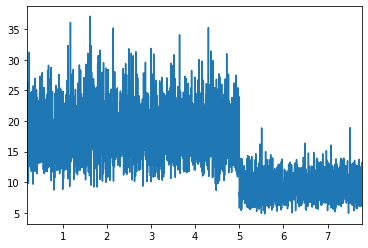

In [243]:
# history['train_loss'].iloc[100:].plot();

In [ ]:
# series1 = history.dropna()['mask_loss']
# plt.plot(series1.index, series1 ,label = 'mask loss');
# series2 = history.dropna()['regr_loss']
# plt.plot(series2.index, 30*series2,label = 'regr loss');
# series3 = history.dropna()['dev_loss']
# plt.plot(series3.index, series3,label = 'dev loss');
# plt.show()

In [ ]:
# series = history.dropna()['dev_loss']
# plt.scatter(series.index, series);

In [51]:
# model.load_state_dict(torch.load('./model-dla.pth'))
# model.eval()

# Visualize predictions

In [40]:
# img, mask, regr = dev_dataset[0]

# plt.figure(figsize=(16,16))
# plt.title('Input image')
# plt.imshow(np.rollaxis(img, 0, 3))
# plt.show()

# plt.figure(figsize=(16,16))
# plt.title('Ground truth mask')
# plt.imshow(mask)
# plt.show()

# output = model(torch.tensor(img[None]).to(device))
# logits = output[0,0].data.cpu().numpy()

# plt.figure(figsize=(16,16))
# plt.title('Model predictions')
# plt.imshow(logits)
# plt.show()

# print(logits)
# plt.figure(figsize=(16,16))
# plt.title('Model predictions thresholded')
# plt.imshow(logits > 0)
# plt.show()

In [ ]:
# ## Simple test of probabilities
# act = torch.nn.Sigmoid()
# logtens = torch.from_numpy(logits)
# probs = act(logtens)
# probs = probs[probs>0.03]
# print(probs)

In [42]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0):
    def distance_fn(xyz):
        x, y, z = xyz
        x, y = convert_3d_to_2d(x, y, z0)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + IMG_SHAPE[1] // 4) * IMG_WIDTH / (IMG_SHAPE[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        return (x-r)**2 + (y-c)**2
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z0

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

In [43]:
# import gc

# torch.cuda.empty_cache()
# gc.collect()

# for idx in range(8):
#     img, mask, regr = dev_dataset[idx]
    
#     output = model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
#     coords_pred = extract_coords(output[0])
#     coords_true = extract_coords(np.concatenate([mask[None], regr], 0))
    
#     img = imread(train_images_dir.format(df_dev['ImageId'].iloc[idx]))
    
#     fig, axes = plt.subplots(1, 2, figsize=(30,30))
#     axes[0].set_title('Ground truth')
#     axes[0].imshow(visualize(img, coords_true))
#     axes[1].set_title('Prediction')
#     axes[1].imshow(visualize(img, coords_pred))
#     plt.show()

In [44]:
# model.load_state_dict(torch.load('./modelGaussian.pth'))
# model.eval()

# Evaluation

In [45]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from math import sqrt, acos, pi, sin, cos
from scipy.spatial.transform import Rotation as R
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from inspect import signature
import matplotlib.pyplot as plt
from multiprocessing import Pool

def expand_df(df, PredictionStringCols):
    df = df.dropna().copy()
    df['NumCars'] = [int((x.count(' ')+1)/7) for x in df['PredictionString']]

    image_id_expanded = [item for item, count in zip(df['ImageId'], df['NumCars']) for i in range(count)]
    prediction_strings_expanded = df['PredictionString'].str.split(' ',expand = True).values.reshape(-1,7).astype(float)
    prediction_strings_expanded = prediction_strings_expanded[~np.isnan(prediction_strings_expanded).all(axis=1)]
    df = pd.DataFrame(
        {
            'ImageId': image_id_expanded,
            PredictionStringCols[0]:prediction_strings_expanded[:,0],
            PredictionStringCols[1]:prediction_strings_expanded[:,1],
            PredictionStringCols[2]:prediction_strings_expanded[:,2],
            PredictionStringCols[3]:prediction_strings_expanded[:,3],
            PredictionStringCols[4]:prediction_strings_expanded[:,4],
            PredictionStringCols[5]:prediction_strings_expanded[:,5],
            PredictionStringCols[6]:prediction_strings_expanded[:,6]
        })
    return df



#def str2coords(s, names):
#    coords = []
#    for l in np.array(s.split()).reshape([-1, 7]):
#        coords.append(dict(zip(names, l.astype('float'))))
#    return coords

def TranslationDistance(p,g, abs_dist = False):
    dx = p['x'] - g['x']
    dy = p['y'] - g['y']
    dz = p['z'] - g['z']
    diff0 = (g['x']**2 + g['y']**2 + g['z']**2)**0.5
    diff1 = (dx**2 + dy**2 + dz**2)**0.5
    if abs_dist:
        diff = diff1
    else:
        diff = diff1/diff0
    return diff

def RotationDistance(p, g):
    true=[ g['pitch'] ,g['yaw'] ,g['roll'] ]
    pred=[ p['pitch'] ,p['yaw'] ,p['roll'] ]
    q1 = R.from_euler('xyz', true)
    q2 = R.from_euler('xyz', pred)
    diff = R.inv(q2) * q1
    W = np.clip(diff.as_quat()[-1], -1., 1.)
    
    # in the official metrics code:
    # https://www.kaggle.com/c/pku-autonomous-driving/overview/evaluation
    #   return Object3D.RadianToDegree( Math.Acos(diff.W) )
    # this code treat θ and θ+2π differntly.
    # So this should be fixed as follows.
    W = (acos(W)*360)/pi
    if W > 180:
        W = 360 - W
    return W

def print_pr_curve(result_flg, scores, recall_total=1):
    average_precision = average_precision_score(result_flg, scores)
    precision, recall, _ = precision_recall_curve(result_flg, scores)
    recall *= recall_total
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.show()

In [46]:
thres_tr_list = [0.1, 0.09, 0.08, 0.07, 0.06, 0.05, 0.04, 0.03, 0.02, 0.01]
thres_ro_list = [50, 45, 40, 35, 30, 25, 20, 15, 10, 5]

def check_match(idx):
    keep_gt=False
    thre_tr_dist = thres_tr_list[idx]
    thre_ro_dist = thres_ro_list[idx]
    train_dict = {imgID:str2coords(s, names=['carid_or_score', 'pitch', 'yaw', 'roll', 'x', 'y', 'z']) for imgID,s in zip(train_df['ImageId'],train_df['PredictionString'])}
    valid_dict = {imgID:str2coords(s, names=['pitch', 'yaw', 'roll', 'x', 'y', 'z', 'carid_or_score']) for imgID,s in zip(valid_df['ImageId'],valid_df['PredictionString'])}
    result_flg = [] # 1 for TP, 0 for FP
    scores = []
    MAX_VAL = 10**10
    for img_id in valid_dict:
        for pcar in sorted(valid_dict[img_id], key=lambda x: -x['carid_or_score']):
            # find nearest GT
            min_tr_dist = MAX_VAL
            min_idx = -1
            for idx, gcar in enumerate(train_dict[img_id]):
                tr_dist = TranslationDistance(pcar,gcar)
                if tr_dist < min_tr_dist:
                    min_tr_dist = tr_dist
                    min_ro_dist = RotationDistance(pcar,gcar)
                    min_idx = idx
                    
            # set the result
            if min_tr_dist < thre_tr_dist and min_ro_dist < thre_ro_dist:
                if not keep_gt:
                    train_dict[img_id].pop(min_idx)
                result_flg.append(1)
            else:
                result_flg.append(0)
            scores.append(pcar['carid_or_score'])
    
    return result_flg, scores


# validation prediction

In [47]:
threshold1 = -2
threshold2 = 1

In [48]:
# map: 0.10844716601852893 # -2
# map: 0.11908345067814112 # -3
# map: 0.1279842909587167  # -4
# map: 0.13395854895945764 # -5 
# map: 0.1383288800848642  # -6
# map: 0.14158187970998287 # -7

In [49]:
def peak_tmp(array, threshold1, threshold2):
    print(array.shape)
    (xlist, ylist) = np.where(array[0]>np.sort(array[0].reshape((1,-1)))[0][-100])
    
    peak_array = array[0]
    maximum = array.max()
    
    advantage = 0
    for k in range(len(xlist)):
        i = xlist[k]
        j = ylist[k]
        ct1 = 0 # 주변의 점들이 top 50 안에 있는가
        ct2 = 0 # 주변의 점들의 값이 더 작은가 
        
        if 0<i<array.shape[1]-1 and 0<j<array.shape[2]-1:    
            surroundings = [(i-1,j+1),(i-1,j),(i-1,j+1),(i,j-1),(i,j+1),(i+1,j+1),(i+1,j),(i+1,j+1)]
            for xy in surroundings:
                if xy[0] in xlist and xy[1] in ylist:
                    ct1 += 1
                if peak_array[i,j] > peak_array[xy[0], xy[1]]:
                    ct2 += 1
            if ct1 > 6 and ct2 > 7:
                advantage += 1
                peak_array[i,j]+=(maximum - peak_array[i,j])*(1/2)
            
    penalty = np.zeros(array[0].shape)
    
    
    for i in range(1,array.shape[1]-1):
        for j in range(1,array.shape[2]-1):    
            ct_sur = 0
            ct_vert = 0
            ct_hori = 0
            surroundings = [(i,j),(i,j+1),(i+1,j),(i+1,j+1)]
            horizontal = [(i,j-1),(i,j),(i,j+1)]
            vertical = [(i-1,j),(i,j),(i+1,j)] 
            
            for xy in surroundings:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_sur += 1
                    
            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_vert += 1

            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_hori += 1

            if ct_sur > 2:
                idx = np.argmax(np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]))
                if idx == 0:
                    penalty[i,j+1]-=1
                    penalty[i+1,j]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 1:
                    penalty[i,j]-=1
                    penalty[i+1,j]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 2:
                    penalty[i,j]-=1
                    penalty[i,j+1]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 3:
                    penalty[i,j]-=1
                    penalty[i,j+1]-=1
                    penalty[i+1,j]-=1

            elif ct_sur > 1:
                idx = np.argmax(np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]))
                if idx == 0:
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 1:
                    penalty[i,j]-=0.3
                    penalty[i+1,j]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 2:
                    penalty[i,j]-=0.3
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 3:
                    penalty[i,j]-=0.3
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j]-=0.3

            if ct_vert == 3:
                idx = np.argmax(np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]))
                if idx == 0:
                    penalty[i,j]-=0.5
                    penalty[i+1,j]-=0.5
                elif idx == 1:
                    penalty[i-1,j]-=0.5
                    penalty[i+1,j]-=0.5
                elif idx == 2:
                    penalty[i-1,j]-=0.5
                    penalty[i,j]-=0.5
                    
            if ct_hori == 3:
                idx = np.argmax(np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]))
                if idx == 0:
                    penalty[i,j]-=0.5
                    penalty[i,j+1]-=0.5
                elif idx == 1:
                    penalty[i,j-1]-=0.5
                    penalty[i,j+1]-=0.5
                elif idx == 2:
                    penalty[i,j-1]-=0.5
                    penalty[i,j]-=0.5
                    
                
    print("advantage:", advantage)
    print("penalty:", np.sum(penalty))            
    peak_array = peak_array + penalty*threshold2
    
    threshold_iter = 0
    while np.sum(peak_array>threshold1)<5 and threshold_iter<8:
        threshold_iter+=1
        peak_array += 0.5
        print("brighter:", np.sum(peak_array>threshold1))
        
        #if idx==1 and array[i,j]>threshold1-3:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
        #if idx==0 and array[i,j]>threshold1:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
            
        #if array[i,j]>threshold1+threshold2: #1.5
        #    pass#peak_array[i,j]+=0.5 #1
    return peak_array, advantage

In [50]:
# import copy

# predictions = []
# dev_loader = DataLoader(dataset=dev_dataset, batch_size=4, shuffle=False, num_workers=4)
# model.eval()
# for img, _, _ in tqdm(dev_loader):
#     with torch.no_grad():
#         output = model(img.to(device))
    
#     for i in range(output[0]['hm'].shape[0]):
#         coords = extract_coords((output[0]['hm'][i][0], output[0]['reg'][i][0]), threshold1, threshold2)
#         s = coords2str(coords)
#         predictions.append(s)
        
# df_dev['PredictionString'] = copy.copy(predictions)

# valid_df = df_dev
# expanded_valid_df = expand_df(valid_df, ['pitch','yaw','roll','x','y','z','Score'])
# valid_df = valid_df.fillna('')

# train_df = pd.read_csv('../input/pku-autonomous-driving/train.csv')
# train_df = train_df[train_df.ImageId.isin(valid_df.ImageId.unique())]
# # data description page says, The pose information is formatted as
# # model type, yaw, pitch, roll, x, y, z
# # but it doesn't, and it should be
# # model type, pitch, yaw, roll, x, y, z
# expanded_train_df = expand_df(train_df, ['model_type','pitch','yaw','roll','x','y','z'])

# max_workers = 10
# n_gt = len(expanded_train_df)
# ap_list = []
# p = Pool(processes=max_workers)
# for result_flg, scores in p.imap(check_match, range(10)):
#     if np.sum(result_flg) > 0:
#         n_tp = np.sum(result_flg)
#         recall = n_tp/n_gt
#         ap = average_precision_score(result_flg, scores)*recall
#         print_pr_curve(result_flg, scores, recall)
#     else:
#         ap = 0
#     ap_list.append(ap)
# map = np.mean(ap_list)
# print('map:', map)

# score = {}
# score[str(threshold1)+'_'+str(threshold2)]=map

In [51]:
# train = pd.read_csv(PATH + 'train.csv')
# test = pd.read_csv(PATH + 'sample_submission.csv')

# # From camera.zip
# camera_matrix = np.array([[2304.5479, 0,  1686.2379],
#                           [0, 2305.8757, 1354.9849],
#                           [0, 0, 1]], dtype=np.float32)
# camera_matrix_inv = np.linalg.inv(camera_matrix)

# train_images_dir = PATH + 'train_images/{}.jpg'
# test_images_dir = PATH + 'test_images/{}.jpg'

# df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
# df_test = test

# # Create dataset objects
# train_dataset = CarDataset(df_train, train_images_dir)
# dev_dataset = CarDataset(df_dev, train_images_dir)
# test_dataset = CarDataset(df_test, test_images_dir)

In [52]:
threshold1 = -2
threshold2 = 1

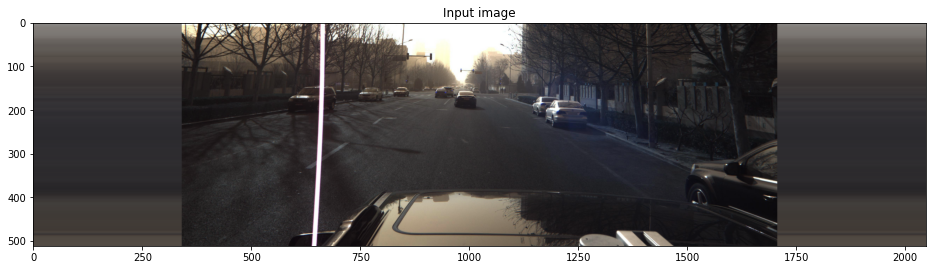

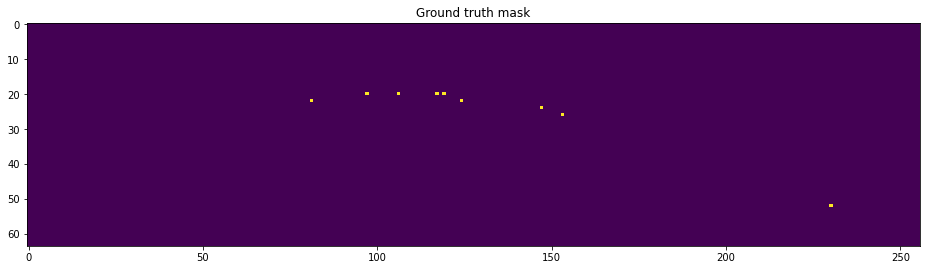

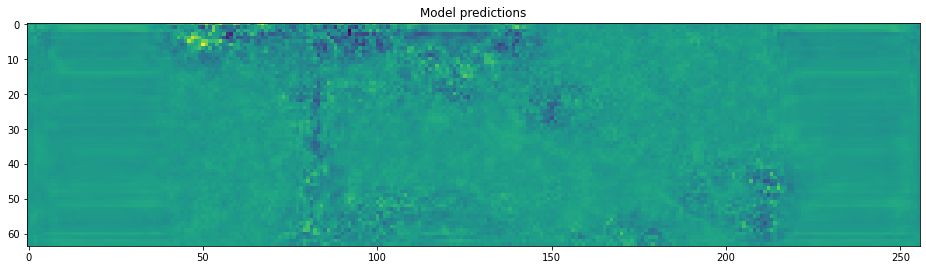

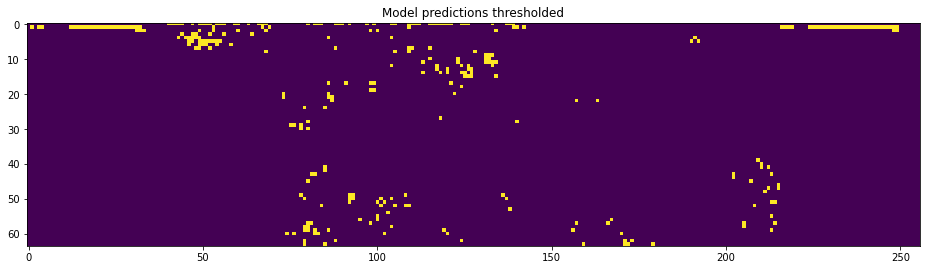

(1, 64, 256)
advantage: 11
penalty: -279.0


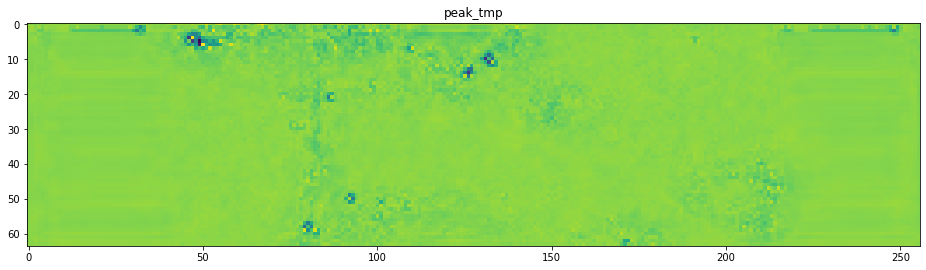

GT count: 9
MP count: 306
PEAK count: 168


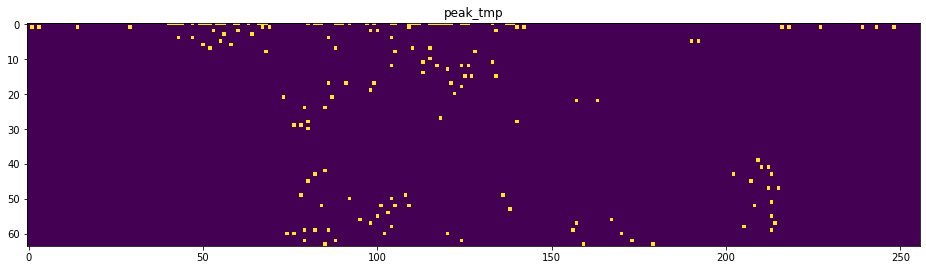

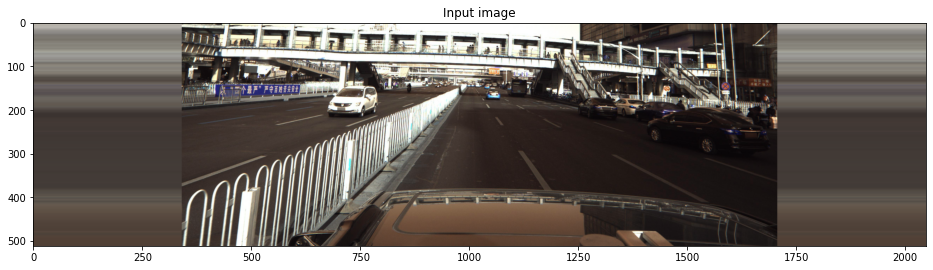

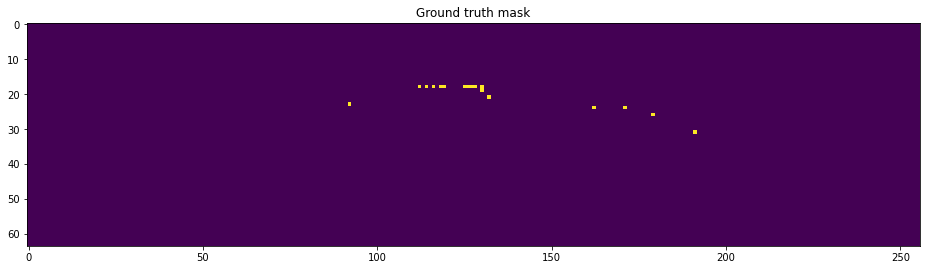

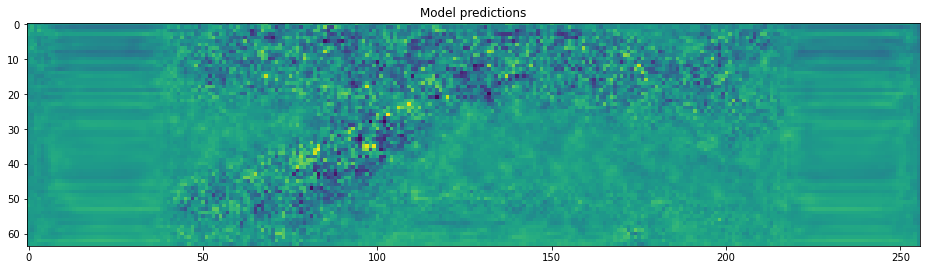

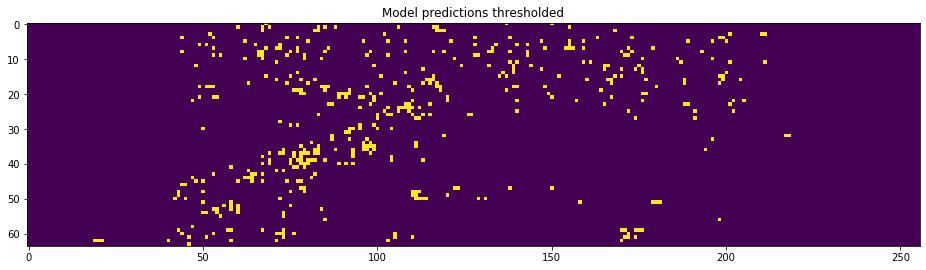

(1, 64, 256)
advantage: 31
penalty: -439.6


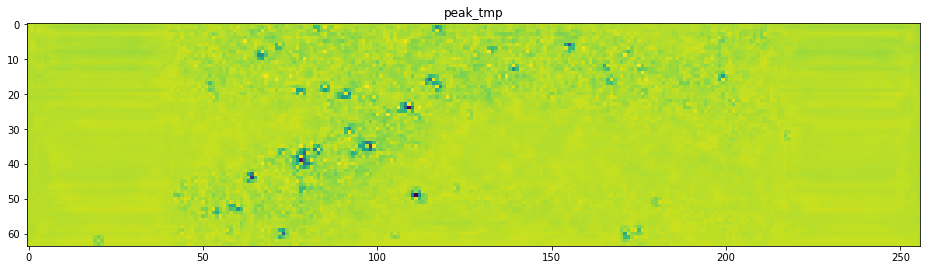

GT count: 17
MP count: 456
PEAK count: 265


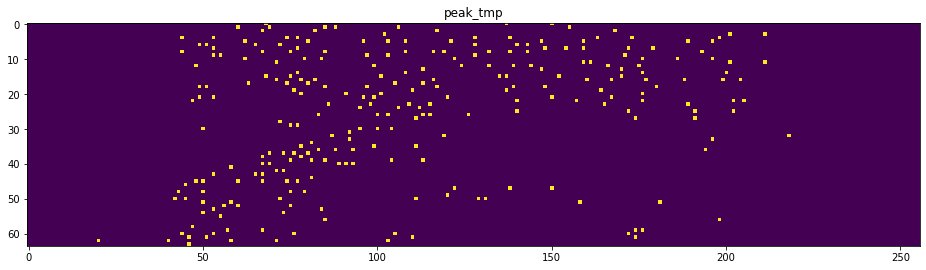

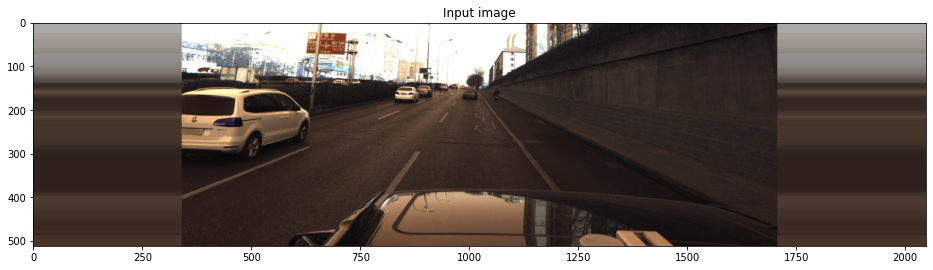

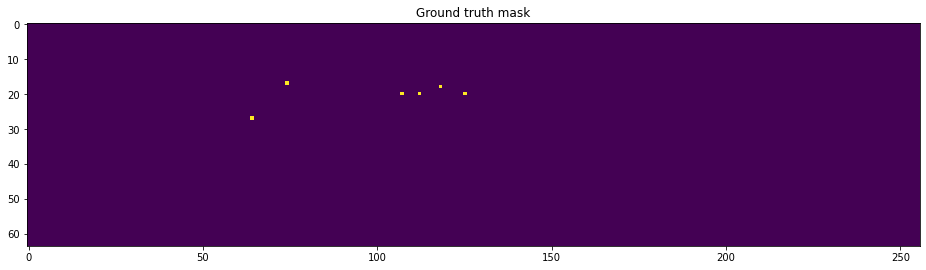

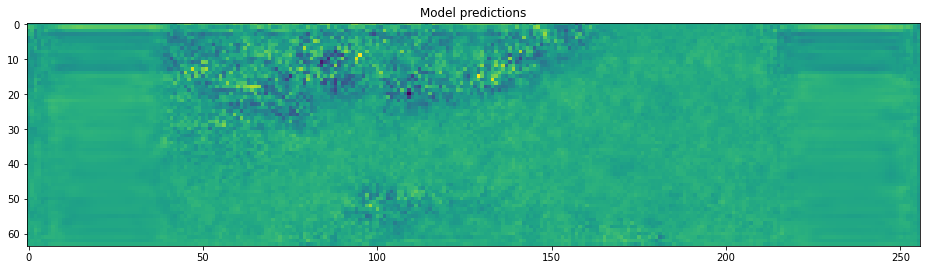

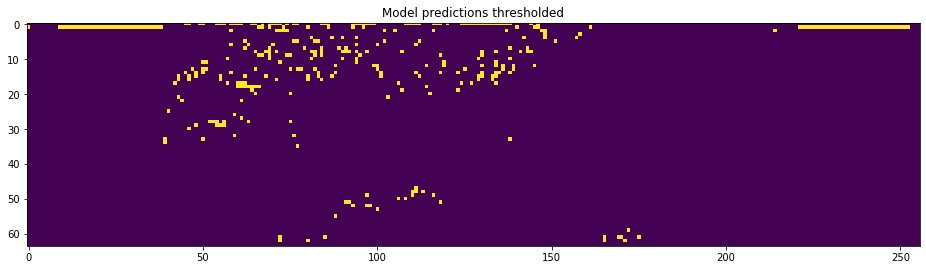

(1, 64, 256)
advantage: 33
penalty: -256.09999999999997


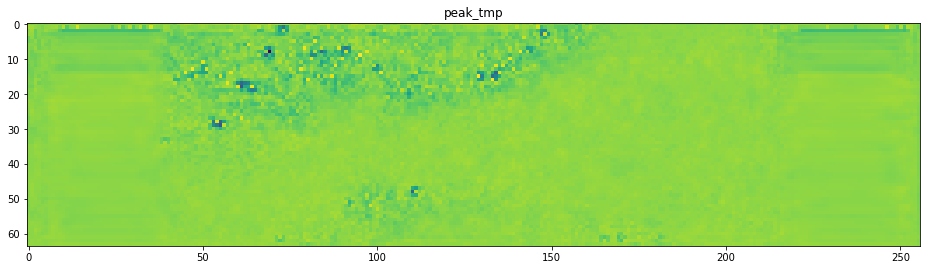

GT count: 6
MP count: 351
PEAK count: 208


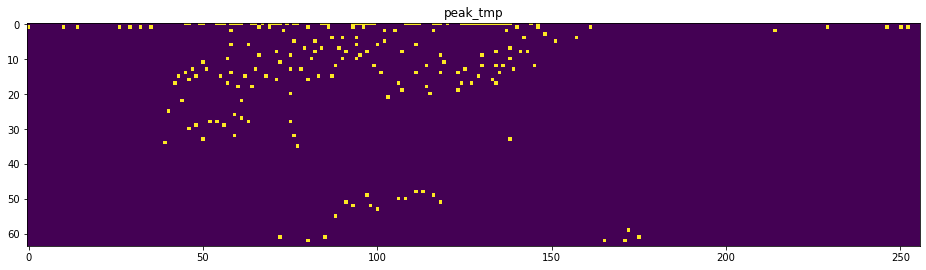

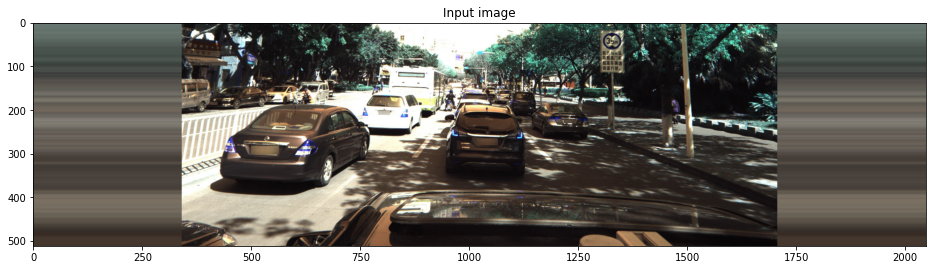

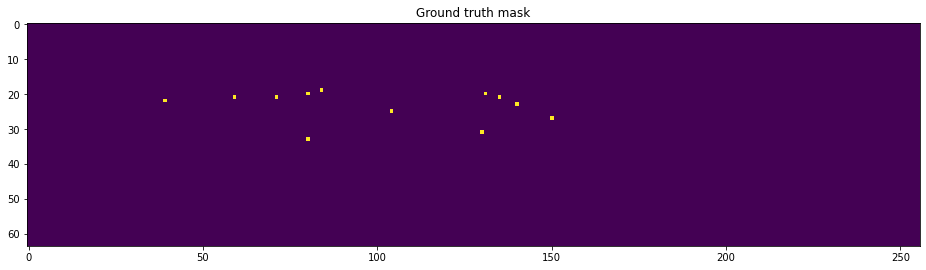

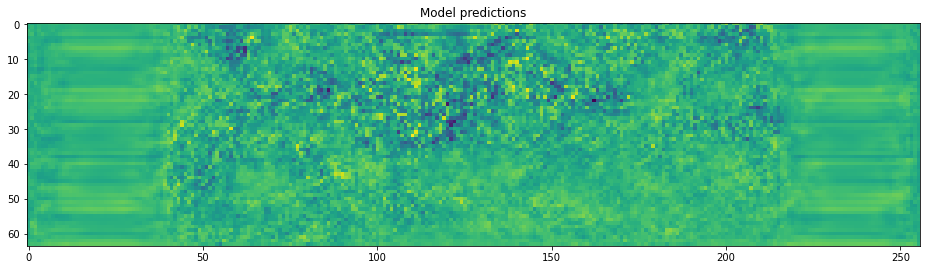

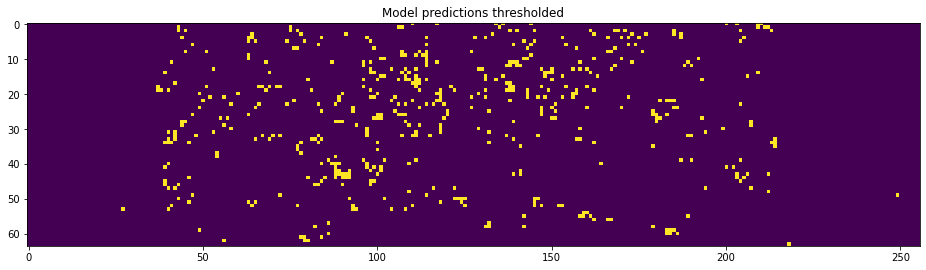

(1, 64, 256)
advantage: 27
penalty: -456.4


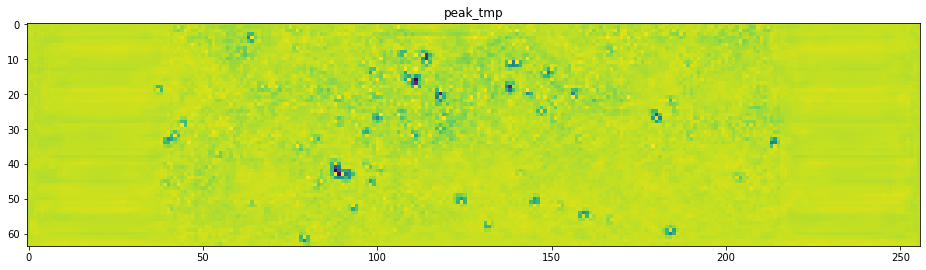

GT count: 12
MP count: 511
PEAK count: 309


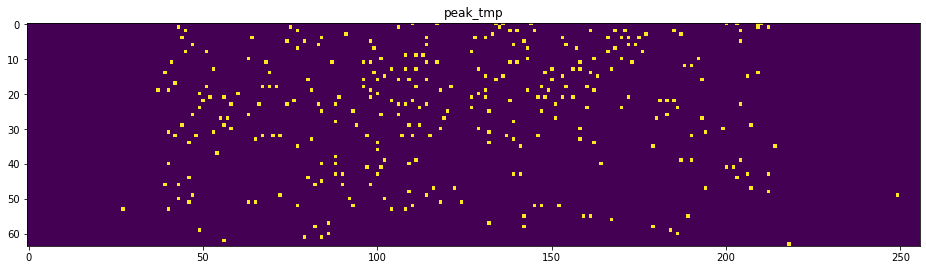

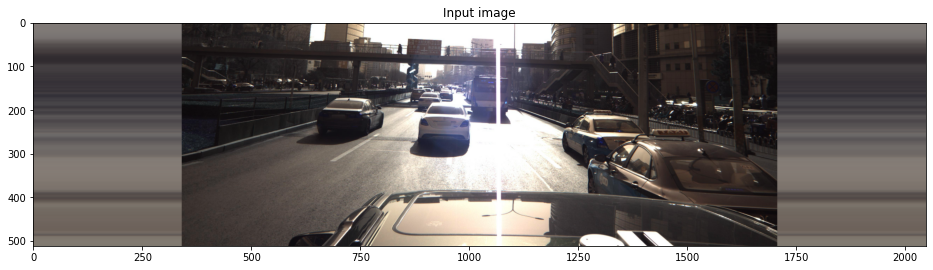

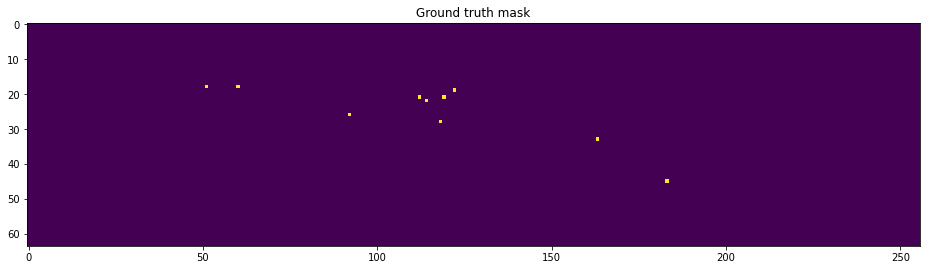

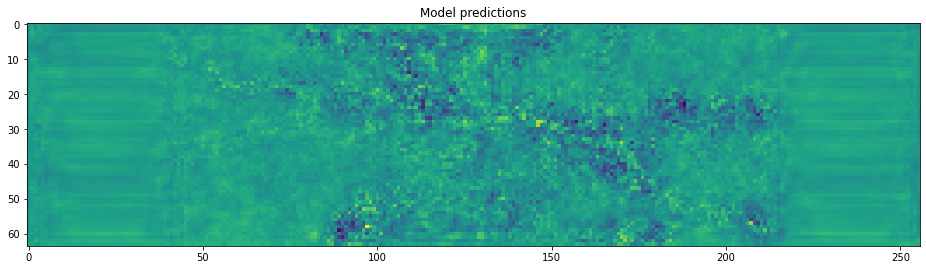

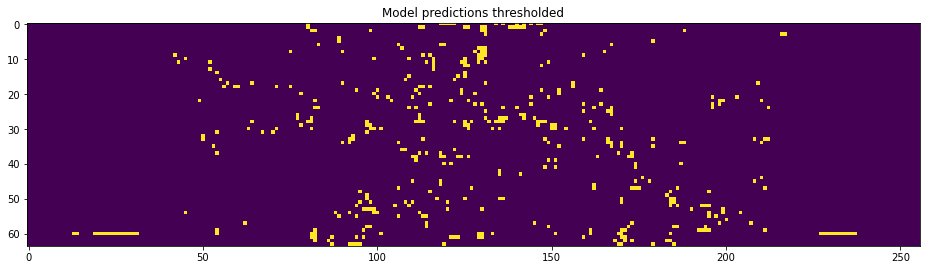

(1, 64, 256)
advantage: 21
penalty: -412.3


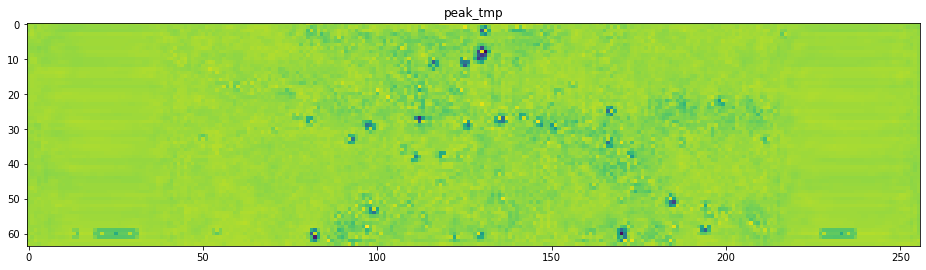

GT count: 10
MP count: 439
PEAK count: 252


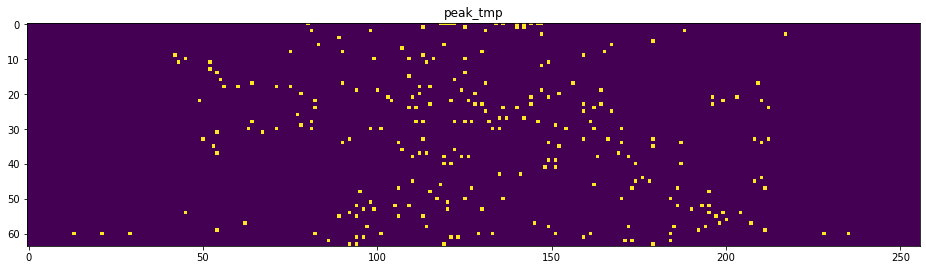

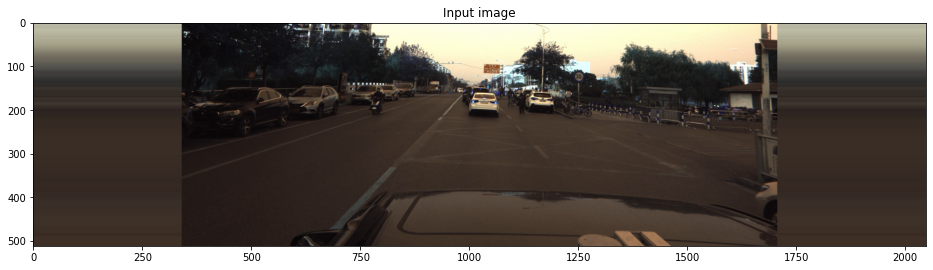

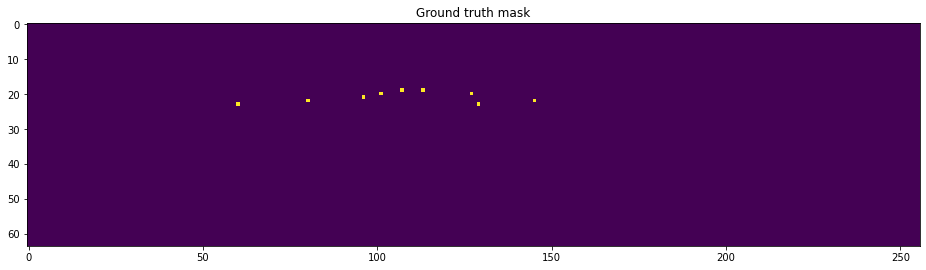

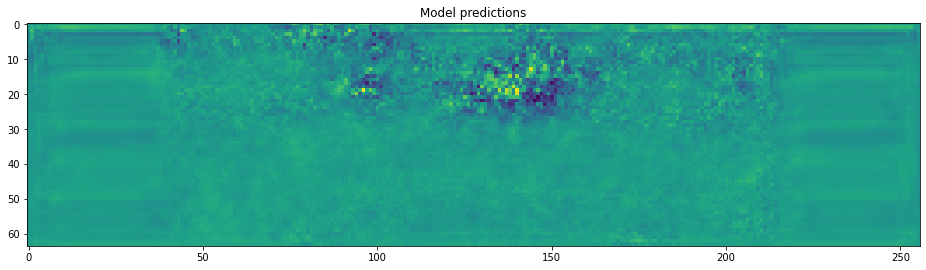

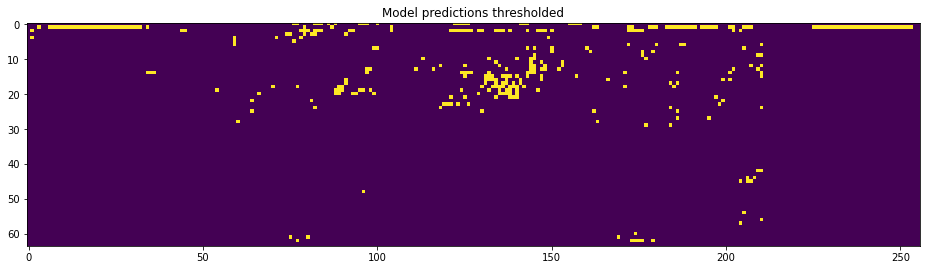

(1, 64, 256)
advantage: 30
penalty: -390.5


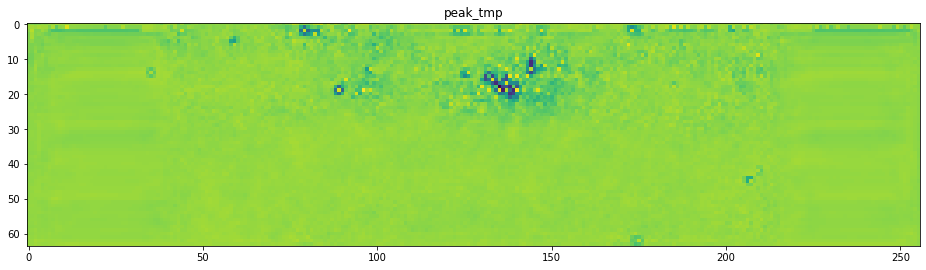

GT count: 9
MP count: 352
PEAK count: 173


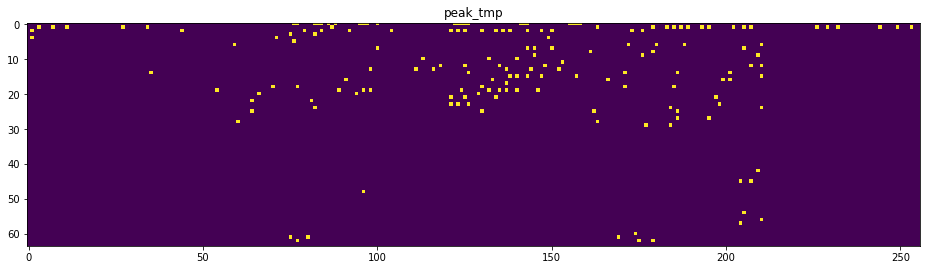

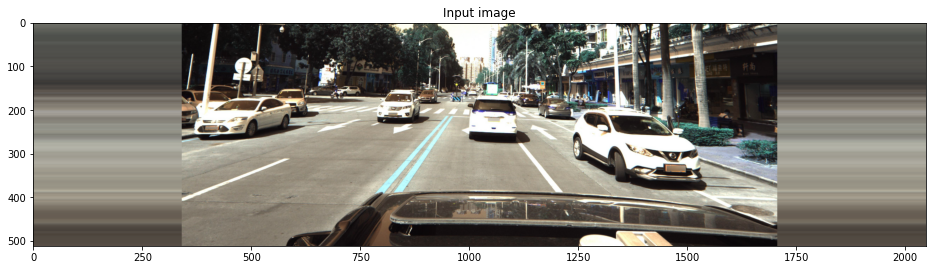

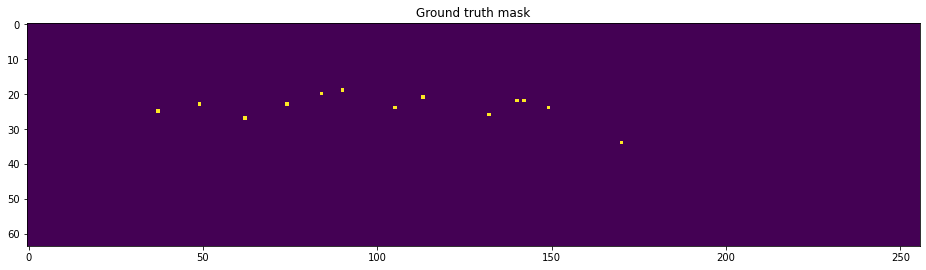

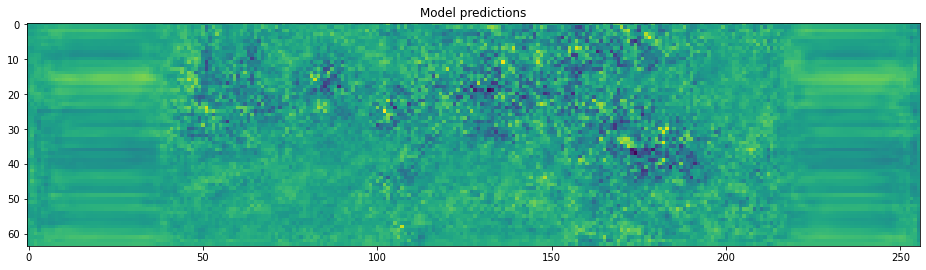

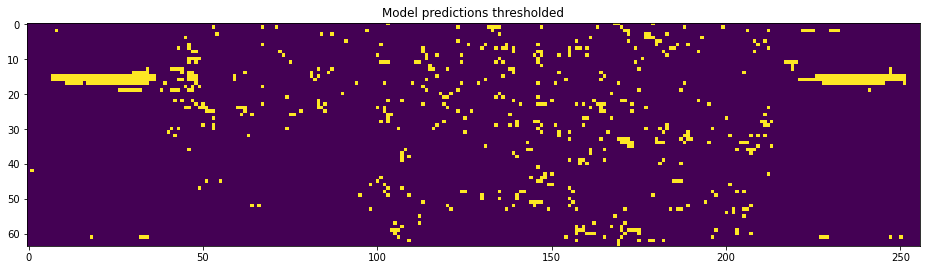

(1, 64, 256)
advantage: 30
penalty: -999.4000000000001


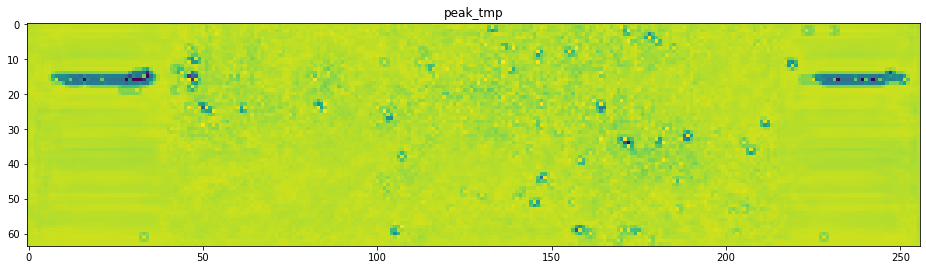

GT count: 13
MP count: 695
PEAK count: 315


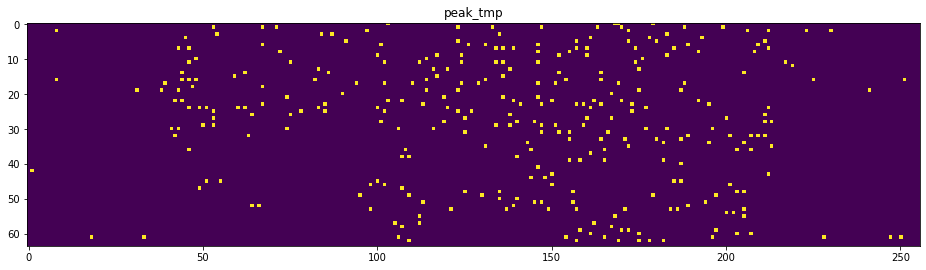

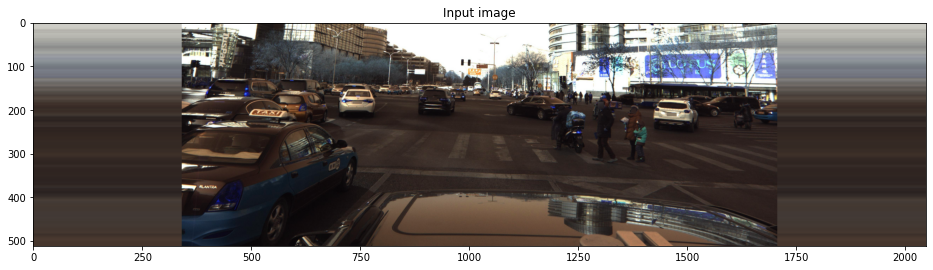

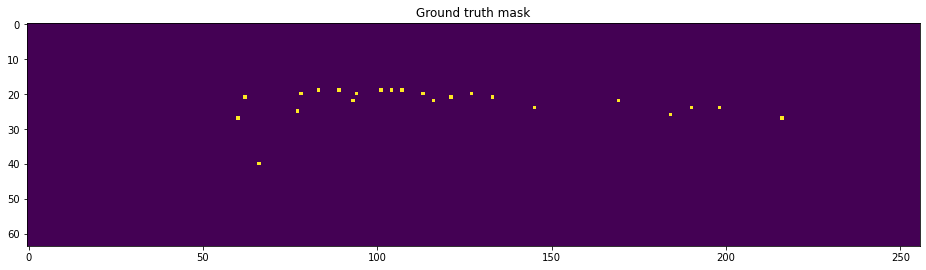

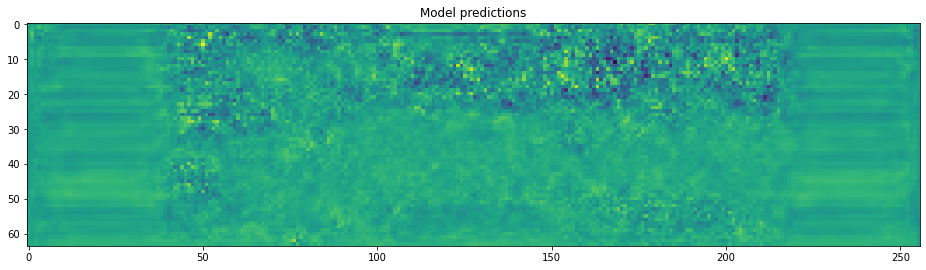

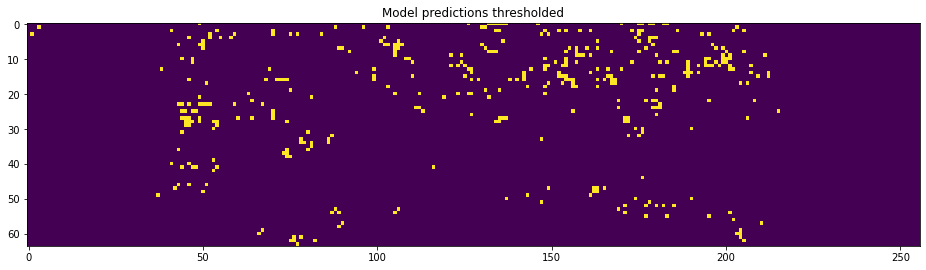

(1, 64, 256)
advantage: 22
penalty: -368.0


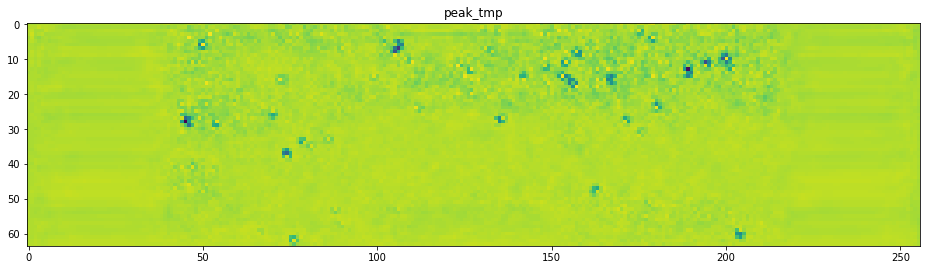

GT count: 23
MP count: 392
PEAK count: 234


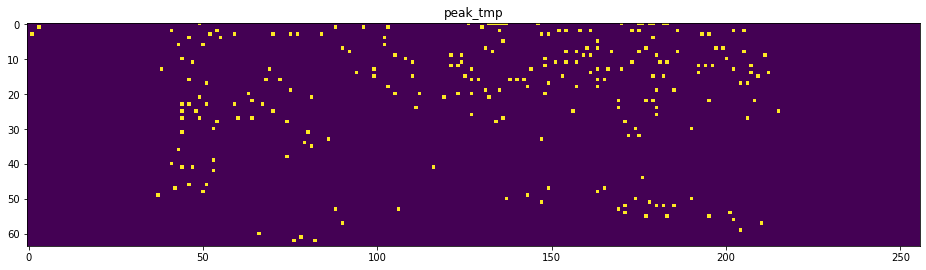

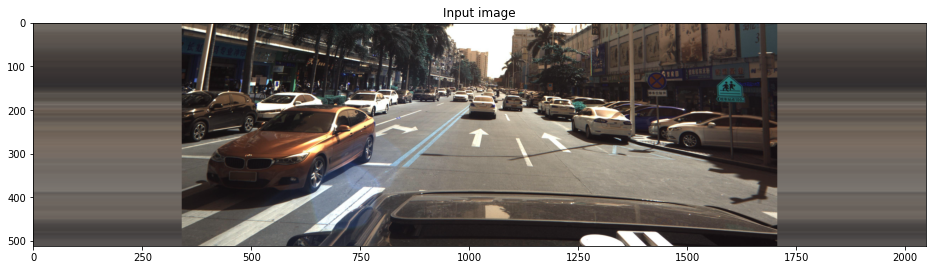

KeyboardInterrupt: 

KeyboardInterrupt: 

In [53]:
for i in range(40,50):
    img, mask, regr = train_dataset[i]
    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()
    
    output = model(torch.tensor(img[None]).to(device))
    output = output[0]['hm']
    logits = output[0,0].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits)
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits>-2)
    plt.show()
    
    img, idx = peak_tmp(logits[None],threshold1,threshold2)
    plt.figure(figsize=(16,16))
    plt.title('peak_tmp')
    plt.imshow(img)
    plt.show()

    print("GT count:", np.sum(mask>0))
    print("MP count:", np.sum(logits>-2))
    print("PEAK count:", np.sum(img>-2))
    
    plt.figure(figsize=(16,16))
    plt.title('peak_tmp')
    plt.imshow(img>-2)
    plt.show()


# Make submission

In [55]:
def show_coords(prediction, threshold1, threshold2):
    logits, idx = peak_tmp(prediction[0][0][None].cpu().numpy(), threshold1, threshold2) #peak_tmp(prediction, threshold1, threshold2) #peak(prediction[0], threshold1, threshold2)#prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
    plt.figure(figsize=(12, 8))
    plt.imshow(logits)
    plt.show()

    regr_output = prediction[1:]
    plt.figure(figsize=(12, 8))
    plt.imshow(logits > threshold1)
    plt.show()

In [56]:
# Show prediction results

  0%|          | 0/506 [00:00<?, ?it/s]

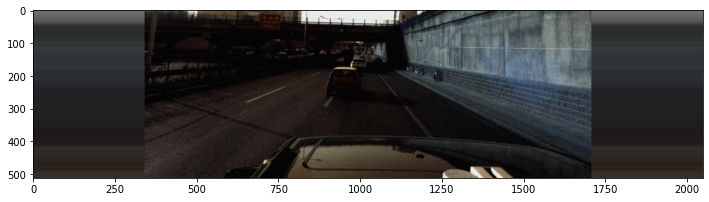

(1, 64, 256)
advantage: 0
penalty: 0.0
brighter: 16384


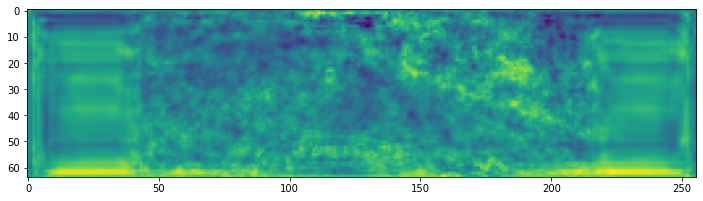

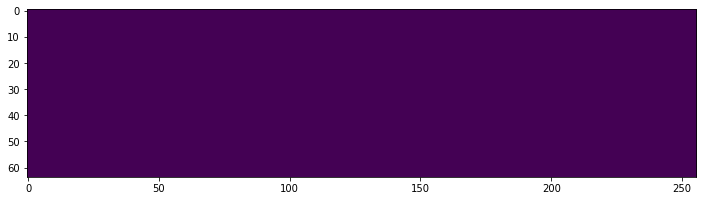

  0%|          | 1/506 [00:02<23:53,  2.84s/it]

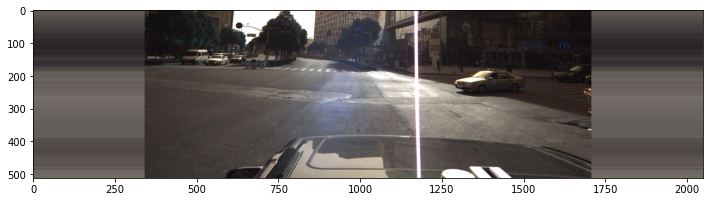

(1, 64, 256)
advantage: 16
penalty: 0.0
brighter: 16384


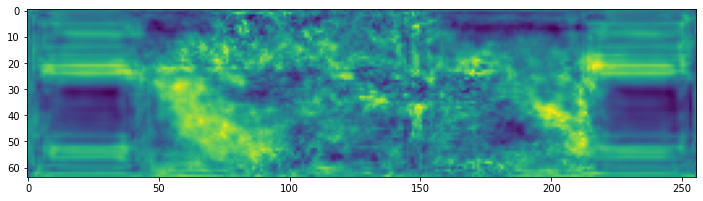

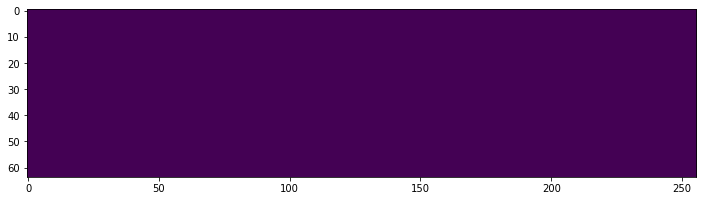

  0%|          | 2/506 [00:04<20:18,  2.42s/it]

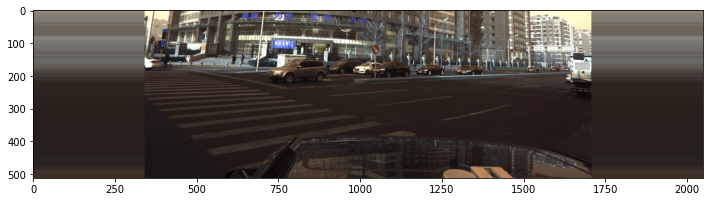

(1, 64, 256)
advantage: 12
penalty: 0.0
brighter: 16384


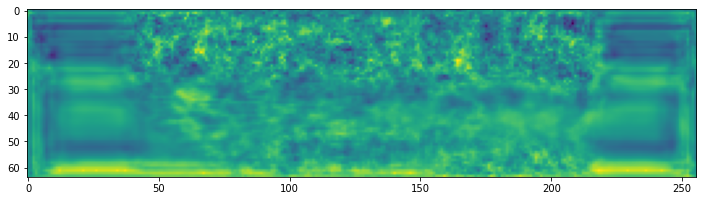

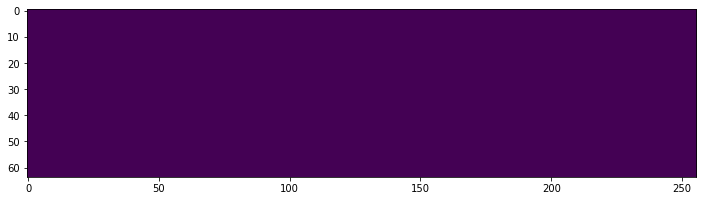

  1%|          | 3/506 [00:05<18:04,  2.16s/it]

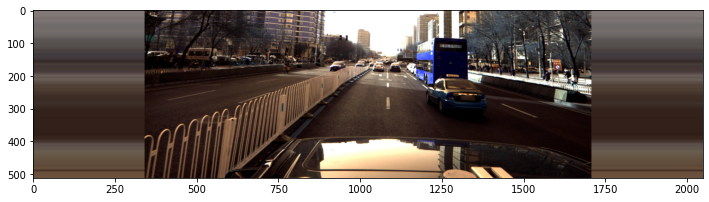

(1, 64, 256)
advantage: 15
penalty: 0.0
brighter: 16384


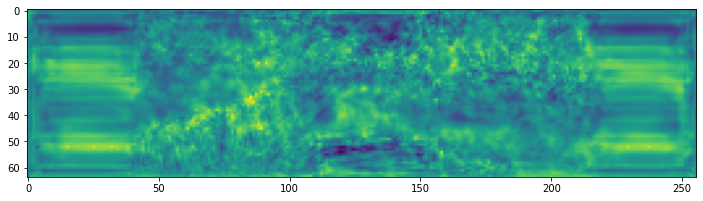

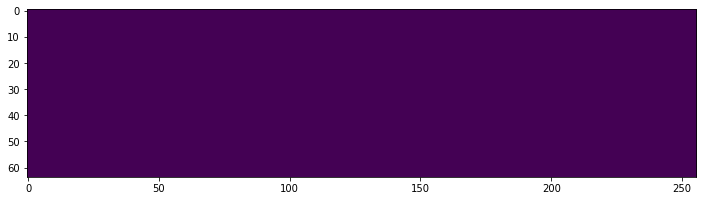

  1%|          | 4/506 [00:07<16:06,  1.92s/it]

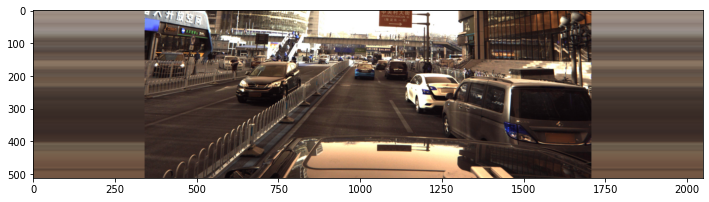

(1, 64, 256)
advantage: 12
penalty: 0.0
brighter: 16384


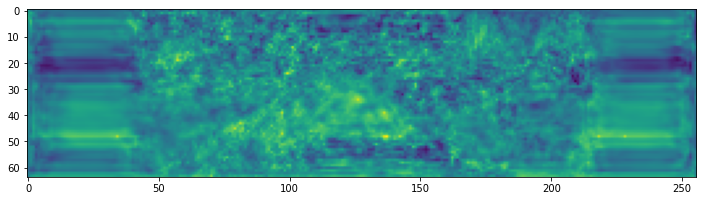

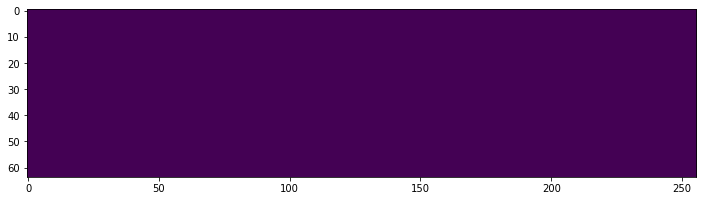

  1%|          | 5/506 [00:08<14:35,  1.75s/it]Process Process-5:
Process Process-7:
Process Process-8:
Traceback (most recent call last):
Traceback (most recent call last):
  1%|          | 5/506 [00:08<14:26,  1.73s/it]  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)



KeyboardInterrupt: 

  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/queues.py", line 104, in get
    if not self._poll(timeout):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/queues.py", line 104, in get
    if not self._poll(timeout):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/mult

In [57]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()


for img, _, _ in tqdm(test_loader):
    
    plt.figure(figsize=(12, 8))
    plt.imshow(np.einsum('ijk->jki', img[0]))
    plt.show()
    
    with torch.no_grad():
        output = model(img.to(device))
    output = output[0]['hm']
    show_coords(output,threshold1, threshold2)
        

In [176]:
def extract_coords(prediction, threshold1, threshold2, plot=False):
    logits, idx = peak_tmp(prediction[0].cpu().numpy(), threshold1, threshold2)#prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
    
    if plot==True:    
        plt.figure(figsize=(15,8))
        plt.imshow(logits)
        plt.show()

        plt.figure(figsize=(15,8))
        plt.imshow(logits>threshold1)
        plt.show()
    
    regr_output = prediction[1]
    points = np.argwhere(logits > threshold1)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    if len(points) == 0:
        print('no points')
        return coords
    
    
    for r,c in zip(points[:,0], points[:,1]): #.numpy() .numpy()
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        for val in regr_dict:
            #if type(regr_dict[val])==torch.Tensor:
            regr_dict[val] = np.float32(regr_dict[val])
                             
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = np.float32(1 / (1 + np.exp(-logits[r, c])))
        #coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['z'].cpu().numpy()))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords

In [194]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

plot = False

for img, _, _ in tqdm(test_loader):
    
    idx = 0
    
    with torch.no_grad():
        output = model(img.to(device))
    for i in range(output[0]['hm'].shape[0]):
        coords = extract_coords((output[0]['hm'][i], output[0]['reg'][i]), threshold1, threshold2, plot)
        s = coords2str(coords)
        predictions.append(s)
        
        if plot == True:
            plt.figure(figsize=(15, 8))
            plt.imshow(np.einsum('ijk->jki', img[idx]))
            plt.show()

        idx += 1
        
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions_DLA'+'_'+str(threshold1)+'_'+str(threshold2)+'.csv', index=False)
test.head()








  0%|          | 0/506 [00:00<?, ?it/s]

(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 0
brighter: 0
brighter: 1
brighter: 1
brighter: 6
(1, 64, 256)
advantage: 11
penalty: -3.6
(1, 64, 256)
advantage: 18
penalty: -18.6
(1, 64, 256)









  0%|          | 1/506 [00:03<31:21,  3.73s/it]

advantage: 15
penalty: -16.2
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 8
penalty: -8.4
(1, 64, 256)









  0%|          | 2/506 [00:06<27:39,  3.29s/it]

advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -21.599999999999998
(1, 64, 256)
advantage: 13
penalty: -11.7
(1, 64, 256)









  1%|          | 3/506 [00:08<25:23,  3.03s/it]

advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 19
penalty: -22.1
(1, 64, 256)
advantage: 9
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)









  1%|          | 4/506 [00:10<23:48,  2.85s/it]

advantage: 16
penalty: -5.699999999999999
(1, 64, 256)
advantage: 14
penalty: -6.300000000000001
(1, 64, 256)
advantage: 22
penalty: -45.599999999999994
(1, 64, 256)
advantage: 16
penalty: -2.6999999999999997
(1, 64, 256)









  1%|          | 5/506 [00:13<22:56,  2.75s/it]

advantage: 13
penalty: -13.799999999999999
(1, 64, 256)
advantage: 13
penalty: -16.5
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 17
penalty: -19.2
(1, 64, 256)









  1%|          | 6/506 [00:15<22:26,  2.69s/it]

advantage: 16
penalty: -15.6
(1, 64, 256)
advantage: 18
penalty: -20.1
(1, 64, 256)
advantage: 9
penalty: -18.299999999999997
(1, 64, 256)
advantage: 16
penalty: -27.6
(1, 64, 256)









  1%|▏         | 7/506 [00:18<22:22,  2.69s/it]

advantage: 14
penalty: -20.999999999999996
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -24.6
(1, 64, 256)
advantage: 23
penalty: -39.3
(1, 64, 256)









  2%|▏         | 8/506 [00:21<22:09,  2.67s/it]

advantage: 15
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -15.6
(1, 64, 256)
advantage: 12
penalty: -11.1
(1, 64, 256)
advantage: 14
penalty: -13.8
(1, 64, 256)









  2%|▏         | 9/506 [00:23<21:49,  2.64s/it]

advantage: 14
penalty: -10.2
(1, 64, 256)
advantage: 15
penalty: -15.299999999999999
(1, 64, 256)
advantage: 10
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 15
penalty: -8.1
(1, 64, 256)









  2%|▏         | 10/506 [00:26<21:35,  2.61s/it]

advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
brighter: 5
(1, 64, 256)
advantage: 15
penalty: -22.5
(1, 64, 256)









  2%|▏         | 11/506 [00:29<21:39,  2.63s/it]

advantage: 16
penalty: -24.0
(1, 64, 256)
advantage: 14
penalty: -21.599999999999998
(1, 64, 256)
advantage: 15
penalty: -19.5
(1, 64, 256)
advantage: 25
penalty: -43.199999999999996
(1, 64, 256)









  2%|▏         | 12/506 [00:31<21:35,  2.62s/it]

advantage: 7
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 17
penalty: -28.799999999999997
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -20.400000000000002
(1, 64, 256)


/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/scipy/optimize/optimize.py:2664: RuntimeWarning: overflow encountered in long_scalars
  t -= delta*temp*temp







  3%|▎         | 13/506 [00:34<21:32,  2.62s/it]

advantage: 18
penalty: -12.6
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 8
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 15
penalty: -7.2
(1, 64, 256)









  3%|▎         | 14/506 [00:36<20:49,  2.54s/it]

advantage: 11
penalty: 0.0
(1, 64, 256)
advantage: 14
penalty: -5.4
(1, 64, 256)
advantage: 20
penalty: -8.4
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









  3%|▎         | 15/506 [00:39<20:37,  2.52s/it]

advantage: 15
penalty: -16.2
(1, 64, 256)
advantage: 18
penalty: -9.9
(1, 64, 256)
advantage: 16
penalty: -19.499999999999996
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)









  3%|▎         | 16/506 [00:41<20:02,  2.45s/it]

advantage: 6
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -45.599999999999994
(1, 64, 256)
advantage: 10
penalty: -14.399999999999999
(1, 64, 256)
advantage: 13
penalty: -6.299999999999999
(1, 64, 256)









  3%|▎         | 17/506 [00:43<19:59,  2.45s/it]

advantage: 5
penalty: -6.6
(1, 64, 256)
advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -17.400000000000002
(1, 64, 256)









  4%|▎         | 18/506 [00:46<19:36,  2.41s/it]

advantage: 9
penalty: -8.399999999999999
(1, 64, 256)
advantage: 8
penalty: -3.6
(1, 64, 256)
advantage: 9
penalty: -8.399999999999999
(1, 64, 256)
advantage: 13
penalty: -17.1
(1, 64, 256)









  4%|▍         | 19/506 [00:48<19:35,  2.41s/it]

advantage: 17
penalty: -24.9
(1, 64, 256)
advantage: 8
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 18
penalty: -35.1
(1, 64, 256)









  4%|▍         | 20/506 [00:50<19:28,  2.40s/it]

advantage: 10
penalty: -15.0
(1, 64, 256)
advantage: 20
penalty: -12.899999999999999
(1, 64, 256)
advantage: 12
penalty: -16.8
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)









  4%|▍         | 21/506 [00:53<19:24,  2.40s/it]

advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -20.099999999999998
(1, 64, 256)
advantage: 13
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)









  4%|▍         | 22/506 [00:55<19:04,  2.37s/it]

advantage: 9
penalty: -13.8
(1, 64, 256)
advantage: 10
penalty: -17.4
(1, 64, 256)
advantage: 8
penalty: -8.4
(1, 64, 256)
advantage: 10
penalty: -26.999999999999996
(1, 64, 256)









  5%|▍         | 23/506 [00:57<18:49,  2.34s/it]

advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -9.899999999999999
(1, 64, 256)
advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









  5%|▍         | 24/506 [01:00<18:45,  2.34s/it]

advantage: 15
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -15.0
(1, 64, 256)
advantage: 13
penalty: -22.8
(1, 64, 256)









  5%|▍         | 25/506 [01:02<19:01,  2.37s/it]

advantage: 17
penalty: -14.1
(1, 64, 256)
advantage: 13
penalty: -18.6
(1, 64, 256)
advantage: 19
penalty: -11.7
(1, 64, 256)
advantage: 10
penalty: -22.799999999999997
(1, 64, 256)









  5%|▌         | 26/506 [01:05<19:35,  2.45s/it]

advantage: 8
penalty: -23.5
(1, 64, 256)
advantage: 16
penalty: -30.299999999999997
(1, 64, 256)
advantage: 17
penalty: -18.6
(1, 64, 256)
advantage: 14
penalty: -10.2
(1, 64, 256)









  5%|▌         | 27/506 [01:07<19:39,  2.46s/it]

advantage: 9
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 8
penalty: 0.0
brighter: 1
brighter: 2
brighter: 2
brighter: 2
brighter: 3
brighter: 4
brighter: 7
(1, 64, 256)
advantage: 13
penalty: -11.7
(1, 64, 256)









  6%|▌         | 28/506 [01:10<19:16,  2.42s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: 0.0
brighter: 1
brighter: 2
brighter: 2
brighter: 4
brighter: 8
(1, 64, 256)
advantage: 17
penalty: -13.8
(1, 64, 256)
advantage: 10
penalty: -6.6
(1, 64, 256)









  6%|▌         | 29/506 [01:12<19:18,  2.43s/it]

advantage: 17
penalty: -22.8
(1, 64, 256)
advantage: 16
penalty: -34.199999999999996
(1, 64, 256)
advantage: 17
penalty: -19.500000000000004
(1, 64, 256)
advantage: 11
penalty: -10.8
(1, 64, 256)









  6%|▌         | 30/506 [01:15<19:33,  2.47s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -4.5
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)
advantage: 11
penalty: -11.4
(1, 64, 256)









  6%|▌         | 31/506 [01:17<19:19,  2.44s/it]

advantage: 17
penalty: -10.799999999999999
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -18.599999999999998
(1, 64, 256)
advantage: 13
penalty: -30.599999999999998
(1, 64, 256)









  6%|▋         | 32/506 [01:19<19:14,  2.44s/it]

advantage: 16
penalty: -9.6
(1, 64, 256)
advantage: 17
penalty: -13.8
(1, 64, 256)
advantage: 12
penalty: -37.800000000000004
(1, 64, 256)
advantage: 17
penalty: -28.8
(1, 64, 256)









  7%|▋         | 33/506 [01:22<19:25,  2.46s/it]

advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 17
penalty: -13.5
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)









  7%|▋         | 34/506 [01:24<19:14,  2.45s/it]

advantage: 9
penalty: -1.7999999999999998
brighter: 2
brighter: 9
(1, 64, 256)
advantage: 16
penalty: -21.0
(1, 64, 256)
advantage: 17
penalty: -34.2
(1, 64, 256)
advantage: 16
penalty: -22.2
(1, 64, 256)









  7%|▋         | 35/506 [01:27<19:23,  2.47s/it]

advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -19.8
(1, 64, 256)
advantage: 8
penalty: -9.899999999999999
(1, 64, 256)









  7%|▋         | 36/506 [01:29<19:11,  2.45s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -26.7
(1, 64, 256)









  7%|▋         | 37/506 [01:32<19:11,  2.46s/it]

advantage: 14
penalty: -10.8
(1, 64, 256)
advantage: 13
penalty: -18.299999999999997
(1, 64, 256)
advantage: 17
penalty: -15.3
(1, 64, 256)
advantage: 16
penalty: -15.6
(1, 64, 256)









  8%|▊         | 38/506 [01:34<19:40,  2.52s/it]

advantage: 22
penalty: -16.2
(1, 64, 256)
advantage: 13
penalty: -9.3
(1, 64, 256)
advantage: 16
penalty: -9.0
(1, 64, 256)
advantage: 18
penalty: -14.399999999999999
(1, 64, 256)









  8%|▊         | 39/506 [01:37<19:33,  2.51s/it]

advantage: 12
penalty: -6.6
(1, 64, 256)
advantage: 11
penalty: -15.600000000000001
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -8.099999999999998
(1, 64, 256)









  8%|▊         | 40/506 [01:39<19:06,  2.46s/it]

advantage: 13
penalty: -18.6
(1, 64, 256)
advantage: 15
penalty: -22.1
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 11
penalty: -24.900000000000002
(1, 64, 256)









  8%|▊         | 41/506 [01:42<19:02,  2.46s/it]

advantage: 18
penalty: -18.0
(1, 64, 256)
advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 18
penalty: -13.8
(1, 64, 256)
advantage: 18
penalty: -2.6999999999999997
(1, 64, 256)









  8%|▊         | 42/506 [01:44<18:53,  2.44s/it]

advantage: 10
penalty: -11.099999999999998
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 5
(1, 64, 256)
advantage: 22
penalty: -21.299999999999997
(1, 64, 256)
advantage: 22
penalty: -16.799999999999997
(1, 64, 256)









  8%|▊         | 43/506 [01:47<18:57,  2.46s/it]

advantage: 11
penalty: -15.0
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 18
penalty: -21.0
(1, 64, 256)
advantage: 11
penalty: -11.099999999999998
(1, 64, 256)









  9%|▊         | 44/506 [01:49<18:58,  2.47s/it]

advantage: 12
penalty: -37.199999999999996
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: -6.3
(1, 64, 256)
advantage: 17
penalty: -23.099999999999998
(1, 64, 256)









  9%|▉         | 45/506 [01:52<18:51,  2.45s/it]

advantage: 11
penalty: -6.3
(1, 64, 256)
advantage: 15
penalty: -11.399999999999999
(1, 64, 256)
advantage: 14
penalty: -16.499999999999996
(1, 64, 256)
advantage: 12
penalty: -10.2
(1, 64, 256)









  9%|▉         | 46/506 [01:54<18:59,  2.48s/it]

advantage: 22
penalty: -37.199999999999996
(1, 64, 256)
advantage: 14
penalty: -6.3
(1, 64, 256)
advantage: 13
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -14.399999999999999
(1, 64, 256)









  9%|▉         | 47/506 [01:56<18:47,  2.46s/it]

advantage: 18
penalty: -18.6
(1, 64, 256)
advantage: 10
penalty: -13.8
(1, 64, 256)
advantage: 9
penalty: -15.0
(1, 64, 256)
advantage: 14
penalty: -22.8
(1, 64, 256)









  9%|▉         | 48/506 [01:59<18:50,  2.47s/it]

advantage: 20
penalty: -19.2
(1, 64, 256)
advantage: 16
penalty: -27.3
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)









 10%|▉         | 49/506 [02:01<18:52,  2.48s/it]

advantage: 16
penalty: -37.199999999999996
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 19
penalty: -25.5
(1, 64, 256)
advantage: 14
penalty: -17.4
(1, 64, 256)









 10%|▉         | 50/506 [02:04<19:12,  2.53s/it]

advantage: 11
penalty: -16.5
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 4
brighter: 7
(1, 64, 256)
advantage: 13
penalty: -14.1
(1, 64, 256)









 10%|█         | 51/506 [02:07<18:53,  2.49s/it]

advantage: 9
penalty: -15.899999999999999
(1, 64, 256)
advantage: 8
penalty: -10.799999999999999
(1, 64, 256)
advantage: 14
penalty: -13.5
(1, 64, 256)
advantage: 17
penalty: -16.8
(1, 64, 256)









 10%|█         | 52/506 [02:09<19:28,  2.57s/it]

advantage: 12
penalty: -4.499999999999999
(1, 64, 256)
advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 7
penalty: 0.0
(1, 64, 256)
advantage: 17
penalty: -18.0
(1, 64, 256)









 10%|█         | 53/506 [02:12<19:18,  2.56s/it]

advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 16
penalty: -8.099999999999998
(1, 64, 256)
advantage: 13
penalty: -18.6
(1, 64, 256)









 11%|█         | 54/506 [02:14<19:13,  2.55s/it]

advantage: 15
penalty: -17.4
(1, 64, 256)
advantage: 15
penalty: -8.999999999999998
(1, 64, 256)
advantage: 15
penalty: -14.4
(1, 64, 256)
advantage: 14
penalty: -32.1
(1, 64, 256)









 11%|█         | 55/506 [02:17<19:20,  2.57s/it]

advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 14
penalty: -17.099999999999998
(1, 64, 256)
advantage: 11
penalty: -18.9
(1, 64, 256)
advantage: 10
penalty: -2.6999999999999997
(1, 64, 256)









 11%|█         | 56/506 [02:19<18:53,  2.52s/it]

advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 12
penalty: -20.400000000000002
(1, 64, 256)









 11%|█▏        | 57/506 [02:22<18:26,  2.46s/it]

advantage: 6
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 11
penalty: -18.0
(1, 64, 256)
advantage: 14
penalty: -12.599999999999998
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)









 11%|█▏        | 58/506 [02:24<18:56,  2.54s/it]

advantage: 17
penalty: -13.799999999999999
(1, 64, 256)
advantage: 11
penalty: -27.899999999999995
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 6
penalty: -2.6999999999999997
(1, 64, 256)









 12%|█▏        | 59/506 [02:27<18:40,  2.51s/it]

advantage: 14
penalty: -2.7
(1, 64, 256)
advantage: 13
penalty: -14.399999999999999
(1, 64, 256)
advantage: 16
penalty: -26.999999999999996
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)









 12%|█▏        | 60/506 [02:30<19:10,  2.58s/it]

advantage: 16
penalty: -20.700000000000003
(1, 64, 256)
advantage: 14
penalty: -30.300000000000004
(1, 64, 256)
advantage: 18
penalty: -10.8
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 12%|█▏        | 61/506 [02:32<18:59,  2.56s/it]

advantage: 12
penalty: -23.1
(1, 64, 256)
advantage: 16
penalty: -11.999999999999998
(1, 64, 256)
advantage: 13
penalty: -7.5
(1, 64, 256)
advantage: 11
penalty: -13.8
(1, 64, 256)









 12%|█▏        | 62/506 [02:35<19:04,  2.58s/it]

advantage: 13
penalty: -16.8
(1, 64, 256)
advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 17
penalty: -22.8
(1, 64, 256)
advantage: 7
penalty: -5.3999999999999995
(1, 64, 256)









 12%|█▏        | 63/506 [02:37<18:51,  2.56s/it]

advantage: 8
penalty: -11.700000000000001
(1, 64, 256)
advantage: 15
penalty: -8.1
(1, 64, 256)
advantage: 12
penalty: -19.500000000000004
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)









 13%|█▎        | 64/506 [02:40<18:36,  2.53s/it]

advantage: 17
penalty: -3.6
(1, 64, 256)
advantage: 11
penalty: -8.4
(1, 64, 256)
advantage: 15
penalty: -14.399999999999999
(1, 64, 256)
advantage: 17
penalty: -11.1
(1, 64, 256)









 13%|█▎        | 65/506 [02:42<18:28,  2.51s/it]

advantage: 16
penalty: -8.1
(1, 64, 256)
advantage: 14
penalty: -27.9
(1, 64, 256)
advantage: 19
penalty: -17.099999999999998
(1, 64, 256)
advantage: 11
penalty: -24.900000000000002
(1, 64, 256)









 13%|█▎        | 66/506 [02:45<18:41,  2.55s/it]

advantage: 20
penalty: -24.599999999999998
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 18
penalty: -22.499999999999993
(1, 64, 256)
advantage: 10
penalty: -8.4
(1, 64, 256)









 13%|█▎        | 67/506 [02:47<18:24,  2.52s/it]

advantage: 19
penalty: -29.400000000000002
(1, 64, 256)
advantage: 11
penalty: -8.1
(1, 64, 256)
advantage: 15
penalty: -20.4
(1, 64, 256)
advantage: 13
penalty: -13.2
(1, 64, 256)









 13%|█▎        | 68/506 [02:50<18:12,  2.49s/it]

advantage: 21
penalty: -50.099999999999994
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 17
penalty: -12.6
(1, 64, 256)
advantage: 14
penalty: -13.8
(1, 64, 256)









 14%|█▎        | 69/506 [02:52<18:09,  2.49s/it]

advantage: 19
penalty: -36.0
(1, 64, 256)
advantage: 18
penalty: -13.5
(1, 64, 256)
advantage: 8
penalty: -21.6
(1, 64, 256)
advantage: 16
penalty: -8.1
(1, 64, 256)









 14%|█▍        | 70/506 [02:55<18:04,  2.49s/it]

advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 17
penalty: -31.2
(1, 64, 256)
advantage: 16
penalty: -10.8
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 14%|█▍        | 71/506 [02:57<17:41,  2.44s/it]

advantage: 8
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 18
penalty: -8.1
(1, 64, 256)
advantage: 16
penalty: -21.299999999999997
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)









 14%|█▍        | 72/506 [02:59<17:50,  2.47s/it]

advantage: 14
penalty: -26.7
(1, 64, 256)
advantage: 20
penalty: -28.200000000000003
(1, 64, 256)
advantage: 17
penalty: -18.9
(1, 64, 256)
advantage: 8
penalty: -10.2
(1, 64, 256)









 14%|█▍        | 73/506 [03:02<17:39,  2.45s/it]

advantage: 13
penalty: -6.6
(1, 64, 256)
advantage: 16
penalty: -25.799999999999997
(1, 64, 256)
advantage: 10
penalty: -6.3
(1, 64, 256)
advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)









 15%|█▍        | 74/506 [03:04<17:24,  2.42s/it]

advantage: 15
penalty: -8.399999999999999
(1, 64, 256)
advantage: 11
penalty: -25.2
(1, 64, 256)
advantage: 18
penalty: -18.299999999999997
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)









 15%|█▍        | 75/506 [03:07<17:42,  2.47s/it]

advantage: 16
penalty: -29.400000000000002
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 6
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -7.2
(1, 64, 256)









 15%|█▌        | 76/506 [03:09<17:24,  2.43s/it]

advantage: 22
penalty: -25.1
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -10.200000000000001
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)









 15%|█▌        | 77/506 [03:11<17:04,  2.39s/it]

advantage: 9
penalty: -6.599999999999999
(1, 64, 256)
advantage: 8
penalty: -6.299999999999999
(1, 64, 256)
advantage: 14
penalty: -11.099999999999998
(1, 64, 256)
advantage: 16
penalty: -16.4
(1, 64, 256)









 15%|█▌        | 78/506 [03:14<16:49,  2.36s/it]

advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 6
penalty: -12.899999999999999
(1, 64, 256)
advantage: 13
penalty: -16.5
(1, 64, 256)
advantage: 5
penalty: -1.7999999999999998
(1, 64, 256)









 16%|█▌        | 79/506 [03:16<16:30,  2.32s/it]

advantage: 10
penalty: -6.599999999999999
(1, 64, 256)
advantage: 14
penalty: -29.1
(1, 64, 256)
advantage: 16
penalty: -31.199999999999996
(1, 64, 256)
advantage: 17
penalty: -17.4
(1, 64, 256)









 16%|█▌        | 80/506 [03:18<16:47,  2.37s/it]

advantage: 12
penalty: -14.4
(1, 64, 256)
advantage: 13
penalty: -24.599999999999998
(1, 64, 256)
advantage: 17
penalty: -33.6
(1, 64, 256)
advantage: 12
penalty: -3.6
(1, 64, 256)









 16%|█▌        | 81/506 [03:21<16:39,  2.35s/it]

advantage: 9
penalty: -1.8
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 18
penalty: -27.6
(1, 64, 256)









 16%|█▌        | 82/506 [03:23<16:46,  2.37s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 17
penalty: -18.6
(1, 64, 256)
advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 18
penalty: -23.4
(1, 64, 256)









 16%|█▋        | 83/506 [03:26<16:44,  2.37s/it]

advantage: 10
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 18
penalty: -5.4
(1, 64, 256)
advantage: 20
penalty: -13.799999999999999
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









 17%|█▋        | 84/506 [03:28<16:51,  2.40s/it]

advantage: 8
penalty: -13.5
(1, 64, 256)
advantage: 13
penalty: -15.0
(1, 64, 256)
advantage: 16
penalty: -20.699999999999996
(1, 64, 256)
advantage: 13
penalty: -11.399999999999999
(1, 64, 256)









 17%|█▋        | 85/506 [03:30<16:52,  2.41s/it]

advantage: 12
penalty: -19.799999999999997
(1, 64, 256)
advantage: 7
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 16
penalty: -19.499999999999996
(1, 64, 256)
advantage: 20
penalty: -39.6
(1, 64, 256)









 17%|█▋        | 86/506 [03:33<17:05,  2.44s/it]

advantage: 12
penalty: -17.4
(1, 64, 256)
advantage: 7
penalty: -5.4
(1, 64, 256)
advantage: 12
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -23.7
(1, 64, 256)









 17%|█▋        | 87/506 [03:35<16:50,  2.41s/it]

advantage: 9
penalty: -13.8
(1, 64, 256)
advantage: 13
penalty: -30.599999999999998
(1, 64, 256)
advantage: 15
penalty: -1.8
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)









 17%|█▋        | 88/506 [03:38<16:47,  2.41s/it]

advantage: 16
penalty: -14.7
(1, 64, 256)
advantage: 2
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -2.6999999999999997
(1, 64, 256)









 18%|█▊        | 89/506 [03:40<16:21,  2.35s/it]

advantage: 12
penalty: -15.0
(1, 64, 256)
advantage: 17
penalty: -31.5
(1, 64, 256)
advantage: 16
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 14
penalty: -8.399999999999999
(1, 64, 256)









 18%|█▊        | 90/506 [03:42<16:17,  2.35s/it]

advantage: 11
penalty: 0.0
brighter: 9
(1, 64, 256)
advantage: 13
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -19.8
(1, 64, 256)









 18%|█▊        | 91/506 [03:45<16:12,  2.34s/it]

advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 16
penalty: -18.299999999999997
(1, 64, 256)
advantage: 11
penalty: -16.5
(1, 64, 256)
advantage: 18
penalty: -13.499999999999998
(1, 64, 256)









 18%|█▊        | 92/506 [03:47<16:23,  2.38s/it]

advantage: 15
penalty: -32.4
(1, 64, 256)
advantage: 9
penalty: -5.4
(1, 64, 256)
advantage: 21
penalty: -29.099999999999998
(1, 64, 256)
advantage: 15
penalty: -13.799999999999999
(1, 64, 256)









 18%|█▊        | 93/506 [03:49<16:27,  2.39s/it]

advantage: 17
penalty: -13.5
(1, 64, 256)
advantage: 16
penalty: -32.1
(1, 64, 256)
advantage: 20
penalty: -30.0
(1, 64, 256)
advantage: 12
penalty: -12.0
(1, 64, 256)









 19%|█▊        | 94/506 [03:52<16:44,  2.44s/it]

advantage: 17
penalty: -7.199999999999999
(1, 64, 256)
advantage: 7
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 19%|█▉        | 95/506 [03:54<16:18,  2.38s/it]

advantage: 13
penalty: -8.399999999999999
(1, 64, 256)
advantage: 17
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 17
penalty: -33.599999999999994
(1, 64, 256)
advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)









 19%|█▉        | 96/506 [03:57<16:41,  2.44s/it]

advantage: 22
penalty: -28.499999999999996
(1, 64, 256)
advantage: 15
penalty: -57.0
(1, 64, 256)
advantage: 12
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 13
penalty: -9.899999999999999
(1, 64, 256)









 19%|█▉        | 97/506 [03:59<17:00,  2.50s/it]

advantage: 10
penalty: -21.0
(1, 64, 256)
advantage: 8
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -11.0
(1, 64, 256)
advantage: 19
penalty: -25.799999999999997
(1, 64, 256)









 19%|█▉        | 98/506 [04:02<16:50,  2.48s/it]

advantage: 18
penalty: -12.299999999999999
(1, 64, 256)
advantage: 12
penalty: -7.2
(1, 64, 256)
advantage: 17
penalty: -14.4
(1, 64, 256)
advantage: 15
penalty: -10.799999999999999
(1, 64, 256)









 20%|█▉        | 99/506 [04:04<16:41,  2.46s/it]

advantage: 13
penalty: -8.399999999999999
(1, 64, 256)
advantage: 11
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 7
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 12
penalty: -13.2
(1, 64, 256)









 20%|█▉        | 100/506 [04:07<16:05,  2.38s/it]

advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)
advantage: 17
penalty: -10.2
(1, 64, 256)









 20%|█▉        | 101/506 [04:09<16:01,  2.37s/it]

advantage: 14
penalty: -18.6
(1, 64, 256)
advantage: 22
penalty: -10.8
(1, 64, 256)
advantage: 23
penalty: -32.1
(1, 64, 256)
advantage: 21
penalty: -40.79999999999999
(1, 64, 256)









 20%|██        | 102/506 [04:12<16:41,  2.48s/it]

advantage: 19
penalty: -13.5
(1, 64, 256)
advantage: 17
penalty: 0.0
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)









 20%|██        | 103/506 [04:14<16:25,  2.45s/it]

advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 16
penalty: -10.8
(1, 64, 256)
advantage: 15
penalty: -14.700000000000001
(1, 64, 256)









 21%|██        | 104/506 [04:16<16:17,  2.43s/it]

advantage: 18
penalty: -13.499999999999998
(1, 64, 256)
advantage: 13
penalty: -26.4
(1, 64, 256)
advantage: 13
penalty: -9.299999999999999
(1, 64, 256)
advantage: 14
penalty: -32.4
(1, 64, 256)









 21%|██        | 105/506 [04:19<16:00,  2.40s/it]

advantage: 14
penalty: -4.5
(1, 64, 256)
advantage: 11
penalty: -18.0
(1, 64, 256)
advantage: 15
penalty: -15.599999999999998
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 21%|██        | 106/506 [04:21<16:10,  2.43s/it]

advantage: 11
penalty: -6.3
(1, 64, 256)
advantage: 17
penalty: -24.0
(1, 64, 256)
advantage: 14
penalty: -22.200000000000003
(1, 64, 256)
advantage: 16
penalty: -26.4
(1, 64, 256)









 21%|██        | 107/506 [04:24<16:22,  2.46s/it]

advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 24
penalty: -38.099999999999994
(1, 64, 256)
advantage: 9
penalty: -15.600000000000001
(1, 64, 256)









 21%|██▏       | 108/506 [04:26<16:33,  2.50s/it]

advantage: 11
penalty: -17.7
(1, 64, 256)
advantage: 16
penalty: -41.099999999999994
(1, 64, 256)
advantage: 12
penalty: -10.8
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)









 22%|██▏       | 109/506 [04:29<16:22,  2.47s/it]

advantage: 20
penalty: -25.8
(1, 64, 256)
advantage: 16
penalty: -30.299999999999997
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -15.9
(1, 64, 256)









 22%|██▏       | 110/506 [04:31<16:10,  2.45s/it]

advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 17
penalty: -17.399999999999995
(1, 64, 256)
advantage: 13
penalty: -42.00000000000001
(1, 64, 256)
advantage: 10
penalty: -13.2
(1, 64, 256)









 22%|██▏       | 111/506 [04:34<16:16,  2.47s/it]

advantage: 17
penalty: -6.3
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 12
penalty: 0.0
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 8
penalty: -10.2
(1, 64, 256)









 22%|██▏       | 112/506 [04:36<15:58,  2.43s/it]

advantage: 13
penalty: -8.999999999999998
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -3.6
(1, 64, 256)
advantage: 11
penalty: -8.4
(1, 64, 256)









 22%|██▏       | 113/506 [04:39<16:11,  2.47s/it]

advantage: 14
penalty: -14.399999999999999
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -6.300000000000001
(1, 64, 256)
advantage: 13
penalty: -7.199999999999998
(1, 64, 256)









 23%|██▎       | 114/506 [04:41<16:07,  2.47s/it]

advantage: 18
penalty: -20.4
(1, 64, 256)
advantage: 13
penalty: -8.4
(1, 64, 256)
advantage: 7
penalty: -0.8999999999999999
brighter: 6
(1, 64, 256)
advantage: 14
penalty: -6.6
(1, 64, 256)









 23%|██▎       | 115/506 [04:43<15:54,  2.44s/it]

advantage: 12
penalty: -6.3
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -12.900000000000002
(1, 64, 256)
advantage: 17
penalty: -14.399999999999999
(1, 64, 256)









 23%|██▎       | 116/506 [04:46<15:46,  2.43s/it]

advantage: 10
penalty: -3.6
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 5
penalty: -5.4
(1, 64, 256)









 23%|██▎       | 117/506 [04:48<15:40,  2.42s/it]

advantage: 16
penalty: -18.6
(1, 64, 256)
advantage: 13
penalty: -11.7
(1, 64, 256)
advantage: 14
penalty: -18.9
(1, 64, 256)
advantage: 15
penalty: -1.7999999999999998
(1, 64, 256)









 23%|██▎       | 118/506 [04:51<15:51,  2.45s/it]

advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -29.999999999999996
(1, 64, 256)
advantage: 13
penalty: -14.099999999999998
(1, 64, 256)
advantage: 14
penalty: -10.2
(1, 64, 256)









 24%|██▎       | 119/506 [04:53<15:50,  2.46s/it]

advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -17.4
(1, 64, 256)
advantage: 12
penalty: -12.0
(1, 64, 256)









 24%|██▎       | 120/506 [04:56<16:02,  2.49s/it]

advantage: 17
penalty: -21.6
(1, 64, 256)
advantage: 17
penalty: -4.5
(1, 64, 256)
advantage: 11
penalty: -17.7
(1, 64, 256)
advantage: 15
penalty: -11.1
(1, 64, 256)









 24%|██▍       | 121/506 [04:58<16:26,  2.56s/it]

advantage: 16
penalty: -19.200000000000003
(1, 64, 256)
advantage: 10
penalty: -13.499999999999998
(1, 64, 256)
advantage: 11
penalty: -20.4
(1, 64, 256)
advantage: 15
penalty: -7.2
(1, 64, 256)









 24%|██▍       | 122/506 [05:01<16:40,  2.61s/it]

advantage: 16
penalty: -11.1
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 18
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -10.8
(1, 64, 256)









 24%|██▍       | 123/506 [05:04<16:33,  2.59s/it]

advantage: 19
penalty: -31.5
(1, 64, 256)
advantage: 13
penalty: -14.400000000000002
(1, 64, 256)
advantage: 18
penalty: -34.8
(1, 64, 256)
advantage: 16
penalty: -8.4
(1, 64, 256)









 25%|██▍       | 124/506 [05:06<16:37,  2.61s/it]

advantage: 18
penalty: -12.6
(1, 64, 256)
advantage: 13
penalty: -12.600000000000001
(1, 64, 256)
advantage: 11
penalty: -9.899999999999999
(1, 64, 256)
advantage: 19
penalty: -19.8
(1, 64, 256)









 25%|██▍       | 125/506 [05:09<16:24,  2.58s/it]

advantage: 18
penalty: -18.9
(1, 64, 256)
advantage: 10
penalty: -10.2
(1, 64, 256)
advantage: 19
penalty: -14.7
(1, 64, 256)
advantage: 16
penalty: -9.899999999999999
(1, 64, 256)









 25%|██▍       | 126/506 [05:11<16:04,  2.54s/it]

advantage: 16
penalty: -12.599999999999998
(1, 64, 256)
advantage: 19
penalty: -34.2
(1, 64, 256)
advantage: 14
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -13.2
(1, 64, 256)









 25%|██▌       | 127/506 [05:14<15:45,  2.50s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 11
penalty: -10.4
(1, 64, 256)
advantage: 15
penalty: -33.599999999999994
(1, 64, 256)
advantage: 12
penalty: -12.299999999999999
(1, 64, 256)









 25%|██▌       | 128/506 [05:16<15:26,  2.45s/it]

advantage: 11
penalty: -15.6
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -13.799999999999999
(1, 64, 256)
advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)









 25%|██▌       | 129/506 [05:18<15:00,  2.39s/it]

advantage: 12
penalty: -12.0
(1, 64, 256)
advantage: 10
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -13.8
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)









 26%|██▌       | 130/506 [05:21<14:47,  2.36s/it]

advantage: 14
penalty: -9.3
(1, 64, 256)
advantage: 26
penalty: -30.6
(1, 64, 256)
advantage: 18
penalty: -32.1
(1, 64, 256)
advantage: 9
penalty: -8.4
(1, 64, 256)









 26%|██▌       | 131/506 [05:23<15:12,  2.43s/it]

advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 8
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 13
penalty: -8.1
(1, 64, 256)









 26%|██▌       | 132/506 [05:26<14:59,  2.40s/it]

advantage: 13
penalty: -36.9
(1, 64, 256)
advantage: 20
penalty: -30.299999999999997
(1, 64, 256)
advantage: 13
penalty: -8.4
(1, 64, 256)
advantage: 9
penalty: -12.0
(1, 64, 256)









 26%|██▋       | 133/506 [05:28<15:15,  2.45s/it]

advantage: 14
penalty: -11.7
(1, 64, 256)
advantage: 20
penalty: -28.1
(1, 64, 256)
advantage: 8
penalty: -6.6
(1, 64, 256)
advantage: 14
penalty: -20.400000000000002
(1, 64, 256)









 26%|██▋       | 134/506 [05:31<15:15,  2.46s/it]

advantage: 10
penalty: -11.399999999999999
(1, 64, 256)
advantage: 9
penalty: -31.800000000000004
(1, 64, 256)
advantage: 13
penalty: -23.099999999999998
(1, 64, 256)
advantage: 15
penalty: -31.200000000000003
(1, 64, 256)









 27%|██▋       | 135/506 [05:33<15:39,  2.53s/it]

advantage: 15
penalty: -11.099999999999998
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 14
penalty: -25.799999999999997
(1, 64, 256)
advantage: 18
penalty: -5.3999999999999995
(1, 64, 256)









 27%|██▋       | 136/506 [05:36<15:43,  2.55s/it]

advantage: 9
penalty: -8.399999999999999
(1, 64, 256)
advantage: 11
penalty: 0.0
(1, 64, 256)
advantage: 18
penalty: -28.2
(1, 64, 256)
advantage: 10
penalty: -15.0
(1, 64, 256)









 27%|██▋       | 137/506 [05:39<16:01,  2.61s/it]

advantage: 16
penalty: -12.6
(1, 64, 256)
advantage: 17
penalty: -29.699999999999996
(1, 64, 256)
advantage: 14
penalty: -19.5
(1, 64, 256)
advantage: 15
penalty: -2.6999999999999997
(1, 64, 256)









 27%|██▋       | 138/506 [05:41<16:01,  2.61s/it]

advantage: 19
penalty: -24.299999999999997
(1, 64, 256)
advantage: 17
penalty: -21.9
(1, 64, 256)
advantage: 16
penalty: -11.7
(1, 64, 256)
advantage: 12
penalty: -10.799999999999999
(1, 64, 256)









 27%|██▋       | 139/506 [05:44<15:47,  2.58s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -16.2
(1, 64, 256)
advantage: 13
penalty: -6.3
(1, 64, 256)
advantage: 13
penalty: -12.899999999999999
(1, 64, 256)









 28%|██▊       | 140/506 [05:46<15:38,  2.56s/it]

advantage: 12
penalty: -18.0
(1, 64, 256)
advantage: 14
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 19
penalty: -32.3
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)









 28%|██▊       | 141/506 [05:49<15:25,  2.54s/it]

advantage: 16
penalty: -28.799999999999997
(1, 64, 256)
advantage: 20
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)









 28%|██▊       | 142/506 [05:51<14:58,  2.47s/it]

advantage: 17
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 20
penalty: -23.4
(1, 64, 256)
advantage: 12
penalty: -5.699999999999999
(1, 64, 256)
advantage: 11
penalty: -5.4
(1, 64, 256)









 28%|██▊       | 143/506 [05:53<14:48,  2.45s/it]

advantage: 10
penalty: -10.8
(1, 64, 256)
advantage: 11
penalty: -9.3
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 18
penalty: -40.5
(1, 64, 256)









 28%|██▊       | 144/506 [05:56<14:38,  2.43s/it]

advantage: 10
penalty: -14.9
(1, 64, 256)
advantage: 20
penalty: -25.5
(1, 64, 256)
advantage: 11
penalty: -16.799999999999997
(1, 64, 256)
advantage: 18
penalty: -11.7
(1, 64, 256)









 29%|██▊       | 145/506 [05:58<14:25,  2.40s/it]

advantage: 13
penalty: -18.0
(1, 64, 256)
advantage: 18
penalty: -14.100000000000001
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 20
penalty: -30.299999999999997
(1, 64, 256)









 29%|██▉       | 146/506 [06:01<14:26,  2.41s/it]

advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -14.700000000000001
(1, 64, 256)
advantage: 19
penalty: -14.399999999999999
(1, 64, 256)









 29%|██▉       | 147/506 [06:03<14:16,  2.39s/it]

advantage: 16
penalty: -10.200000000000001
(1, 64, 256)
advantage: 18
penalty: -12.899999999999999
(1, 64, 256)
advantage: 17
penalty: -9.899999999999999
(1, 64, 256)
advantage: 20
penalty: -16.499999999999996
(1, 64, 256)









 29%|██▉       | 148/506 [06:05<14:20,  2.40s/it]

advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -17.4
(1, 64, 256)
advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 18
penalty: -14.399999999999999
(1, 64, 256)









 29%|██▉       | 149/506 [06:08<14:22,  2.42s/it]

advantage: 17
penalty: -6.3
(1, 64, 256)
advantage: 18
penalty: -16.5
(1, 64, 256)
advantage: 12
penalty: -14.7
(1, 64, 256)
advantage: 16
penalty: -7.2
(1, 64, 256)









 30%|██▉       | 150/506 [06:10<14:14,  2.40s/it]

advantage: 13
penalty: -13.2
(1, 64, 256)
advantage: 8
penalty: -13.799999999999999
(1, 64, 256)
advantage: 10
penalty: -19.2
(1, 64, 256)
advantage: 15
penalty: -8.999999999999998
(1, 64, 256)









 30%|██▉       | 151/506 [06:13<14:14,  2.41s/it]

advantage: 11
penalty: -23.400000000000002
(1, 64, 256)
advantage: 14
penalty: -32.1
(1, 64, 256)
advantage: 18
penalty: -20.7
(1, 64, 256)
advantage: 15
penalty: -13.8
(1, 64, 256)









 30%|███       | 152/506 [06:15<14:29,  2.46s/it]

advantage: 16
penalty: -24.9
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)
advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 14
penalty: -3.6
(1, 64, 256)









 30%|███       | 153/506 [06:18<14:19,  2.43s/it]

advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 18
penalty: -21.0
(1, 64, 256)
advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 6
penalty: -7.199999999999999
(1, 64, 256)









 30%|███       | 154/506 [06:20<14:12,  2.42s/it]

advantage: 13
penalty: -18.9
(1, 64, 256)
advantage: 12
penalty: -6.6
(1, 64, 256)
advantage: 8
penalty: -12.3
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)









 31%|███       | 155/506 [06:22<14:04,  2.41s/it]

advantage: 16
penalty: -12.599999999999998
(1, 64, 256)
advantage: 16
penalty: -50.7
(1, 64, 256)
advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 12
penalty: -4.5
(1, 64, 256)









 31%|███       | 156/506 [06:25<14:03,  2.41s/it]

advantage: 13
penalty: -18.9
(1, 64, 256)
advantage: 16
penalty: -15.600000000000001
(1, 64, 256)
advantage: 15
penalty: -22.5
(1, 64, 256)
advantage: 14
penalty: -13.8
(1, 64, 256)









 31%|███       | 157/506 [06:27<14:02,  2.41s/it]

advantage: 14
penalty: -25.7
(1, 64, 256)
advantage: 18
penalty: -22.799999999999997
(1, 64, 256)
advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 14
penalty: -15.599999999999998
(1, 64, 256)









 31%|███       | 158/506 [06:30<14:06,  2.43s/it]

advantage: 17
penalty: -12.6
(1, 64, 256)
advantage: 18
penalty: -16.200000000000003
(1, 64, 256)
advantage: 15
penalty: -11.7
(1, 64, 256)
advantage: 16
penalty: -22.799999999999997
(1, 64, 256)









 31%|███▏      | 159/506 [06:32<14:05,  2.44s/it]

advantage: 11
penalty: -20.099999999999998
(1, 64, 256)
advantage: 17
penalty: -9.299999999999999
(1, 64, 256)
advantage: 12
penalty: -19.5
(1, 64, 256)
advantage: 12
penalty: -6.6
(1, 64, 256)









 32%|███▏      | 160/506 [06:34<13:47,  2.39s/it]

advantage: 9
penalty: -6.6
(1, 64, 256)
advantage: 4
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -11.099999999999998
(1, 64, 256)
advantage: 13
penalty: -23.099999999999998
(1, 64, 256)









 32%|███▏      | 161/506 [06:37<13:41,  2.38s/it]

advantage: 18
penalty: -4.5
(1, 64, 256)
advantage: 10
penalty: -8.1
(1, 64, 256)
advantage: 15
penalty: -10.8
(1, 64, 256)
advantage: 6
penalty: 0.0
brighter: 1
brighter: 1
brighter: 4
brighter: 6
(1, 64, 256)









 32%|███▏      | 162/506 [06:39<13:35,  2.37s/it]

advantage: 17
penalty: -5.4
(1, 64, 256)
advantage: 11
penalty: -17.400000000000002
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 32%|███▏      | 163/506 [06:41<13:34,  2.37s/it]

advantage: 12
penalty: -9.899999999999999
(1, 64, 256)
advantage: 9
penalty: -31.8
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 7
penalty: -5.699999999999999
(1, 64, 256)









 32%|███▏      | 164/506 [06:44<13:25,  2.36s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -10.799999999999999
(1, 64, 256)
advantage: 16
penalty: -24.6
(1, 64, 256)
advantage: 13
penalty: 0.0
(1, 64, 256)









 33%|███▎      | 165/506 [06:46<13:18,  2.34s/it]

advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 16
penalty: -16.799999999999997
(1, 64, 256)
advantage: 14
penalty: -10.799999999999999
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)









 33%|███▎      | 166/506 [06:49<13:24,  2.37s/it]

advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 10
penalty: -10.200000000000001
(1, 64, 256)
advantage: 18
penalty: -15.6
(1, 64, 256)









 33%|███▎      | 167/506 [06:51<13:21,  2.36s/it]

advantage: 11
penalty: -4.5
(1, 64, 256)
advantage: 22
penalty: -19.8
(1, 64, 256)
advantage: 14
penalty: -13.5
(1, 64, 256)
advantage: 10
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)









 33%|███▎      | 168/506 [06:53<13:20,  2.37s/it]

advantage: 13
penalty: -21.6
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: -11.1
(1, 64, 256)









 33%|███▎      | 169/506 [06:56<13:13,  2.35s/it]

advantage: 15
penalty: -13.499999999999998
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 10
penalty: -12.9
(1, 64, 256)
advantage: 14
penalty: -14.999999999999998
(1, 64, 256)









 34%|███▎      | 170/506 [06:58<13:12,  2.36s/it]

advantage: 17
penalty: -15.6
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -9.0
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 34%|███▍      | 171/506 [07:00<13:09,  2.36s/it]

advantage: 15
penalty: -13.8
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 22
penalty: -27.6
(1, 64, 256)
advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 23
penalty: -30.599999999999998









 34%|███▍      | 172/506 [07:03<13:28,  2.42s/it]

(1, 64, 256)
advantage: 14
penalty: -7.2
(1, 64, 256)
advantage: 17
penalty: -17.099999999999998
(1, 64, 256)
advantage: 14
penalty: -2.7
(1, 64, 256)









 34%|███▍      | 173/506 [07:05<13:16,  2.39s/it]

advantage: 14
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -16.799999999999997
(1, 64, 256)
advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -28.200000000000003
(1, 64, 256)









 34%|███▍      | 174/506 [07:08<13:15,  2.40s/it]

advantage: 15
penalty: -18.9
(1, 64, 256)
advantage: 12
penalty: -36.9
(1, 64, 256)
advantage: 11
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 19
penalty: -12.6
(1, 64, 256)









 35%|███▍      | 175/506 [07:10<13:16,  2.41s/it]

advantage: 13
penalty: -10.799999999999999
(1, 64, 256)
advantage: 19
penalty: -17.999999999999996
(1, 64, 256)
advantage: 16
penalty: -5.4
(1, 64, 256)
advantage: 22
penalty: -21.6
(1, 64, 256)









 35%|███▍      | 176/506 [07:13<13:17,  2.42s/it]

advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -16.799999999999997
(1, 64, 256)
advantage: 17
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -9.899999999999999
(1, 64, 256)









 35%|███▍      | 177/506 [07:15<13:20,  2.43s/it]

advantage: 16
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -19.800000000000004
(1, 64, 256)
advantage: 10
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 35%|███▌      | 178/506 [07:17<13:19,  2.44s/it]

advantage: 20
penalty: -34.2
(1, 64, 256)
advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: 0.0
brighter: 3
brighter: 4
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 6
penalty: -7.199999999999999
(1, 64, 256)









 35%|███▌      | 179/506 [07:20<13:19,  2.44s/it]

advantage: 12
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -24.9
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)
advantage: 14
penalty: -6.3
(1, 64, 256)









 36%|███▌      | 180/506 [07:22<13:23,  2.47s/it]

advantage: 14
penalty: -13.799999999999999
(1, 64, 256)
advantage: 10
penalty: -33.2
(1, 64, 256)
advantage: 18
penalty: -28.2
(1, 64, 256)
advantage: 13
penalty: -28.199999999999996
(1, 64, 256)









 36%|███▌      | 181/506 [07:25<13:23,  2.47s/it]

advantage: 13
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 15
penalty: -22.499999999999996
(1, 64, 256)
advantage: 10
penalty: -11.399999999999999
(1, 64, 256)
advantage: 15
penalty: -26.4
(1, 64, 256)









 36%|███▌      | 182/506 [07:27<13:32,  2.51s/it]

advantage: 19
penalty: -31.8
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 16
penalty: -12.9
(1, 64, 256)
advantage: 13
penalty: -9.0
(1, 64, 256)









 36%|███▌      | 183/506 [07:30<13:09,  2.44s/it]

advantage: 13
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 18
penalty: -15.299999999999999
(1, 64, 256)
advantage: 13
penalty: -10.799999999999999
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)









 36%|███▋      | 184/506 [07:32<13:13,  2.46s/it]

advantage: 13
penalty: 0.0
(1, 64, 256)
advantage: 12
penalty: -14.999999999999998
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 13
penalty: -21.9
(1, 64, 256)









 37%|███▋      | 185/506 [07:35<13:09,  2.46s/it]

advantage: 10
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -8.099999999999998
(1, 64, 256)
advantage: 19
penalty: -19.2
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 1
brighter: 2
brighter: 4
brighter: 5
(1, 64, 256)









 37%|███▋      | 186/506 [07:37<12:51,  2.41s/it]

advantage: 12
penalty: -19.8
(1, 64, 256)
advantage: 8
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 12
penalty: -12.599999999999998
(1, 64, 256)
advantage: 17
penalty: -19.799999999999997
(1, 64, 256)









 37%|███▋      | 187/506 [07:40<12:56,  2.43s/it]

advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 19
penalty: -10.8
(1, 64, 256)
advantage: 7
penalty: -6.6
brighter: 5
(1, 64, 256)
advantage: 11
penalty: -14.7
(1, 64, 256)









 37%|███▋      | 188/506 [07:42<12:47,  2.41s/it]

advantage: 12
penalty: -24.0
(1, 64, 256)
advantage: 15
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 14
penalty: -15.600000000000001
(1, 64, 256)









 37%|███▋      | 189/506 [07:44<12:39,  2.40s/it]

advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -16.2
(1, 64, 256)
advantage: 10
penalty: -14.700000000000003
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)









 38%|███▊      | 190/506 [07:47<12:52,  2.44s/it]

advantage: 17
penalty: -47.699999999999996
(1, 64, 256)
advantage: 17
penalty: -7.2
(1, 64, 256)
advantage: 16
penalty: -9.899999999999999
(1, 64, 256)
advantage: 17
penalty: -19.5
(1, 64, 256)









 38%|███▊      | 191/506 [07:49<12:50,  2.45s/it]

advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 8
penalty: -3.6
(1, 64, 256)
advantage: 10
penalty: -45.6
(1, 64, 256)
advantage: 16
penalty: -19.5
(1, 64, 256)









 38%|███▊      | 192/506 [07:52<12:55,  2.47s/it]

advantage: 15
penalty: -28.500000000000004
(1, 64, 256)
advantage: 9
penalty: -8.4
(1, 64, 256)
advantage: 20
penalty: -16.2
(1, 64, 256)
advantage: 16
penalty: -28.2
(1, 64, 256)









 38%|███▊      | 193/506 [07:54<13:01,  2.50s/it]

advantage: 17
penalty: -38.699999999999996
(1, 64, 256)
advantage: 15
penalty: -13.8
(1, 64, 256)
advantage: 15
penalty: -20.999999999999996
(1, 64, 256)
advantage: 11
penalty: -9.0
(1, 64, 256)









 38%|███▊      | 194/506 [07:57<12:56,  2.49s/it]

advantage: 16
penalty: -8.1
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 17
penalty: -10.799999999999999
(1, 64, 256)
advantage: 16
penalty: -19.8
(1, 64, 256)









 39%|███▊      | 195/506 [07:59<12:38,  2.44s/it]

advantage: 12
penalty: -12.600000000000001
(1, 64, 256)
advantage: 13
penalty: -14.4
(1, 64, 256)
advantage: 19
penalty: -24.9
(1, 64, 256)
advantage: 12
penalty: -6.6
(1, 64, 256)









 39%|███▊      | 196/506 [08:02<12:34,  2.43s/it]

advantage: 18
penalty: -10.799999999999999
(1, 64, 256)
advantage: 14
penalty: -8.099999999999998
(1, 64, 256)
advantage: 13
penalty: -21.899999999999995
(1, 64, 256)
advantage: 24
penalty: -30.0
(1, 64, 256)









 39%|███▉      | 197/506 [08:04<12:38,  2.45s/it]

advantage: 14
penalty: -14.7
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -21.599999999999998
(1, 64, 256)









 39%|███▉      | 198/506 [08:06<12:27,  2.43s/it]

advantage: 14
penalty: -15.0
(1, 64, 256)
advantage: 13
penalty: -13.799999999999999
(1, 64, 256)
advantage: 16
penalty: -13.799999999999999
(1, 64, 256)
advantage: 16
penalty: -22.2
(1, 64, 256)









 39%|███▉      | 199/506 [08:09<12:27,  2.43s/it]

advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -10.200000000000001
(1, 64, 256)
advantage: 13
penalty: -20.1
(1, 64, 256)
advantage: 10
penalty: -10.200000000000001
(1, 64, 256)









 40%|███▉      | 200/506 [08:11<12:18,  2.41s/it]

advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: -6.3
(1, 64, 256)
advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 40%|███▉      | 201/506 [08:13<12:01,  2.36s/it]

advantage: 15
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 13
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -23.400000000000002
(1, 64, 256)
advantage: 13
penalty: -30.899999999999995
(1, 64, 256)









 40%|███▉      | 202/506 [08:16<12:02,  2.38s/it]

advantage: 8
penalty: -16.799999999999997
(1, 64, 256)
advantage: 18
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -23.4
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 40%|████      | 203/506 [08:18<11:54,  2.36s/it]

advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 8
penalty: -6.299999999999999
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)









 40%|████      | 204/506 [08:21<11:47,  2.34s/it]

advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -18.900000000000002
(1, 64, 256)
advantage: 18
penalty: -24.9
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)









 41%|████      | 205/506 [08:23<11:58,  2.39s/it]

advantage: 13
penalty: -15.0
(1, 64, 256)
advantage: 11
penalty: 0.0
(1, 64, 256)
advantage: 11
penalty: -23.699999999999996
(1, 64, 256)
advantage: 15
penalty: -10.8
(1, 64, 256)









 41%|████      | 206/506 [08:25<11:55,  2.39s/it]

advantage: 16
penalty: -43.800000000000004
(1, 64, 256)
advantage: 20
penalty: -17.4
(1, 64, 256)
advantage: 17
penalty: -24.9
(1, 64, 256)
advantage: 13
penalty: -10.799999999999999
(1, 64, 256)









 41%|████      | 207/506 [08:28<12:01,  2.41s/it]

advantage: 7
penalty: -26.099999999999998
(1, 64, 256)
advantage: 9
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -9.3
(1, 64, 256)









 41%|████      | 208/506 [08:30<11:46,  2.37s/it]

advantage: 9
penalty: -8.100000000000001
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)
advantage: 18
penalty: -42.30000000000001
(1, 64, 256)
advantage: 5
penalty: -11.7
(1, 64, 256)









 41%|████▏     | 209/506 [08:33<11:57,  2.42s/it]

advantage: 15
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -24.6
(1, 64, 256)
advantage: 15
penalty: -44.1
(1, 64, 256)
advantage: 14
penalty: -8.999999999999998
(1, 64, 256)









 42%|████▏     | 210/506 [08:35<12:01,  2.44s/it]

advantage: 11
penalty: -23.099999999999998
(1, 64, 256)
advantage: 14
penalty: -37.50000000000001
(1, 64, 256)
advantage: 16
penalty: -26.700000000000003
(1, 64, 256)
advantage: 10
penalty: -15.0
(1, 64, 256)









 42%|████▏     | 211/506 [08:38<11:58,  2.44s/it]

advantage: 11
penalty: -10.799999999999999
(1, 64, 256)
advantage: 23
penalty: -25.5
(1, 64, 256)
advantage: 18
penalty: -20.099999999999998
(1, 64, 256)
advantage: 15
penalty: -20.400000000000002
(1, 64, 256)









 42%|████▏     | 212/506 [08:40<12:04,  2.46s/it]

advantage: 15
penalty: -18.599999999999998
(1, 64, 256)
advantage: 13
penalty: -3.6
(1, 64, 256)
advantage: 12
penalty: -14.399999999999999
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)









 42%|████▏     | 213/506 [08:42<11:46,  2.41s/it]

advantage: 11
penalty: -6.599999999999999
(1, 64, 256)
advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 18
penalty: -11.100000000000001
(1, 64, 256)
advantage: 21
penalty: -24.0
(1, 64, 256)









 42%|████▏     | 214/506 [08:45<11:53,  2.44s/it]

advantage: 20
penalty: -26.1
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 10
penalty: -18.8
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)









 42%|████▏     | 215/506 [08:47<11:36,  2.39s/it]

advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -4.5
(1, 64, 256)
advantage: 17
penalty: -12.0
(1, 64, 256)









 43%|████▎     | 216/506 [08:49<11:19,  2.34s/it]

advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -13.8
(1, 64, 256)
advantage: 11
penalty: -0.8999999999999999
brighter: 4
brighter: 9
(1, 64, 256)









 43%|████▎     | 217/506 [08:52<11:21,  2.36s/it]

advantage: 14
penalty: -26.4
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)









 43%|████▎     | 218/506 [08:54<11:28,  2.39s/it]

advantage: 18
penalty: -12.600000000000001
(1, 64, 256)
advantage: 17
penalty: -6.599999999999999
(1, 64, 256)
advantage: 16
penalty: -15.6
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)









 43%|████▎     | 219/506 [08:57<11:28,  2.40s/it]

advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 20
penalty: -17.4
(1, 64, 256)
advantage: 18
penalty: -9.899999999999999
(1, 64, 256)
advantage: 15
penalty: -0.8999999999999999
(1, 64, 256)









 43%|████▎     | 220/506 [08:59<11:23,  2.39s/it]

advantage: 10
penalty: -4.8
(1, 64, 256)
advantage: 19
penalty: -9.899999999999999
(1, 64, 256)
advantage: 14
penalty: -17.400000000000002
(1, 64, 256)
advantage: 19
penalty: -19.799999999999997
(1, 64, 256)









 44%|████▎     | 221/506 [09:02<11:33,  2.43s/it]

advantage: 13
penalty: -13.8
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 19
penalty: -14.7
(1, 64, 256)









 44%|████▍     | 222/506 [09:04<11:31,  2.44s/it]

advantage: 11
penalty: -29.400000000000002
(1, 64, 256)
advantage: 16
penalty: -8.4
(1, 64, 256)
advantage: 18
penalty: -13.799999999999999
(1, 64, 256)
advantage: 18
penalty: -21.6
(1, 64, 256)









 44%|████▍     | 223/506 [09:07<11:35,  2.46s/it]

advantage: 13
penalty: -29.4
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -18.599999999999998
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)









 44%|████▍     | 224/506 [09:09<11:29,  2.45s/it]

advantage: 17
penalty: -13.8
(1, 64, 256)
advantage: 12
penalty: -20.4
(1, 64, 256)
advantage: 20
penalty: -3.6
(1, 64, 256)
advantage: 14
penalty: -11.099999999999998
(1, 64, 256)









 44%|████▍     | 225/506 [09:11<11:19,  2.42s/it]

advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 10
penalty: -4.8
brighter: 3
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 19
penalty: -52.49999999999999
(1, 64, 256)









 45%|████▍     | 226/506 [09:14<11:18,  2.42s/it]

advantage: 16
penalty: -19.199999999999996
(1, 64, 256)
advantage: 14
penalty: -21.9
(1, 64, 256)
advantage: 8
penalty: -5.4
(1, 64, 256)
advantage: 18
penalty: -9.0
(1, 64, 256)









 45%|████▍     | 227/506 [09:16<11:14,  2.42s/it]

advantage: 11
penalty: -2.7
(1, 64, 256)
advantage: 14
penalty: -18.3
(1, 64, 256)
advantage: 10
penalty: -26.1
(1, 64, 256)
advantage: 8
penalty: 0.0
(1, 64, 256)









 45%|████▌     | 228/506 [09:19<11:19,  2.45s/it]

advantage: 15
penalty: -29.699999999999996
(1, 64, 256)
advantage: 16
penalty: -22.8
(1, 64, 256)
advantage: 13
penalty: -11.099999999999998
(1, 64, 256)
advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)









 45%|████▌     | 229/506 [09:21<11:16,  2.44s/it]

advantage: 13
penalty: -17.7
(1, 64, 256)
advantage: 10
penalty: -2.6999999999999997
brighter: 5
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -20.1
(1, 64, 256)









 45%|████▌     | 230/506 [09:23<11:05,  2.41s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -4.799999999999999
(1, 64, 256)
advantage: 12
penalty: -2.7
(1, 64, 256)









 46%|████▌     | 231/506 [09:26<10:59,  2.40s/it]

advantage: 18
penalty: -14.7
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -37.5
(1, 64, 256)
advantage: 17
penalty: -22.2
(1, 64, 256)









 46%|████▌     | 232/506 [09:28<11:06,  2.43s/it]

advantage: 17
penalty: -14.700000000000001
(1, 64, 256)
advantage: 6
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -32.1
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)









 46%|████▌     | 233/506 [09:31<11:11,  2.46s/it]

advantage: 23
penalty: -25.499999999999996
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 8
penalty: -8.1
(1, 64, 256)
advantage: 15
penalty: -17.099999999999998
(1, 64, 256)









 46%|████▌     | 234/506 [09:33<11:02,  2.44s/it]

advantage: 12
penalty: -9.299999999999999
(1, 64, 256)
advantage: 20
penalty: -11.7
(1, 64, 256)
advantage: 18
penalty: -44.69999999999999
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)









 46%|████▋     | 235/506 [09:36<11:03,  2.45s/it]

advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 6
penalty: 0.0
brighter: 4
brighter: 5
(1, 64, 256)
advantage: 17
penalty: -19.799999999999997
(1, 64, 256)









 47%|████▋     | 236/506 [09:38<10:54,  2.42s/it]

advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -14.1
(1, 64, 256)
advantage: 15
penalty: -4.5
(1, 64, 256)
advantage: 20
penalty: -10.799999999999997
(1, 64, 256)
advantage: 15
penalty: -36.3









 47%|████▋     | 237/506 [09:41<11:03,  2.47s/it]

(1, 64, 256)
advantage: 17
penalty: -38.4
(1, 64, 256)
advantage: 9
penalty: -8.1
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)









 47%|████▋     | 238/506 [09:43<11:02,  2.47s/it]

advantage: 17
penalty: -12.900000000000002
(1, 64, 256)
advantage: 8
penalty: -18.9
(1, 64, 256)
advantage: 20
penalty: -16.2
(1, 64, 256)
advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)









 47%|████▋     | 239/506 [09:45<10:53,  2.45s/it]

advantage: 8
penalty: -15.0
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
brighter: 3
brighter: 6
(1, 64, 256)
advantage: 16
penalty: -20.7
(1, 64, 256)
advantage: 9
penalty: -4.800000000000001
(1, 64, 256)









 47%|████▋     | 240/506 [09:48<10:36,  2.39s/it]

advantage: 10
penalty: -4.499999999999999
(1, 64, 256)
advantage: 11
penalty: -22.200000000000003
(1, 64, 256)
advantage: 10
penalty: -16.8
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 48%|████▊     | 241/506 [09:50<10:32,  2.39s/it]

advantage: 12
penalty: -8.4
(1, 64, 256)
advantage: 13
penalty: -23.700000000000003
(1, 64, 256)
advantage: 21
penalty: -41.99999999999999
(1, 64, 256)
advantage: 16
penalty: -17.099999999999998
(1, 64, 256)









 48%|████▊     | 242/506 [09:53<10:50,  2.46s/it]

advantage: 13
penalty: -9.899999999999999
(1, 64, 256)
advantage: 12
penalty: -11.999999999999998
(1, 64, 256)
advantage: 8
penalty: -7.5
(1, 64, 256)
advantage: 20
penalty: -15.600000000000001
(1, 64, 256)









 48%|████▊     | 243/506 [09:55<10:56,  2.50s/it]

advantage: 18
penalty: -9.899999999999999
(1, 64, 256)
advantage: 19
penalty: -21.3
(1, 64, 256)
advantage: 12
penalty: -13.2
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 48%|████▊     | 244/506 [09:58<10:38,  2.44s/it]

advantage: 6
penalty: -8.4
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -22.499999999999996
(1, 64, 256)
advantage: 16
penalty: -13.8
(1, 64, 256)









 48%|████▊     | 245/506 [10:00<10:36,  2.44s/it]

advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 15
penalty: -4.5
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)









 49%|████▊     | 246/506 [10:03<10:32,  2.43s/it]

advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 12
penalty: -21.6
(1, 64, 256)
advantage: 19
penalty: -26.4
(1, 64, 256)
advantage: 11
penalty: -29.099999999999998
(1, 64, 256)









 49%|████▉     | 247/506 [10:05<10:40,  2.47s/it]

advantage: 19
penalty: -24.6
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -4.5
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 49%|████▉     | 248/506 [10:07<10:30,  2.44s/it]

advantage: 15
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 21
penalty: -29.6
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









 49%|████▉     | 249/506 [10:10<10:33,  2.46s/it]

advantage: 12
penalty: -16.8
(1, 64, 256)
advantage: 12
penalty: -6.3
(1, 64, 256)
advantage: 12
penalty: -19.2
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 49%|████▉     | 250/506 [10:12<10:13,  2.40s/it]

advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 14
penalty: -12.6
(1, 64, 256)
advantage: 15
penalty: -23.6
(1, 64, 256)
advantage: 12
penalty: -9.0
(1, 64, 256)









 50%|████▉     | 251/506 [10:15<10:06,  2.38s/it]

advantage: 9
penalty: -6.6
(1, 64, 256)
advantage: 16
penalty: -21.000000000000004
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 15
penalty: -28.800000000000004
(1, 64, 256)









 50%|████▉     | 252/506 [10:17<10:02,  2.37s/it]

advantage: 10
penalty: -19.800000000000004
(1, 64, 256)
advantage: 11
penalty: -11.7
(1, 64, 256)
advantage: 9
penalty: -7.2
(1, 64, 256)
advantage: 15
penalty: -12.9
(1, 64, 256)









 50%|█████     | 253/506 [10:19<09:55,  2.36s/it]

advantage: 10
penalty: -12.9
(1, 64, 256)
advantage: 15
penalty: -8.999999999999998
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)
advantage: 15
penalty: -17.099999999999998
(1, 64, 256)









 50%|█████     | 254/506 [10:22<10:02,  2.39s/it]

advantage: 11
penalty: -17.4
(1, 64, 256)
advantage: 10
penalty: -20.1
(1, 64, 256)
advantage: 10
penalty: -9.3
(1, 64, 256)
advantage: 16
penalty: -22.2
(1, 64, 256)









 50%|█████     | 255/506 [10:24<10:06,  2.42s/it]

advantage: 13
penalty: -26.099999999999998
(1, 64, 256)
advantage: 20
penalty: -24.3
(1, 64, 256)
advantage: 15
penalty: -22.2
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 51%|█████     | 256/506 [10:27<10:10,  2.44s/it]

advantage: 23
penalty: -17.099999999999998
(1, 64, 256)
advantage: 10
penalty: -8.399999999999999
(1, 64, 256)
advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 15
penalty: -8.999999999999998
(1, 64, 256)









 51%|█████     | 257/506 [10:29<10:08,  2.44s/it]

advantage: 15
penalty: -11.1
(1, 64, 256)
advantage: 10
penalty: -10.2
(1, 64, 256)
advantage: 14
penalty: -13.799999999999999
(1, 64, 256)
advantage: 17
penalty: -21.0
(1, 64, 256)









 51%|█████     | 258/506 [10:31<10:01,  2.43s/it]

advantage: 11
penalty: -15.599999999999998
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -15.6
(1, 64, 256)
advantage: 9
penalty: -18.6
(1, 64, 256)









 51%|█████     | 259/506 [10:34<09:53,  2.40s/it]

advantage: 17
penalty: -8.1
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -20.4
(1, 64, 256)
advantage: 16
penalty: -31.199999999999996
(1, 64, 256)









 51%|█████▏    | 260/506 [10:36<09:50,  2.40s/it]

advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 10
penalty: -22.200000000000003
(1, 64, 256)
advantage: 16
penalty: -11.7
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)









 52%|█████▏    | 261/506 [10:39<09:54,  2.43s/it]

advantage: 12
penalty: -23.7
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 10
penalty: -14.399999999999999
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 52%|█████▏    | 262/506 [10:41<09:43,  2.39s/it]

advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -28.8
(1, 64, 256)
advantage: 16
penalty: -28.5
(1, 64, 256)
advantage: 15
penalty: -14.699999999999998
(1, 64, 256)









 52%|█████▏    | 263/506 [10:43<09:45,  2.41s/it]

advantage: 13
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 10
penalty: -7.5
(1, 64, 256)
advantage: 16
penalty: -19.5
(1, 64, 256)
advantage: 11
penalty: -11.1
(1, 64, 256)









 52%|█████▏    | 264/506 [10:46<09:36,  2.38s/it]

advantage: 15
penalty: -17.7
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 8
penalty: 0.0
brighter: 1
brighter: 1
brighter: 1
brighter: 2
brighter: 5
(1, 64, 256)
advantage: 14
penalty: -32.1
(1, 64, 256)









 52%|█████▏    | 265/506 [10:48<09:30,  2.37s/it]

advantage: 8
penalty: -10.2
(1, 64, 256)
advantage: 19
penalty: -14.4
(1, 64, 256)
advantage: 10
penalty: -20.099999999999998
(1, 64, 256)
advantage: 18
penalty: -20.4
(1, 64, 256)









 53%|█████▎    | 266/506 [10:51<09:31,  2.38s/it]

advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 11
penalty: -2.7
(1, 64, 256)
advantage: 18
penalty: -6.3
(1, 64, 256)
advantage: 10
penalty: -7.199999999999999
(1, 64, 256)









 53%|█████▎    | 267/506 [10:53<09:24,  2.36s/it]

advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 16
penalty: -11.7
(1, 64, 256)
advantage: 9
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)









 53%|█████▎    | 268/506 [10:55<09:24,  2.37s/it]

advantage: 12
penalty: -32.099999999999994
(1, 64, 256)
advantage: 21
penalty: -15.299999999999997
(1, 64, 256)
advantage: 16
penalty: -25.799999999999997
(1, 64, 256)
advantage: 19
penalty: -31.099999999999998
(1, 64, 256)









 53%|█████▎    | 269/506 [10:58<09:25,  2.39s/it]

advantage: 9
penalty: 0.0
(1, 64, 256)
advantage: 19
penalty: -32.4
(1, 64, 256)
advantage: 10
penalty: 0.0
brighter: 8
(1, 64, 256)
advantage: 17
penalty: -20.4
(1, 64, 256)









 53%|█████▎    | 270/506 [11:00<09:26,  2.40s/it]

advantage: 13
penalty: -14.4
(1, 64, 256)
advantage: 11
penalty: -10.8
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 8
penalty: -11.1
(1, 64, 256)









 54%|█████▎    | 271/506 [11:02<09:20,  2.38s/it]

advantage: 9
penalty: -20.4
(1, 64, 256)
advantage: 19
penalty: -22.799999999999997
(1, 64, 256)
advantage: 19
penalty: -21.6
(1, 64, 256)
advantage: 13
penalty: -13.8
(1, 64, 256)









 54%|█████▍    | 272/506 [11:05<09:19,  2.39s/it]

advantage: 8
penalty: 0.0
brighter: 1
brighter: 3
brighter: 5
(1, 64, 256)
advantage: 5
penalty: 0.0
brighter: 8
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -3.5999999999999996
(1, 64, 256)









 54%|█████▍    | 273/506 [11:07<09:12,  2.37s/it]

advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 15
penalty: -22.2
(1, 64, 256)
advantage: 14
penalty: -11.399999999999999
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -45.0









 54%|█████▍    | 274/506 [11:10<09:14,  2.39s/it]

(1, 64, 256)
advantage: 18
penalty: -4.5
(1, 64, 256)
advantage: 20
penalty: -21.6
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)









 54%|█████▍    | 275/506 [11:12<09:08,  2.37s/it]

advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 15
penalty: 0.0
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 17
penalty: -13.5
(1, 64, 256)









 55%|█████▍    | 276/506 [11:14<08:57,  2.34s/it]

advantage: 9
penalty: -7.2
(1, 64, 256)
advantage: 14
penalty: -19.8
(1, 64, 256)
advantage: 23
penalty: -17.099999999999998
(1, 64, 256)
advantage: 13
penalty: -21.599999999999998
(1, 64, 256)









 55%|█████▍    | 277/506 [11:17<08:59,  2.35s/it]

advantage: 8
penalty: -8.399999999999999
(1, 64, 256)
advantage: 14
penalty: -14.700000000000001
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 55%|█████▍    | 278/506 [11:19<09:03,  2.38s/it]

advantage: 10
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -16.5
(1, 64, 256)
advantage: 14
penalty: -17.4
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 55%|█████▌    | 279/506 [11:21<08:55,  2.36s/it]

advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -22.799999999999997
(1, 64, 256)
advantage: 12
penalty: -16.2
(1, 64, 256)









 55%|█████▌    | 280/506 [11:24<08:53,  2.36s/it]

advantage: 15
penalty: -21.0
(1, 64, 256)
advantage: 17
penalty: -10.8
(1, 64, 256)
advantage: 10
penalty: -6.6
(1, 64, 256)
advantage: 17
penalty: -11.700000000000001
(1, 64, 256)









 56%|█████▌    | 281/506 [11:26<08:50,  2.36s/it]

advantage: 11
penalty: -9.0
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -22.7
(1, 64, 256)
advantage: 13
penalty: -15.6
(1, 64, 256)









 56%|█████▌    | 282/506 [11:28<08:49,  2.36s/it]

advantage: 16
penalty: -38.400000000000006
(1, 64, 256)
advantage: 10
penalty: -16.2
(1, 64, 256)
advantage: 17
penalty: -28.199999999999996
(1, 64, 256)
advantage: 12
penalty: -8.399999999999999
(1, 64, 256)









 56%|█████▌    | 283/506 [11:31<08:52,  2.39s/it]

advantage: 19
penalty: -26.400000000000002
(1, 64, 256)
advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 10
penalty: -29.4
(1, 64, 256)
advantage: 19
penalty: -14.399999999999999
(1, 64, 256)









 56%|█████▌    | 284/506 [11:33<08:51,  2.40s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 2
penalty: 0.0
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 18
penalty: -17.7
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 56%|█████▋    | 285/506 [11:36<08:39,  2.35s/it]

advantage: 10
penalty: -8.4
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 5
penalty: -7.2
(1, 64, 256)
advantage: 14
penalty: -6.6000000000000005
(1, 64, 256)









 57%|█████▋    | 286/506 [11:38<08:33,  2.33s/it]

advantage: 17
penalty: -27.0
(1, 64, 256)
advantage: 8
penalty: -2.7
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 12
penalty: -12.0
(1, 64, 256)









 57%|█████▋    | 287/506 [11:40<08:20,  2.28s/it]

advantage: 8
penalty: -10.2
(1, 64, 256)
advantage: 16
penalty: -33.599999999999994
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)









 57%|█████▋    | 288/506 [11:43<08:32,  2.35s/it]

advantage: 8
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -8.099999999999998
(1, 64, 256)
advantage: 15
penalty: -26.4
(1, 64, 256)
advantage: 20
penalty: -8.1
(1, 64, 256)









 57%|█████▋    | 289/506 [11:45<08:26,  2.34s/it]

advantage: 12
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -10.799999999999999
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 7
penalty: 0.0
(1, 64, 256)









 57%|█████▋    | 290/506 [11:47<08:27,  2.35s/it]

advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -5.4
(1, 64, 256)
advantage: 20
penalty: -19.199999999999996
(1, 64, 256)
advantage: 12
penalty: -11.100000000000001
(1, 64, 256)









 58%|█████▊    | 291/506 [11:50<08:30,  2.37s/it]

advantage: 17
penalty: -41.99999999999999
(1, 64, 256)
advantage: 23
penalty: -22.2
(1, 64, 256)
advantage: 12
penalty: -13.2
(1, 64, 256)
advantage: 17
penalty: -26.1
(1, 64, 256)









 58%|█████▊    | 292/506 [11:52<08:32,  2.40s/it]

advantage: 16
penalty: -9.899999999999999
(1, 64, 256)
advantage: 14
penalty: -10.8
(1, 64, 256)
advantage: 17
penalty: -37.79999999999999
(1, 64, 256)
advantage: 15
penalty: -19.799999999999997
(1, 64, 256)









 58%|█████▊    | 293/506 [11:55<08:33,  2.41s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -3.6
(1, 64, 256)
advantage: 18
penalty: -25.8
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 58%|█████▊    | 294/506 [11:57<08:31,  2.41s/it]

advantage: 17
penalty: -18.0
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 16
penalty: -8.1
(1, 64, 256)









 58%|█████▊    | 295/506 [11:59<08:26,  2.40s/it]

advantage: 14
penalty: -8.099999999999998
(1, 64, 256)
advantage: 15
penalty: -19.2
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -8.100000000000001
(1, 64, 256)









 58%|█████▊    | 296/506 [12:02<08:27,  2.42s/it]

advantage: 18
penalty: -3.6
(1, 64, 256)
advantage: 21
penalty: -24.9
(1, 64, 256)
advantage: 15
penalty: -20.0
(1, 64, 256)
advantage: 18
penalty: -21.599999999999998
(1, 64, 256)









 59%|█████▊    | 297/506 [12:04<08:32,  2.45s/it]

advantage: 16
penalty: -26.7
(1, 64, 256)
advantage: 13
penalty: -27.0
(1, 64, 256)
advantage: 13
penalty: -5.4
(1, 64, 256)
advantage: 9
penalty: -4.8
(1, 64, 256)









 59%|█████▉    | 298/506 [12:07<08:20,  2.40s/it]

advantage: 15
penalty: -16.800000000000004
(1, 64, 256)
advantage: 16
penalty: -12.6
(1, 64, 256)
advantage: 16
penalty: -17.4
(1, 64, 256)
advantage: 16
penalty: -3.6
(1, 64, 256)









 59%|█████▉    | 299/506 [12:09<08:19,  2.41s/it]

advantage: 18
penalty: -15.600000000000001
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: 0.0
(1, 64, 256)









 59%|█████▉    | 300/506 [12:11<08:06,  2.36s/it]

advantage: 11
penalty: -12.9
(1, 64, 256)
advantage: 14
penalty: -13.2
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: -6.6
(1, 64, 256)









 59%|█████▉    | 301/506 [12:14<08:00,  2.34s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 10
penalty: -6.6
(1, 64, 256)
advantage: 14
penalty: -9.299999999999999
(1, 64, 256)
advantage: 12
penalty: -7.2
(1, 64, 256)









 60%|█████▉    | 302/506 [12:16<07:53,  2.32s/it]

advantage: 13
penalty: -12.6
(1, 64, 256)
advantage: 12
penalty: -11.399999999999999
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)









 60%|█████▉    | 303/506 [12:18<07:48,  2.31s/it]

advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -10.8
(1, 64, 256)
advantage: 17
penalty: -34.1
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)









 60%|██████    | 304/506 [12:21<07:54,  2.35s/it]

advantage: 14
penalty: -36.0
(1, 64, 256)
advantage: 11
penalty: -28.200000000000003
(1, 64, 256)
advantage: 19
penalty: -21.599999999999994
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)









 60%|██████    | 305/506 [12:23<07:53,  2.35s/it]

advantage: 12
penalty: -10.199999999999998
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 16
penalty: -16.8
(1, 64, 256)
advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)









 60%|██████    | 306/506 [12:25<07:43,  2.32s/it]

advantage: 11
penalty: 0.0
brighter: 4
brighter: 5
(1, 64, 256)
advantage: 18
penalty: -43.10000000000001
(1, 64, 256)
advantage: 16
penalty: -37.49999999999999
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 61%|██████    | 307/506 [12:28<07:48,  2.35s/it]

advantage: 12
penalty: -3.6
(1, 64, 256)
advantage: 5
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 20
penalty: -35.6
(1, 64, 256)
advantage: 10
penalty: -20.4
(1, 64, 256)









 61%|██████    | 308/506 [12:30<07:43,  2.34s/it]

advantage: 8
penalty: -1.7999999999999998
brighter: 2
brighter: 2
brighter: 6
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: 0.0
(1, 64, 256)
advantage: 15
penalty: -22.8
(1, 64, 256)









 61%|██████    | 309/506 [12:32<07:40,  2.34s/it]

advantage: 13
penalty: -4.5
(1, 64, 256)
advantage: 7
penalty: -3.6
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -21.299999999999997
(1, 64, 256)









 61%|██████▏   | 310/506 [12:34<07:33,  2.31s/it]

advantage: 13
penalty: -4.5
(1, 64, 256)
advantage: 14
penalty: -19.8
(1, 64, 256)
advantage: 10
penalty: -12.899999999999999
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)









 61%|██████▏   | 311/506 [12:37<07:33,  2.33s/it]

advantage: 9
penalty: -8.399999999999999
(1, 64, 256)
advantage: 12
penalty: -4.5
(1, 64, 256)
advantage: 16
penalty: -20.4
(1, 64, 256)
advantage: 13
penalty: 0.0
(1, 64, 256)









 62%|██████▏   | 312/506 [12:39<07:31,  2.32s/it]

advantage: 16
penalty: -6.3
(1, 64, 256)
advantage: 14
penalty: -13.2
(1, 64, 256)
advantage: 17
penalty: -15.6
(1, 64, 256)
advantage: 6
penalty: -15.0
(1, 64, 256)









 62%|██████▏   | 313/506 [12:42<07:29,  2.33s/it]

advantage: 8
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -30.900000000000002
(1, 64, 256)
advantage: 13
penalty: -13.799999999999999
(1, 64, 256)









 62%|██████▏   | 314/506 [12:44<07:30,  2.35s/it]

advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 11
penalty: -9.899999999999999
(1, 64, 256)
advantage: 13
penalty: -11.7
(1, 64, 256)









 62%|██████▏   | 315/506 [12:46<07:29,  2.35s/it]

advantage: 16
penalty: -16.199999999999996
(1, 64, 256)
advantage: 16
penalty: -15.6
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -5.4
(1, 64, 256)









 62%|██████▏   | 316/506 [12:49<07:23,  2.34s/it]

advantage: 10
penalty: -18.0
(1, 64, 256)
advantage: 12
penalty: -5.399999999999999
(1, 64, 256)
advantage: 10
penalty: -13.799999999999999
(1, 64, 256)
advantage: 11
penalty: -21.6
(1, 64, 256)









 63%|██████▎   | 317/506 [12:51<07:17,  2.32s/it]

advantage: 12
penalty: -17.4
(1, 64, 256)
advantage: 17
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -9.9
(1, 64, 256)
advantage: 11
penalty: -20.4
(1, 64, 256)









 63%|██████▎   | 318/506 [12:53<07:17,  2.33s/it]

advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: -3.6
(1, 64, 256)
advantage: 15
penalty: -5.4
(1, 64, 256)
advantage: 6
penalty: -6.6000000000000005
(1, 64, 256)









 63%|██████▎   | 319/506 [12:55<07:13,  2.32s/it]

advantage: 12
penalty: -10.799999999999999
(1, 64, 256)
advantage: 19
penalty: -10.8
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -9.899999999999999
(1, 64, 256)









 63%|██████▎   | 320/506 [12:58<07:21,  2.38s/it]

advantage: 18
penalty: -25.2
(1, 64, 256)
advantage: 20
penalty: -6.3
(1, 64, 256)
advantage: 12
penalty: -15.600000000000001
(1, 64, 256)
advantage: 15
penalty: -5.3999999999999995
(1, 64, 256)









 63%|██████▎   | 321/506 [13:01<07:27,  2.42s/it]

advantage: 17
penalty: -21.0
(1, 64, 256)
advantage: 13
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -4.5
(1, 64, 256)
advantage: 18
penalty: -21.0
(1, 64, 256)
advantage: 21
penalty: -53.4









 64%|██████▎   | 322/506 [13:03<07:31,  2.45s/it]

(1, 64, 256)
advantage: 9
penalty: -12.0
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 14
penalty: -8.1
(1, 64, 256)









 64%|██████▍   | 323/506 [13:05<07:18,  2.40s/it]

advantage: 13
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -10.8
(1, 64, 256)
advantage: 8
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 64%|██████▍   | 324/506 [13:08<07:11,  2.37s/it]

advantage: 16
penalty: -10.8
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)
advantage: 7
penalty: -22.2
(1, 64, 256)
advantage: 17
penalty: -37.199999999999996
(1, 64, 256)









 64%|██████▍   | 325/506 [13:10<07:08,  2.37s/it]

advantage: 14
penalty: -6.300000000000001
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -6.299999999999999
(1, 64, 256)
advantage: 12
penalty: -6.6
(1, 64, 256)









 64%|██████▍   | 326/506 [13:12<07:04,  2.36s/it]

advantage: 18
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -6.299999999999999
(1, 64, 256)
advantage: 17
penalty: -16.2
(1, 64, 256)
advantage: 17
penalty: -28.999999999999996
(1, 64, 256)









 65%|██████▍   | 327/506 [13:15<07:06,  2.38s/it]

advantage: 13
penalty: -10.799999999999999
(1, 64, 256)
advantage: 16
penalty: -4.5
(1, 64, 256)
advantage: 23
penalty: -53.0
(1, 64, 256)
advantage: 10
penalty: -7.5
(1, 64, 256)









 65%|██████▍   | 328/506 [13:17<07:10,  2.42s/it]

advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 9
penalty: -11.1
(1, 64, 256)
advantage: 12
penalty: -24.599999999999998
(1, 64, 256)
advantage: 9
penalty: -11.1
(1, 64, 256)









 65%|██████▌   | 329/506 [13:20<07:06,  2.41s/it]

advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 10
penalty: -11.4
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -24.0
(1, 64, 256)









 65%|██████▌   | 330/506 [13:22<07:08,  2.43s/it]

advantage: 18
penalty: -12.9
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)
advantage: 14
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 13
penalty: -13.2
(1, 64, 256)









 65%|██████▌   | 331/506 [13:24<06:58,  2.39s/it]

advantage: 14
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -13.8
(1, 64, 256)
advantage: 14
penalty: -9.299999999999999
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)









 66%|██████▌   | 332/506 [13:27<06:56,  2.39s/it]

advantage: 9
penalty: -7.2
(1, 64, 256)
advantage: 20
penalty: -13.799999999999999
(1, 64, 256)
advantage: 10
penalty: -8.399999999999999
(1, 64, 256)
advantage: 17
penalty: -20.700000000000003
(1, 64, 256)









 66%|██████▌   | 333/506 [13:29<06:57,  2.41s/it]

advantage: 19
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 5
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 7
penalty: -3.6
(1, 64, 256)









 66%|██████▌   | 334/506 [13:31<06:42,  2.34s/it]

advantage: 12
penalty: -18.2
(1, 64, 256)
advantage: 13
penalty: -21.0
(1, 64, 256)
advantage: 15
penalty: -13.5
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)









 66%|██████▌   | 335/506 [13:34<06:48,  2.39s/it]

advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 18
penalty: -18.9
(1, 64, 256)
advantage: 17
penalty: -22.799999999999997
(1, 64, 256)
advantage: 19
penalty: -14.4
(1, 64, 256)









 66%|██████▋   | 336/506 [13:36<06:51,  2.42s/it]

advantage: 19
penalty: -12.599999999999998
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -12.6
(1, 64, 256)









 67%|██████▋   | 337/506 [13:39<06:44,  2.40s/it]

advantage: 15
penalty: -21.6
(1, 64, 256)
advantage: 10
penalty: -7.2
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -10.799999999999999
(1, 64, 256)









 67%|██████▋   | 338/506 [13:41<06:37,  2.36s/it]

advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -32.7
(1, 64, 256)
advantage: 19
penalty: -17.099999999999998
(1, 64, 256)
advantage: 19
penalty: -26.099999999999998
(1, 64, 256)









 67%|██████▋   | 339/506 [13:44<06:49,  2.45s/it]

advantage: 16
penalty: -38.1
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -7.199999999999998
(1, 64, 256)









 67%|██████▋   | 340/506 [13:46<06:41,  2.42s/it]

advantage: 20
penalty: -19.5
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 7
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 10
penalty: -14.399999999999999
(1, 64, 256)









 67%|██████▋   | 341/506 [13:48<06:31,  2.37s/it]

advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -6.300000000000001
(1, 64, 256)
advantage: 14
penalty: -11.1
(1, 64, 256)
advantage: 8
penalty: -20.099999999999998
(1, 64, 256)









 68%|██████▊   | 342/506 [13:51<06:27,  2.36s/it]

advantage: 11
penalty: -23.400000000000002
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)
advantage: 16
penalty: -14.700000000000003
(1, 64, 256)
advantage: 13
penalty: -7.5
(1, 64, 256)









 68%|██████▊   | 343/506 [13:53<06:25,  2.36s/it]

advantage: 16
penalty: -10.799999999999999
(1, 64, 256)
advantage: 19
penalty: -14.399999999999999
(1, 64, 256)
advantage: 13
penalty: -12.900000000000002
(1, 64, 256)
advantage: 15
penalty: -15.299999999999997
(1, 64, 256)









 68%|██████▊   | 344/506 [13:55<06:25,  2.38s/it]

advantage: 11
penalty: -16.8
(1, 64, 256)
advantage: 18
penalty: -28.199999999999996
(1, 64, 256)
advantage: 8
penalty: -3.5999999999999996
brighter: 9
(1, 64, 256)
advantage: 12
penalty: -9.0
(1, 64, 256)









 68%|██████▊   | 345/506 [13:58<06:25,  2.40s/it]

advantage: 16
penalty: -39.300000000000004
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 3
penalty: 0.0
brighter: 1
brighter: 2
brighter: 5
(1, 64, 256)
advantage: 13
penalty: -6.6000000000000005
(1, 64, 256)









 68%|██████▊   | 346/506 [14:00<06:16,  2.35s/it]

advantage: 14
penalty: -13.5
(1, 64, 256)
advantage: 9
penalty: -3.6
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)
advantage: 13
penalty: -18.299999999999997
(1, 64, 256)









 69%|██████▊   | 347/506 [14:03<06:14,  2.36s/it]

advantage: 12
penalty: -10.799999999999999
(1, 64, 256)
advantage: 11
penalty: -5.699999999999999
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 16
penalty: -30.000000000000004
(1, 64, 256)









 69%|██████▉   | 348/506 [14:05<06:13,  2.37s/it]

advantage: 17
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -20.4
(1, 64, 256)
advantage: 15
penalty: -11.7
(1, 64, 256)
advantage: 18
penalty: -13.5
(1, 64, 256)









 69%|██████▉   | 349/506 [14:07<06:12,  2.37s/it]

advantage: 13
penalty: -12.899999999999999
(1, 64, 256)
advantage: 17
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -19.2
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 69%|██████▉   | 350/506 [14:10<06:06,  2.35s/it]

advantage: 13
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -14.4
(1, 64, 256)
advantage: 18
penalty: -26.4
(1, 64, 256)
advantage: 10
penalty: -11.100000000000001
(1, 64, 256)









 69%|██████▉   | 351/506 [14:12<06:08,  2.38s/it]

advantage: 8
penalty: -8.1
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 17
penalty: -21.3
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 70%|██████▉   | 352/506 [14:14<06:04,  2.37s/it]

advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 19
penalty: -4.5
(1, 64, 256)
advantage: 9
penalty: -10.8
(1, 64, 256)
advantage: 16
penalty: -12.9
(1, 64, 256)









 70%|██████▉   | 353/506 [14:17<06:00,  2.36s/it]

advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -17.4
(1, 64, 256)
advantage: 15
penalty: -10.8
(1, 64, 256)
advantage: 13
penalty: -29.000000000000004
(1, 64, 256)









 70%|██████▉   | 354/506 [14:19<05:54,  2.33s/it]

advantage: 8
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)
advantage: 21
penalty: -18.9
(1, 64, 256)
advantage: 16
penalty: -11.999999999999998
(1, 64, 256)









 70%|███████   | 355/506 [14:21<05:55,  2.36s/it]

advantage: 8
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -9.0
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 9
penalty: 0.0
brighter: 0
brighter: 0
brighter: 1
brighter: 1
brighter: 1
brighter: 1
brighter: 4
brighter: 8
(1, 64, 256)









 70%|███████   | 356/506 [14:24<05:50,  2.33s/it]

advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -6.299999999999999
(1, 64, 256)
advantage: 15
penalty: -12.899999999999999
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)









 71%|███████   | 357/506 [14:26<05:43,  2.30s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 12
penalty: -10.200000000000001
(1, 64, 256)
advantage: 14
penalty: -23.099999999999998
(1, 64, 256)
advantage: 15
penalty: -13.499999999999998
(1, 64, 256)









 71%|███████   | 358/506 [14:28<05:42,  2.31s/it]

advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -26.4
(1, 64, 256)
advantage: 18
penalty: -34.199999999999996
(1, 64, 256)









 71%|███████   | 359/506 [14:31<05:48,  2.37s/it]

advantage: 13
penalty: -14.599999999999998
(1, 64, 256)
advantage: 17
penalty: -23.999999999999996
(1, 64, 256)
advantage: 14
penalty: -29.1
(1, 64, 256)
advantage: 14
penalty: -12.899999999999999
(1, 64, 256)









 71%|███████   | 360/506 [14:33<05:45,  2.37s/it]

advantage: 12
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 17
penalty: -21.0
(1, 64, 256)
advantage: 18
penalty: -16.8
(1, 64, 256)









 71%|███████▏  | 361/506 [14:36<05:48,  2.40s/it]

advantage: 12
penalty: -12.599999999999998
(1, 64, 256)
advantage: 12
penalty: -15.6
(1, 64, 256)
advantage: 13
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 72%|███████▏  | 362/506 [14:38<05:41,  2.37s/it]

advantage: 19
penalty: -22.199999999999996
(1, 64, 256)
advantage: 15
penalty: -20.400000000000002
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)









 72%|███████▏  | 363/506 [14:40<05:40,  2.38s/it]

advantage: 16
penalty: -25.199999999999996
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 10
penalty: -9.3
(1, 64, 256)









 72%|███████▏  | 364/506 [14:43<05:34,  2.35s/it]

advantage: 16
penalty: -13.799999999999999
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)









 72%|███████▏  | 365/506 [14:45<05:32,  2.36s/it]

advantage: 19
penalty: -23.1
(1, 64, 256)
advantage: 18
penalty: -25.499999999999996
(1, 64, 256)
advantage: 15
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -20.4
(1, 64, 256)









 72%|███████▏  | 366/506 [14:47<05:33,  2.38s/it]

advantage: 18
penalty: -23.4
(1, 64, 256)
advantage: 12
penalty: -6.299999999999999
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)









 73%|███████▎  | 367/506 [14:50<05:24,  2.34s/it]

advantage: 13
penalty: -13.8
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
brighter: 10
(1, 64, 256)
advantage: 12
penalty: -12.0
(1, 64, 256)









 73%|███████▎  | 368/506 [14:52<05:18,  2.31s/it]

advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 20
penalty: -29.099999999999998
(1, 64, 256)
advantage: 12
penalty: -9.899999999999999
(1, 64, 256)
advantage: 14
penalty: -15.6
(1, 64, 256)









 73%|███████▎  | 369/506 [14:54<05:18,  2.33s/it]

advantage: 14
penalty: -11.100000000000001
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -19.2
(1, 64, 256)
advantage: 13
penalty: -17.4
(1, 64, 256)









 73%|███████▎  | 370/506 [14:57<05:16,  2.33s/it]

advantage: 11
penalty: -19.8
(1, 64, 256)
advantage: 16
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -31.500000000000004
(1, 64, 256)
advantage: 14
penalty: -22.200000000000003
(1, 64, 256)









 73%|███████▎  | 371/506 [14:59<05:21,  2.38s/it]

advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 4
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 14
penalty: -19.5
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)









 74%|███████▎  | 372/506 [15:01<05:16,  2.36s/it]

advantage: 19
penalty: -21.3
(1, 64, 256)
advantage: 15
penalty: -21.9
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)









 74%|███████▎  | 373/506 [15:04<05:13,  2.36s/it]

advantage: 12
penalty: -15.599999999999998
(1, 64, 256)
advantage: 7
penalty: 0.0
(1, 64, 256)
advantage: 11
penalty: -5.699999999999999
(1, 64, 256)
advantage: 17
penalty: -17.4
(1, 64, 256)









 74%|███████▍  | 374/506 [15:06<05:09,  2.34s/it]

advantage: 17
penalty: -22.2
(1, 64, 256)
advantage: 10
penalty: -6.299999999999999
(1, 64, 256)
advantage: 7
penalty: -9.0
(1, 64, 256)
advantage: 6
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 1
brighter: 4
brighter: 7
(1, 64, 256)









 74%|███████▍  | 375/506 [15:08<05:02,  2.31s/it]

advantage: 14
penalty: -4.5
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -14.999999999999998
(1, 64, 256)
advantage: 19
penalty: -7.2
(1, 64, 256)









 74%|███████▍  | 376/506 [15:11<05:01,  2.32s/it]

advantage: 12
penalty: -27.0
(1, 64, 256)
advantage: 20
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -39.0
(1, 64, 256)
advantage: 18
penalty: -13.799999999999999
(1, 64, 256)









 75%|███████▍  | 377/506 [15:13<05:03,  2.35s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -14.9
(1, 64, 256)
advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 20
penalty: -28.8
(1, 64, 256)









 75%|███████▍  | 378/506 [15:16<05:06,  2.39s/it]

advantage: 14
penalty: -17.4
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 4
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 16
penalty: -12.599999999999998
(1, 64, 256)









 75%|███████▍  | 379/506 [15:18<04:57,  2.34s/it]

advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 19
penalty: -16.2
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 10
penalty: -10.2
(1, 64, 256)









 75%|███████▌  | 380/506 [15:20<04:56,  2.36s/it]

advantage: 17
penalty: -12.6
(1, 64, 256)
advantage: 11
penalty: -9.899999999999999
(1, 64, 256)
advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 12
penalty: -8.4
(1, 64, 256)









 75%|███████▌  | 381/506 [15:22<04:51,  2.33s/it]

advantage: 13
penalty: -12.900000000000002
(1, 64, 256)
advantage: 15
penalty: -15.3
(1, 64, 256)
advantage: 14
penalty: -5.699999999999999
(1, 64, 256)
advantage: 17
penalty: -18.599999999999994
(1, 64, 256)
advantage: 14
penalty: -46.5









 75%|███████▌  | 382/506 [15:25<04:57,  2.40s/it]

(1, 64, 256)
advantage: 16
penalty: -7.2
(1, 64, 256)
advantage: 13
penalty: -8.1
(1, 64, 256)
advantage: 16
penalty: -13.799999999999999
(1, 64, 256)









 76%|███████▌  | 383/506 [15:27<04:51,  2.37s/it]

advantage: 11
penalty: -18.3
(1, 64, 256)
advantage: 23
penalty: -10.799999999999999
(1, 64, 256)
advantage: 19
penalty: -25.8
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)









 76%|███████▌  | 384/506 [15:30<04:50,  2.38s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 22
penalty: -27.300000000000004
(1, 64, 256)
advantage: 8
penalty: 0.0
brighter: 2
brighter: 2
brighter: 5
(1, 64, 256)
advantage: 16
penalty: -14.7
(1, 64, 256)









 76%|███████▌  | 385/506 [15:32<04:48,  2.39s/it]

advantage: 9
penalty: -13.799999999999997
(1, 64, 256)
advantage: 6
penalty: -7.5
(1, 64, 256)
advantage: 14
penalty: -17.099999999999998
(1, 64, 256)
advantage: 16
penalty: -14.399999999999999
(1, 64, 256)









 76%|███████▋  | 386/506 [15:34<04:44,  2.37s/it]

advantage: 8
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -10.8
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -16.799999999999997
(1, 64, 256)









 76%|███████▋  | 387/506 [15:37<04:39,  2.35s/it]

advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 18
penalty: -13.799999999999997
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 17
penalty: -17.4
(1, 64, 256)









 77%|███████▋  | 388/506 [15:39<04:37,  2.35s/it]

advantage: 10
penalty: -5.699999999999999
(1, 64, 256)
advantage: 14
penalty: -20.700000000000003
(1, 64, 256)
advantage: 8
penalty: -8.4
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 77%|███████▋  | 389/506 [15:41<04:33,  2.34s/it]

advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -24.0
(1, 64, 256)
advantage: 14
penalty: -8.399999999999999
(1, 64, 256)
advantage: 16
penalty: -15.3
(1, 64, 256)









 77%|███████▋  | 390/506 [15:44<04:34,  2.37s/it]

advantage: 13
penalty: -23.099999999999998
(1, 64, 256)
advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 20
penalty: -19.799999999999997
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 77%|███████▋  | 391/506 [15:46<04:35,  2.40s/it]

advantage: 18
penalty: -12.6
(1, 64, 256)
advantage: 14
penalty: -22.799999999999997
(1, 64, 256)
advantage: 7
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 3
brighter: 5
(1, 64, 256)









 77%|███████▋  | 392/506 [15:49<04:32,  2.39s/it]

advantage: 12
penalty: -15.299999999999997
(1, 64, 256)
advantage: 13
penalty: -10.8
(1, 64, 256)
advantage: 7
penalty: 0.0
brighter: 3
brighter: 3
brighter: 5
(1, 64, 256)
advantage: 11
penalty: -2.6999999999999997
(1, 64, 256)









 78%|███████▊  | 393/506 [15:51<04:23,  2.33s/it]

advantage: 5
penalty: -6.6
(1, 64, 256)
advantage: 9
penalty: -15.899999999999999
(1, 64, 256)
advantage: 14
penalty: -13.799999999999997
(1, 64, 256)
advantage: 16
penalty: -32.7
(1, 64, 256)









 78%|███████▊  | 394/506 [15:53<04:22,  2.34s/it]

advantage: 12
penalty: -19.5
(1, 64, 256)
advantage: 10
penalty: -3.6
(1, 64, 256)
advantage: 19
penalty: -17.099999999999998
(1, 64, 256)
advantage: 5
penalty: -6.6
(1, 64, 256)









 78%|███████▊  | 395/506 [15:56<04:18,  2.33s/it]

advantage: 12
penalty: -4.5
(1, 64, 256)
advantage: 17
penalty: -21.0
(1, 64, 256)
advantage: 16
penalty: -30.9
(1, 64, 256)
advantage: 7
penalty: 0.0
brighter: 5
(1, 64, 256)









 78%|███████▊  | 396/506 [15:58<04:17,  2.34s/it]

advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -15.600000000000001
(1, 64, 256)
advantage: 13
penalty: -13.8
(1, 64, 256)
advantage: 17
penalty: -40.5
(1, 64, 256)









 78%|███████▊  | 397/506 [16:00<04:18,  2.37s/it]

advantage: 10
penalty: -7.2
(1, 64, 256)
advantage: 18
penalty: -19.5
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -26.7
(1, 64, 256)









 79%|███████▊  | 398/506 [16:03<04:18,  2.39s/it]

advantage: 16
penalty: -9.899999999999999
(1, 64, 256)
advantage: 6
penalty: -3.6
(1, 64, 256)
advantage: 12
penalty: -10.2
(1, 64, 256)
advantage: 11
penalty: -13.8
(1, 64, 256)









 79%|███████▉  | 399/506 [16:05<04:14,  2.38s/it]

advantage: 16
penalty: -36.9
(1, 64, 256)
advantage: 8
penalty: -8.399999999999999
(1, 64, 256)
advantage: 17
penalty: -23.4
(1, 64, 256)
advantage: 13
penalty: -26.099999999999998
(1, 64, 256)









 79%|███████▉  | 400/506 [16:08<04:15,  2.41s/it]

advantage: 17
penalty: -17.1
(1, 64, 256)
advantage: 8
penalty: -12.5
(1, 64, 256)
advantage: 10
penalty: -9.3
(1, 64, 256)
advantage: 18
penalty: -4.5
(1, 64, 256)









 79%|███████▉  | 401/506 [16:10<04:10,  2.38s/it]

advantage: 11
penalty: -12.9
(1, 64, 256)
advantage: 14
penalty: -27.0
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)
advantage: 7
penalty: -7.199999999999999
(1, 64, 256)









 79%|███████▉  | 402/506 [16:12<04:07,  2.38s/it]

advantage: 17
penalty: -7.5
(1, 64, 256)
advantage: 15
penalty: -25.5
(1, 64, 256)
advantage: 10
penalty: -10.799999999999999
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)









 80%|███████▉  | 403/506 [16:15<04:05,  2.39s/it]

advantage: 17
penalty: -25.799999999999997
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 18
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -12.299999999999999
(1, 64, 256)









 80%|███████▉  | 404/506 [16:17<04:00,  2.36s/it]

advantage: 12
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 18
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -19.8
(1, 64, 256)
advantage: 8
penalty: -18.599999999999998
(1, 64, 256)









 80%|████████  | 405/506 [16:19<03:59,  2.37s/it]

advantage: 14
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -19.2
(1, 64, 256)
advantage: 12
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 21
penalty: -20.4
(1, 64, 256)









 80%|████████  | 406/506 [16:22<03:58,  2.38s/it]

advantage: 15
penalty: -24.9
(1, 64, 256)
advantage: 6
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 7
penalty: -3.6
(1, 64, 256)
advantage: 10
penalty: -4.800000000000001
(1, 64, 256)









 80%|████████  | 407/506 [16:24<03:51,  2.33s/it]

advantage: 18
penalty: -24.0
(1, 64, 256)
advantage: 16
penalty: -19.2
(1, 64, 256)
advantage: 19
penalty: -24.0
(1, 64, 256)
advantage: 14
penalty: -22.2
(1, 64, 256)









 81%|████████  | 408/506 [16:26<03:51,  2.37s/it]

advantage: 16
penalty: 0.0
(1, 64, 256)
advantage: 17
penalty: -20.099999999999998
(1, 64, 256)
advantage: 10
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 81%|████████  | 409/506 [16:29<03:46,  2.33s/it]

advantage: 5
penalty: 0.0
brighter: 1
brighter: 3
brighter: 8
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -12.599999999999998
(1, 64, 256)
advantage: 17
penalty: -12.899999999999999
(1, 64, 256)









 81%|████████  | 410/506 [16:31<03:43,  2.33s/it]

advantage: 7
penalty: -11.6
(1, 64, 256)
advantage: 16
penalty: -29.699999999999996
(1, 64, 256)
advantage: 20
penalty: -6.599999999999999
(1, 64, 256)
advantage: 14
penalty: -4.5
(1, 64, 256)









 81%|████████  | 411/506 [16:34<03:45,  2.37s/it]

advantage: 15
penalty: -34.8
(1, 64, 256)
advantage: 9
penalty: -6.6
(1, 64, 256)
advantage: 15
penalty: -12.6
(1, 64, 256)
advantage: 19
penalty: -22.2
(1, 64, 256)









 81%|████████▏ | 412/506 [16:36<03:41,  2.35s/it]

advantage: 12
penalty: 0.0
(1, 64, 256)
advantage: 9
penalty: -11.1
(1, 64, 256)
advantage: 17
penalty: -24.599999999999994
(1, 64, 256)
advantage: 18
penalty: -24.599999999999998
(1, 64, 256)









 82%|████████▏ | 413/506 [16:38<03:41,  2.38s/it]

advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 12
penalty: -6.3
(1, 64, 256)









 82%|████████▏ | 414/506 [16:41<03:36,  2.35s/it]

advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 17
penalty: -19.2
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 82%|████████▏ | 415/506 [16:43<03:34,  2.36s/it]

advantage: 18
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -9.0
(1, 64, 256)
advantage: 9
penalty: -9.6
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 17
penalty: -55.49999999999999









 82%|████████▏ | 416/506 [16:45<03:33,  2.38s/it]

(1, 64, 256)
advantage: 16
penalty: -10.799999999999999
(1, 64, 256)
advantage: 17
penalty: -14.7
(1, 64, 256)
advantage: 18
penalty: -6.3
(1, 64, 256)









 82%|████████▏ | 417/506 [16:48<03:32,  2.39s/it]

advantage: 10
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)
advantage: 15
penalty: -9.9
(1, 64, 256)









 83%|████████▎ | 418/506 [16:50<03:28,  2.37s/it]

advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 11
penalty: -17.4
(1, 64, 256)









 83%|████████▎ | 419/506 [16:52<03:24,  2.35s/it]

advantage: 14
penalty: -17.7
(1, 64, 256)
advantage: 11
penalty: -15.600000000000001
(1, 64, 256)
advantage: 20
penalty: -22.199999999999996
(1, 64, 256)
advantage: 17
penalty: -40.5
(1, 64, 256)









 83%|████████▎ | 420/506 [16:55<03:22,  2.35s/it]

advantage: 6
penalty: 0.0
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 9
penalty: -5.4
(1, 64, 256)
advantage: 15
penalty: -11.1
(1, 64, 256)
advantage: 11
penalty: -19.5
(1, 64, 256)









 83%|████████▎ | 421/506 [16:57<03:18,  2.34s/it]

advantage: 18
penalty: -17.1
(1, 64, 256)
advantage: 15
penalty: -8.4
(1, 64, 256)
advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -14.399999999999999
(1, 64, 256)









 83%|████████▎ | 422/506 [16:59<03:16,  2.34s/it]

advantage: 13
penalty: -27.299999999999997
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 12
penalty: -19.8
(1, 64, 256)
advantage: 9
penalty: -4.8
(1, 64, 256)









 84%|████████▎ | 423/506 [17:02<03:12,  2.32s/it]

advantage: 12
penalty: -23.1
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 11
penalty: -8.4
(1, 64, 256)
advantage: 11
penalty: -24.9
(1, 64, 256)









 84%|████████▍ | 424/506 [17:04<03:08,  2.30s/it]

advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -24.299999999999997
(1, 64, 256)
advantage: 16
penalty: -16.799999999999997
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)









 84%|████████▍ | 425/506 [17:06<03:07,  2.32s/it]

advantage: 15
penalty: -8.1
(1, 64, 256)
advantage: 10
penalty: -7.199999999999999
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -5.3999999999999995
(1, 64, 256)









 84%|████████▍ | 426/506 [17:09<03:06,  2.33s/it]

advantage: 18
penalty: -20.4
(1, 64, 256)
advantage: 18
penalty: -27.0
(1, 64, 256)
advantage: 13
penalty: 0.0
(1, 64, 256)
advantage: 14
penalty: -23.999999999999996
(1, 64, 256)









 84%|████████▍ | 427/506 [17:11<03:05,  2.35s/it]

advantage: 18
penalty: -11.700000000000001
(1, 64, 256)
advantage: 13
penalty: -18.9
(1, 64, 256)
advantage: 21
penalty: -16.800000000000004
(1, 64, 256)
advantage: 8
penalty: -9.0
(1, 64, 256)









 85%|████████▍ | 428/506 [17:13<03:05,  2.37s/it]

advantage: 14
penalty: -27.299999999999997
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
brighter: 12
(1, 64, 256)
advantage: 16
penalty: -25.5
(1, 64, 256)
advantage: 13
penalty: -13.799999999999999
(1, 64, 256)









 85%|████████▍ | 429/506 [17:16<03:00,  2.35s/it]

advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 9
penalty: -20.400000000000002
(1, 64, 256)
advantage: 18
penalty: -10.8
(1, 64, 256)
advantage: 13
penalty: -12.600000000000001
(1, 64, 256)









 85%|████████▍ | 430/506 [17:18<02:59,  2.37s/it]

advantage: 18
penalty: -17.400000000000002
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 15
penalty: -4.5
(1, 64, 256)









 85%|████████▌ | 431/506 [17:21<02:56,  2.35s/it]

advantage: 19
penalty: -10.2
(1, 64, 256)
advantage: 17
penalty: -29.999999999999993
(1, 64, 256)
advantage: 15
penalty: -15.600000000000001
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)









 85%|████████▌ | 432/506 [17:23<02:55,  2.37s/it]

advantage: 15
penalty: -23.400000000000002
(1, 64, 256)
advantage: 15
penalty: -14.100000000000001
(1, 64, 256)
advantage: 18
penalty: -28.2
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 86%|████████▌ | 433/506 [17:25<02:53,  2.38s/it]

advantage: 9
penalty: -3.6
(1, 64, 256)
advantage: 14
penalty: -9.899999999999999
(1, 64, 256)
advantage: 9
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -15.599999999999998
(1, 64, 256)
advantage: 18
penalty: -44.89999999999999









 86%|████████▌ | 434/506 [17:28<02:53,  2.41s/it]

(1, 64, 256)
advantage: 18
penalty: -30.0
(1, 64, 256)
advantage: 14
penalty: -10.8
(1, 64, 256)
advantage: 11
penalty: -8.4
(1, 64, 256)









 86%|████████▌ | 435/506 [17:30<02:52,  2.42s/it]

advantage: 15
penalty: -10.799999999999999
(1, 64, 256)
advantage: 14
penalty: -19.799999999999997
(1, 64, 256)
advantage: 12
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)









 86%|████████▌ | 436/506 [17:33<02:48,  2.41s/it]

advantage: 8
penalty: -10.8
(1, 64, 256)
advantage: 18
penalty: -21.3
(1, 64, 256)
advantage: 14
penalty: -8.999999999999998
(1, 64, 256)
advantage: 19
penalty: -18.299999999999997
(1, 64, 256)









 86%|████████▋ | 437/506 [17:35<02:46,  2.41s/it]

advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -27.6
(1, 64, 256)
advantage: 17
penalty: -30.599999999999998
(1, 64, 256)









 87%|████████▋ | 438/506 [17:37<02:44,  2.43s/it]

advantage: 18
penalty: -8.4
(1, 64, 256)
advantage: 12
penalty: -18.6
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)
advantage: 15
penalty: -27.5
(1, 64, 256)









 87%|████████▋ | 439/506 [17:40<02:42,  2.43s/it]

advantage: 18
penalty: -23.4
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 20
penalty: -14.399999999999999
(1, 64, 256)









 87%|████████▋ | 440/506 [17:42<02:39,  2.41s/it]

advantage: 6
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -19.199999999999996
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 15
penalty: -39.89999999999999
(1, 64, 256)









 87%|████████▋ | 441/506 [17:45<02:36,  2.41s/it]

advantage: 12
penalty: -10.799999999999999
(1, 64, 256)
advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 9
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 14
penalty: -15.899999999999999
(1, 64, 256)









 87%|████████▋ | 442/506 [17:47<02:33,  2.40s/it]

advantage: 10
penalty: -19.2
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 16
penalty: -6.6
(1, 64, 256)
advantage: 18
penalty: -24.599999999999998
(1, 64, 256)









 88%|████████▊ | 443/506 [17:49<02:30,  2.38s/it]

advantage: 17
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -15.0
(1, 64, 256)
advantage: 19
penalty: -35.699999999999996
(1, 64, 256)
advantage: 12
penalty: -23.9
(1, 64, 256)









 88%|████████▊ | 444/506 [17:52<02:28,  2.39s/it]

advantage: 16
penalty: -23.099999999999998
(1, 64, 256)
advantage: 17
penalty: -27.6
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -21.0
(1, 64, 256)









 88%|████████▊ | 445/506 [17:54<02:24,  2.37s/it]

advantage: 9
penalty: -1.7999999999999998
brighter: 4
brighter: 5
(1, 64, 256)
advantage: 8
penalty: -6.6
(1, 64, 256)
advantage: 14
penalty: -16.200000000000003
(1, 64, 256)
advantage: 13
penalty: -0.8999999999999999
(1, 64, 256)









 88%|████████▊ | 446/506 [17:57<02:22,  2.37s/it]

advantage: 11
penalty: -17.6
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)









 88%|████████▊ | 447/506 [17:59<02:19,  2.37s/it]

advantage: 15
penalty: -14.7
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)
advantage: 21
penalty: -16.5
(1, 64, 256)









 89%|████████▊ | 448/506 [18:01<02:18,  2.39s/it]

advantage: 17
penalty: -17.4
(1, 64, 256)
advantage: 11
penalty: -4.5
(1, 64, 256)
advantage: 8
penalty: -4.5
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)









 89%|████████▊ | 449/506 [18:04<02:13,  2.33s/it]

advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 19
penalty: -54.9
(1, 64, 256)
advantage: 17
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -12.900000000000002
(1, 64, 256)









 89%|████████▉ | 450/506 [18:06<02:11,  2.35s/it]

advantage: 5
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 10
penalty: -8.4
(1, 64, 256)
advantage: 16
penalty: -21.6
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)









 89%|████████▉ | 451/506 [18:08<02:08,  2.33s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -9.899999999999999
(1, 64, 256)
advantage: 16
penalty: -14.399999999999999
(1, 64, 256)
advantage: 15
penalty: -21.0
(1, 64, 256)









 89%|████████▉ | 452/506 [18:11<02:06,  2.34s/it]

advantage: 7
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -14.7
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -5.4
(1, 64, 256)









 90%|████████▉ | 453/506 [18:13<02:02,  2.32s/it]

advantage: 12
penalty: -9.899999999999999
(1, 64, 256)
advantage: 14
penalty: -11.700000000000001
(1, 64, 256)
advantage: 16
penalty: -16.799999999999997
(1, 64, 256)
advantage: 20
penalty: -11.7
(1, 64, 256)









 90%|████████▉ | 454/506 [18:15<02:02,  2.35s/it]

advantage: 13
penalty: -27.9
(1, 64, 256)
advantage: 9
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -9.9
(1, 64, 256)
advantage: 14
penalty: -26.1
(1, 64, 256)









 90%|████████▉ | 455/506 [18:18<01:59,  2.34s/it]

advantage: 10
penalty: -20.1
(1, 64, 256)
advantage: 18
penalty: -28.2
(1, 64, 256)
advantage: 15
penalty: -22.2
(1, 64, 256)
advantage: 11
penalty: -8.1
(1, 64, 256)









 90%|█████████ | 456/506 [18:20<01:59,  2.38s/it]

advantage: 17
penalty: -15.0
(1, 64, 256)
advantage: 16
penalty: -21.0
(1, 64, 256)
advantage: 8
penalty: -3.6
(1, 64, 256)
advantage: 14
penalty: -4.5
(1, 64, 256)









 90%|█████████ | 457/506 [18:22<01:55,  2.36s/it]

advantage: 13
penalty: -17.400000000000002
(1, 64, 256)
advantage: 11
penalty: -3.6
(1, 64, 256)
advantage: 9
penalty: -6.3
(1, 64, 256)
advantage: 13
penalty: -10.4
(1, 64, 256)









 91%|█████████ | 458/506 [18:25<01:52,  2.34s/it]

advantage: 17
penalty: -26.7
(1, 64, 256)
advantage: 14
penalty: -8.999999999999998
(1, 64, 256)
advantage: 16
penalty: -30.0
(1, 64, 256)
advantage: 13
penalty: -16.8
(1, 64, 256)









 91%|█████████ | 459/506 [18:27<01:51,  2.37s/it]

advantage: 12
penalty: -22.499999999999996
(1, 64, 256)
advantage: 22
penalty: -33.3
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)
advantage: 15
penalty: -4.5
(1, 64, 256)









 91%|█████████ | 460/506 [18:30<01:50,  2.40s/it]

advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 14
penalty: -22.499999999999996
(1, 64, 256)
advantage: 12
penalty: -8.4
(1, 64, 256)
advantage: 13
penalty: -11.399999999999999
(1, 64, 256)









 91%|█████████ | 461/506 [18:32<01:46,  2.36s/it]

advantage: 13
penalty: -17.7
(1, 64, 256)
advantage: 13
penalty: -11.1
(1, 64, 256)
advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -10.799999999999999
(1, 64, 256)









 91%|█████████▏| 462/506 [18:34<01:43,  2.35s/it]

advantage: 14
penalty: -22.5
(1, 64, 256)
advantage: 11
penalty: -9.9
(1, 64, 256)
advantage: 11
penalty: -21.0
(1, 64, 256)
advantage: 8
penalty: -2.6999999999999997
brighter: 6
(1, 64, 256)









 92%|█████████▏| 463/506 [18:37<01:40,  2.34s/it]

advantage: 13
penalty: -11.7
(1, 64, 256)
advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -12.599999999999998
(1, 64, 256)









 92%|█████████▏| 464/506 [18:39<01:37,  2.32s/it]

advantage: 13
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 17
penalty: -15.0
(1, 64, 256)
advantage: 15
penalty: -15.000000000000002
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 0
brighter: 0
brighter: 1
brighter: 2
brighter: 7
(1, 64, 256)









 92%|█████████▏| 465/506 [18:41<01:33,  2.28s/it]

advantage: 6
penalty: -13.2
(1, 64, 256)
advantage: 7
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -10.4
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)









 92%|█████████▏| 466/506 [18:43<01:30,  2.25s/it]

advantage: 8
penalty: 0.0
brighter: 0
brighter: 0
brighter: 1
brighter: 1
brighter: 2
brighter: 8
(1, 64, 256)
advantage: 15
penalty: -27.3
(1, 64, 256)
advantage: 14
penalty: -11.7
(1, 64, 256)
advantage: 10
penalty: -2.6999999999999997
(1, 64, 256)









 92%|█████████▏| 467/506 [18:45<01:28,  2.26s/it]

advantage: 14
penalty: 0.0
(1, 64, 256)
advantage: 9
penalty: -21.0
(1, 64, 256)
advantage: 14
penalty: -10.8
(1, 64, 256)
advantage: 17
penalty: -14.700000000000001
(1, 64, 256)









 92%|█████████▏| 468/506 [18:48<01:26,  2.28s/it]

advantage: 15
penalty: -8.999999999999998
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 17
penalty: -38.7
(1, 64, 256)









 93%|█████████▎| 469/506 [18:50<01:25,  2.31s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -24.6
(1, 64, 256)
advantage: 14
penalty: -12.6
(1, 64, 256)









 93%|█████████▎| 470/506 [18:52<01:23,  2.32s/it]

advantage: 14
penalty: -11.099999999999998
(1, 64, 256)
advantage: 17
penalty: -7.2
(1, 64, 256)
advantage: 15
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
brighter: 3
brighter: 5
(1, 64, 256)









 93%|█████████▎| 471/506 [18:55<01:20,  2.29s/it]

advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 13
penalty: -14.7
(1, 64, 256)
advantage: 13
penalty: -20.699999999999996
(1, 64, 256)
advantage: 11
penalty: -12.299999999999999
(1, 64, 256)









 93%|█████████▎| 472/506 [18:57<01:18,  2.32s/it]

advantage: 17
penalty: -29.4
(1, 64, 256)
advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 18
penalty: -19.5
(1, 64, 256)
advantage: 16
penalty: -9.3
(1, 64, 256)









 93%|█████████▎| 473/506 [18:59<01:16,  2.33s/it]

advantage: 16
penalty: -7.2
(1, 64, 256)
advantage: 14
penalty: -10.2
(1, 64, 256)
advantage: 16
penalty: -13.8
(1, 64, 256)
advantage: 11
penalty: -19.8
(1, 64, 256)









 94%|█████████▎| 474/506 [19:02<01:15,  2.35s/it]

advantage: 17
penalty: -23.1
(1, 64, 256)
advantage: 11
penalty: -24.0
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -3.6
(1, 64, 256)









 94%|█████████▍| 475/506 [19:04<01:12,  2.35s/it]

advantage: 13
penalty: -12.3
(1, 64, 256)
advantage: 5
penalty: -5.4
brighter: 5
(1, 64, 256)
advantage: 4
penalty: -4.8
brighter: 5
(1, 64, 256)
advantage: 20
penalty: -50.7
(1, 64, 256)









 94%|█████████▍| 476/506 [19:07<01:10,  2.35s/it]

advantage: 9
penalty: -28.799999999999997
(1, 64, 256)
advantage: 16
penalty: -7.5
(1, 64, 256)
advantage: 16
penalty: -22.8
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)









 94%|█████████▍| 477/506 [19:09<01:07,  2.33s/it]

advantage: 10
penalty: -4.800000000000001
(1, 64, 256)
advantage: 16
penalty: -16.8
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -11.1
(1, 64, 256)









 94%|█████████▍| 478/506 [19:11<01:05,  2.33s/it]

advantage: 14
penalty: -17.099999999999998
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -5.4
(1, 64, 256)
advantage: 17
penalty: -13.5
(1, 64, 256)









 95%|█████████▍| 479/506 [19:13<01:02,  2.33s/it]

advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -4.5
(1, 64, 256)
advantage: 10
penalty: -17.400000000000002
(1, 64, 256)
advantage: 8
penalty: -13.499999999999996
(1, 64, 256)









 95%|█████████▍| 480/506 [19:16<00:59,  2.30s/it]

advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 17
penalty: -27.0
(1, 64, 256)
advantage: 24
penalty: -26.4
(1, 64, 256)
advantage: 14
penalty: -13.799999999999999
(1, 64, 256)









 95%|█████████▌| 481/506 [19:18<00:59,  2.37s/it]

advantage: 18
penalty: -18.299999999999997
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 95%|█████████▌| 482/506 [19:21<00:56,  2.36s/it]

advantage: 15
penalty: -25.799999999999997
(1, 64, 256)
advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 14
penalty: -29.099999999999998
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 95%|█████████▌| 483/506 [19:23<00:53,  2.35s/it]

advantage: 15
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 12
penalty: -11.7
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 20
penalty: -19.5
(1, 64, 256)









 96%|█████████▌| 484/506 [19:25<00:51,  2.34s/it]

advantage: 17
penalty: -25.499999999999996
(1, 64, 256)
advantage: 7
penalty: -6.6
(1, 64, 256)
advantage: 10
penalty: -3.6
(1, 64, 256)
advantage: 6
penalty: -8.4
(1, 64, 256)









 96%|█████████▌| 485/506 [19:27<00:48,  2.29s/it]

advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -20.400000000000002
(1, 64, 256)
advantage: 12
penalty: -11.1
(1, 64, 256)









 96%|█████████▌| 486/506 [19:30<00:45,  2.28s/it]

advantage: 14
penalty: -8.399999999999999
(1, 64, 256)
advantage: 16
penalty: -54.0
(1, 64, 256)
advantage: 14
penalty: -12.600000000000001
(1, 64, 256)
advantage: 13
penalty: -8.399999999999999
(1, 64, 256)









 96%|█████████▌| 487/506 [19:32<00:44,  2.34s/it]

advantage: 16
penalty: -25.8
(1, 64, 256)
advantage: 14
penalty: -27.599999999999994
(1, 64, 256)
advantage: 12
penalty: -27.6
(1, 64, 256)
advantage: 17
penalty: -20.400000000000002
(1, 64, 256)









 96%|█████████▋| 488/506 [19:35<00:42,  2.38s/it]

advantage: 14
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 15
penalty: -31.199999999999996
(1, 64, 256)
advantage: 12
penalty: -15.6
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 97%|█████████▋| 489/506 [19:37<00:40,  2.38s/it]

advantage: 15
penalty: -6.6
(1, 64, 256)
advantage: 16
penalty: -16.799999999999997
(1, 64, 256)
advantage: 13
penalty: -15.0
(1, 64, 256)
advantage: 12
penalty: -17.400000000000002
(1, 64, 256)









 97%|█████████▋| 490/506 [19:39<00:38,  2.39s/it]

advantage: 13
penalty: -23.7
(1, 64, 256)
advantage: 12
penalty: -11.1
(1, 64, 256)
advantage: 14
penalty: -19.200000000000003
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)









 97%|█████████▋| 491/506 [19:42<00:35,  2.39s/it]

advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 12
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -6.6
brighter: 4
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 17
penalty: -13.8
(1, 64, 256)









 97%|█████████▋| 492/506 [19:44<00:33,  2.36s/it]

advantage: 9
penalty: -14.699999999999998
(1, 64, 256)
advantage: 7
penalty: -1.7999999999999998
brighter: 5
(1, 64, 256)
advantage: 18
penalty: -15.600000000000001
(1, 64, 256)
advantage: 7
penalty: -8.100000000000001
(1, 64, 256)









 97%|█████████▋| 493/506 [19:46<00:30,  2.34s/it]

advantage: 13
penalty: -8.399999999999999
(1, 64, 256)
advantage: 19
penalty: -15.599999999999998
(1, 64, 256)
advantage: 12
penalty: -3.6
brighter: 5
(1, 64, 256)
advantage: 8
penalty: -10.200000000000001
(1, 64, 256)









 98%|█████████▊| 494/506 [19:49<00:27,  2.31s/it]

advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -13.8
(1, 64, 256)
advantage: 7
penalty: -13.799999999999999
(1, 64, 256)
advantage: 18
penalty: -10.8
(1, 64, 256)









 98%|█████████▊| 495/506 [19:51<00:25,  2.32s/it]

advantage: 13
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
brighter: 6
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -15.6
(1, 64, 256)









 98%|█████████▊| 496/506 [19:53<00:23,  2.31s/it]

advantage: 11
penalty: -8.1
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -3.5999999999999996
(1, 64, 256)









 98%|█████████▊| 497/506 [19:55<00:20,  2.27s/it]

advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -8.1
(1, 64, 256)
advantage: 7
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -28.2
(1, 64, 256)









 98%|█████████▊| 498/506 [19:58<00:18,  2.26s/it]

advantage: 7
penalty: -6.599999999999999
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -14.399999999999999
(1, 64, 256)









 99%|█████████▊| 499/506 [20:00<00:15,  2.26s/it]

advantage: 6
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -3.6
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)









 99%|█████████▉| 500/506 [20:02<00:13,  2.27s/it]

advantage: 16
penalty: -17.099999999999998
(1, 64, 256)
advantage: 8
penalty: -7.2
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 7
penalty: -16.5
(1, 64, 256)









 99%|█████████▉| 501/506 [20:05<00:11,  2.28s/it]

advantage: 14
penalty: -20.1
(1, 64, 256)
advantage: 14
penalty: -16.8
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









 99%|█████████▉| 502/506 [20:07<00:09,  2.31s/it]

advantage: 20
penalty: -17.999999999999996
(1, 64, 256)
advantage: 13
penalty: -16.200000000000003
(1, 64, 256)
advantage: 11
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -21.6
(1, 64, 256)









 99%|█████████▉| 503/506 [20:09<00:07,  2.33s/it]

advantage: 17
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -14.7
(1, 64, 256)
advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 14
penalty: -20.4
(1, 64, 256)









100%|█████████▉| 504/506 [20:12<00:04,  2.36s/it]

advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -21.599999999999998
(1, 64, 256)
advantage: 19
penalty: -21.9
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)









100%|█████████▉| 505/506 [20:14<00:02,  2.36s/it]

advantage: 16
penalty: -1.7999999999999998
(1, 64, 256)









100%|██████████| 506/506 [20:15<00:00,  2.40s/it]

advantage: 12
penalty: -14.699999999999998


,ImageId,PredictionString
0,ID_18fb86d04,0.12977938 0.4909746475030673 -3.1124247295134...
1,ID_ce06d4dc1,0.1738441 0.33933748844302963 -3.1081937943869...
2,ID_afe07078f,0.15608266 2.897955274699901 -3.12035889749462...
3,ID_37caf75aa,0.14813152 0.05470416880894375 -3.098632337647...
4,ID_7655363ca,0.13125086 -3.126058346194997 -3.1265854557328...


In [206]:
output.shape

torch.Size([4, 8, 64, 256])

In [174]:
a2 = out

In [177]:
a1 = out 

In [179]:
a1.shape

torch.Size([8, 64, 256])

In [180]:
a2.shape

torch.Size([8, 64, 256])

In [185]:
extract_coords(a2,threshold1, threshold2)

IndexError: too many indices for array

In [ ]:
threshold1 = 1

In [ ]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

for img, _, _ in tqdm(test_loader):
    with torch.no_grad():
        output = model(img.to(device))
    output = output.data.cpu().numpy()
    for out in output:
        coords = extract_coords(out,threshold1, threshold2)
        s = coords2str(coords)
        predictions.append(s)
        
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions'+'_'+str(threshold1)+'.csv', index=False)
test.head()